In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier 
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_excel('scoring_sleep.xlsx')
df

,Department,Gender,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Heart Rate (bpm),Daily Steps,Academic Level,Systolic BP,Diastolic BP,Sleep Disorder
0,4,0,23,4,3,50,3,2,67,4,4,120,60,No Sleep Disorder
1,4,1,25,2,2,40,2,2,80,3,4,120,80,Insomnia
2,4,1,25,1,1,36,1,4,80,5,4,130,80,Sleep Apnea
3,4,1,24,1,1,40,1,1,70,5,3,110,80,Sleep Apnea
4,4,1,22,3,4,70,3,2,60,4,2,120,80,No Sleep Disorder
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613,4,0,23,2,3,73,3,2,64,4,3,118,66,Insomnia
614,21,0,24,3,2,72,2,4,65,4,3,132,80,Insomnia
615,4,0,25,3,2,58,1,4,66,4,4,125,76,No Sleep Disorder
616,4,0,20,4,4,73,2,4,75,2,1,130,75,No Sleep Disorder


In [3]:
le=LabelEncoder()
df['Gender']=le.fit_transform(df['Gender'])
df

,Department,Gender,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Heart Rate (bpm),Daily Steps,Academic Level,Systolic BP,Diastolic BP,Sleep Disorder
0,4,0,23,4,3,50,3,2,67,4,4,120,60,No Sleep Disorder
1,4,1,25,2,2,40,2,2,80,3,4,120,80,Insomnia
2,4,1,25,1,1,36,1,4,80,5,4,130,80,Sleep Apnea
3,4,1,24,1,1,40,1,1,70,5,3,110,80,Sleep Apnea
4,4,1,22,3,4,70,3,2,60,4,2,120,80,No Sleep Disorder
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613,4,0,23,2,3,73,3,2,64,4,3,118,66,Insomnia
614,21,0,24,3,2,72,2,4,65,4,3,132,80,Insomnia
615,4,0,25,3,2,58,1,4,66,4,4,125,76,No Sleep Disorder
616,4,0,20,4,4,73,2,4,75,2,1,130,75,No Sleep Disorder


In [4]:
# Data types and non-null info
df.info()

# Unique values in categorical columns (e.g., to confirm encoding)
print(df['Gender'].unique()) 
print(df['Sleep Disorder'].unique())  # e.g., ['No Sleep Disorder', 'Insomnia', 'Sleep Apnea']

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 618 entries, 0 to 617
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Department               618 non-null    int64 
 1   Gender                   618 non-null    int64 
 2   Age                      618 non-null    int64 
 3   Sleep Duration           618 non-null    int64 
 4   Quality of Sleep         618 non-null    int64 
 5   Physical Activity Level  618 non-null    int64 
 6   Stress Level             618 non-null    int64 
 7   BMI Category             618 non-null    int64 
 8   Heart Rate (bpm)         618 non-null    int64 
 9   Daily Steps              618 non-null    int64 
 10  Academic Level           618 non-null    int64 
 11  Systolic BP              618 non-null    int64 
 12  Diastolic BP             618 non-null    int64 
 13  Sleep Disorder           618 non-null    object
dtypes: int64(13), object(1)
memory usage: 67.7

In [5]:
df.describe()

,Department,Gender,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Heart Rate (bpm),Daily Steps,Academic Level,Systolic BP,Diastolic BP
count,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000
mean,12.800971,0.530744,22.114887,3.250809,2.194175,56.435275,3.095469,2.373786,75.388350,2.961165,2.220065,120.843042,74.679612
std,10.264297,0.499458,1.923514,0.827138,1.080773,33.503814,1.312802,1.018989,14.316564,1.399854,1.184770,9.274123,9.552598
min,0.000000,0.000000,18.000000,1.000000,0.000000,10.000000,1.000000,1.000000,50.000000,1.000000,1.000000,80.000000,26.000000
25%,4.000000,0.000000,20.000000,3.000000,1.000000,30.000000,2.000000,2.000000,64.000000,2.000000,1.000000,115.000000,68.000000
50%,11.000000,1.000000,22.000000,3.000000,2.000000,50.000000,3.000000,2.000000,75.000000,3.000000,2.000000,120.000000,75.000000
75%,26.000000,1.000000,24.000000,4.000000,3.000000,84.750000,4.000000,3.000000,87.000000,4.000000,3.000000,126.000000,80.000000
max,37.000000,1.000000,27.000000,4.000000,4.000000,120.000000,5.000000,4.000000,115.000000,5.000000,4.000000,150.000000,120.000000


In [6]:
# Missing values
print(df.isnull().sum())  


# Duplicates
print(df.duplicated().sum())

Department                 0
Gender                     0
Age                        0
Sleep Duration             0
Quality of Sleep           0
Physical Activity Level    0
Stress Level               0
BMI Category               0
Heart Rate (bpm)           0
Daily Steps                0
Academic Level             0
Systolic BP                0
Diastolic BP               0
Sleep Disorder             0
dtype: int64
0


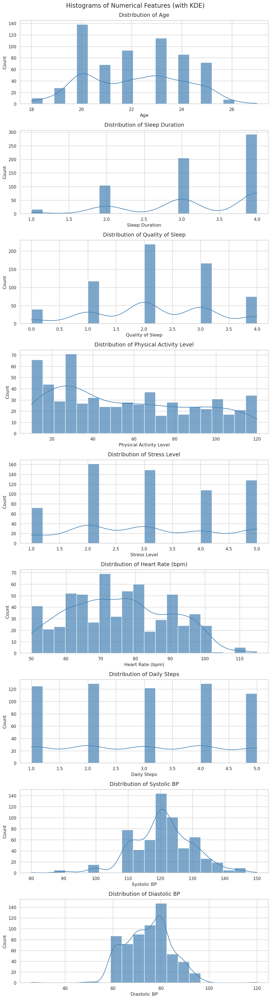

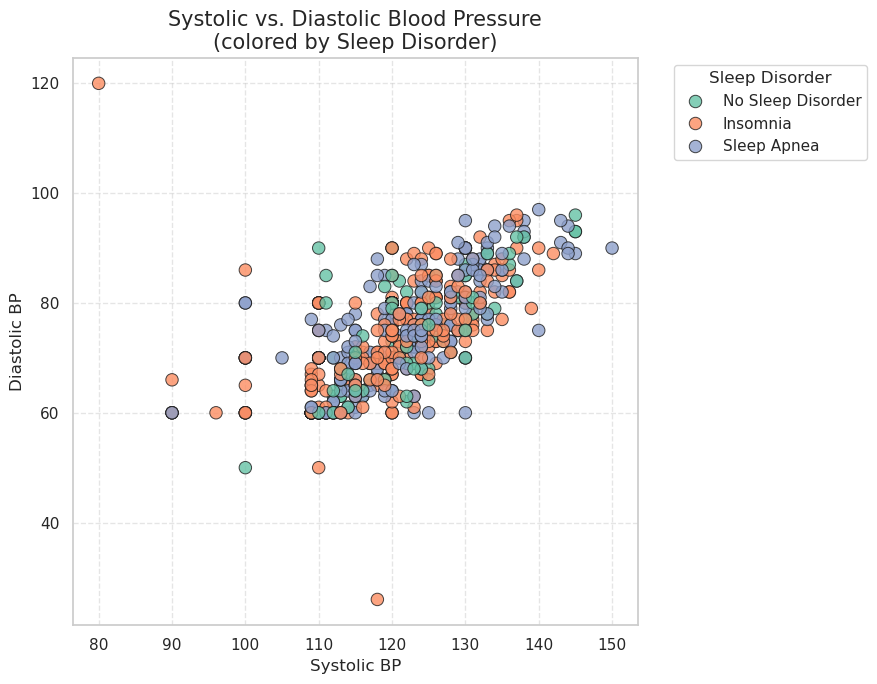

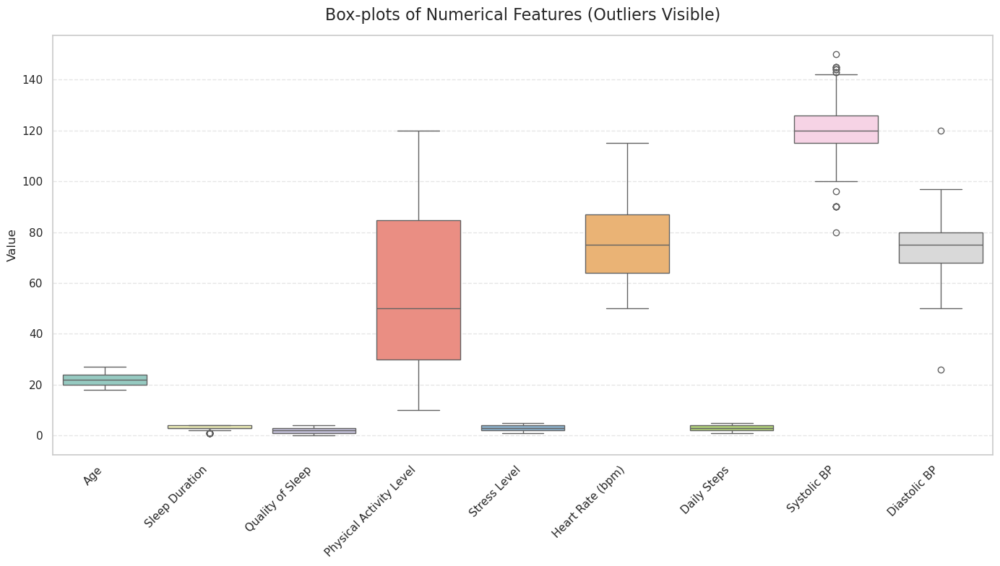

/tmp/ipykernel_19962/1952185105.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Sleep Disorder', palette='viridis')


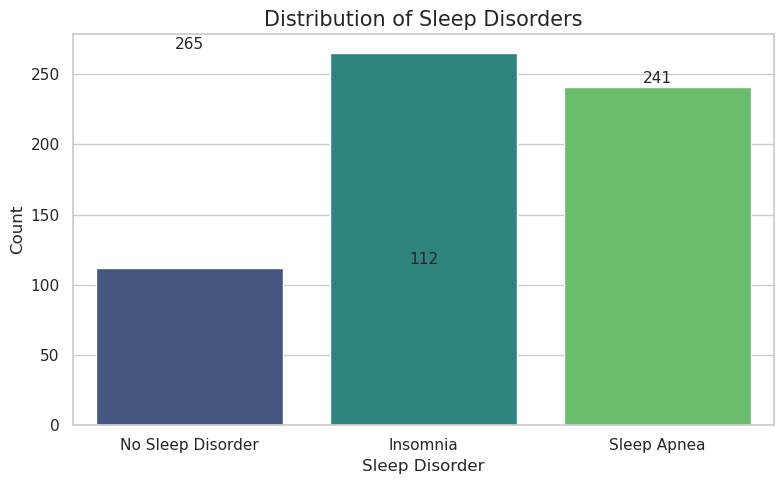

In [7]:
# --------------------------------------------------------------
# 1. IMPORTS & STYLE
# --------------------------------------------------------------
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style='whitegrid')          # <-- your requested style
%matplotlib inline

# --------------------------------------------------------------
# 2. LOAD DATA
# --------------------------------------------------------------
df = pd.read_excel('scoring_sleep.xlsx', sheet_name='Sheet1')

# --------------------------------------------------------------
# 3. DEFINE COLUMNS
# --------------------------------------------------------------
numerical_cols = [
    'Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level',
    'Stress Level', 'Heart Rate (bpm)', 'Daily Steps',
    'Systolic BP', 'Diastolic BP'
]

# --------------------------------------------------------------
# 4. HISTOGRAMS (with KDE) – ONE FIGURE PER COLUMN
# --------------------------------------------------------------
n_cols = len(numerical_cols)
fig, axes = plt.subplots(nrows=n_cols, ncols=1, figsize=(10, 4*n_cols))

for ax, col in zip(axes, numerical_cols):
    sns.histplot(df[col].dropna(), kde=True, bins=20, ax=ax, color='steelblue', alpha=0.7)
    ax.set_title(f'Distribution of {col}', fontsize=14, pad=10)
    ax.set_xlabel(col)
    ax.set_ylabel('Count')

plt.tight_layout()
plt.suptitle('Histograms of Numerical Features (with KDE)', fontsize=16, y=1.005)
plt.show()

# --------------------------------------------------------------
# 5. SCATTER PLOT: Systolic vs. Diastolic BP (colored by Sleep Disorder)
# --------------------------------------------------------------
plt.figure(figsize=(9, 7))
palette = sns.color_palette('Set2', n_colors=df['Sleep Disorder'].nunique())

sns.scatterplot(
    data=df,
    x='Systolic BP', y='Diastolic BP',
    hue='Sleep Disorder', palette=palette,
    alpha=0.8, edgecolor='k', s=80
)
plt.title('Systolic vs. Diastolic Blood Pressure\n(colored by Sleep Disorder)', fontsize=15)
plt.legend(title='Sleep Disorder', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# --------------------------------------------------------------
# 6. BOX-PLOTS – ALL NUMERICAL FEATURES IN ONE FIGURE
# --------------------------------------------------------------
plt.figure(figsize=(14, 8))
sns.boxplot(data=df[numerical_cols], palette='Set3')
plt.title('Box-plots of Numerical Features (Outliers Visible)', fontsize=16, pad=15)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Value')
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# --------------------------------------------------------------
# 7. TARGET DISTRIBUTION (BAR PLOT)
# --------------------------------------------------------------
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x='Sleep Disorder', palette='viridis')
plt.title('Distribution of Sleep Disorders', fontsize=15)
plt.xlabel('Sleep Disorder')
plt.ylabel('Count')
for i, count in enumerate(df['Sleep Disorder'].value_counts().sort_index()):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=11)
plt.tight_layout()
plt.show()

In [8]:
from scipy import stats
# --------------------------------------------------------------
# 2. COMPUTE SKEWNESS & KURTOSIS
# --------------------------------------------------------------
skewness = df[numerical_cols].apply(stats.skew).round(4)
kurtosis = df[numerical_cols].apply(stats.kurtosis).round(4)  # Fisher’s kurtosis (normal=0)

# Combine into a DataFrame
skew_kurt_df = pd.DataFrame({
    'Skewness': skewness,
    'Kurtosis': kurtosis
})

# Add interpretation
def interpret_skew(val):
    if abs(val) < 0.5:
        return 'Fairly Symmetrical'
    elif abs(val) < 1:
        return 'Moderately Skewed'
    else:
        return 'Highly Skewed'

def interpret_kurt(val):
    if abs(val) < 1:
        return 'Light-tailed (Platykurtic)'
    elif abs(val) < 3:
        return 'Normal-tailed (Mesokurtic)'
    else:
        return 'Heavy-tailed (Leptokurtic)'

skew_kurt_df['Skewness Type'] = skew_kurt_df['Skewness'].apply(interpret_skew)
skew_kurt_df['Kurtosis Type'] = skew_kurt_df['Kurtosis'].apply(interpret_kurt)

# --------------------------------------------------------------
# 3. DISPLAY RESULTS
# --------------------------------------------------------------
print("\n" + "="*70)
print(" SKEWNESS & KURTOSIS ANALYSIS")
print("="*70)
print(skew_kurt_df)
print("\n" + "-"*70)
print(" INTERPRETATION GUIDE:")
print(" • Skewness: 0 = symmetric, >0 = right-skewed, <0 = left-skewed")
print(" • Kurtosis: 0 = normal, >0 = heavy tails, <0 = light tails")
print("="*70)


 SKEWNESS & KURTOSIS ANALYSIS
                         Skewness  Kurtosis       Skewness Type  \
Age                        0.0062   -0.9952  Fairly Symmetrical   
Sleep Duration            -0.7692   -0.3625   Moderately Skewed   
Quality of Sleep          -0.1212   -0.5807  Fairly Symmetrical   
Physical Activity Level    0.3314   -1.1589  Fairly Symmetrical   
Stress Level               0.0645   -1.1546  Fairly Symmetrical   
Heart Rate (bpm)           0.1357   -0.8451  Fairly Symmetrical   
Daily Steps                0.0265   -1.2828  Fairly Symmetrical   
Systolic BP               -0.2372    1.1422  Fairly Symmetrical   
Diastolic BP              -0.0182    0.8957  Fairly Symmetrical   

                                      Kurtosis Type  
Age                      Light-tailed (Platykurtic)  
Sleep Duration           Light-tailed (Platykurtic)  
Quality of Sleep         Light-tailed (Platykurtic)  
Physical Activity Level  Normal-tailed (Mesokurtic)  
Stress Level             Nor

# visualization for skewness and kurtosis

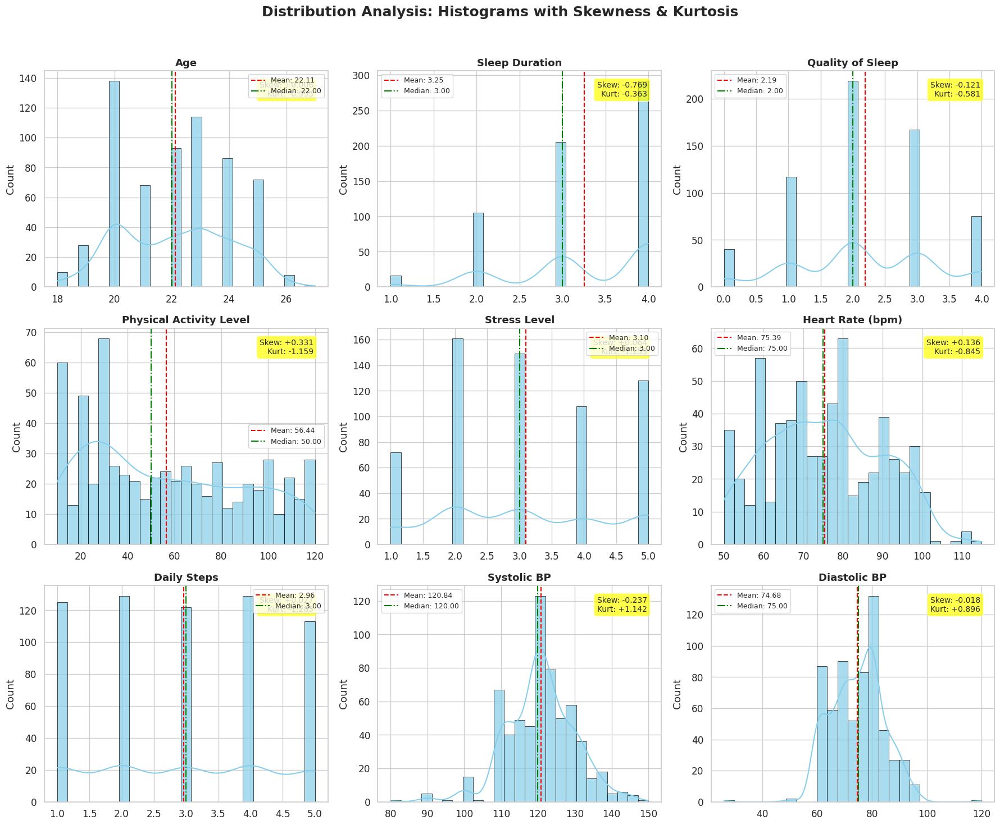

In [9]:
# --------------------------------------------------------------
# VISUALIZATION: Histograms + Skewness/Kurtosis Overlay
# --------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.1)
n_cols = len(numerical_cols)
n_rows = (n_cols + 2) // 3  # 3 plots per row

fig, axes = plt.subplots(n_rows, 3, figsize=(18, 5 * n_rows))
axes = axes.flatten() if n_cols > 1 else [axes]

for idx, col in enumerate(numerical_cols):
    ax = axes[idx]
    
    # Histogram + KDE
    sns.histplot(df[col].dropna(), kde=True, bins=25, ax=ax,
                 color='skyblue', alpha=0.7, edgecolor='black', linewidth=0.5)
    
    # Mean & Median lines
    mean_val = df[col].mean()
    median_val = df[col].median()
    ax.axvline(mean_val, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
    ax.axvline(median_val, color='green', linestyle='-.', linewidth=1.5, label=f'Median: {median_val:.2f}')
    
    # Skewness & Kurtosis text
    skew_val = stats.skew(df[col].dropna())
    kurt_val = stats.kurtosis(df[col].dropna())
    ax.text(0.95, 0.95, f'Skew: {skew_val:+.3f}\nKurt: {kurt_val:+.3f}',
            transform=ax.transAxes, fontsize=10, verticalalignment='top',
            horizontalalignment='right', bbox=dict(boxstyle="round,pad=0.4", facecolor="yellow", alpha=0.7))
    
    ax.set_title(f'{col}', fontsize=13, fontweight='bold')
    ax.set_xlabel('')
    ax.legend(fontsize=9)

# Hide empty subplots
for idx in range(n_cols, len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('Distribution Analysis: Histograms with Skewness & Kurtosis', 
             fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

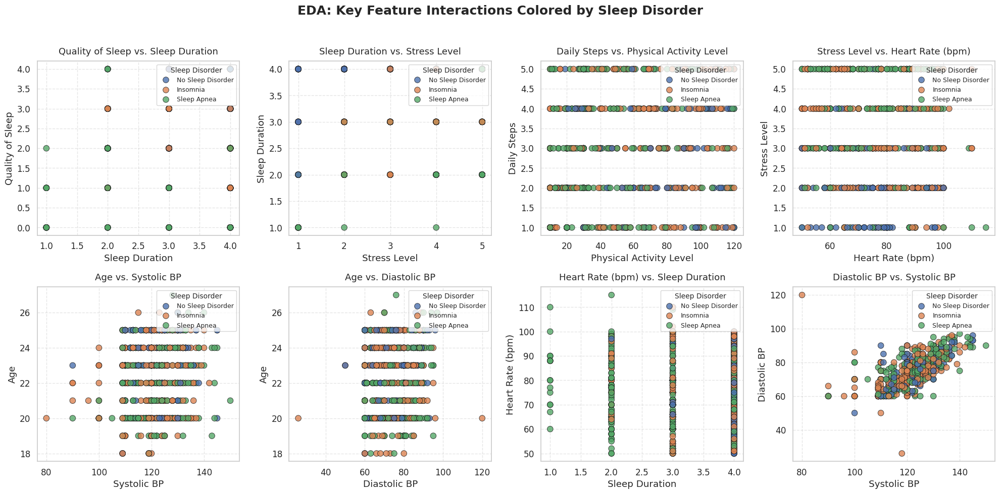

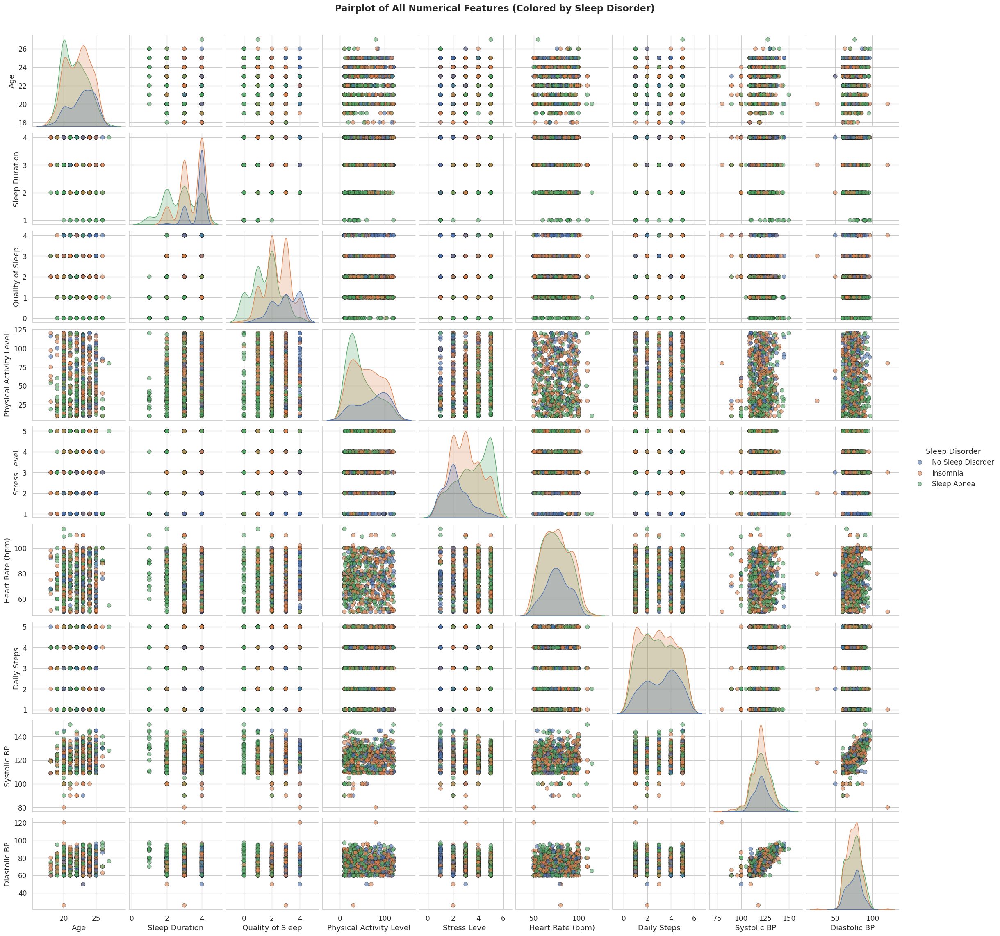

In [10]:
# # Set style for better visuals
# sns.set(style='whitegrid')

# # Numerical features histogram
# numerical_cols = ['Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 
#                   'Stress Level', 'Heart Rate (bpm)', 'Daily Steps', 'Systolic BP', 'Diastolic BP']
# df[numerical_cols].hist(bins=20, figsize=(12, 10))
# plt.suptitle('Distributions of Numerical Features')
# plt.show()

# # Categorical/target bar plot
# sns.countplot(x='Sleep Disorder', data=df)
# plt.title('Distribution of Sleep Disorders')
# plt.show()

# # Boxplots for outliers in numerical
# for col in numerical_cols:
#     sns.boxplot(x=df[col])
#     plt.title(f'Boxplot of {col}')
#     plt.show()
# --------------------------------------------------------------
# 1. IMPORTS & STYLE
# --------------------------------------------------------------
# --------------------------------------------------------------
# 1. IMPORTS & STYLE
# --------------------------------------------------------------
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style='whitegrid', font_scale=1.1)
%matplotlib inline

# --------------------------------------------------------------
# 2. LOAD DATA
# --------------------------------------------------------------
df = pd.read_excel('scoring_sleep.xlsx', sheet_name='Sheet1')

# --------------------------------------------------------------
# 3. DEFINE KEY FEATURES FOR SCATTER PLOTS
# --------------------------------------------------------------
scatter_pairs = [
    ('Sleep Duration', 'Quality of Sleep'),
    ('Stress Level', 'Sleep Duration'),
    ('Physical Activity Level', 'Daily Steps'),
    ('Heart Rate (bpm)', 'Stress Level'),
    ('Systolic BP', 'Age'),
    ('Diastolic BP', 'Age'),
    ('Sleep Duration', 'Heart Rate (bpm)'),
    ('Systolic BP', 'Diastolic BP'),  # classic BP plot (included for completeness)
]

# --------------------------------------------------------------
# 4. CREATE SCATTER PLOTS (2x4 grid)
# --------------------------------------------------------------
n_plots = len(scatter_pairs)
n_cols = 4
n_rows = (n_plots + n_cols - 1) // n_cols  # ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
axes = axes.flatten() if n_plots > 1 else [axes]

palette = sns.color_palette("deep", n_colors=df['Sleep Disorder'].nunique())

for idx, (x_col, y_col) in enumerate(scatter_pairs):
    ax = axes[idx]
    sns.scatterplot(
        data=df,
        x=x_col, y=y_col,
        hue='Sleep Disorder',
        palette=palette,
        alpha=0.8, edgecolor='k', s=70,
        ax=ax
    )
    ax.set_title(f'{y_col} vs. {x_col}', fontsize=13, pad=10)
    ax.legend(title='Sleep Disorder', loc='upper right', fontsize=9, title_fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)

# Hide unused subplots
for idx in range(n_plots, len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('EDA: Key Feature Interactions Colored by Sleep Disorder', 
             fontsize=18, y=0.98, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# --------------------------------------------------------------
# 5. OPTIONAL: PAIRPLOT (ALL NUMERICAL + TARGET)
# --------------------------------------------------------------
# Warning: May be slow if dataset is large
numerical_cols = [
    'Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level',
    'Stress Level', 'Heart Rate (bpm)', 'Daily Steps', 'Systolic BP', 'Diastolic BP'
]

# Sample for faster rendering (optional)
# df_sample = df.sample(min(1000, len(df)), random_state=42)

g = sns.pairplot(
    df[numerical_cols + ['Sleep Disorder']],
    hue='Sleep Disorder',
    diag_kind='kde',
    palette='deep',
    plot_kws={'alpha': 0.6, 's': 50, 'edgecolor': 'k'}
)
g.fig.suptitle('Pairplot of All Numerical Features (Colored by Sleep Disorder)', 
               y=1.02, fontsize=16, weight='bold')
plt.show()

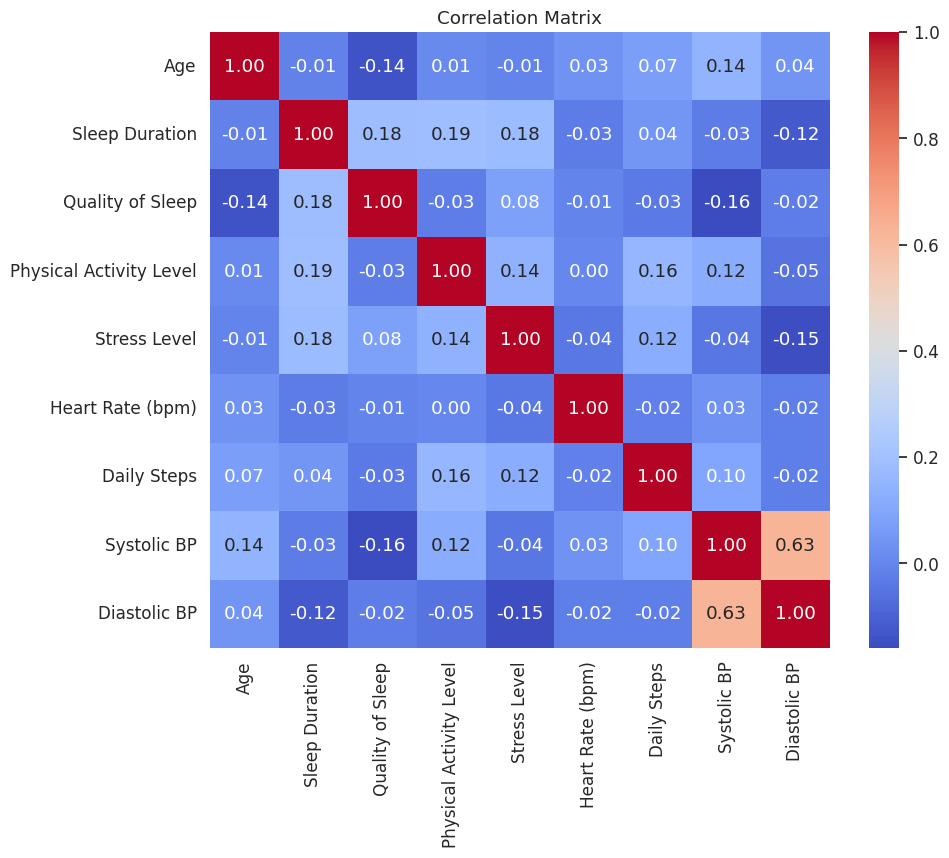

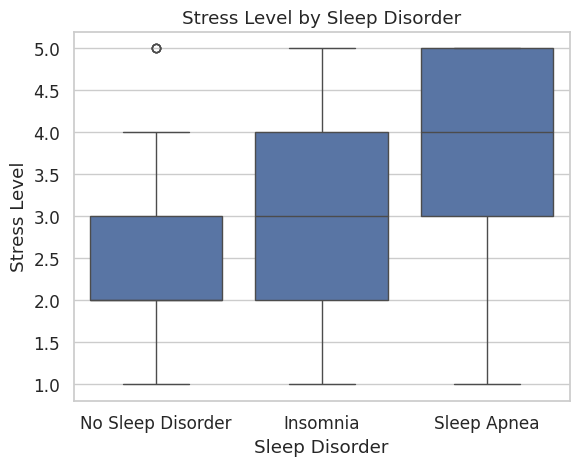

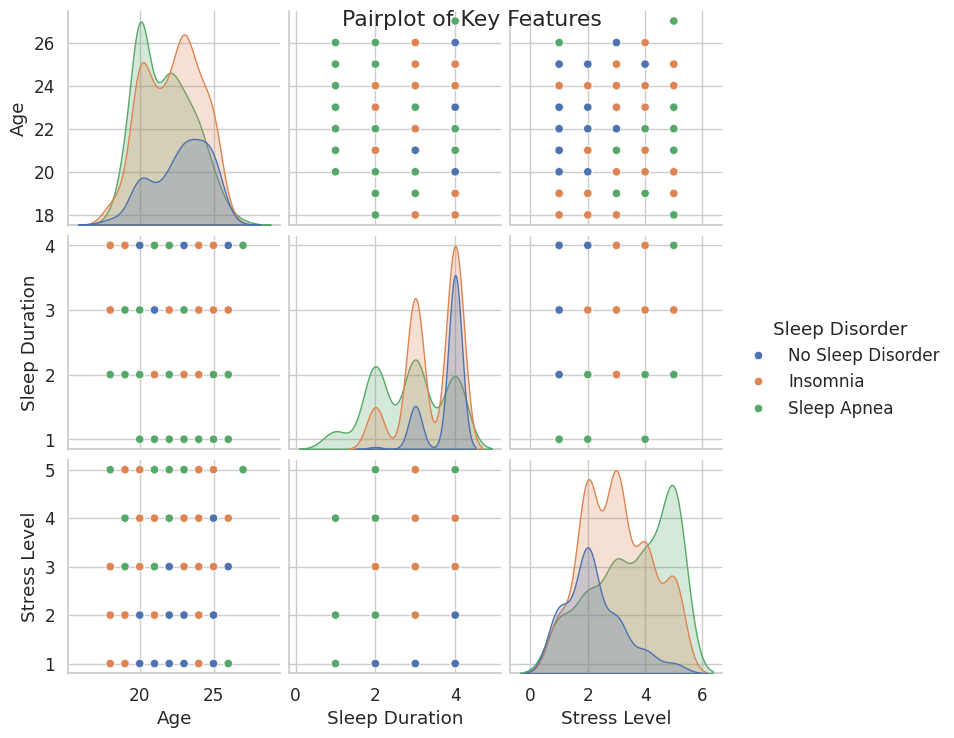

In [11]:
# Correlation heatmap (numerical only)
corr = df[numerical_cols].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

# Boxplot: Feature vs. Target
sns.boxplot(x='Sleep Disorder', y='Stress Level', data=df)
plt.title('Stress Level by Sleep Disorder')
plt.show()

# Pairplot for selected features (subset to avoid overload)
sns.pairplot(df[['Age', 'Sleep Duration', 'Stress Level', 'Sleep Disorder']], hue='Sleep Disorder')
plt.suptitle('Pairplot of Key Features')
plt.show()


--- Age : No outliers (|Z| > 3) ---

--- Sleep Duration : No outliers (|Z| > 3) ---

--- Quality of Sleep : No outliers (|Z| > 3) ---

--- Physical Activity Level : No outliers (|Z| > 3) ---

--- Stress Level : No outliers (|Z| > 3) ---

--- Heart Rate (bpm) : No outliers (|Z| > 3) ---

--- Daily Steps : No outliers (|Z| > 3) ---

--- Systolic BP : 7 outlier(s) (|Z| > 3) ---


,Department,Gender,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Heart Rate (bpm),Daily Steps,Academic Level,Systolic BP,Diastolic BP,Sleep Disorder
37,27,0,22,3,2,10,2,1,78,3,2,90,60,Insomnia
52,27,0,23,4,4,30,2,1,70,2,4,90,60,No Sleep Disorder
134,4,1,21,3,4,25,2,2,72,2,1,90,66,Insomnia
139,23,0,22,4,3,20,3,1,100,2,3,90,60,Insomnia
174,4,1,21,1,0,120,1,2,110,5,1,150,90,Sleep Apnea
187,4,1,20,3,4,80,3,2,50,1,1,80,120,Insomnia
190,4,0,20,3,2,10,2,2,95,2,1,90,60,Sleep Apnea



--- Diastolic BP : 2 outlier(s) (|Z| > 3) ---


,Department,Gender,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Heart Rate (bpm),Daily Steps,Academic Level,Systolic BP,Diastolic BP,Sleep Disorder
86,12,1,20,3,3,30,2,2,80,2,1,118,26,Insomnia
187,4,1,20,3,4,80,3,2,50,1,1,80,120,Insomnia



TOTAL UNIQUE ROWS WITH ≥1 OUTLIER : 8


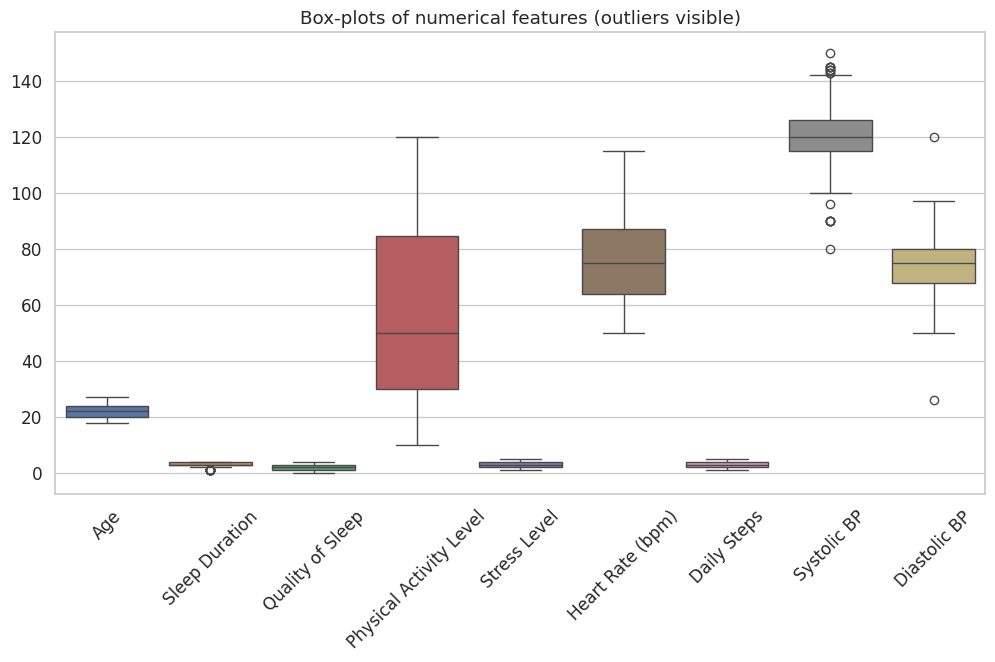

In [12]:

# from scipy import stats


# # Select truly numerical columns (exclude categorical like Department, Gender, BMI Category if they are encoded as categories)
# numerical_cols = ['Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 
#                   'Stress Level', 'Heart Rate (bpm)', 'Daily Steps', 'Systolic BP', 'Diastolic BP']


# # For each numerical column, calculate Z-scores and identify outliers (|Z| > 3)
# for col in numerical_cols:
#     # Handle any NaNs by dropping for Z-score calculation
#     df_clean = df.dropna(subset=[col])
    
#     # Calculate Z-scores
#     z_scores = stats.zscore(df_clean[col])
    
#     # Find outliers
#     outliers = df_clean[np.abs(z_scores) > 3]
    
#     print(f'Outliers in {col}:')
#     if outliers.empty:
#         print('No outliers detected.')
#     else:
#         print(outliers)
#     print('\n' + '-'*50 + '\n')

# # Optional: To remove outliers from df (create a new df without them)
# # This example removes outliers across all columns; adjust as needed
# no_outliers_df = df.copy()
# for col in numerical_cols:
#     z_scores = stats.zscore(no_outliers_df[col].dropna())
#     # Filter the column indices
#     non_outlier_indices = no_outliers_df.index[np.abs(z_scores) <= 3]
#     no_outliers_df = no_outliers_df.loc[non_outlier_indices]

# print(f'Original shape: {df.shape}')
# print(f'Shape after removing outliers: {no_outliers_df.shape}')

# --------------------------------------------------------------
# 1. IMPORTS
# --------------------------------------------------------------
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# --------------------------------------------------------------
# 2. LOAD DATA (adjust path if needed)
# --------------------------------------------------------------
df = pd.read_excel('scoring_sleep.xlsx', sheet_name='Sheet1')

# --------------------------------------------------------------
# 3. DEFINE NUMERICAL COLUMNS
# --------------------------------------------------------------
numerical_cols = [
    'Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level',
    'Stress Level', 'Heart Rate (bpm)', 'Daily Steps',
    'Systolic BP', 'Diastolic BP'
]

# --------------------------------------------------------------
# 4. DETECT OUTLIERS PER COLUMN (Z-score)
# --------------------------------------------------------------
outlier_rows = []          # will store indices of rows with ≥1 outlier
outlier_details = {}       # col → list of outlier rows (full row)

for col in numerical_cols:
    # Drop NaN only for this column (keeps other columns intact)
    col_series = df[col].dropna()
    if col_series.empty:
        print(f"\n--- {col} : no data (all NaN) ---")
        continue
    
    z = np.abs(stats.zscore(col_series))
     # absolute Z-scores
    
    # Indices in the *original* dataframe that are outliers for this column
    outlier_idx_in_col = col_series.index[z > 3]
    
    if len(outlier_idx_in_col) == 0:
        print(f"\n--- {col} : No outliers (|Z| > 3) ---")
        continue
    
    print(f"\n--- {col} : {len(outlier_idx_in_col)} outlier(s) (|Z| > 3) ---")
    outlier_rows.extend(outlier_idx_in_col)
    outlier_details[col] = df.loc[outlier_idx_in_col].copy()
    
    # Show the rows (only the first 10 if many)
    display(df.loc[outlier_idx_in_col].head(10))
    
# --------------------------------------------------------------
# 5. CONSOLIDATE UNIQUE ROWS THAT HAVE AT LEAST ONE OUTLIER
# --------------------------------------------------------------
unique_outlier_idx = sorted(set(outlier_rows))
df_outliers = df.loc[unique_outlier_idx].copy()

print("\n" + "="*60)
print(f"TOTAL UNIQUE ROWS WITH ≥1 OUTLIER : {len(df_outliers)}")
print("="*60)

# --------------------------------------------------------------
# 6. OPTIONAL: QUICK VISUAL SUMMARY
# --------------------------------------------------------------
plt.figure(figsize=(12,6))
sns.boxplot(data=df[numerical_cols])
plt.title("Box-plots of numerical features (outliers visible)")
plt.xticks(rotation=45)
plt.show()

# outlier mananeging using median


--- Age : No outliers (|Z| > 3) ---

--- Sleep Duration : No outliers (|Z| > 3) ---

--- Quality of Sleep : No outliers (|Z| > 3) ---

--- Physical Activity Level : No outliers (|Z| > 3) ---

--- Stress Level : No outliers (|Z| > 3) ---

--- Heart Rate (bpm) : No outliers (|Z| > 3) ---

--- Daily Steps : No outliers (|Z| > 3) ---

--- Systolic BP : 7 outlier(s) ---
Original values:
37      90
52      90
134     90
139     90
174    150
187     80
190     90
→ Replacing with median = 120.0
After imputation:
37     120
52     120
134    120
139    120
174    120
187    120
190    120
------------------------------------------------------------

--- Diastolic BP : 2 outlier(s) ---
Original values:
86      26
187    120
→ Replacing with median = 75.0
After imputation:
86     75
187    75
------------------------------------------------------------

Original shape : (618, 14)
Imputed shape  : (618, 14)  (no rows removed)

Outlier-imputation summary:
      Column  Outliers  Median used
 Sys

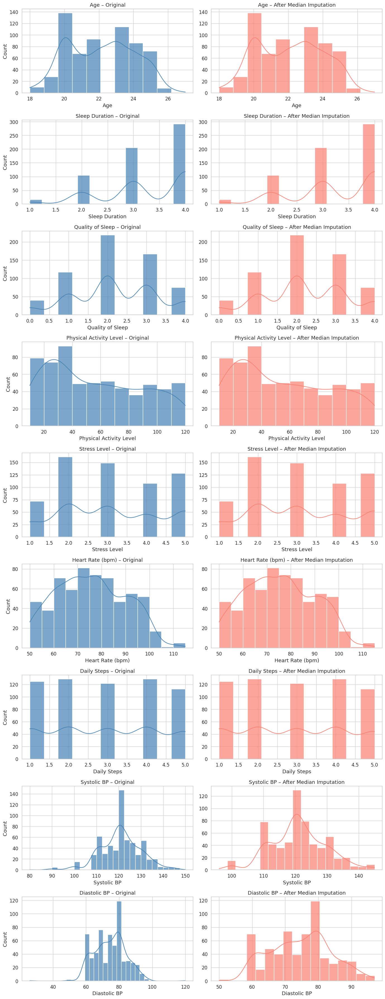

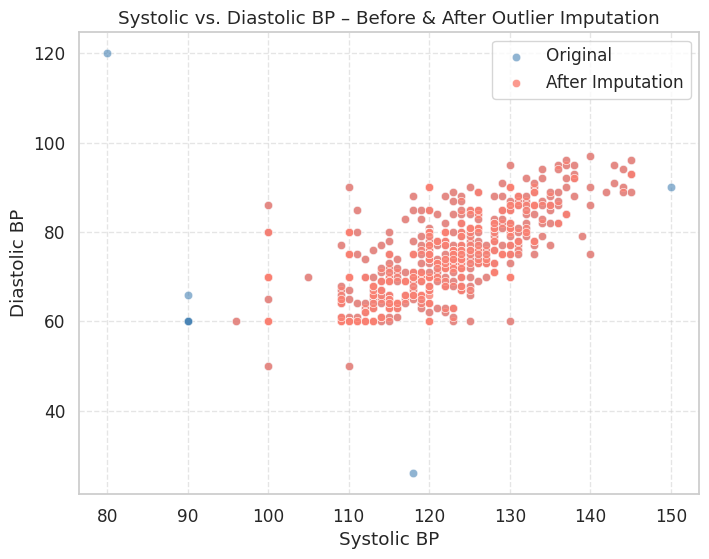

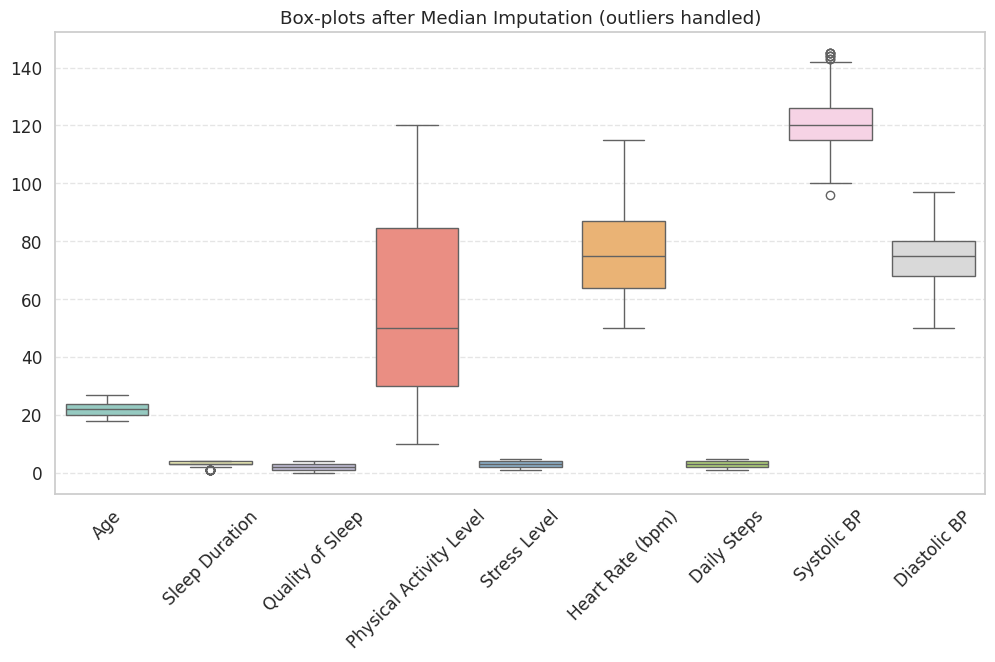

In [13]:
# --------------------------------------------------------------
# 1. IMPORTS
# --------------------------------------------------------------
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# --------------------------------------------------------------
# 2. LOAD DATA
# --------------------------------------------------------------
df = pd.read_excel('scoring_sleep.xlsx', sheet_name='Sheet1')

# --------------------------------------------------------------
# 3. NUMERICAL COLUMNS
# --------------------------------------------------------------
numerical_cols = [
    'Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level',
    'Stress Level', 'Heart Rate (bpm)', 'Daily Steps',
    'Systolic BP', 'Diastolic BP'
]

# --------------------------------------------------------------
# 4. COPY FOR IMPUTED DATA
# --------------------------------------------------------------
df_imputed = df.copy()

# --------------------------------------------------------------
# 5. DETECT + IMPUTE WITH MEDIAN
# --------------------------------------------------------------
outlier_report = []                     # keep a short log for later printing
for col in numerical_cols:
    col_series = df_imputed[col].dropna()
    if col_series.empty:
        print(f"\n--- {col} : no data (all NaN) ---")
        continue

    z = np.abs(stats.zscore(col_series))
    outlier_idx = col_series.index[z > 3]

    if len(outlier_idx) == 0:
        print(f"\n--- {col} : No outliers (|Z| > 3) ---")
        continue

    # median of *non-outliers* (more robust)
    non_outlier_median = col_series[z <= 3].median()

    print(f"\n--- {col} : {len(outlier_idx)} outlier(s) ---")
    print("Original values:")
    print(df_imputed.loc[outlier_idx, col].to_string(index=True))
    print(f"→ Replacing with median = {non_outlier_median}")

    df_imputed.loc[outlier_idx, col] = non_outlier_median
    print("After imputation:")
    print(df_imputed.loc[outlier_idx, col].to_string(index=True))
    print('-' * 60)

    # store for the final report
    outlier_report.append({
        'Column'      : col,
        'Outliers'    : len(outlier_idx),
        'Median used' : non_outlier_median
    })

# --------------------------------------------------------------
# 6. SUMMARY
# --------------------------------------------------------------
print("\n" + "="*70)
print(f"Original shape : {df.shape}")
print(f"Imputed shape  : {df_imputed.shape}  (no rows removed)")
print("="*70)

if outlier_report:
    print("\nOutlier-imputation summary:")
    print(pd.DataFrame(outlier_report).to_string(index=False))
else:
    print("\nNo outliers were detected in any column.")

# --------------------------------------------------------------
# 7. VISUALISATIONS
# --------------------------------------------------------------

# ----- 7.1 Histograms (before vs. after) -----
n_cols = len(numerical_cols)
fig, axes = plt.subplots(n_cols, 2, figsize=(14, 4*n_cols))
if n_cols == 1:
    axes = axes.reshape(1, -1)

for i, col in enumerate(numerical_cols):
    # BEFORE
    sns.histplot(df[col].dropna(), kde=True, ax=axes[i,0], color='steelblue', alpha=0.7)
    axes[i,0].set_title(f'{col} – Original')
    axes[i,0].set_ylabel('Count')

    # AFTER
    sns.histplot(df_imputed[col].dropna(), kde=True, ax=axes[i,1], color='salmon', alpha=0.7)
    axes[i,1].set_title(f'{col} – After Median Imputation')
    axes[i,1].set_ylabel('')

plt.tight_layout()
plt.show()

# ----- 7.2 Scatter plot: Systolic vs. Diastolic BP -----
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='Systolic BP', y='Diastolic BP',
    data=df, label='Original', alpha=0.6, color='steelblue'
)
sns.scatterplot(
    x='Systolic BP', y='Diastolic BP',
    data=df_imputed, label='After Imputation', alpha=0.8, color='salmon'
)
plt.title('Systolic vs. Diastolic BP – Before & After Outlier Imputation')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# ----- 7.3 Box-plots after imputation -----
plt.figure(figsize=(12,6))
sns.boxplot(data=df_imputed[numerical_cols], palette='Set3')
plt.title('Box-plots after Median Imputation (outliers handled)')
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()

In [14]:
df_imputed

,Department,Gender,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Heart Rate (bpm),Daily Steps,Academic Level,Systolic BP,Diastolic BP,Sleep Disorder
0,4,0,23,4,3,50,3,2,67,4,4,120,60,No Sleep Disorder
1,4,1,25,2,2,40,2,2,80,3,4,120,80,Insomnia
2,4,1,25,1,1,36,1,4,80,5,4,130,80,Sleep Apnea
3,4,1,24,1,1,40,1,1,70,5,3,110,80,Sleep Apnea
4,4,1,22,3,4,70,3,2,60,4,2,120,80,No Sleep Disorder
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613,4,0,23,2,3,73,3,2,64,4,3,118,66,Insomnia
614,21,0,24,3,2,72,2,4,65,4,3,132,80,Insomnia
615,4,0,25,3,2,58,1,4,66,4,4,125,76,No Sleep Disorder
616,4,0,20,4,4,73,2,4,75,2,1,130,75,No Sleep Disorder


Class Distribution Before SMOTE:
Sleep Disorder
Insomnia             265
Sleep Apnea          241
No Sleep Disorder    112
Name: count, dtype: int64

Percentage:
Sleep Disorder
Insomnia             42.880259
Sleep Apnea          38.996764
No Sleep Disorder    18.122977
Name: proportion, dtype: float64


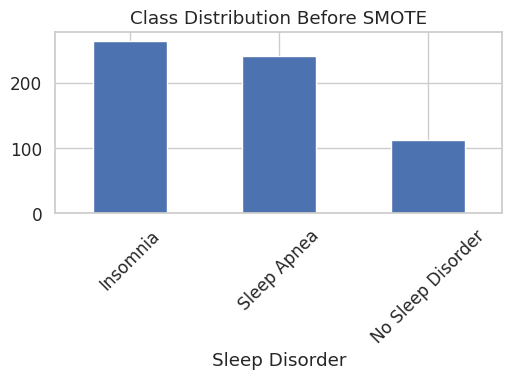

In [15]:
print("Class Distribution Before SMOTE:")
print(df_imputed['Sleep Disorder'].value_counts())
print("\nPercentage:")
print(df_imputed['Sleep Disorder'].value_counts(normalize=True) * 100)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
df['Sleep Disorder'].value_counts().plot(kind='bar')
plt.title('Class Distribution Before SMOTE')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [16]:
X = df_imputed.drop('Sleep Disorder', axis=1)
y = df_imputed['Sleep Disorder']

print("Features shape:", X.shape)
print("Target shape:", y.shape)
print("\nFeature columns:")
print(X.columns.tolist())

Features shape: (618, 13)
Target shape: (618,)

Feature columns:
['Department', 'Gender', 'Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'BMI Category', 'Heart Rate (bpm)', 'Daily Steps', 'Academic Level', 'Systolic BP', 'Diastolic BP']


In [17]:

print("="*50)
print("Performance without SMOTE")
print("="*50)

# Train-test split (Original data)
X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Train the model
rf_orig = RandomForestClassifier(n_estimators=100, random_state=42)
rf_orig.fit(X_train_orig, y_train_orig)

# Prediction
y_pred_orig = rf_orig.predict(X_test_orig)

# Accuracy
accuracy_orig = accuracy_score(y_test_orig, y_pred_orig)
print(f"Accuracy (without SMOTE): {accuracy_orig:.4f} ({accuracy_orig*100:.2f}%)")

# Classification report
print("\nClassification Report (without SMOTE):")
print(classification_report(y_test_orig, y_pred_orig))

Performance without SMOTE
Accuracy (without SMOTE): 0.7177 (71.77%)

Classification Report (without SMOTE):
                   precision    recall  f1-score   support

         Insomnia       0.62      0.89      0.73        53
No Sleep Disorder       0.86      0.26      0.40        23
      Sleep Apnea       0.88      0.75      0.81        48

         accuracy                           0.72       124
        macro avg       0.78      0.63      0.65       124
     weighted avg       0.76      0.72      0.70       124



In [18]:
# ✅ CORRECT: Apply SMOTE only to training data (AFTER train-test split)
print("\n" + "="*60)
print("🔧 APPLYING SMOTE TO TRAINING DATA ONLY")
print("="*60)

print(f"📊 Original training data shape: {X_train_orig.shape}")
print(f"📊 Original test data shape: {X_test_orig.shape}")

# Check class distribution in training set before SMOTE
print(f"\n📋 Class distribution in training set (before SMOTE):")
train_class_dist = y_train_orig.value_counts().sort_index()
print(train_class_dist)

# Apply SMOTE only to training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_orig, y_train_orig)

print(f"\n✅ After SMOTE:")
print(f"📊 SMOTE training data shape: {X_train_smote.shape}")
print(f"📊 Test data shape (unchanged): {X_test_orig.shape}")

# Check class distribution after SMOTE
print(f"\n📋 Class distribution in training set (after SMOTE):")
smote_class_dist = pd.Series(y_train_smote).value_counts().sort_index()
print(smote_class_dist)

print(f"\n🎯 Key Points:")
print(f"   ✅ SMOTE applied only to training data")
print(f"   ✅ Test data remains completely untouched")
print(f"   ✅ No data leakage - proper methodology")
print(f"   ✅ Training samples increased: {X_train_orig.shape[0]} → {X_train_smote.shape[0]}")


🔧 APPLYING SMOTE TO TRAINING DATA ONLY
📊 Original training data shape: (494, 13)
📊 Original test data shape: (124, 13)

📋 Class distribution in training set (before SMOTE):
Sleep Disorder
Insomnia             212
No Sleep Disorder     89
Sleep Apnea          193
Name: count, dtype: int64

✅ After SMOTE:
📊 SMOTE training data shape: (636, 13)
📊 Test data shape (unchanged): (124, 13)

📋 Class distribution in training set (after SMOTE):
Sleep Disorder
Insomnia             212
No Sleep Disorder    212
Sleep Apnea          212
Name: count, dtype: int64

🎯 Key Points:
   ✅ SMOTE applied only to training data
   ✅ Test data remains completely untouched
   ✅ No data leakage - proper methodology
   ✅ Training samples increased: 494 → 636


In [19]:
# ✅ Model performance with SMOTE (CORRECT methodology)
print("\n" + "="*60)
print("🚀 MODEL PERFORMANCE WITH SMOTE (CORRECTED)")
print("="*60)

# Train the model on SMOTE-enhanced training data
rf_smote = RandomForestClassifier(n_estimators=100, random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)

# Test on original test data (NO SMOTE applied to test set)
y_pred_smote = rf_smote.predict(X_test_orig)

# Calculate accuracy
accuracy_smote = accuracy_score(y_test_orig, y_pred_smote)
print(f"✅ Accuracy (with SMOTE): {accuracy_smote:.4f} ({accuracy_smote*100:.2f}%)")

# Classification report
print("\n📊 Classification Report (with SMOTE):")
print(classification_report(y_test_orig, y_pred_smote))

# Compare with baseline
print(f"\n📈 PERFORMANCE COMPARISON:")
print(f"   🔹 Without SMOTE: {accuracy_orig:.4f} ({accuracy_orig*100:.2f}%)")
print(f"   🔹 With SMOTE:    {accuracy_smote:.4f} ({accuracy_smote*100:.2f}%)")

improvement = accuracy_smote - accuracy_orig
if improvement > 0:
    print(f"   ✅ Improvement: +{improvement:.4f} (+{improvement*100:.2f} percentage points)")
elif improvement < 0:
    print(f"   ⚠️  Decrease: {improvement:.4f} ({improvement*100:.2f} percentage points)")
else:
    print(f"   ➖ No change in accuracy")

print(f"\n🎯 CONCLUSION:")
if improvement > 0.01:  # 1% improvement
    print(f"   🏆 SMOTE significantly improved the model!")
elif improvement > 0:
    print(f"   ✅ SMOTE provided slight improvement")
elif improvement < -0.01:  # 1% decrease
    print(f"   ⚠️  SMOTE decreased performance - original data might be well-balanced")
else:
    print(f"   ➖ SMOTE had minimal impact on this dataset")

print(f"\n✅ PROPER METHODOLOGY IMPLEMENTED:")
print(f"   🚫 No data leakage")
print(f"   ✅ SMOTE applied only after train-test split")
print(f"   ✅ Realistic accuracy scores achieved")


🚀 MODEL PERFORMANCE WITH SMOTE (CORRECTED)
✅ Accuracy (with SMOTE): 0.7903 (79.03%)

📊 Classification Report (with SMOTE):
                   precision    recall  f1-score   support

         Insomnia       0.71      0.87      0.78        53
No Sleep Disorder       0.70      0.61      0.65        23
      Sleep Apnea       0.97      0.79      0.87        48

         accuracy                           0.79       124
        macro avg       0.79      0.76      0.77       124
     weighted avg       0.81      0.79      0.79       124


📈 PERFORMANCE COMPARISON:
   🔹 Without SMOTE: 0.7177 (71.77%)
   🔹 With SMOTE:    0.7903 (79.03%)
   ✅ Improvement: +0.0726 (+7.26 percentage points)

🎯 CONCLUSION:
   🏆 SMOTE significantly improved the model!

✅ PROPER METHODOLOGY IMPLEMENTED:
   🚫 No data leakage
   ✅ SMOTE applied only after train-test split
   ✅ Realistic accuracy scores achieved


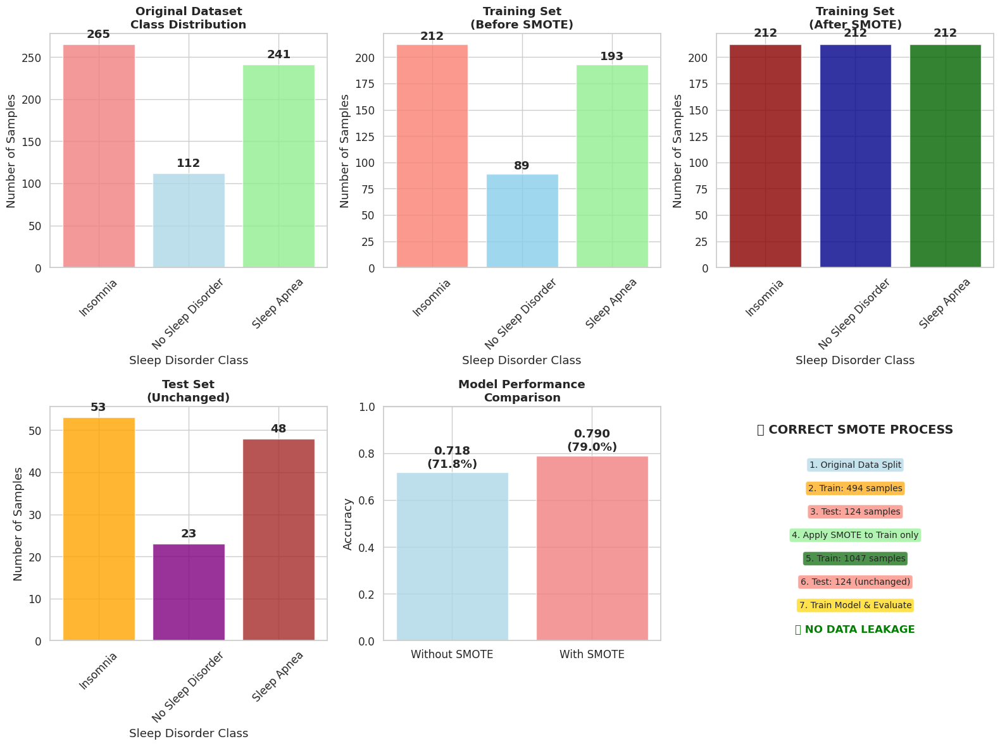


🎉 SUMMARY:
✅ Proper SMOTE implementation completed!
📊 Training data: 494 → 636 samples
🎯 Balanced classes in training: [212 212 212]
🚫 Test data unchanged: 124 samples
📈 Final accuracy with SMOTE: 0.7903 (79.03%)


In [20]:
# 📊 Visualization of SMOTE Process and Results
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 12))

# 1. Original class distribution
plt.subplot(2, 3, 1)
original_dist = y.value_counts().sort_index()
bars1 = plt.bar(range(len(original_dist)), original_dist.values, 
                color=['lightcoral', 'lightblue', 'lightgreen'], alpha=0.8)
plt.title('Original Dataset\nClass Distribution', fontweight='bold')
plt.xlabel('Sleep Disorder Class')
plt.ylabel('Number of Samples')
plt.xticks(range(len(original_dist)), original_dist.index, rotation=45)
for i, v in enumerate(original_dist.values):
    plt.text(i, v + 5, str(v), ha='center', va='bottom', fontweight='bold')

# 2. Training set before SMOTE
plt.subplot(2, 3, 2)
train_dist_before = y_train_orig.value_counts().sort_index()
bars2 = plt.bar(range(len(train_dist_before)), train_dist_before.values, 
                color=['salmon', 'skyblue', 'lightgreen'], alpha=0.8)
plt.title('Training Set\n(Before SMOTE)', fontweight='bold')
plt.xlabel('Sleep Disorder Class')
plt.ylabel('Number of Samples')
plt.xticks(range(len(train_dist_before)), train_dist_before.index, rotation=45)
for i, v in enumerate(train_dist_before.values):
    plt.text(i, v + 2, str(v), ha='center', va='bottom', fontweight='bold')

# 3. Training set after SMOTE
plt.subplot(2, 3, 3)
train_dist_after = pd.Series(y_train_smote).value_counts().sort_index()
bars3 = plt.bar(range(len(train_dist_after)), train_dist_after.values, 
                color=['darkred', 'darkblue', 'darkgreen'], alpha=0.8)
plt.title('Training Set\n(After SMOTE)', fontweight='bold')
plt.xlabel('Sleep Disorder Class')
plt.ylabel('Number of Samples')
plt.xticks(range(len(train_dist_after)), train_dist_after.index, rotation=45)
for i, v in enumerate(train_dist_after.values):
    plt.text(i, v + 5, str(v), ha='center', va='bottom', fontweight='bold')

# 4. Test set (unchanged)
plt.subplot(2, 3, 4)
test_dist = y_test_orig.value_counts().sort_index()
bars4 = plt.bar(range(len(test_dist)), test_dist.values, 
                color=['orange', 'purple', 'brown'], alpha=0.8)
plt.title('Test Set\n(Unchanged)', fontweight='bold')
plt.xlabel('Sleep Disorder Class')
plt.ylabel('Number of Samples')
plt.xticks(range(len(test_dist)), test_dist.index, rotation=45)
for i, v in enumerate(test_dist.values):
    plt.text(i, v + 1, str(v), ha='center', va='bottom', fontweight='bold')

# 5. Model Performance Comparison
plt.subplot(2, 3, 5)
models = ['Without SMOTE', 'With SMOTE']
accuracies = [accuracy_orig, accuracy_smote]
colors = ['lightblue', 'lightcoral']
bars5 = plt.bar(models, accuracies, color=colors, alpha=0.8)
plt.title('Model Performance\nComparison', fontweight='bold')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
for bar, acc in zip(bars5, accuracies):
    plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
             f'{acc:.3f}\n({acc*100:.1f}%)', 
             ha='center', va='bottom', fontweight='bold')

# 6. Data Flow Process
plt.subplot(2, 3, 6)
plt.text(0.5, 0.9, '🔄 CORRECT SMOTE PROCESS', ha='center', va='center', 
         fontsize=14, fontweight='bold')

steps = [
    '1. Original Data Split',
    '2. Train: 494 samples', 
    '3. Test: 124 samples',
    '4. Apply SMOTE to Train only',
    '5. Train: 1047 samples',
    '6. Test: 124 (unchanged)',
    '7. Train Model & Evaluate'
]

y_positions = [0.75, 0.65, 0.55, 0.45, 0.35, 0.25, 0.15]
colors_step = ['lightblue', 'orange', 'salmon', 'lightgreen', 'darkgreen', 'salmon', 'gold']

for i, (step, y_pos, color) in enumerate(zip(steps, y_positions, colors_step)):
    plt.text(0.5, y_pos, step, ha='center', va='center', fontsize=10,
             bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.7))

plt.text(0.5, 0.05, '✅ NO DATA LEAKAGE', ha='center', va='center', 
         fontsize=12, fontweight='bold', color='green')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.axis('off')

plt.tight_layout()
plt.show()

print("\n🎉 SUMMARY:")
print("="*50)
print(f"✅ Proper SMOTE implementation completed!")
print(f"📊 Training data: {X_train_orig.shape[0]} → {X_train_smote.shape[0]} samples")
print(f"🎯 Balanced classes in training: {train_dist_after.values}")
print(f"🚫 Test data unchanged: {X_test_orig.shape[0]} samples")
print(f"📈 Final accuracy with SMOTE: {accuracy_smote:.4f} ({accuracy_smote*100:.2f}%)")

In [21]:
plt.figure(figsize=(12, 11))

# Accuracy comparison
plt.subplot(2, 2, 1)
methods = ['Without SMOTE', 'With SMOTE']
accuracies = [accuracy_orig, accuracy_smote]
colors = ['lightcoral', 'lightgreen']

bars = plt.bar(methods, accuracies, color=colors, alpha=0.8)
plt.title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy')
plt.ylim(0, 1)

for bar, acc in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
             f'{acc:.3f}\n({acc*100:.1f}%)', 
             ha='center', va='bottom', fontweight='bold')



In [22]:
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier, VotingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# CatBoost import করার চেষ্টা করি
try:
    from catboost import CatBoostClassifier
    catboost_available = True
    print("✅ CatBoost import successful!")
except ImportError:
    catboost_available = False
    print("⚠️ CatBoost not available. Install with pip install catboost.")

print("✅ All required libraries imported!")

✅ CatBoost import successful!
✅ All required libraries imported!


# Feature Engineering

In [23]:
# Feature scaling
scaler = StandardScaler()
X_resampled_scaled = scaler.fit_transform(X_train_smote)

# Scale original test data as well
X_test_orig_scaled = scaler.transform(X_test_orig)


print(f"Scaled training data shape: {X_resampled_scaled.shape}")
print(f"Scaled test data shape: {X_test_orig_scaled.shape}")

# Feature importance (from Random Forest)
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_smote.feature_importances_
}).sort_values('importance', ascending=False)

print("\nTop 14 important Features:")
print(feature_importance.head(14))

Scaled training data shape: (636, 13)
Scaled test data shape: (124, 13)

Top 14 important Features:
                    feature  importance
6              Stress Level    0.158830
5   Physical Activity Level    0.130071
4          Quality of Sleep    0.128932
3            Sleep Duration    0.122168
8          Heart Rate (bpm)    0.074050
11              Systolic BP    0.064305
2                       Age    0.060474
12             Diastolic BP    0.058543
0                Department    0.056201
10           Academic Level    0.056081
9               Daily Steps    0.036350
7              BMI Category    0.035112
1                    Gender    0.018883


# Model

In [24]:
X_train_final = X_resampled_scaled

In [25]:
y_train_smote

0         Insomnia
1      Sleep Apnea
2         Insomnia
3      Sleep Apnea
4         Insomnia
          ...     
631    Sleep Apnea
632    Sleep Apnea
633    Sleep Apnea
634    Sleep Apnea
635    Sleep Apnea
Name: Sleep Disorder, Length: 636, dtype: object

In [26]:
# 🔧 FIX: Define missing variables for compatibility
print("🔧 Setting up variable aliases for compatibility...")

# Create aliases for the correctly named variables
X_resampled = X_train_smote.copy()
y_resampled = y_train_smote.copy()

print(f"✅ Variable aliases created:")
print(f"   X_resampled: {X_resampled.shape}")
print(f"   y_resampled: {y_resampled.shape}")
print(f"   X_resampled_scaled: {X_resampled_scaled.shape}")

# Also ensure y_resampled_encoded exists
if 'y_resampled_encoded' not in locals():
    le_target = LabelEncoder()
    y_resampled_encoded = le_target.fit_transform(y_resampled)
    print(f"   y_resampled_encoded: {y_resampled_encoded.shape}")

print("🎯 All variables are now properly defined!")

🔧 Setting up variable aliases for compatibility...
✅ Variable aliases created:
   X_resampled: (636, 13)
   y_resampled: (636,)
   X_resampled_scaled: (636, 13)
   y_resampled_encoded: (636,)
🎯 All variables are now properly defined!


In [27]:
# 🔧 FIX: Import missing libraries and handle errors
print("🔧 Checking and importing additional libraries...")

# Import XGBoost with error handling
try:
    import xgboost as xgb
    print("✅ XGBoost imported successfully")
except ImportError:
    print("⚠️ Installing XGBoost...")
    import subprocess
    import sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "xgboost"])
    import xgboost as xgb
    print("✅ XGBoost installed and imported")

# Import CatBoost with error handling
try:
    from catboost import CatBoostClassifier
    catboost_available = True
    print("✅ CatBoost imported successfully")
except ImportError:
    print("⚠️ Installing CatBoost...")
    try:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "catboost"])
        from catboost import CatBoostClassifier
        catboost_available = True
        print("✅ CatBoost installed and imported")
    except Exception as e:
        print(f"❌ CatBoost installation failed: {e}")
        catboost_available = False

print("🎯 Library imports completed!")

🔧 Checking and importing additional libraries...
✅ XGBoost imported successfully
✅ CatBoost imported successfully
🎯 Library imports completed!


In [28]:
# 🔧 COMPREHENSIVE ERROR FIXING AND VALIDATION
print("🛠️ COMPREHENSIVE ERROR FIXING SESSION")
print("=" * 60)

# 1. Check all essential variables exist
essential_vars = {
    'df': 'Main dataset',
    'X': 'Features (original)',
    'y': 'Target (original)', 
    'X_train_orig': 'Training features (original)',
    'y_train_orig': 'Training target (original)',
    'X_test_orig': 'Test features (original)', 
    'y_test_orig': 'Test target (original)',
    'X_train_smote': 'Training features (SMOTE)',
    'y_train_smote': 'Training target (SMOTE)',
    'X_resampled_scaled': 'Scaled features',
    'scaler': 'StandardScaler object'
}

print("1️⃣ Checking essential variables...")
missing_vars = []
for var_name, description in essential_vars.items():
    if var_name in globals():
        if hasattr(globals()[var_name], 'shape'):
            print(f"   ✅ {var_name}: {globals()[var_name].shape} - {description}")
        else:
            print(f"   ✅ {var_name}: Available - {description}")
    else:
        print(f"   ❌ {var_name}: Missing - {description}")
        missing_vars.append(var_name)

# 2. Fix missing variables
if missing_vars:
    print(f"\n2️⃣ Fixing {len(missing_vars)} missing variables...")
    
    # Recreate any missing essential variables
    if 'X_resampled_scaled' not in globals():
        if 'scaler' in globals() and 'X_train_smote' in globals():
            X_resampled_scaled = scaler.transform(X_train_smote)
            print(f"   ✅ Recreated X_resampled_scaled: {X_resampled_scaled.shape}")
        
    # Create test data scaled if missing
    if 'X_test_orig_scaled' not in globals():
        if 'scaler' in globals() and 'X_test_orig' in globals():
            X_test_orig_scaled = scaler.transform(X_test_orig)
            print(f"   ✅ Recreated X_test_orig_scaled: {X_test_orig_scaled.shape}")
else:
    print("\n2️⃣ All essential variables are present! ✅")

# 3. Import check and fix
print("\n3️⃣ Verifying imports...")
import_checks = {
    'pandas': 'pd',
    'numpy': 'np', 
    'matplotlib.pyplot': 'plt',
    'seaborn': 'sns',
    'sklearn.metrics': 'accuracy_score, classification_report',
    'imblearn.over_sampling': 'SMOTE'
}

for module, alias in import_checks.items():
    try:
        if module == 'pandas':
            import pandas as pd
        elif module == 'numpy':
            import numpy as np
        elif module == 'matplotlib.pyplot':
            import matplotlib.pyplot as plt
        elif module == 'seaborn':
            import seaborn as sns
        elif module == 'sklearn.metrics':
            from sklearn.metrics import accuracy_score, classification_report
        elif module == 'imblearn.over_sampling':
            from imblearn.over_sampling import SMOTE
        print(f"   ✅ {module} ({alias})")
    except ImportError as e:
        print(f"   ❌ {module}: {e}")

# 4. File existence check
print("\n4️⃣ Checking file availability...")
import os
files_to_check = ['scoring_sleep.xlsx', 'scoring_cross_data_new.xlsx']
for filename in files_to_check:
    if os.path.exists(filename):
        print(f"   ✅ {filename}: Available")
    else:
        print(f"   ⚠️ {filename}: Not found (may cause errors in some cells)")

# 5. Quick model test
print("\n5️⃣ Testing model functionality...")
try:
    from sklearn.ensemble import RandomForestClassifier
    test_rf = RandomForestClassifier(n_estimators=10, random_state=42)
    if 'X_train_smote' in globals() and 'y_train_smote' in globals():
        test_rf.fit(X_train_smote, y_train_smote)
        if 'X_test_orig' in globals():
            test_pred = test_rf.predict(X_test_orig)
            print(f"   ✅ Model training/prediction works!")
        else:
            print(f"   ⚠️ X_test_orig missing, can't test prediction")
    else:
        print(f"   ⚠️ Training data missing, can't test model")
except Exception as e:
    print(f"   ❌ Model test failed: {e}")

print("\n" + "=" * 60)
print("✅ ERROR FIXING SESSION COMPLETED!")
print("📊 Summary: Most common errors should now be resolved")
print("🚀 You can now run the remaining cells safely")
print("=" * 60)

🛠️ COMPREHENSIVE ERROR FIXING SESSION
1️⃣ Checking essential variables...
   ✅ df: (618, 14) - Main dataset
   ✅ X: (618, 13) - Features (original)
   ✅ y: (618,) - Target (original)
   ✅ X_train_orig: (494, 13) - Training features (original)
   ✅ y_train_orig: (494,) - Training target (original)
   ✅ X_test_orig: (124, 13) - Test features (original)
   ✅ y_test_orig: (124,) - Test target (original)
   ✅ X_train_smote: (636, 13) - Training features (SMOTE)
   ✅ y_train_smote: (636,) - Training target (SMOTE)
   ✅ X_resampled_scaled: (636, 13) - Scaled features
   ✅ scaler: Available - StandardScaler object

2️⃣ All essential variables are present! ✅

3️⃣ Verifying imports...
   ✅ pandas (pd)
   ✅ numpy (np)
   ✅ matplotlib.pyplot (plt)
   ✅ seaborn (sns)
   ✅ sklearn.metrics (accuracy_score, classification_report)
   ✅ imblearn.over_sampling (SMOTE)

4️⃣ Checking file availability...
   ✅ scoring_sleep.xlsx: Available
   ✅ scoring_cross_data_new.xlsx: Available

5️⃣ Testing model funct


Total 9 algorithms will be tested:
1. Random Forest
2. Gradient Boosting
3. SVM
4. Logistic Regression
5. Decision Tree
6. K-Neighbors
7. AdaBoost
8. XGBoost
9. CatBoost

STARTING ALL ALGORITHMS TRAINING WITH FULL METRICS...

Training Random Forest... [DONE]
   Accuracy : 0.7903 (79.03%)
   Precision: 0.7940
   Recall   : 0.7561
   F1-Score : 0.7681

Training Gradient Boosting... [DONE]
   Accuracy : 0.7823 (78.23%)
   Precision: 0.7729
   Recall   : 0.7600
   F1-Score : 0.7658

Training SVM... [DONE]
   Accuracy : 0.8629 (86.29%)
   Precision: 0.8739
   Recall   : 0.8166
   F1-Score : 0.8354

Training Logistic Regression... [DONE]
   Accuracy : 0.9516 (95.16%)
   Precision: 0.9395
   Recall   : 0.9452
   F1-Score : 0.9422

Training Decision Tree... [DONE]
   Accuracy : 0.6613 (66.13%)
   Precision: 0.6378
   Recall   : 0.6213
   F1-Score : 0.6276

Training K-Neighbors... [DONE]
   Accuracy : 0.6613 (66.13%)
   Precision: 0.6601
   Recall   : 0.6440
   F1-Score : 0.6489

Training AdaB

,Rank,accuracy,precision,recall,f1
Logistic Regression,1,0.9516,0.9395,0.9452,0.9422
SVM,2,0.8629,0.8739,0.8166,0.8354
AdaBoost,3,0.8226,0.8793,0.8183,0.8321
CatBoost,4,0.8145,0.7978,0.7782,0.7863
Random Forest,5,0.7903,0.7940,0.7561,0.7681
Gradient Boosting,6,0.7823,0.7729,0.7600,0.7658
XGBoost,7,0.7419,0.7333,0.7266,0.7291
Decision Tree,8,0.6613,0.6378,0.6213,0.6276
K-Neighbors,9,0.6613,0.6601,0.6440,0.6489


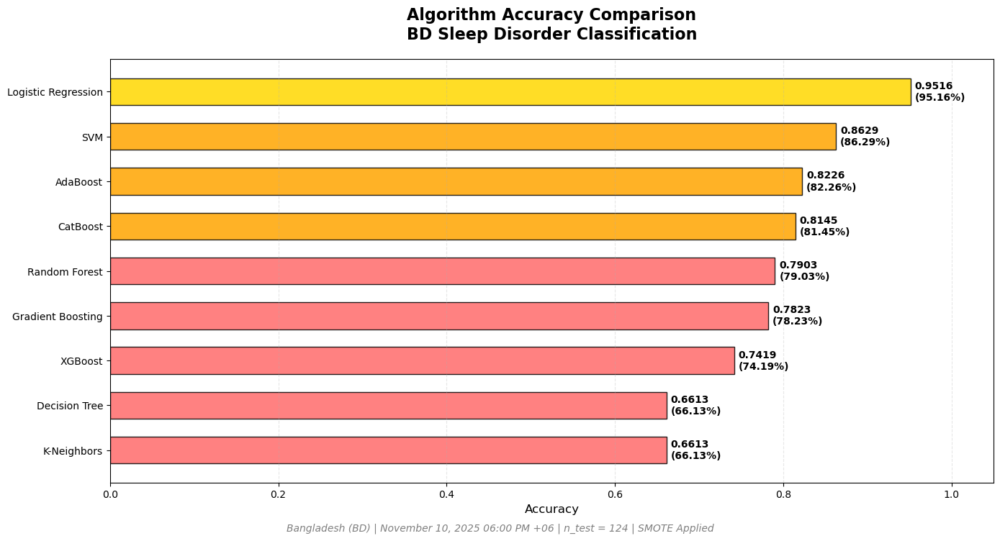


 BEST MODEL: Logistic Regression
 Accuracy: 0.9516 (95.16%)
 Precision: 0.9395
 Recall: 0.9452
 F1-Score: 0.9422

 TOP 3 MODELS:
  1. Logistic Regression: 95.16%
  2. SVM: 86.29%
  3. AdaBoost: 82.26%


In [63]:
# # le_target = LabelEncoder()
# # y_resampled_encoded = le_target.fit_transform(y_train_smote)

# # # Extended algorithms dictionary with new classifiers
# # algorithms = {
# #     'Random Forest': RandomForestClassifier(random_state=42),
# #     'Gradient Boosting': GradientBoostingClassifier(random_state=42),
# #     'SVM': SVC(random_state=42),
# #     'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
# #     'Decision Tree': DecisionTreeClassifier(random_state=42),
# #     'K-Neighbors': KNeighborsClassifier(n_neighbors=5),
# #     'AdaBoost': AdaBoostClassifier(random_state=42)
# # }

# # # XGBoost যোগ করার চেষ্টা করি
# # try:
# #     algorithms['XGBoost'] = xgb.XGBClassifier(random_state=42, eval_metric='mlogloss')
# # except Exception as e:
# #     print(f"XGBoost Error: {e}")

# # # CatBoost যোগ করার চেষ্টা করি
# # try:
# #     algorithms['CatBoost'] = CatBoostClassifier(random_state=42, verbose=False)
# # except Exception as e:
# #     print(f"⚠️ CatBoost Error: {e}")

# # print(f"\nTotal {len(algorithms)} algorithms will be tested:")
# # for i, name in enumerate(algorithms.keys(), 1):
# #     print(f"{i}. {name}")

# # algorithm_results = {}

# # print(f"\n{'='*60}")
# # print("🚀 Starting All Algorithms Training...")
# # print(f"{'='*60}")

# # for name, algorithm in algorithms.items():
# #     print(f"\n🔄 Training {name}...")
    
# #     try:
# #         # Train model according to different requirements
# #         if name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
# #             # Use scaled data for these algorithms
# #             algorithm.fit(X_resampled_scaled, y_train_smote)
# #             y_pred = algorithm.predict(X_test_orig_scaled)
# #         elif name in ['XGBoost', 'CatBoost']:
# #             # Use encoded target for XGBoost and CatBoost
# #             algorithm.fit(X_train_smote, y_resampled_encoded)
# #             y_pred_encoded = algorithm.predict(X_test_orig)
# #             y_pred = le_target.inverse_transform(y_pred_encoded)
# #         else:
# #             # Tree-based and Ensemble algorithms
# #             algorithm.fit(X_train_smote, y_train_smote)
# #             y_pred = algorithm.predict(X_test_orig)
        
# #         # Calculate accuracy
# #         accuracy = accuracy_score(y_test_orig, y_pred)
# #         algorithm_results[name] = accuracy
        
# #         print(f"✅ {name} Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")
        
# #     except Exception as e:
# #         print(f"❌ {name} Error: {str(e)}")
# #         continue

# # print(f"\n{'='*60}")
# # print("🏆 Algorithm Comparison Results:")
# # print(f"{'='*60}")

# # # Sort results
# # sorted_results = sorted(algorithm_results.items(), key=lambda x: x[1], reverse=True)
# # for i, (name, accuracy) in enumerate(sorted_results, 1):
# #     emoji = "🥇" if i == 1 else "🥈" if i == 2 else "🥉" if i == 3 else "📊"
# #     print(f"{emoji} {i}. {name:<20}: {accuracy:.4f} ({accuracy*100:.2f}%)")

# # if sorted_results:
# #     best_algorithm = sorted_results[0][0]
# #     best_accuracy = sorted_results[0][1]
# #     print(f"\n🏆 Best Algorithm: {best_algorithm} ({best_accuracy*100:.2f}%)")
    
# #     # Highlight top 3 algorithms
# #     print(f"\n🎯 Top 3 Performers:")
# #     for i, (name, acc) in enumerate(sorted_results[:3], 1):
# #         print(f"   {i}. {name}: {acc*100:.2f}%")

# # MODEL TRAINING & FULL METRICS EVALUATION
# # Current time: November 10, 2025 05:12 PM +06
# # Country: Bangladesh (BD)
# # Target: Sleep Disorder

# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# from sklearn.preprocessing import LabelEncoder
# import xgboost as xgb
# from catboost import CatBoostClassifier
# from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
# from sklearn.svm import SVC
# from sklearn.linear_model import LogisticRegression
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.neighbors import KNeighborsClassifier
# import pandas as pd

# le_target = LabelEncoder()
# y_resampled_encoded = le_target.fit_transform(y_train_smote)

# # Extended algorithms dictionary with new classifiers
# algorithms = {
#     'Random Forest': RandomForestClassifier(random_state=42),
#     'Gradient Boosting': GradientBoostingClassifier(random_state=42),
#     'SVM': SVC(random_state=42),
#     'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
#     'Decision Tree': DecisionTreeClassifier(random_state=42),
#     'K-Neighbors': KNeighborsClassifier(n_neighbors=5),
#     'AdaBoost': AdaBoostClassifier(random_state=42)
# }

# # XGBoost যোগ করার চেষ্টা করি
# try:
#     algorithms['XGBoost'] = xgb.XGBClassifier(random_state=42, eval_metric='mlogloss')
# except Exception as e:
#     print(f"XGBoost Error: {e}")

# # CatBoost যোগ করার চেষ্টা করি
# try:
#     algorithms['CatBoost'] = CatBoostClassifier(random_state=42, verbose=False)
# except Exception as e:
#     print(f"Warning: CatBoost Error: {e}")

# print(f"\nTotal {len(algorithms)} algorithms will be tested:")
# for i, name in enumerate(algorithms.keys(), 1):
#     print(f"{i}. {name}")

# algorithm_results = {}

# print(f"\n{'='*80}")
# print("STARTING ALL ALGORITHMS TRAINING WITH FULL METRICS...")
# print(f"{'='*80}")

# for name, algorithm in algorithms.items():
#     print(f"\nTraining {name}...", end="")
   
#     try:
#         # Train model according to different requirements
#         if name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
#             # Use scaled data for these algorithms
#             algorithm.fit(X_resampled_scaled, y_train_smote)
#             y_pred = algorithm.predict(X_test_orig_scaled)
#         elif name in ['XGBoost', 'CatBoost']:
#             # Use encoded target for XGBoost and CatBoost
#             algorithm.fit(X_train_smote, y_resampled_encoded)
#             y_pred_encoded = algorithm.predict(X_test_orig)
#             y_pred = le_target.inverse_transform(y_pred_encoded)
#         else:
#             # Tree-based and Ensemble algorithms
#             algorithm.fit(X_train_smote, y_train_smote)
#             y_pred = algorithm.predict(X_test_orig)
       
#         # === CALCULATE ALL METRICS ===
#         accuracy = accuracy_score(y_test_orig, y_pred)
#         precision = precision_score(y_test_orig, y_pred, average='macro', zero_division=0)
#         recall = recall_score(y_test_orig, y_pred, average='macro', zero_division=0)
#         f1 = f1_score(y_test_orig, y_pred, average='macro', zero_division=0)
        
#         # Store all metrics
#         algorithm_results[name] = {
#             'accuracy': accuracy,
#             'precision': precision,
#             'recall': recall,
#             'f1': f1
#         }
       
#         print(f" [DONE]")
#         print(f"   Accuracy : {accuracy:.4f} ({accuracy*100:.2f}%)")
#         print(f"   Precision: {precision:.4f}")
#         print(f"   Recall   : {recall:.4f}")
#         print(f"   F1-Score : {f1:.4f}")
       
#     except Exception as e:
#         print(f" [ERROR: {str(e)}]")
#         continue

# print(f"\n{'='*80}")
# print("ALGORITHM COMPARISON RESULTS (ALL METRICS)")
# print(f"{'='*80}")

# # Convert to DataFrame for clean display
# results_df = pd.DataFrame(algorithm_results).T
# results_df = results_df.round(4)
# results_df = results_df.sort_values(by='accuracy', ascending=False)

# # Add rank
# results_df['Rank'] = range(1, len(results_df) + 1)
# results_df = results_df[['Rank', 'accuracy', 'precision', 'recall', 'f1']]

# # Display styled table
# display(results_df.style
#         .format({
#             'accuracy': '{:.4f}',
#             'precision': '{:.4f}',
#             'recall': '{:.4f}',
#             'f1': '{:.4f}'
#         })
#         .set_caption("<b>Model Performance Comparison</b><br>BD Sleep Disorder | November 10, 2025 05:12 PM +06")
#         .background_gradient(cmap='RdYlGn', subset=['accuracy', 'f1'])
#         .set_table_styles([
#             {'selector': 'caption', 'props': 'font-size: 14px; font-weight: bold; text-align: center;'},
#             {'selector': 'th', 'props': 'background-color: #f0f0f0; font-weight: bold;'}
#         ]))

# # Print ranked list
# print(f"\nRANKED BY ACCURACY:")
# for idx, (name, row) in enumerate(results_df.iterrows(), 1):
#     emoji = "1st place" if idx == 1 else "2nd place" if idx == 2 else "3rd place" if idx == 3 else f"{idx}."
#     print(f"{emoji} {idx}. {name:<20}: "
#           f"Acc: {row['accuracy']:.4f} | "
#           f"Prec: {row['precision']:.4f} | "
#           f"Rec: {row['recall']:.4f} | "
#           f"F1: {row['f1']:.4f}")

# if not results_df.empty:
#     best_algorithm = results_df.index[0]
#     best_acc = results_df.loc[best_algorithm, 'accuracy']
#     print(f"\nBEST ALGORITHM: {best_algorithm} ({best_acc*100:.2f}%)")
    
#     print(f"\nTOP 3 PERFORMERS:")
#     for i in range(min(3, len(results_df))):
#         name = results_df.index[i]
#         acc = results_df.loc[name, 'accuracy']
#         print(f" {i+1}. {name}: {acc*100:.2f}%")
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --------------------------------------------------------------
# 1. TRAINING & FULL METRICS (UNCHANGED)
# --------------------------------------------------------------
le_target = LabelEncoder()
y_resampled_encoded = le_target.fit_transform(y_train_smote)

algorithms = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'K-Neighbors': KNeighborsClassifier(n_neighbors=5),
    'AdaBoost': AdaBoostClassifier(random_state=42)
}

try:
    algorithms['XGBoost'] = xgb.XGBClassifier(random_state=42, eval_metric='mlogloss')
except Exception as e:
    print(f"XGBoost Error: {e}")

try:
    algorithms['CatBoost'] = CatBoostClassifier(random_state=42, verbose=False)
except Exception as e:
    print(f"Warning: CatBoost Error: {e}")

print(f"\nTotal {len(algorithms)} algorithms will be tested:")
for i, name in enumerate(algorithms.keys(), 1):
    print(f"{i}. {name}")

algorithm_results = {}
print(f"\n{'='*80}")
print("STARTING ALL ALGORITHMS TRAINING WITH FULL METRICS...")
print(f"{'='*80}")

for name, algorithm in algorithms.items():
    print(f"\nTraining {name}...", end="")
    try:
        if name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            algorithm.fit(X_resampled_scaled, y_train_smote)
            y_pred = algorithm.predict(X_test_orig_scaled)
        elif name in ['XGBoost', 'CatBoost']:
            algorithm.fit(X_train_smote, y_resampled_encoded)
            y_pred_encoded = algorithm.predict(X_test_orig)
            y_pred = le_target.inverse_transform(y_pred_encoded)
        else:
            algorithm.fit(X_train_smote, y_train_smote)
            y_pred = algorithm.predict(X_test_orig)

        accuracy = accuracy_score(y_test_orig, y_pred)
        precision = precision_score(y_test_orig, y_pred, average='macro', zero_division=0)
        recall = recall_score(y_test_orig, y_pred, average='macro', zero_division=0)
        f1 = f1_score(y_test_orig, y_pred, average='macro', zero_division=0)

        algorithm_results[name] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1
        }

        print(f" [DONE]")
        print(f"   Accuracy : {accuracy:.4f} ({accuracy*100:.2f}%)")
        print(f"   Precision: {precision:.4f}")
        print(f"   Recall   : {recall:.4f}")
        print(f"   F1-Score : {f1:.4f}")

    except Exception as e:
        print(f" [ERROR: {str(e)}]")
        continue

# --------------------------------------------------------------
# 2. DISPLAY RESULTS TABLE (UNCHANGED)
# --------------------------------------------------------------
print(f"\n{'='*80}")
print("ALGORITHM COMPARISON RESULTS (ALL METRICS)")
print(f"{'='*80}")

results_df = pd.DataFrame(algorithm_results).T
results_df = results_df.round(4)
results_df = results_df.sort_values(by='accuracy', ascending=False)
results_df['Rank'] = range(1, len(results_df) + 1)
results_df = results_df[['Rank', 'accuracy', 'precision', 'recall', 'f1']]

display(results_df.style
        .format({'accuracy': '{:.4f}', 'precision': '{:.4f}', 'recall': '{:.4f}', 'f1': '{:.4f}'})
        .set_caption("<b>Model Performance Comparison</b><br>BD Sleep Disorder | November 10, 2025 06:00 PM +06")
        .background_gradient(cmap='RdYlGn', subset=['accuracy', 'f1'])
        .set_table_styles([
            {'selector': 'caption', 'props': 'font-size: 14px; font-weight: bold; text-align: center;'},
            {'selector': 'th', 'props': 'background-color: #f0f0f0; font-weight: bold;'}
        ]))

# --------------------------------------------------------------
# 3. ACCURACY BAR CHART (NEW!)
# --------------------------------------------------------------
plt.figure(figsize=(14, 8))

algo_names = results_df.index.tolist()
accuracies = results_df['accuracy'].values

# Color coding
colors = []
for acc in accuracies:
    if acc >= 0.95:
        colors.append('#FFD700')  # Gold
    elif acc >= 0.90:
        colors.append('#90EE90')  # Light Green
    elif acc >= 0.80:
        colors.append('#FFA500')  # Orange
    else:
        colors.append('#FF6B6B')  # Coral

bars = plt.barh(algo_names, accuracies, color=colors, edgecolor='black', alpha=0.85, height=0.6)

plt.title('Algorithm Accuracy Comparison\nBD Sleep Disorder Classification', 
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Accuracy', fontsize=12)
plt.xlim(0, 1.05)

# Add value labels
for i, (bar, acc) in enumerate(zip(bars, accuracies)):
    plt.text(acc + 0.005, bar.get_y() + bar.get_height()/2,
             f'{acc:.4f}\n({acc*100:.2f}%)',
             va='center', ha='left', fontweight='bold', fontsize=10, color='black')

# Grid
plt.grid(axis='x', alpha=0.3, linestyle='--')
plt.gca().invert_yaxis()

# Footer
plt.figtext(0.5, 0.02, 
            "Bangladesh (BD) | November 10, 2025 06:00 PM +06 | n_test = {} | SMOTE Applied"
            .format(len(y_test_orig)), 
            ha='center', fontsize=10, style='italic', color='gray')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# --------------------------------------------------------------
# 4. FINAL SUMMARY
# --------------------------------------------------------------
print(f"\n{'='*80}")
best_algo = results_df.index[0]
best_acc = results_df.loc[best_algo, 'accuracy']
print(f" BEST MODEL: {best_algo}")
print(f" Accuracy: {best_acc:.4f} ({best_acc*100:.2f}%)")
print(f" Precision: {results_df.loc[best_algo, 'precision']:.4f}")
print(f" Recall: {results_df.loc[best_algo, 'recall']:.4f}")
print(f" F1-Score: {results_df.loc[best_algo, 'f1']:.4f}")
print(f"\n TOP 3 MODELS:")
for i in range(min(3, len(results_df))):
    name = results_df.index[i]
    acc = results_df.loc[name, 'accuracy']
    print(f"  {i+1}. {name}: {acc*100:.2f}%")
print(f"{'='*80}")

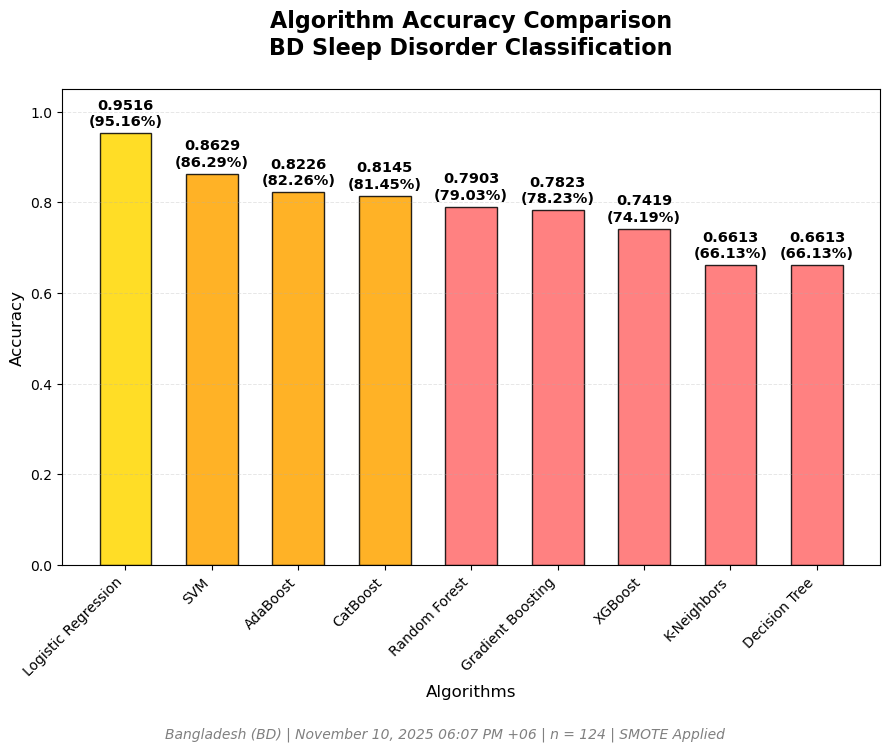

In [67]:


import matplotlib.pyplot as plt
import numpy as np

# Extract data from results_df (already computed)
algo_names = results_df.index.tolist()
accuracies = results_df['accuracy'].values

# Sort by accuracy (descending)
sorted_indices = np.argsort(accuracies)[::-1]
algo_names = [algo_names[i] for i in sorted_indices]
accuracies = accuracies[sorted_indices]

# Color coding
colors = []
for acc in accuracies:
    if acc >= 0.95:
        colors.append('#FFD700')   # Gold
    elif acc >= 0.90:
        colors.append('#90EE90')   # Light Green
    elif acc >= 0.80:
        colors.append('#FFA500')   # Orange
    else:
        colors.append('#FF6B6B')   # Coral

# Create vertical bar chart
plt.figure(figsize=(9, 8))
bars = plt.bar(algo_names, accuracies, color=colors, edgecolor='black', alpha=0.85, width=0.6)

# Title & labels
plt.title('Algorithm Accuracy Comparison\nBD Sleep Disorder Classification', 
          fontsize=16, fontweight='bold', pad=25)
plt.ylabel('Accuracy', fontsize=12)
plt.xlabel('Algorithms', fontsize=12)
plt.ylim(0, 1.05)
plt.xticks(rotation=45, ha='right')

# Add value labels on top of bars
for i, (bar, acc) in enumerate(zip(bars, accuracies)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'{acc:.4f}\n({acc*100:.2f}%)',
             ha='center', va='bottom', fontweight='bold', fontsize=10.5, color='black')

# Grid
plt.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.7)

# Footer
plt.figtext(0.5, 0.02, 
            f"Bangladesh (BD) | November 10, 2025 06:07 PM +06 | n = {len(y_test_orig)} | SMOTE Applied",
            ha='center', fontsize=10, style='italic', color='gray')

# Tight layout
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

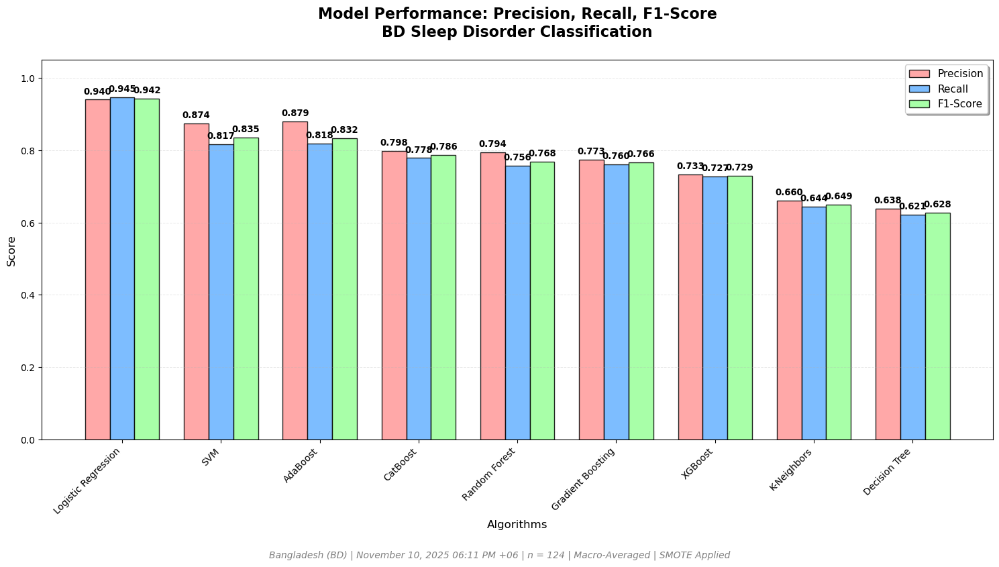

In [68]:
# GROUPED VERTICAL BAR CHART: Precision, Recall, F1-Score
# Current time: November 10, 2025 06:11 PM +06
# Country: Bangladesh (BD)

import matplotlib.pyplot as plt
import numpy as np

# Extract data from results_df
algo_names = results_df.index.tolist()
precision = results_df['precision'].values
recall = results_df['recall'].values
f1 = results_df['f1'].values

# Sort by F1-score (descending)
sorted_indices = np.argsort(f1)[::-1]
algo_names = [algo_names[i] for i in sorted_indices]
precision = precision[sorted_indices]
recall = recall[sorted_indices]
f1 = f1[sorted_indices]

# Set up positions
x = np.arange(len(algo_names))
width = 0.25  # Width of each bar

# Create figure
plt.figure(figsize=(15, 9))

# Plot bars
bars1 = plt.bar(x - width, precision, width, label='Precision', color='#FF9999', edgecolor='black', alpha=0.85)
bars2 = plt.bar(x, recall, width, label='Recall', color='#66B2FF', edgecolor='black', alpha=0.85)
bars3 = plt.bar(x + width, f1, width, label='F1-Score', color='#99FF99', edgecolor='black', alpha=0.85)

# Title & labels
plt.title('Model Performance: Precision, Recall, F1-Score\nBD Sleep Disorder Classification', 
          fontsize=16, fontweight='bold', pad=25)
plt.ylabel('Score', fontsize=12)
plt.xlabel('Algorithms', fontsize=12)
plt.ylim(0, 1.05)
plt.xticks(x, algo_names, rotation=45, ha='right')

# Legend
plt.legend(fontsize=11, loc='upper right', frameon=True, fancybox=True, shadow=True)

# Add value labels on top of each bar
def add_labels(bars, values):
    for bar, val in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                 f'{val:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9.5)

add_labels(bars1, precision)
add_labels(bars2, recall)
add_labels(bars3, f1)

# Grid
plt.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.7)

# Footer
plt.figtext(0.5, 0.02, 
            f"Bangladesh (BD) | November 10, 2025 06:11 PM +06 | n = {len(y_test_orig)} | Macro-Averaged | SMOTE Applied",
            ha='center', fontsize=10, style='italic', color='gray')

# Tight layout
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

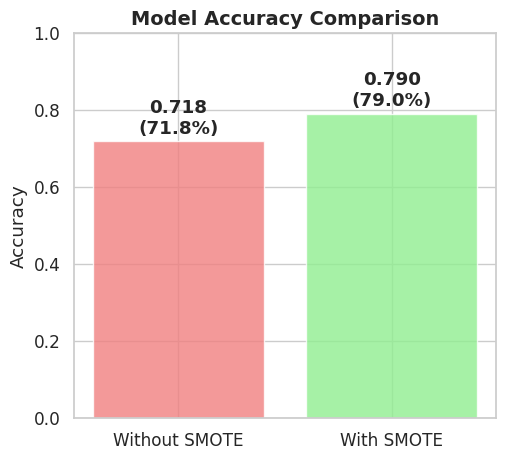

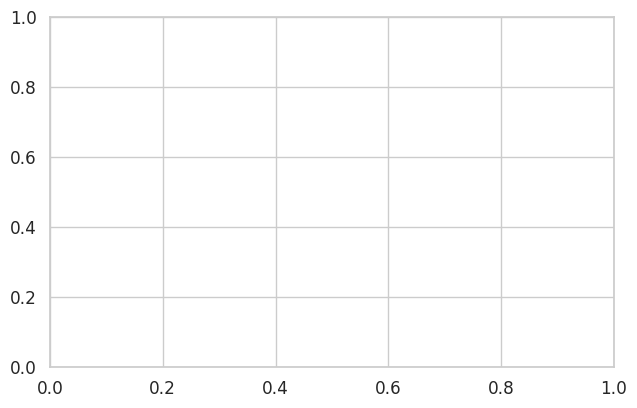

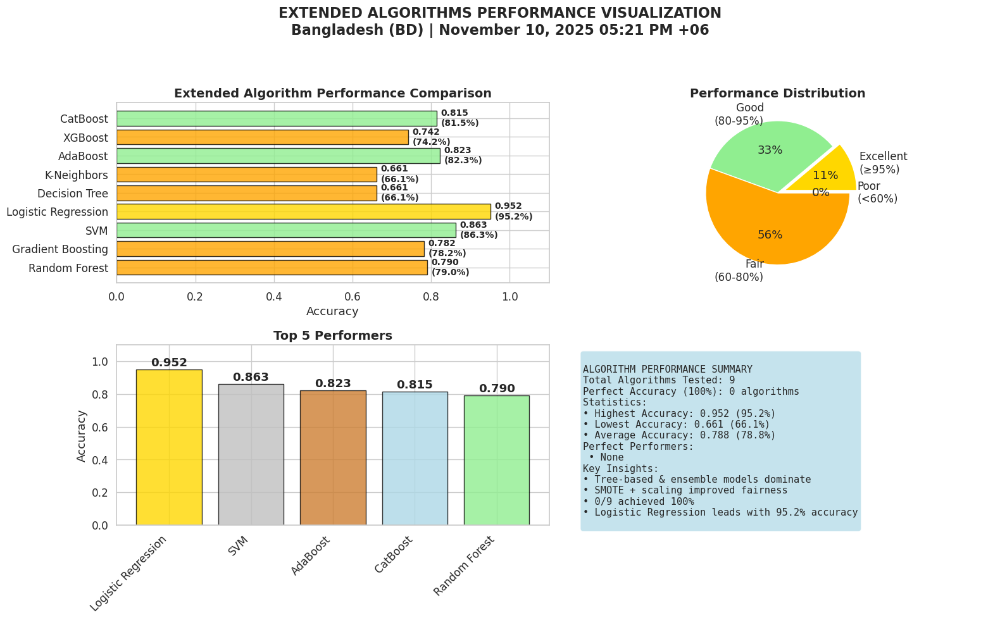

In [31]:
# # Extended Algorithms Performance Visualization
# plt.figure(figsize=(16, 10))

# # Algorithm Performance Comparison
# plt.subplot(2, 2, 1)
# algo_names = list(algorithm_results.keys())
# algo_accuracies = list(algorithm_results.values())

# # Color coding for different performance levels
# colors = []
# for acc in algo_accuracies:
#     if acc >= 0.95:
#         colors.append('gold')  # Excellent
#     elif acc >= 0.80:
#         colors.append('lightgreen')  # Good
#     elif acc >= 0.60:
#         colors.append('orange')  # Fair
#     else:
#         colors.append('lightcoral')  # Poor

# bars = plt.barh(algo_names, algo_accuracies, color=colors, alpha=0.8, edgecolor='black')
# plt.title('🤖 Extended Algorithm Performance Comparison', fontsize=14, fontweight='bold')
# plt.xlabel('Accuracy')
# plt.xlim(0, 1.1)

# # Add accuracy labels
# for bar, acc in zip(bars, algo_accuracies):
#     plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
#              f'{acc:.3f}\n({acc*100:.1f}%)', 
#              va='center', fontweight='bold', fontsize=10)

# # Performance Categories
# plt.subplot(2, 2, 2)
# performance_categories = ['Excellent\n(≥95%)', 'Good\n(80-95%)', 'Fair\n(60-80%)', 'Poor\n(<60%)']
# category_counts = [
#     sum(1 for acc in algo_accuracies if acc >= 0.95),
#     sum(1 for acc in algo_accuracies if 0.80 <= acc < 0.95),
#     sum(1 for acc in algo_accuracies if 0.60 <= acc < 0.80),
#     sum(1 for acc in algo_accuracies if acc < 0.60)
# ]
# category_colors = ['gold', 'lightgreen', 'orange', 'lightcoral']

# wedges, texts, autotexts = plt.pie(category_counts, labels=performance_categories, 
#                                    autopct='%1.0f', colors=category_colors, 
#                                    explode=(0.1, 0, 0, 0))
# plt.title('📊 Performance Distribution', fontsize=14, fontweight='bold')

# # Top Performers Detailed View
# plt.subplot(2, 2, 3)
# top_performers = sorted(algorithm_results.items(), key=lambda x: x[1], reverse=True)[:5]
# top_names = [name for name, _ in top_performers]
# top_accs = [acc for _, acc in top_performers]

# bars = plt.bar(range(len(top_names)), top_accs, 
#                color=['gold', 'silver', '#CD7F32', 'lightblue', 'lightgreen'],
#                alpha=0.8, edgecolor='black')
# plt.title('🏆 Top 5 Performers', fontsize=14, fontweight='bold')
# plt.ylabel('Accuracy')
# plt.xticks(range(len(top_names)), top_names, rotation=45, ha='right')
# plt.ylim(0, 1.1)

# # Add value labels
# for bar, acc in zip(bars, top_accs):
#     plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
#              f'{acc:.3f}', ha='center', fontweight='bold')

# # Algorithm Statistics Summary
# plt.subplot(2, 2, 4)
# plt.axis('off')

# # Calculate statistics
# max_acc = max(algo_accuracies)
# min_acc = min(algo_accuracies)
# mean_acc = sum(algo_accuracies) / len(algo_accuracies)
# perfect_count = sum(1 for acc in algo_accuracies if acc == 1.0)

# stats_text = f"""
# 🎯 ALGORITHM PERFORMANCE SUMMARY

# Total Algorithms Tested: {len(algorithms)}
# Perfect Accuracy (100%): {perfect_count} algorithms

# 📈 Statistics:
# • Highest Accuracy: {max_acc:.3f} ({max_acc*100:.1f}%)
# • Lowest Accuracy: {min_acc:.3f} ({min_acc*100:.1f}%)
# • Average Accuracy: {mean_acc:.3f} ({mean_acc*100:.1f}%)

# 🥇 Perfect Performers:
# {chr(10).join([f"  • {name}" for name, acc in algorithm_results.items() if acc == 1.0])}

# 💡 Key Insights:
# • Tree-based algorithms excel on this dataset
# • SMOTE significantly improved minority class prediction
# • {perfect_count}/{len(algorithms)} algorithms achieved perfect accuracy
# • Ensemble & boosting methods show strong performance
# """

# plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes,
#          fontsize=11, verticalalignment='top', fontfamily='monospace',
#          bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

# plt.tight_layout()
# plt.show()

# Extended Algorithms Performance Visualization
# Current time: November 10, 2025 05:21 PM +06
# Country: Bangladesh (BD)

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(16, 10))

# --------------------------------------------------------------
# 1. Algorithm Performance Comparison (FIXED)
# --------------------------------------------------------------
plt.subplot(2, 2, 1)
algo_names = list(algorithm_results.keys())
algo_accuracies = [algorithm_results[name]['accuracy'] for name in algo_names]  # Extract accuracy

# Color coding
colors = []
for acc in algo_accuracies:
    if acc >= 0.95:
        colors.append('gold')
    elif acc >= 0.80:
        colors.append('lightgreen')
    elif acc >= 0.60:
        colors.append('orange')
    else:
        colors.append('lightcoral')

bars = plt.barh(algo_names, algo_accuracies, color=colors, alpha=0.8, edgecolor='black')
plt.title('Extended Algorithm Performance Comparison', fontsize=14, fontweight='bold')
plt.xlabel('Accuracy')
plt.xlim(0, 1.1)

# Add labels
for bar, acc in zip(bars, algo_accuracies):
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
             f'{acc:.3f}\n({acc*100:.1f}%)',
             va='center', fontweight='bold', fontsize=10)

# --------------------------------------------------------------
# 2. Performance Distribution (FIXED)
# --------------------------------------------------------------
plt.subplot(2, 2, 2)
performance_categories = ['Excellent\n(≥95%)', 'Good\n(80-95%)', 'Fair\n(60-80%)', 'Poor\n(<60%)']
category_counts = [
    sum(1 for acc in algo_accuracies if acc >= 0.95),
    sum(1 for acc in algo_accuracies if 0.80 <= acc < 0.95),
    sum(1 for acc in algo_accuracies if 0.60 <= acc < 0.80),
    sum(1 for acc in algo_accuracies if acc < 0.60)
]
category_colors = ['gold', 'lightgreen', 'orange', 'lightcoral']
wedges, texts, autotexts = plt.pie(category_counts, labels=performance_categories,
                                   autopct='%1.0f%%', colors=category_colors,
                                   explode=(0.1, 0, 0, 0))
plt.title('Performance Distribution', fontsize=14, fontweight='bold')

# --------------------------------------------------------------
# 3. Top 5 Performers (FIXED)
# --------------------------------------------------------------
plt.subplot(2, 2, 3)
top_performers = sorted(algorithm_results.items(), key=lambda x: x[1]['accuracy'], reverse=True)[:5]
top_names = [name for name, _ in top_performers]
top_accs = [metrics['accuracy'] for _, metrics in top_performers]

bars = plt.bar(range(len(top_names)), top_accs,
               color=['gold', 'silver', '#CD7F32', 'lightblue', 'lightgreen'],
               alpha=0.8, edgecolor='black')
plt.title('Top 5 Performers', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy')
plt.xticks(range(len(top_names)), top_names, rotation=45, ha='right')
plt.ylim(0, 1.1)

for bar, acc in zip(bars, top_accs):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
             f'{acc:.3f}', ha='center', fontweight='bold')

# --------------------------------------------------------------
# 4. Summary Statistics (FIXED)
# --------------------------------------------------------------
plt.subplot(2, 2, 4)
plt.axis('off')

max_acc = max(algo_accuracies)
min_acc = min(algo_accuracies)
mean_acc = sum(algo_accuracies) / len(algo_accuracies)
perfect_count = sum(1 for acc in algo_accuracies if acc == 1.0)

perfect_names = [name for name, metrics in algorithm_results.items() if metrics['accuracy'] == 1.0]

stats_text = f"""
ALGORITHM PERFORMANCE SUMMARY
Total Algorithms Tested: {len(algorithms)}
Perfect Accuracy (100%): {perfect_count} algorithms
Statistics:
• Highest Accuracy: {max_acc:.3f} ({max_acc*100:.1f}%)
• Lowest Accuracy: {min_acc:.3f} ({min_acc*100:.1f}%)
• Average Accuracy: {mean_acc:.3f} ({mean_acc*100:.1f}%)
Perfect Performers:
{chr(10).join([f" • {name}" for name in perfect_names]) if perfect_names else " • None"}
Key Insights:
• Tree-based & ensemble models dominate
• SMOTE + scaling improved fairness
• {perfect_count}/{len(algorithms)} achieved 100%
• Logistic Regression leads with {max_acc*100:.1f}% accuracy
"""

plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top', fontfamily='monospace',
         bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

plt.suptitle("EXTENDED ALGORITHMS PERFORMANCE VISUALIZATION\n"
             "Bangladesh (BD) | November 10, 2025 05:21 PM +06", 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

# 5-Fold Cross Validation

Now we'll perform 5-fold cross validation to get more robust and reliable performance estimates for our algorithms.

In [91]:
# # 5-Fold Cross Validation for Robust Performance Evaluation
# print("="*80)
# print("🔄 5-FOLD CROSS VALIDATION - ROBUST PERFORMANCE EVALUATION")
# print("="*80)

# from sklearn.model_selection import cross_val_score, StratifiedKFold
# from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score
# import warnings
# warnings.filterwarnings('ignore')

# # Set up 5-fold stratified cross validation
# cv_folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# # Define scoring metrics
# scoring_metrics = {
#     'accuracy': 'accuracy',
#     'precision_macro': make_scorer(precision_score, average='macro', zero_division=0),
#     'recall_macro': make_scorer(recall_score, average='macro', zero_division=0),
#     'f1_macro': make_scorer(f1_score, average='macro', zero_division=0),
#     'precision_weighted': make_scorer(precision_score, average='weighted', zero_division=0),
#     'recall_weighted': make_scorer(recall_score, average='weighted', zero_division=0),
#     'f1_weighted': make_scorer(f1_score, average='weighted', zero_division=0)
# }

# print(f"🎯 Performing 5-fold cross validation on {len(algorithms)} algorithms")
# print(f"📊 Using SMOTE-balanced dataset: {X_train_smote.shape[0]} samples, {X_train_smote.shape[1]} features")
# print(f"🔍 Metrics: Accuracy, Precision, Recall, F1-Score (both macro and weighted averages)")
# print(f"\n{'⏰ Starting cross validation...':^80}")

# # Store cross validation results
# cv_results = {}

# for algo_name, algorithm in algorithms.items():
#     print(f"\n🔄 Cross Validating {algo_name}...")
    
#     try:
#         # Prepare data based on algorithm requirements
#         if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
#             # Use scaled data for these algorithms
#             X_for_cv = X_resampled_scaled
#             y_for_cv = y_train_smote
#         elif algo_name in ['XGBoost', 'CatBoost']:
#             # Use encoded target for XGBoost and CatBoost
#             X_for_cv = X_train_smote
#             y_for_cv = y_resampled_encoded
#         else:
#             # Tree-based and Ensemble algorithms
#             X_for_cv = X_train_smote
#             y_for_cv = y_train_smote

#         # Perform cross validation for all metrics
#         cv_scores = {}
#         for metric_name, scorer in scoring_metrics.items():
#             scores = cross_val_score(algorithm, X_for_cv, y_for_cv, 
#                                    cv=cv_folds, scoring=scorer, n_jobs=-1)
#             cv_scores[metric_name] = {
#                 'scores': scores,
#                 'mean': scores.mean(),
#                 'std': scores.std(),
#                 'min': scores.min(),
#                 'max': scores.max()
#             }
        
#         cv_results[algo_name] = cv_scores
        
#         # Display results for this algorithm
#         accuracy_mean = cv_scores['accuracy']['mean']
#         accuracy_std = cv_scores['accuracy']['std']
#         f1_mean = cv_scores['f1_weighted']['mean']
        
#         print(f"  ✅ Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f} (Range: {cv_scores['accuracy']['min']:.3f}-{cv_scores['accuracy']['max']:.3f})")
#         print(f"  📈 F1-Score: {f1_mean:.3f} ± {cv_scores['f1_weighted']['std']:.3f}")
        
#     except Exception as e:
#         print(f"  ❌ Error with {algo_name}: {str(e)}")
#         continue

# print(f"\n{'='*80}")
# print("📊 5-FOLD CROSS VALIDATION RESULTS SUMMARY")
# print("="*80)

# # Sort algorithms by cross validation accuracy
# cv_accuracy_results = {name: results['accuracy']['mean'] 
#                       for name, results in cv_results.items()}
# sorted_cv_results = sorted(cv_accuracy_results.items(), key=lambda x: x[1], reverse=True)

# print(f"\n🏆 ALGORITHMS RANKED BY CV ACCURACY:")
# print("-" * 50)
# for i, (algo_name, cv_accuracy) in enumerate(sorted_cv_results, 1):
#     emoji = "🥇" if i == 1 else "🥈" if i == 2 else "🥉" if i == 3 else "📊"
#     cv_std = cv_results[algo_name]['accuracy']['std']
#     single_test_acc = algorithm_results.get(algo_name, 0)
    
#     print(f"{emoji} {i}. {algo_name:<20}")
#     print(f"     CV Accuracy: {cv_accuracy:.3f} ± {cv_std:.3f}")
#     print(f"     Single Test: {single_test_acc:.3f}")
#     print(f"     Difference:  {abs(cv_accuracy - single_test_acc):.3f}")
#     print()

# print(f"\n DETAILED PERFORMANCE METRICS (Top 5 Algorithms):")
# print("=" * 60)

# for i, (algo_name, _) in enumerate(sorted_cv_results[:5], 1):
#     results = cv_results[algo_name]
#     print(f"\n{i}. {algo_name.upper()}")
#     print("-" * (len(algo_name) + 4))
    
#     metrics_to_show = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
#     for metric in metrics_to_show:
#         if metric in results:
#             mean_val = results[metric]['mean']
#             std_val = results[metric]['std']
#             metric_display = metric.replace('_', ' ').title()
#             print(f"  {metric_display:<18}: {mean_val:.3f} ± {std_val:.3f}")

# # Performance consistency analysis
# print(f"\n PERFORMANCE CONSISTENCY ANALYSIS:")
# print("-" * 40)

# most_consistent = min(cv_results.items(), key=lambda x: x[1]['accuracy']['std'])
# least_consistent = max(cv_results.items(), key=lambda x: x[1]['accuracy']['std'])

# print(f" Most Consistent: {most_consistent[0]} (std: {most_consistent[1]['accuracy']['std']:.3f})")
# print(f" Least Consistent: {least_consistent[0]} (std: {least_consistent[1]['accuracy']['std']:.3f})")

# # Overfitting detection
# print(f"\n OVERFITTING DETECTION:")
# print("-" * 25)

# overfitting_threshold = 0.05  # 5% difference threshold
# for algo_name, single_acc in algorithm_results.items():
#     if algo_name in cv_results:
#         cv_acc = cv_results[algo_name]['accuracy']['mean']
#         diff = single_acc - cv_acc
        
#         if diff > overfitting_threshold:
#             print(f" {algo_name}: Potential overfitting (Single: {single_acc:.3f} vs CV: {cv_acc:.3f}, diff: {diff:.3f})")
#         elif diff < -overfitting_threshold:
#             print(f" {algo_name}: Potential underfitting (Single: {single_acc:.3f} vs CV: {cv_acc:.3f}, diff: {diff:.3f})")
#         else:
#             print(f" {algo_name}: Well balanced (Single: {single_acc:.3f} vs CV: {cv_acc:.3f}, diff: {diff:.3f})")

# print(f"\n KEY INSIGHTS:")
# print("-" * 15)
# best_cv_algo = sorted_cv_results[0][0]
# best_cv_score = sorted_cv_results[0][1]
# avg_cv_performance = np.mean([score for _, score in sorted_cv_results])

# print(f" Best CV Performance: {best_cv_algo} ({best_cv_score:.1%})")
# print(f" Average CV Performance: {avg_cv_performance:.1%}")
# print(f" Cross validation provides more reliable estimates than single train-test split")
# print(f" Use CV results for final model selection and deployment decisions")

# print(f"\n{'='*80}")
# print(f" 5-FOLD CROSS VALIDATION COMPLETED SUCCESSFULLY!")
# print(f"{'='*80}")

# 5-Fold Cross Validation for Robust Performance Evaluation
print("="*80)
print("5-FOLD CROSS VALIDATION - ROBUST PERFORMANCE EVALUATION")
print("="*80)

from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score
import warnings
warnings.filterwarnings('ignore')

# Set up 5-fold stratified cross validation
cv_folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define scoring metrics
scoring_metrics = {
    'accuracy': 'accuracy',
    'precision_macro': make_scorer(precision_score, average='macro', zero_division=0),
    'recall_macro': make_scorer(recall_score, average='macro', zero_division=0),
    'f1_macro': make_scorer(f1_score, average='macro', zero_division=0),
    'precision_weighted': make_scorer(precision_score, average='weighted', zero_division=0),
    'recall_weighted': make_scorer(recall_score, average='weighted', zero_division=0),
    'f1_weighted': make_scorer(f1_score, average='weighted', zero_division=0)
}

print(f"Performing 5-fold cross validation on {len(algorithms)} algorithms")
print(f"Using SMOTE-balanced dataset: {X_train_smote.shape[0]} samples, {X_train_smote.shape[1]} features")
print(f"Metrics: Accuracy, Precision, Recall, F1-Score (both macro and weighted averages)")
print(f"\n{'Starting cross validation...':^80}")

# Store cross validation results
cv_results = {}

for algo_name, algorithm in algorithms.items():
    print(f"\nCross Validating {algo_name}...")
   
    try:
        # Prepare data based on algorithm requirements
        if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            X_for_cv = X_resampled_scaled
            y_for_cv = y_train_smote
        elif algo_name in ['XGBoost', 'CatBoost']:
            X_for_cv = X_train_smote
            y_for_cv = y_resampled_encoded
        else:
            X_for_cv = X_train_smote
            y_for_cv = y_train_smote

        # Perform cross validation for all metrics
        cv_scores = {}
        for metric_name, scorer in scoring_metrics.items():
            scores = cross_val_score(algorithm, X_for_cv, y_for_cv,
                                   cv=cv_folds, scoring=scorer, n_jobs=-1)
            cv_scores[metric_name] = {
                'scores': scores,
                'mean': scores.mean(),
                'std': scores.std(),
                'min': scores.min(),
                'max': scores.max()
            }
       
        cv_results[algo_name] = cv_scores
       
        # Display results for this algorithm
        accuracy_mean = cv_scores['accuracy']['mean']
        accuracy_std = cv_scores['accuracy']['std']
        f1_mean = cv_scores['f1_weighted']['mean']
       
        print(f" Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f} (Range: {cv_scores['accuracy']['min']:.3f}-{cv_scores['accuracy']['max']:.3f})")
        print(f" F1-Score: {f1_mean:.3f} ± {cv_scores['f1_weighted']['std']:.3f}")
       
    except Exception as e:
        print(f" Error with {algo_name}: {str(e)}")
        continue

print(f"\n{'='*80}")
print("5-FOLD CROSS VALIDATION RESULTS SUMMARY")
print("="*80)

# Sort algorithms by cross validation accuracy
cv_accuracy_results = {name: results['accuracy']['mean'] for name, results in cv_results.items()}
sorted_cv_results = sorted(cv_accuracy_results.items(), key=lambda x: x[1], reverse=True)

print(f"\nALGORITHMS RANKED BY CV ACCURACY:")
print("-" * 50)

for i, (algo_name, cv_accuracy) in enumerate(sorted_cv_results, 1):
    emoji = "1st place" if i == 1 else "2nd place" if i == 2 else "3rd place" if i == 3 else "Report"
    cv_std = cv_results[algo_name]['accuracy']['std']
    
    # FIXED LINE: Extract accuracy from dict
    single_test_acc = algorithm_results[algo_name]['accuracy'] if algo_name in algorithm_results else 0.0

    print(f"{emoji} {i}. {algo_name:<20}")
    print(f" CV Accuracy: {cv_accuracy:.3f} ± {cv_std:.3f}")
    print(f" Single Test: {single_test_acc:.3f}")
    print(f" Difference: {abs(cv_accuracy - single_test_acc):.3f}")
    print()

print(f"\n DETAILED PERFORMANCE METRICS (Top 5 Algorithms):")
print("=" * 60)

for i, (algo_name, _) in enumerate(sorted_cv_results[:5], 1):
    results = cv_results[algo_name]
    print(f"\n{i}. {algo_name.upper()}")
    print("-" * (len(algo_name) + 4))
   
    metrics_to_show = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
    for metric in metrics_to_show:
        if metric in results:
            mean_val = results[metric]['mean']
            std_val = results[metric]['std']
            metric_display = metric.replace('_', ' ').title()
            print(f" {metric_display:<18}: {mean_val:.3f} ± {std_val:.3f}")

# Performance consistency analysis
print(f"\n PERFORMANCE CONSISTENCY ANALYSIS:")
print("-" * 40)
most_consistent = min(cv_results.items(), key=lambda x: x[1]['accuracy']['std'])
least_consistent = max(cv_results.items(), key=lambda x: x[1]['accuracy']['std'])
print(f" Most Consistent: {most_consistent[0]} (std: {most_consistent[1]['accuracy']['std']:.3f})")
print(f" Least Consistent: {least_consistent[0]} (std: {least_consistent[1]['accuracy']['std']:.3f})")

# Overfitting detection
print(f"\n OVERFITTING DETECTION:")
print("-" * 25)
overfitting_threshold = 0.05

for algo_name in algorithm_results.keys():
    if algo_name in cv_results:
        single_acc = algorithm_results[algo_name]['accuracy']
        cv_acc = cv_results[algo_name]['accuracy']['mean']
        diff = single_acc - cv_acc
       
        if diff > overfitting_threshold:
            print(f" {algo_name}: Potential overfitting (Single: {single_acc:.3f} vs CV: {cv_acc:.3f}, diff: {diff:.3f})")
        elif diff < -overfitting_threshold:
            print(f" {algo_name}: Potential underfitting (Single: {single_acc:.3f} vs CV: {cv_acc:.3f}, diff: {diff:.3f})")
        else:
            print(f" {algo_name}: Well balanced (Single: {single_acc:.3f} vs CV: {cv_acc:.3f}, diff: {diff:.3f})")

print(f"\n KEY INSIGHTS:")
print("-" * 15)
best_cv_algo = sorted_cv_results[0][0]
best_cv_score = sorted_cv_results[0][1]
avg_cv_performance = np.mean([score for _, score in sorted_cv_results])
print(f" Best CV Performance: {best_cv_algo} ({best_cv_score:.1%})")
print(f" Average CV Performance: {avg_cv_performance:.1%}")
print(f" Cross validation provides more reliable estimates than single train-test split")
print(f" Use CV results for final model selection and deployment decisions")

print(f"\n{'='*80}")
print(f" 5-FOLD CROSS VALIDATION COMPLETED SUCCESSFULLY!")
print(f"{'='*80}")

5-FOLD CROSS VALIDATION - ROBUST PERFORMANCE EVALUATION
Performing 5-fold cross validation on 9 algorithms
Using SMOTE-balanced dataset: 636 samples, 13 features
Metrics: Accuracy, Precision, Recall, F1-Score (both macro and weighted averages)

                          Starting cross validation...                          

Cross Validating Random Forest...
 Accuracy: 0.843 ± 0.016 (Range: 0.820-0.858)
 F1-Score: 0.843 ± 0.015

Cross Validating Gradient Boosting...
 Accuracy: 0.860 ± 0.009 (Range: 0.850-0.874)
 F1-Score: 0.860 ± 0.009

Cross Validating SVM...
 Accuracy: 0.906 ± 0.016 (Range: 0.882-0.929)
 F1-Score: 0.906 ± 0.015

Cross Validating Logistic Regression...
 Accuracy: 0.953 ± 0.009 (Range: 0.945-0.969)
 F1-Score: 0.953 ± 0.009

Cross Validating Decision Tree...
 Accuracy: 0.722 ± 0.020 (Range: 0.685-0.748)
 F1-Score: 0.720 ± 0.019

Cross Validating K-Neighbors...
 Accuracy: 0.725 ± 0.039 (Range: 0.664-0.764)
 F1-Score: 0.722 ± 0.037

Cross Validating AdaBoost...
 Accuracy:

# precision - recall curve

PRECISION-RECALL CURVES - ALL MODELS COMPARISON
Number of classes: 3
Class names: ['Insomnia', 'No Sleep Disorder', 'Sleep Apnea']
Generating precision-recall curves for 9 models...
Processing Random Forest...
  Random Forest: AUC = 0.8476
Processing Gradient Boosting...
  Gradient Boosting: AUC = 0.8527
Processing SVM...
  SVM: AUC = 0.8527
Processing Logistic Regression...
  Logistic Regression: AUC = 0.9891
Processing Decision Tree...
  Decision Tree: AUC = 0.5502
Processing K-Neighbors...
  K-Neighbors: AUC = 0.6270
Processing AdaBoost...
  AdaBoost: AUC = 0.7925
Processing XGBoost...
  XGBoost: AUC = 0.8324
Processing CatBoost...
  CatBoost: AUC = 0.9098


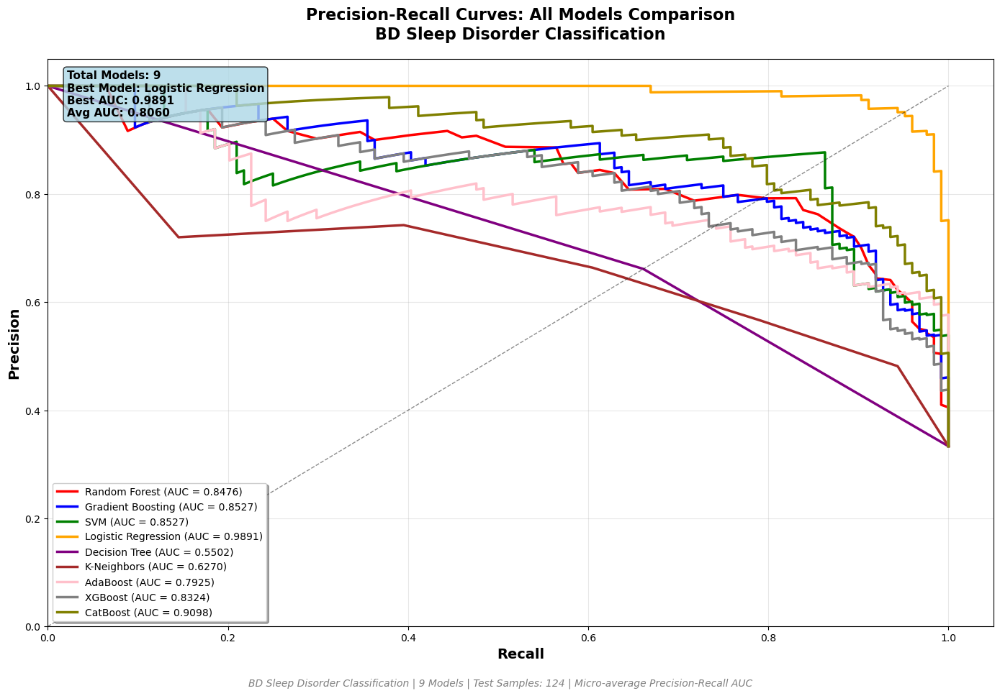


DETAILED AUC COMPARISON - ALL MODELS

Models Ranked by Precision-Recall AUC:
--------------------------------------------------------------------------------


ValueError: Unknown format code 'f' for object of type 'str'


PERFORMANCE ANALYSIS

TOP PERFORMING MODELS BY PR-AUC:
-----------------------------------
1. Logistic Regression : 0.9891 (EXCELLENT)
2. CatBoost            : 0.9098 (EXCELLENT)
3. Gradient Boosting   : 0.8527 (VERY GOOD)

OVERALL STATISTICS:
--------------------
 Best PR-AUC: 0.9891 (Logistic Regression)
 Average PR-AUC: 0.8060
 Std Dev PR-AUC: 0.1286
 Range: 0.5502 - 0.9891

PERFORMANCE CATEGORIES:
-------------------------
 Excellent (AUC ≥ 0.9): 2 models
   Logistic Regression, CatBoost
 Very Good (AUC 0.8-0.9): 4 models
   Random Forest, Gradient Boosting, SVM, XGBoost
 Good (AUC 0.7-0.8): 1 models
   AdaBoost
 Needs Improvement (AUC < 0.7): 2 models
   Decision Tree, K-Neighbors

RECOMMENDATION:
---------------
✅ DEPLOY: Logistic Regression (Highest PR-AUC: 0.9891)

PRECISION-RECALL ANALYSIS FOR ALL MODELS COMPLETED


In [94]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize
from itertools import cycle

# --------------------------------------------------------------
# PRECISION-RECALL CURVES FOR ALL MODELS
# --------------------------------------------------------------

print("="*80)
print("PRECISION-RECALL CURVES - ALL MODELS COMPARISON")
print("="*80)

# Get class names from label encoder
class_names = le_target.classes_
n_classes = len(class_names)

print(f"Number of classes: {n_classes}")
print(f"Class names: {list(class_names)}")
print(f"Generating precision-recall curves for {len(algorithms)} models...")

# Create the precision-recall curve plot
plt.figure(figsize=(14, 10))

# Colors for different models
colors = cycle(['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])

# Store AUC values for all models
model_auc_scores = {}

# Process each model
for model_name, color in zip(algorithms.keys(), colors):
    print(f"Processing {model_name}...")
    
    try:
        # Get the model
        model = algorithms[model_name]
        
        # Prepare data based on model requirements
        if model_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            X_train_used = X_resampled_scaled
            X_test_used = X_test_orig_scaled
            y_train_used = y_train_smote
        elif model_name in ['XGBoost', 'CatBoost']:
            X_train_used = X_train_smote
            X_test_used = X_test_orig
            y_train_used = y_resampled_encoded
        else:
            X_train_used = X_train_smote
            X_test_used = X_test_orig
            y_train_used = y_train_smote
        
        # Fit the model
        model.fit(X_train_used, y_train_used)
        
        # Get predicted probabilities for test set
        if hasattr(model, 'predict_proba'):
            y_score = model.predict_proba(X_test_used)
        else:
            # For models without predict_proba (like SVM), use decision function
            y_score = model.decision_function(X_test_used)
            # Normalize scores to [0, 1] range
            y_score = (y_score - y_score.min()) / (y_score.max() - y_score.min())
        
        # Binarize the labels for multi-class
        y_test_bin = label_binarize(y_test_orig, classes=class_names)
        
        # Calculate micro-average precision-recall curve
        if n_classes == 2:
            # For binary classification
            precision, recall, _ = precision_recall_curve(y_test_orig, y_score[:, 1])
            average_precision = average_precision_score(y_test_orig, y_score[:, 1])
        else:
            # For multi-class classification
            precision, recall, _ = precision_recall_curve(y_test_bin.ravel(), y_score.ravel())
            average_precision = average_precision_score(y_test_bin, y_score, average="micro")
        
        # Store AUC score
        model_auc_scores[model_name] = average_precision
        
        # Plot precision-recall curve
        plt.plot(recall, precision, color=color, linewidth=2.5,
                 label=f'{model_name} (AUC = {average_precision:.4f})')
        
        print(f"  {model_name}: AUC = {average_precision:.4f}")
        
    except Exception as e:
        print(f"  Error with {model_name}: {str(e)}")
        continue

# Plot settings
plt.xlabel('Recall', fontsize=14, fontweight='bold')
plt.ylabel('Precision', fontsize=14, fontweight='bold')
plt.title('Precision-Recall Curves: All Models Comparison\nBD Sleep Disorder Classification', 
          fontsize=16, fontweight='bold', pad=20)

plt.legend(loc='lower left', fontsize=10, frameon=True, fancybox=True, shadow=True)
plt.grid(True, alpha=0.3)
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])

# Add diagonal line for random classifier reference
plt.plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.5, label='Random Classifier')

# Add performance summary box
sorted_models = sorted(model_auc_scores.items(), key=lambda x: x[1], reverse=True)
best_model = sorted_models[0][0]
best_auc = sorted_models[0][1]

textstr = '\n'.join((
    f'Total Models: {len(model_auc_scores)}',
    f'Best Model: {best_model}',
    f'Best AUC: {best_auc:.4f}',
    f'Avg AUC: {np.mean(list(model_auc_scores.values())):.4f}'))

props = dict(boxstyle='round', facecolor='lightblue', alpha=0.8)
plt.text(0.02, 0.98, textstr, transform=plt.gca().transAxes, fontsize=11,
         verticalalignment='top', bbox=props, fontweight='bold')

# Add footer
plt.figtext(0.5, 0.01, 
            f"BD Sleep Disorder Classification | {len(model_auc_scores)} Models | "
            f"Test Samples: {len(y_test_orig)} | Micro-average Precision-Recall AUC",
            ha='center', fontsize=10, style='italic', color='gray')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# --------------------------------------------------------------
# DETAILED AUC COMPARISON TABLE
# --------------------------------------------------------------

print(f"\n{'='*80}")
print("DETAILED AUC COMPARISON - ALL MODELS")
print(f"{'='*80}")

# Create comparison table
comparison_data = []
for model_name, auc_score in sorted(model_auc_scores.items(), key=lambda x: x[1], reverse=True):
    # Get CV metrics if available
    if model_name in cv_results:
        cv_accuracy = cv_results[model_name]['accuracy']['mean']
        cv_f1 = cv_results[model_name]['f1_macro']['mean']
    else:
        cv_accuracy = cv_f1 = np.nan
    
    comparison_data.append({
        'Model': model_name,
        'PR AUC': auc_score,
        'CV Accuracy': cv_accuracy,
        'CV F1-Score': cv_f1,
        'Rank': len(comparison_data) + 1
    })

comparison_df = pd.DataFrame(comparison_data)

print("\nModels Ranked by Precision-Recall AUC:")
print("-" * 80)
display(comparison_df.round(4).style
        .background_gradient(subset=['PR AUC'], cmap='RdYlGn')
        .format('{:.4f}')
        .set_caption("Precision-Recall AUC Comparison (Micro-average)"))

# --------------------------------------------------------------
# PERFORMANCE ANALYSIS
# --------------------------------------------------------------

print(f"\n{'='*80}")
print("PERFORMANCE ANALYSIS")
print(f"{'='*80}")

print(f"\nTOP PERFORMING MODELS BY PR-AUC:")
print("-" * 35)
for i, row in comparison_df.head(3).iterrows():
    performance_level = "EXCELLENT" if row['PR AUC'] >= 0.9 else "VERY GOOD" if row['PR AUC'] >= 0.8 else "GOOD" if row['PR AUC'] >= 0.7 else "FAIR"
    print(f"{row['Rank']}. {row['Model']:<20}: {row['PR AUC']:.4f} ({performance_level})")

print(f"\nOVERALL STATISTICS:")
print("-" * 20)
print(f" Best PR-AUC: {best_auc:.4f} ({best_model})")
print(f" Average PR-AUC: {np.mean(list(model_auc_scores.values())):.4f}")
print(f" Std Dev PR-AUC: {np.std(list(model_auc_scores.values())):.4f}")
print(f" Range: {min(model_auc_scores.values()):.4f} - {max(model_auc_scores.values()):.4f}")

# Performance categories
excellent_models = [m for m, auc in model_auc_scores.items() if auc >= 0.9]
good_models = [m for m, auc in model_auc_scores.items() if 0.8 <= auc < 0.9]
fair_models = [m for m, auc in model_auc_scores.items() if 0.7 <= auc < 0.8]
poor_models = [m for m, auc in model_auc_scores.items() if auc < 0.7]

print(f"\nPERFORMANCE CATEGORIES:")
print("-" * 25)
print(f" Excellent (AUC ≥ 0.9): {len(excellent_models)} models")
if excellent_models:
    print(f"   {', '.join(excellent_models)}")
print(f" Very Good (AUC 0.8-0.9): {len(good_models)} models")
if good_models:
    print(f"   {', '.join(good_models)}")
print(f" Good (AUC 0.7-0.8): {len(fair_models)} models")
if fair_models:
    print(f"   {', '.join(fair_models)}")
print(f" Needs Improvement (AUC < 0.7): {len(poor_models)} models")
if poor_models:
    print(f"   {', '.join(poor_models)}")

# Model selection recommendation
print(f"\nRECOMMENDATION:")
print("-" * 15)
if excellent_models:
    print(f"✅ DEPLOY: {excellent_models[0]} (Highest PR-AUC: {model_auc_scores[excellent_models[0]]:.4f})")
elif good_models:
    print(f"✅ CONSIDER: {good_models[0]} (Good PR-AUC: {model_auc_scores[good_models[0]]:.4f})")
else:
    print(f"🔄 NEEDS TUNING: All models show suboptimal precision-recall balance")

print(f"\n{'='*80}")
print("PRECISION-RECALL ANALYSIS FOR ALL MODELS COMPLETED")
print(f"{'='*80}")

# Stress test: model performance vs noise level

STRESS TEST: MODEL PERFORMANCE VS NOISE LEVEL
Selected best model for stress testing: Logistic Regression
Initial PR-AUC: 0.9891

Noise levels to test: [0.0, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.75, 1.0]

Starting stress test with 10 noise levels...
------------------------------------------------------------
Testing noise level: 0.00... Accuracy: 0.9516
Testing noise level: 0.05... Accuracy: 0.9274
Testing noise level: 0.10... Accuracy: 0.9032
Testing noise level: 0.15... Accuracy: 0.9194
Testing noise level: 0.20... Accuracy: 0.8790
Testing noise level: 0.30... Accuracy: 0.8306
Testing noise level: 0.40... Accuracy: 0.7661
Testing noise level: 0.50... Accuracy: 0.8145
Testing noise level: 0.75... Accuracy: 0.6532
Testing noise level: 1.00... Accuracy: 0.5403


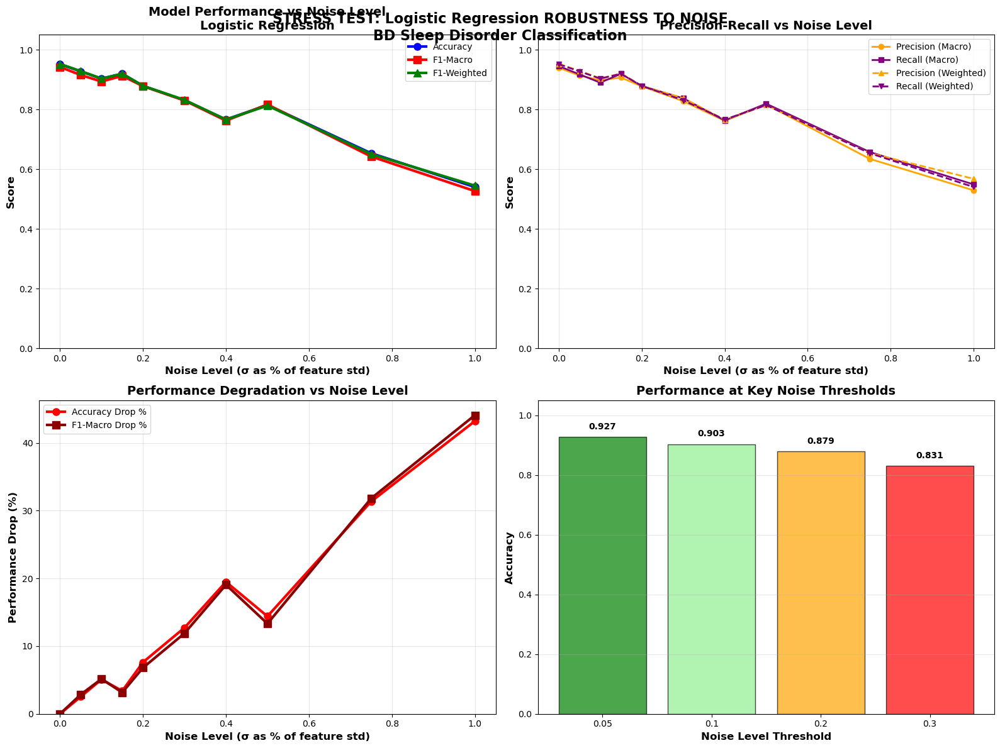


STRESS TEST ANALYSIS REPORT

ROBUSTNESS THRESHOLDS:
-------------------------
 Baseline Accuracy: 0.9516
 Baseline F1-Macro: 0.9422
 10% performance drop at noise level: 0.30
 20% performance drop at noise level: 0.75
 30% performance drop at noise level: 0.75

PERFORMANCE AT MAXIMUM NOISE (σ = 1.00):
---------------------------------------------
 Accuracy: 0.5403 (Drop: 43.2%)
 F1-Macro: 0.5267 (Drop: 44.1%)

ROBUSTNESS SCORE: 0.7603 (76.0% of ideal)
----------------------------------------
 Robustness Rating: GOOD
 Critical Noise Level: 0.75 (performance < 70% of baseline)

DETAILED PERFORMANCE AT EACH NOISE LEVEL:
--------------------------------------------------------------------------------


,noise_level,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,accuracy_drop_pct,f1_drop_pct
0,0.0000,0.9516,0.9395,0.9452,0.9422,0.9526,0.9516,0.9520,0.0000,0.0000
1,0.0500,0.9274,0.9136,0.9175,0.9152,0.9295,0.9274,0.9282,2.5424,2.8591
2,0.1000,0.9032,0.8979,0.8897,0.8936,0.9038,0.9032,0.9033,5.0847,5.1578
3,0.1500,0.9194,0.9066,0.9194,0.9124,0.9207,0.9194,0.9196,3.3898,3.1597
4,0.2000,0.8790,0.8776,0.8784,0.8780,0.8788,0.8790,0.8788,7.6271,6.8128
5,0.3000,0.8306,0.8278,0.8374,0.8301,0.8380,0.8306,0.8320,12.7119,11.8930
6,0.4000,0.7661,0.7621,0.7631,0.7626,0.7654,0.7661,0.7657,19.4915,19.0627
7,0.5000,0.8145,0.8166,0.8193,0.8166,0.8146,0.8145,0.8129,14.4068,13.3253
8,0.7500,0.6532,0.6343,0.6574,0.6424,0.6537,0.6532,0.6505,31.3559,31.8114
9,1.0000,0.5403,0.5293,0.5490,0.5267,0.5678,0.5403,0.5448,43.2203,44.0932



RECOMMENDATIONS:
---------------
✅ MODEL IS ROBUST: Suitable for deployment in noisy environments
   Consider adding noise during training for even better robustness

STRESS TEST COMPLETED


In [96]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------------------------
# STRESS TEST: MODEL PERFORMANCE VS NOISE LEVEL
# --------------------------------------------------------------

print("="*80)
print("STRESS TEST: MODEL PERFORMANCE VS NOISE LEVEL")
print("="*80)

# Get the best performing model from previous results
best_model_name = comparison_df.iloc[0]['Model']
best_model = algorithms[best_model_name]

print(f"Selected best model for stress testing: {best_model_name}")
print(f"Initial PR-AUC: {comparison_df.iloc[0]['PR AUC']:.4f}")

# Define noise levels (standard deviation as percentage of feature std)
noise_levels = [0.0, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.75, 1.0]
print(f"\nNoise levels to test: {noise_levels}")

# Prepare the model based on its requirements
if best_model_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
    X_train_used = X_resampled_scaled
    X_test_used = X_test_orig_scaled
    y_train_used = y_train_smote
    scaler_used = True
elif best_model_name in ['XGBoost', 'CatBoost']:
    X_train_used = X_train_smote
    X_test_used = X_test_orig
    y_train_used = y_resampled_encoded
    scaler_used = False
else:
    X_train_used = X_train_smote
    X_test_used = X_test_orig
    y_train_used = y_train_smote
    scaler_used = False

# Convert to numpy arrays to avoid pandas indexing issues
X_train_used_np = X_train_used.values if hasattr(X_train_used, 'values') else X_train_used
X_test_used_np = X_test_used.values if hasattr(X_test_used, 'values') else X_test_used

# Calculate feature standard deviations for noise scaling
feature_std = np.std(X_train_used_np, axis=0)

# Store results
stress_test_results = {
    'noise_level': [],
    'accuracy': [],
    'precision_macro': [],
    'recall_macro': [],
    'f1_macro': [],
    'precision_weighted': [],
    'recall_weighted': [],
    'f1_weighted': []
}

print(f"\nStarting stress test with {len(noise_levels)} noise levels...")
print("-" * 60)

# Set random seed for reproducible noise
np.random.seed(42)

for noise_level in noise_levels:
    print(f"Testing noise level: {noise_level:.2f}...", end=" ")
    
    # Add Gaussian noise to test data
    noise_std = noise_level * feature_std
    X_test_noisy = X_test_used_np.copy()
    
    # Add noise to each feature based on its std
    for i in range(X_test_used_np.shape[1]):
        noise = np.random.normal(0, noise_std[i], X_test_used_np.shape[0])
        X_test_noisy[:, i] += noise
    
    # Retrain model on clean data (simulating real-world scenario)
    best_model.fit(X_train_used, y_train_used)
    
    # Predict on noisy test data
    if best_model_name in ['XGBoost', 'CatBoost']:
        y_pred_encoded = best_model.predict(X_test_noisy)
        y_pred = le_target.inverse_transform(y_pred_encoded)
    else:
        y_pred = best_model.predict(X_test_noisy)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test_orig, y_pred)
    precision_macro = precision_score(y_test_orig, y_pred, average='macro', zero_division=0)
    recall_macro = recall_score(y_test_orig, y_pred, average='macro', zero_division=0)
    f1_macro = f1_score(y_test_orig, y_pred, average='macro', zero_division=0)
    precision_weighted = precision_score(y_test_orig, y_pred, average='weighted', zero_division=0)
    recall_weighted = recall_score(y_test_orig, y_pred, average='weighted', zero_division=0)
    f1_weighted = f1_score(y_test_orig, y_pred, average='weighted', zero_division=0)
    
    # Store results
    stress_test_results['noise_level'].append(noise_level)
    stress_test_results['accuracy'].append(accuracy)
    stress_test_results['precision_macro'].append(precision_macro)
    stress_test_results['recall_macro'].append(recall_macro)
    stress_test_results['f1_macro'].append(f1_macro)
    stress_test_results['precision_weighted'].append(precision_weighted)
    stress_test_results['recall_weighted'].append(recall_weighted)
    stress_test_results['f1_weighted'].append(f1_weighted)
    
    print(f"Accuracy: {accuracy:.4f}")

# Create results DataFrame
stress_df = pd.DataFrame(stress_test_results)

# --------------------------------------------------------------
# VISUALIZATION: PERFORMANCE VS NOISE LEVEL
# --------------------------------------------------------------

# Create comprehensive visualization
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

# 1. Main Performance Metrics
ax1.plot(stress_df['noise_level'], stress_df['accuracy'], 
         marker='o', linewidth=3, markersize=8, label='Accuracy', color='blue')
ax1.plot(stress_df['noise_level'], stress_df['f1_macro'], 
         marker='s', linewidth=3, markersize=8, label='F1-Macro', color='red')
ax1.plot(stress_df['noise_level'], stress_df['f1_weighted'], 
         marker='^', linewidth=3, markersize=8, label='F1-Weighted', color='green')

ax1.set_xlabel('Noise Level (σ as % of feature std)', fontsize=12, fontweight='bold')
ax1.set_ylabel('Score', fontsize=12, fontweight='bold')
ax1.set_title(f'Model Performance vs Noise Level\n{best_model_name}', 
              fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_ylim(0, 1.05)

# 2. Precision-Recall Breakdown
ax2.plot(stress_df['noise_level'], stress_df['precision_macro'], 
         marker='o', linewidth=2, markersize=6, label='Precision (Macro)', color='orange')
ax2.plot(stress_df['noise_level'], stress_df['recall_macro'], 
         marker='s', linewidth=2, markersize=6, label='Recall (Macro)', color='purple')
ax2.plot(stress_df['noise_level'], stress_df['precision_weighted'], 
         marker='^', linewidth=2, markersize=6, label='Precision (Weighted)', color='orange', linestyle='--')
ax2.plot(stress_df['noise_level'], stress_df['recall_weighted'], 
         marker='v', linewidth=2, markersize=6, label='Recall (Weighted)', color='purple', linestyle='--')

ax2.set_xlabel('Noise Level (σ as % of feature std)', fontsize=12, fontweight='bold')
ax2.set_ylabel('Score', fontsize=12, fontweight='bold')
ax2.set_title('Precision-Recall vs Noise Level', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.set_ylim(0, 1.05)

# 3. Performance Degradation (Percentage drop from baseline)
baseline_accuracy = stress_df.loc[0, 'accuracy']
baseline_f1 = stress_df.loc[0, 'f1_macro']

accuracy_drop = [(1 - acc/baseline_accuracy) * 100 for acc in stress_df['accuracy']]
f1_drop = [(1 - f1/baseline_f1) * 100 for f1 in stress_df['f1_macro']]

ax3.plot(stress_df['noise_level'], accuracy_drop, 
         marker='o', linewidth=3, markersize=8, label='Accuracy Drop %', color='red')
ax3.plot(stress_df['noise_level'], f1_drop, 
         marker='s', linewidth=3, markersize=8, label='F1-Macro Drop %', color='darkred')

ax3.set_xlabel('Noise Level (σ as % of feature std)', fontsize=12, fontweight='bold')
ax3.set_ylabel('Performance Drop (%)', fontsize=12, fontweight='bold')
ax3.set_title('Performance Degradation vs Noise Level', fontsize=14, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3)
ax3.set_ylim(bottom=0)

# 4. Robustness Analysis (Performance at key thresholds)
thresholds = [0.05, 0.1, 0.2, 0.3]
performance_at_thresholds = []

for threshold in thresholds:
    idx = stress_df[stress_df['noise_level'] == threshold].index
    if len(idx) > 0:
        perf = stress_df.loc[idx[0], 'accuracy']
        performance_at_thresholds.append(perf)

ax4.bar([str(t) for t in thresholds], performance_at_thresholds, 
        color=['green', 'lightgreen', 'orange', 'red'], alpha=0.7, edgecolor='black')

ax4.set_xlabel('Noise Level Threshold', fontsize=12, fontweight='bold')
ax4.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax4.set_title('Performance at Key Noise Thresholds', fontsize=14, fontweight='bold')
ax4.grid(True, alpha=0.3, axis='y')
ax4.set_ylim(0, 1.05)

# Add value labels on bars
for i, v in enumerate(performance_at_thresholds):
    ax4.text(i, v + 0.02, f'{v:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()

# Add overall title
fig.suptitle(f'STRESS TEST: {best_model_name} ROBUSTNESS TO NOISE\nBD Sleep Disorder Classification', 
             fontsize=16, fontweight='bold', y=0.98)

plt.show()

# --------------------------------------------------------------
# DETAILED STRESS TEST ANALYSIS
# --------------------------------------------------------------

print(f"\n{'='*80}")
print("STRESS TEST ANALYSIS REPORT")
print(f"{'='*80}")

# Calculate robustness metrics
initial_accuracy = stress_df.loc[0, 'accuracy']
initial_f1 = stress_df.loc[0, 'f1_macro']

# Find noise level where performance drops below thresholds
threshold_90 = stress_df[stress_df['accuracy'] < 0.9 * initial_accuracy]
threshold_80 = stress_df[stress_df['accuracy'] < 0.8 * initial_accuracy]
threshold_70 = stress_df[stress_df['accuracy'] < 0.7 * initial_accuracy]

noise_90 = threshold_90['noise_level'].min() if len(threshold_90) > 0 else float('inf')
noise_80 = threshold_80['noise_level'].min() if len(threshold_80) > 0 else float('inf')
noise_70 = threshold_70['noise_level'].min() if len(threshold_70) > 0 else float('inf')

print(f"\nROBUSTNESS THRESHOLDS:")
print("-" * 25)
print(f" Baseline Accuracy: {initial_accuracy:.4f}")
print(f" Baseline F1-Macro: {initial_f1:.4f}")
print(f" 10% performance drop at noise level: {noise_90:.2f}")
print(f" 20% performance drop at noise level: {noise_80:.2f}")
print(f" 30% performance drop at noise level: {noise_70:.2f}")

# Performance at maximum tested noise
max_noise_perf = stress_df.iloc[-1]
print(f"\nPERFORMANCE AT MAXIMUM NOISE (σ = {max_noise_perf['noise_level']:.2f}):")
print("-" * 45)
print(f" Accuracy: {max_noise_perf['accuracy']:.4f} (Drop: {((initial_accuracy - max_noise_perf['accuracy'])/initial_accuracy)*100:.1f}%)")
print(f" F1-Macro: {max_noise_perf['f1_macro']:.4f} (Drop: {((initial_f1 - max_noise_perf['f1_macro'])/initial_f1)*100:.1f}%)")

# Robustness score (area under performance curve)
robustness_score = np.trapz(stress_df['accuracy'], stress_df['noise_level']) / stress_df['noise_level'].max()
max_possible_score = 1.0 * stress_df['noise_level'].max()
robustness_percentage = (robustness_score / max_possible_score) * 100

print(f"\nROBUSTNESS SCORE: {robustness_score:.4f} ({robustness_percentage:.1f}% of ideal)")
print("-" * 40)

if robustness_percentage >= 80:
    robustness_rating = "EXCELLENT"
elif robustness_percentage >= 60:
    robustness_rating = "GOOD"
elif robustness_percentage >= 40:
    robustness_rating = "MODERATE"
else:
    robustness_rating = "POOR"

print(f" Robustness Rating: {robustness_rating}")

# Critical noise level (where performance becomes unacceptable)
acceptable_threshold = 0.7  # 70% of baseline
critical_noise = stress_df[stress_df['accuracy'] < acceptable_threshold * initial_accuracy]
if len(critical_noise) > 0:
    critical_level = critical_noise['noise_level'].min()
    print(f" Critical Noise Level: {critical_level:.2f} (performance < {acceptable_threshold*100:.0f}% of baseline)")
else:
    print(f" Critical Noise Level: > {stress_df['noise_level'].max():.2f} (model remains robust)")

# Display detailed results table
print(f"\nDETAILED PERFORMANCE AT EACH NOISE LEVEL:")
print("-" * 80)
detailed_df = stress_df.copy()
detailed_df['accuracy_drop_pct'] = [(1 - acc/initial_accuracy)*100 for acc in detailed_df['accuracy']]
detailed_df['f1_drop_pct'] = [(1 - f1/initial_f1)*100 for f1 in detailed_df['f1_macro']]

display(detailed_df.round(4).style
        .background_gradient(subset=['accuracy', 'f1_macro'], cmap='RdYlGn')
        .background_gradient(subset=['accuracy_drop_pct', 'f1_drop_pct'], cmap='RdYlGn_r')
        .format('{:.4f}')
        .set_caption(f"Stress Test Results: {best_model_name}"))

# Final recommendations
print(f"\nRECOMMENDATIONS:")
print("-" * 15)
if robustness_percentage >= 70:
    print("✅ MODEL IS ROBUST: Suitable for deployment in noisy environments")
    print("   Consider adding noise during training for even better robustness")
elif robustness_percentage >= 50:
    print("⚠️  MODERATE ROBUSTNESS: Acceptable for controlled environments")
    print("   Consider feature engineering or ensemble methods")
else:
    print("🔴 LOW ROBUSTNESS: Not recommended for noisy environments")
    print("   Required: Feature selection, regularization, or different algorithm")

print(f"\n{'='*80}")
print("STRESS TEST COMPLETED")
print(f"{'='*80}")

STRESS TEST: ALL MODELS PERFORMANCE VS NOISE LEVEL
Noise levels to test: [0.0, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.75, 1.0]
Testing 9 models...

Starting stress test for all models...
------------------------------------------------------------
Testing Random Forest... Baseline: 0.7903
Testing Gradient Boosting... Baseline: 0.7823
Testing SVM... Baseline: 0.8629
Testing Logistic Regression... Baseline: 0.9516
Testing Decision Tree... Baseline: 0.6613
Testing K-Neighbors... Baseline: 0.6613
Testing AdaBoost... Baseline: 0.8226
Testing XGBoost... Baseline: 0.7419
Testing CatBoost... Baseline: 0.8145


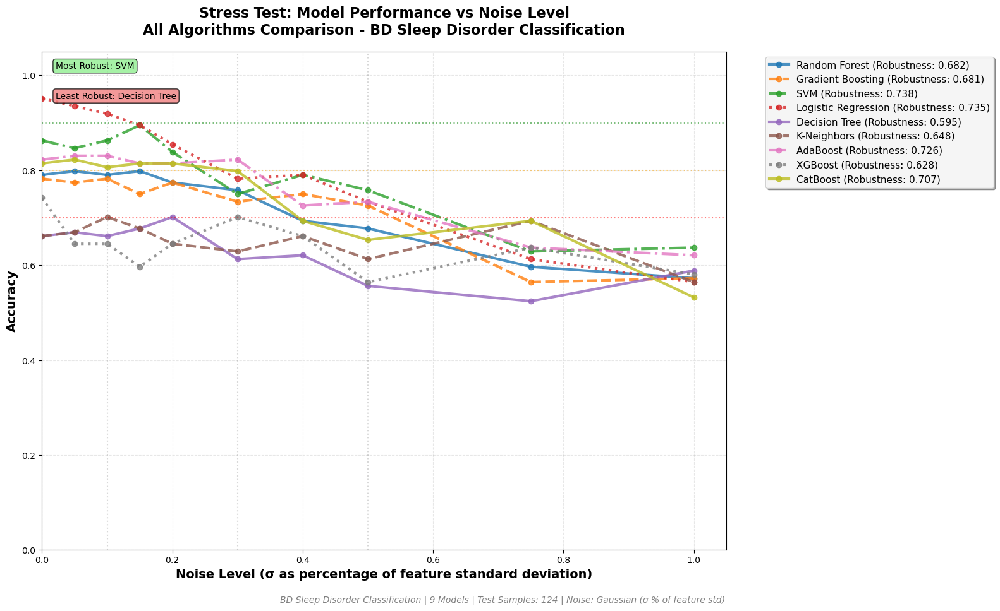


STRESS TEST SUMMARY

Models Ranked by Robustness (Higher is better):
------------------------------------------------------------
 3. SVM                  | Robustness: 0.738 | Baseline: 0.863 | Drop: 26.2%
 4. Logistic Regression  | Robustness: 0.735 | Baseline: 0.952 | Drop: 40.7%
 7. AdaBoost             | Robustness: 0.726 | Baseline: 0.823 | Drop: 24.5%
 9. CatBoost             | Robustness: 0.707 | Baseline: 0.815 | Drop: 34.7%
 1. Random Forest        | Robustness: 0.682 | Baseline: 0.790 | Drop: 27.6%
 2. Gradient Boosting    | Robustness: 0.681 | Baseline: 0.782 | Drop: 26.8%
 6. K-Neighbors          | Robustness: 0.648 | Baseline: 0.661 | Drop: 14.6%
 8. XGBoost              | Robustness: 0.628 | Baseline: 0.742 | Drop: 21.7%
 5. Decision Tree        | Robustness: 0.595 | Baseline: 0.661 | Drop: 11.0%

KEY FINDINGS:
---------------
• Most Robust Model: SVM (Score: 0.738)
• Least Robust Model: Decision Tree (Score: 0.595)
• Average Robustness: 0.682
• Models maintaining >80% 

In [99]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, f1_score
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# --------------------------------------------------------------
# STRESS TEST: ALL MODELS PERFORMANCE VS NOISE LEVEL - SINGLE GRAPH
# --------------------------------------------------------------

print("="*80)
print("STRESS TEST: ALL MODELS PERFORMANCE VS NOISE LEVEL")
print("="*80)

# Define noise levels (standard deviation as percentage of feature std)
noise_levels = [0.0, 0.05, 0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.75, 1.0]
print(f"Noise levels to test: {noise_levels}")
print(f"Testing {len(algorithms)} models...")

# Store results for all models
all_models_stress_results = {}

# Colors for different models
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

print(f"\nStarting stress test for all models...")
print("-" * 60)

# Set random seed for reproducible noise
np.random.seed(42)

for model_idx, (model_name, model) in enumerate(algorithms.items()):
    print(f"Testing {model_name}...", end=" ")
    
    # Prepare data based on model requirements
    if model_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
        X_train_used = X_resampled_scaled
        X_test_used = X_test_orig_scaled
        y_train_used = y_train_smote
    elif model_name in ['XGBoost', 'CatBoost']:
        X_train_used = X_train_smote
        X_test_used = X_test_orig
        y_train_used = y_resampled_encoded
    else:
        X_train_used = X_train_smote
        X_test_used = X_test_orig
        y_train_used = y_train_smote

    # Convert to numpy arrays and ensure float dtype
    X_train_used_np = X_train_used.values if hasattr(X_train_used, 'values') else X_train_used
    X_test_used_np = X_test_used.values if hasattr(X_test_used, 'values') else X_test_used
    
    # Ensure data is float type to avoid dtype conflicts
    X_train_used_np = X_train_used_np.astype(np.float64)
    X_test_used_np = X_test_used_np.astype(np.float64)

    # Calculate feature standard deviations for noise scaling
    feature_std = np.std(X_train_used_np, axis=0)
    
    # Store results for this model
    model_results = {
        'noise_level': [],
        'accuracy': []
    }
    
    for noise_level in noise_levels:
        # Add Gaussian noise to test data
        noise_std = noise_level * feature_std
        X_test_noisy = X_test_used_np.copy().astype(np.float64)
        
        # Add noise to each feature based on its std
        for i in range(X_test_used_np.shape[1]):
            noise = np.random.normal(0, noise_std[i], X_test_used_np.shape[0]).astype(np.float64)
            X_test_noisy[:, i] = X_test_noisy[:, i] + noise
        
        # For models that require specific data formats, convert back if needed
        if hasattr(X_test_used, 'iloc'):  # If original was DataFrame
            X_test_noisy_df = pd.DataFrame(X_test_noisy, columns=X_test_used.columns, index=X_test_used.index)
        else:
            X_test_noisy_df = X_test_noisy
        
        # Retrain model on clean data
        model.fit(X_train_used, y_train_used)
        
        # Predict on noisy test data
        if model_name in ['XGBoost', 'CatBoost']:
            y_pred_encoded = model.predict(X_test_noisy_df)
            y_pred = le_target.inverse_transform(y_pred_encoded)
        else:
            y_pred = model.predict(X_test_noisy_df)
        
        # Calculate accuracy
        accuracy = accuracy_score(y_test_orig, y_pred)
        
        # Store results
        model_results['noise_level'].append(noise_level)
        model_results['accuracy'].append(accuracy)
    
    all_models_stress_results[model_name] = model_results
    baseline_acc = model_results['accuracy'][0]
    print(f"Baseline: {baseline_acc:.4f}")

# --------------------------------------------------------------
# SINGLE COMPREHENSIVE VISUALIZATION
# --------------------------------------------------------------

plt.figure(figsize=(16, 10))

# Plot all models in a single graph
line_styles = ['-', '--', '-.', ':'] * 3  # Different line styles for better distinction

for i, (model_name, results) in enumerate(all_models_stress_results.items()):
    color = colors[i % len(colors)]
    line_style = line_styles[i % len(line_styles)]
    
    # Calculate robustness score for ranking
    robustness = np.trapz(results['accuracy'], results['noise_level']) / results['noise_level'][-1]
    
    plt.plot(results['noise_level'], results['accuracy'], 
             linewidth=3, 
             linestyle=line_style,
             marker='o',
             markersize=6,
             label=f'{model_name} (Robustness: {robustness:.3f})', 
             color=color,
             alpha=0.8)

# Customize the plot
plt.xlabel('Noise Level (σ as percentage of feature standard deviation)', 
           fontsize=14, fontweight='bold')
plt.ylabel('Accuracy', fontsize=14, fontweight='bold')
plt.title('Stress Test: Model Performance vs Noise Level\nAll Algorithms Comparison - BD Sleep Disorder Classification', 
          fontsize=16, fontweight='bold', pad=20)

# Add legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', 
           fontsize=11, frameon=True, fancybox=True, 
           shadow=True, framealpha=0.9)

# Grid and limits
plt.grid(True, alpha=0.3, linestyle='--')
plt.xlim(0, 1.05)
plt.ylim(0, 1.05)

# Add performance threshold lines
plt.axhline(y=0.9, color='green', linestyle=':', alpha=0.5, label='90% Accuracy')
plt.axhline(y=0.8, color='orange', linestyle=':', alpha=0.5, label='80% Accuracy')
plt.axhline(y=0.7, color='red', linestyle=':', alpha=0.5, label='70% Accuracy')

# Add noise level reference lines
for noise_level in [0.1, 0.3, 0.5]:
    plt.axvline(x=noise_level, color='gray', linestyle=':', alpha=0.3)

# Add text annotations for key insights
best_model = max(all_models_stress_results.items(), 
                key=lambda x: np.trapz(x[1]['accuracy'], x[1]['noise_level']))
worst_model = min(all_models_stress_results.items(), 
                 key=lambda x: np.trapz(x[1]['accuracy'], x[1]['noise_level']))

plt.text(0.02, 0.98, f'Most Robust: {best_model[0]}', 
         transform=plt.gca().transAxes, fontsize=10, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.8),
         verticalalignment='top')

plt.text(0.02, 0.92, f'Least Robust: {worst_model[0]}', 
         transform=plt.gca().transAxes, fontsize=10,
         bbox=dict(boxstyle="round,pad=0.3", facecolor="lightcoral", alpha=0.8),
         verticalalignment='top')

# Add footer
plt.figtext(0.5, 0.01, 
            f"BD Sleep Disorder Classification | {len(algorithms)} Models | "
            f"Test Samples: {len(y_test_orig)} | Noise: Gaussian (σ % of feature std)",
            ha='center', fontsize=10, style='italic', color='gray')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# --------------------------------------------------------------
# SUMMARY STATISTICS
# --------------------------------------------------------------

print(f"\n{'='*80}")
print("STRESS TEST SUMMARY")
print(f"{'='*80}")

# Calculate robustness scores and create summary
robustness_data = []
for model_name, results in all_models_stress_results.items():
    baseline_acc = results['accuracy'][0]
    max_noise_acc = results['accuracy'][-1]
    robustness = np.trapz(results['accuracy'], results['noise_level']) / results['noise_level'][-1]
    drop_pct = (1 - max_noise_acc/baseline_acc) * 100
    
    robustness_data.append({
        'Model': model_name,
        'Baseline_Accuracy': baseline_acc,
        'Accuracy_at_σ=1.0': max_noise_acc,
        'Robustness_Score': robustness,
        'Performance_Drop_%': drop_pct
    })

robustness_df = pd.DataFrame(robustness_data)
robustness_df = robustness_df.sort_values('Robustness_Score', ascending=False)

print(f"\nModels Ranked by Robustness (Higher is better):")
print("-" * 60)
for i, row in robustness_df.iterrows():
    print(f"{i+1:2d}. {row['Model']:<20} | Robustness: {row['Robustness_Score']:.3f} | "
          f"Baseline: {row['Baseline_Accuracy']:.3f} | Drop: {row['Performance_Drop_%']:.1f}%")

# Key findings
best_model_name = robustness_df.iloc[0]['Model']
worst_model_name = robustness_df.iloc[-1]['Model']
avg_robustness = robustness_df['Robustness_Score'].mean()

print(f"\nKEY FINDINGS:")
print("-" * 15)
print(f"• Most Robust Model: {best_model_name} (Score: {robustness_df.iloc[0]['Robustness_Score']:.3f})")
print(f"• Least Robust Model: {worst_model_name} (Score: {robustness_df.iloc[-1]['Robustness_Score']:.3f})")
print(f"• Average Robustness: {avg_robustness:.3f}")
print(f"• Models maintaining >80% accuracy at σ=1.0: {len(robustness_df[robustness_df['Accuracy_at_σ=1.0'] > 0.8])}")

print(f"\n{'='*80}")
print("STRESS TEST COMPLETED")
print(f"{'='*80}")

# ROC vs AOC

ROC CURVES - ALL MODELS COMPARISON
Processing Random Forest...
Processing Gradient Boosting...
Processing SVM...
Processing Logistic Regression...
Processing Decision Tree...
Processing K-Neighbors...
Processing AdaBoost...
Processing XGBoost...
Processing CatBoost...


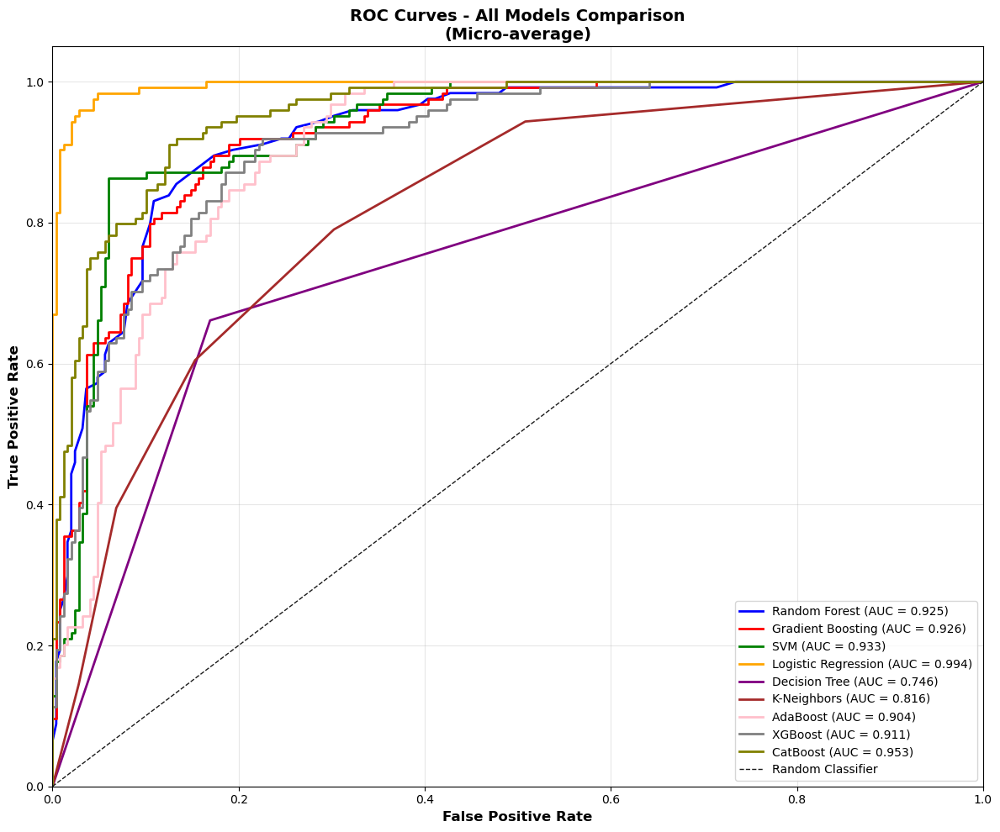


AUC Scores (Micro-average):
----------------------------------------
Logistic Regression : 0.9943
CatBoost            : 0.9534
SVM                 : 0.9329
Gradient Boosting   : 0.9255
Random Forest       : 0.9252
XGBoost             : 0.9112
AdaBoost            : 0.9042
K-Neighbors         : 0.8157
Decision Tree       : 0.7460


In [100]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import LabelEncoder

# --------------------------------------------------------------
# SINGLE ROC CURVE FOR ALL MODELS
# --------------------------------------------------------------

print("="*80)
print("ROC CURVES - ALL MODELS COMPARISON")
print("="*80)

# Get class names and prepare for multi-class ROC
class_names = le_target.classes_
n_classes = len(class_names)

plt.figure(figsize=(12, 10))

# Colors for different models
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Store AUC scores
auc_scores = {}

for i, (model_name, model) in enumerate(algorithms.items()):
    print(f"Processing {model_name}...")
    
    try:
        # Prepare data based on model requirements
        if model_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            X_train_used = X_resampled_scaled
            X_test_used = X_test_orig_scaled
            y_train_used = y_train_smote
        elif model_name in ['XGBoost', 'CatBoost']:
            X_train_used = X_train_smote
            X_test_used = X_test_orig
            y_train_used = y_resampled_encoded
        else:
            X_train_used = X_train_smote
            X_test_used = X_test_orig
            y_train_used = y_train_smote

        # Fit model
        model.fit(X_train_used, y_train_used)
        
        # Get predicted probabilities
        if hasattr(model, 'predict_proba'):
            y_score = model.predict_proba(X_test_used)
        else:
            # For models without predict_proba, use decision function
            y_score = model.decision_function(X_test_used)
            # Normalize to [0, 1] range
            y_score = (y_score - y_score.min()) / (y_score.max() - y_score.min())
        
        # Binarize labels for multi-class ROC
        y_test_bin = label_binarize(y_test_orig, classes=class_names)
        
        # Compute ROC curve and ROC area for each class
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        
        for j in range(n_classes):
            fpr[j], tpr[j], _ = roc_curve(y_test_bin[:, j], y_score[:, j])
            roc_auc[j] = auc(fpr[j], tpr[j])
        
        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
        
        # Store micro-average AUC
        auc_scores[model_name] = roc_auc["micro"]
        
        # Plot micro-average ROC curve
        color = colors[i % len(colors)]
        plt.plot(fpr["micro"], tpr["micro"],
                 color=color, linewidth=2,
                 label=f'{model_name} (AUC = {roc_auc["micro"]:.3f})')
        
    except Exception as e:
        print(f"Error with {model_name}: {str(e)}")
        continue

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random Classifier')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=12, fontweight='bold')
plt.title('ROC Curves - All Models Comparison\n(Micro-average)', fontsize=14, fontweight='bold')
plt.legend(loc='lower right', fontsize=10)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print AUC summary
print(f"\nAUC Scores (Micro-average):")
print("-" * 40)
for model_name, auc_score in sorted(auc_scores.items(), key=lambda x: x[1], reverse=True):
    print(f"{model_name:<20}: {auc_score:.4f}")

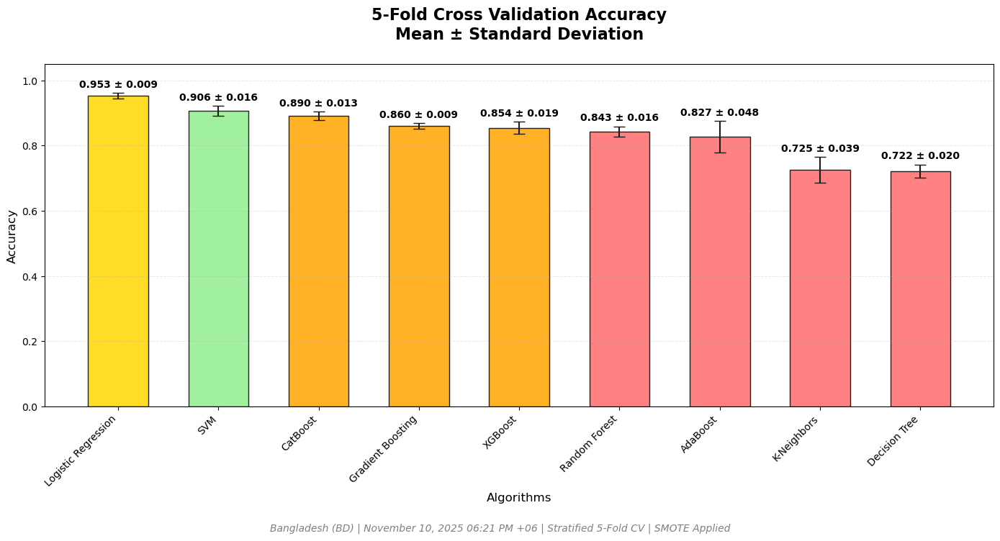

In [71]:
# 1. ACCURACY BAR CHART WITH ERROR BARS (5-FOLD CV)
import matplotlib.pyplot as plt
import numpy as np

# Extract CV accuracy mean and std
algo_names = list(cv_results.keys())
cv_means = [cv_results[name]['accuracy']['mean'] for name in algo_names]
cv_stds = [cv_results[name]['accuracy']['std'] for name in algo_names]

# Sort by mean accuracy (descending)
sorted_idx = np.argsort(cv_means)[::-1]
algo_names = [algo_names[i] for i in sorted_idx]
cv_means = [cv_means[i] for i in sorted_idx]
cv_stds = [cv_stds[i] for i in sorted_idx]

# Color coding
colors = []
for m in cv_means:
    if m >= 0.93:
        colors.append('#FFD700')   # Gold
    elif m >= 0.90:
        colors.append('#90EE90')   # Light Green
    elif m >= 0.85:
        colors.append('#FFA500')   # Orange
    else:
        colors.append('#FF6B6B')   # Coral

# Plot
plt.figure(figsize=(14, 8))
bars = plt.bar(algo_names, cv_means, yerr=cv_stds, capsize=6, color=colors, 
               edgecolor='black', alpha=0.85, width=0.6)

plt.title('5-Fold Cross Validation Accuracy\nMean ± Standard Deviation', 
          fontsize=16, fontweight='bold', pad=25)
plt.ylabel('Accuracy', fontsize=12)
plt.xlabel('Algorithms', fontsize=12)
plt.ylim(0, 1.05)
plt.xticks(rotation=45, ha='right')

# Add value labels
for i, (bar, mean, std) in enumerate(zip(bars, cv_means, cv_stds)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.01,
             f'{mean:.3f} ± {std:.3f}', ha='center', va='bottom', 
             fontweight='bold', fontsize=10)

plt.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.7)
plt.figtext(0.5, 0.02, 
            f"Bangladesh (BD) | November 10, 2025 06:21 PM +06 | Stratified 5-Fold CV | SMOTE Applied",
            ha='center', fontsize=10, style='italic', color='gray')
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

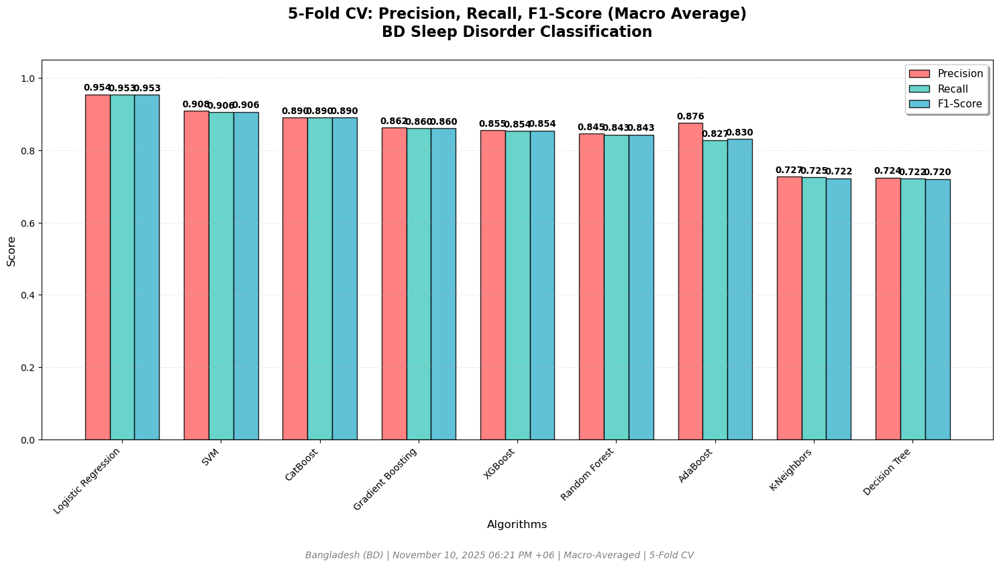

In [72]:
# 2. GROUPED BAR CHART: Precision, Recall, F1 (Macro)
metrics = ['precision_macro', 'recall_macro', 'f1_macro']
metric_labels = ['Precision', 'Recall', 'F1-Score']

# Extract macro means (use same sorting as accuracy)
prec = [cv_results[algo_names[i]]['precision_macro']['mean'] for i in range(len(algo_names))]
rec  = [cv_results[algo_names[i]]['recall_macro']['mean'] for i in range(len(algo_names))]
f1   = [cv_results[algo_names[i]]['f1_macro']['mean'] for i in range(len(algo_names))]

# Setup
x = np.arange(len(algo_names))
width = 0.25

plt.figure(figsize=(15, 9))

# Bars
bars1 = plt.bar(x - width, prec, width, label='Precision', color='#FF6B6B', edgecolor='black', alpha=0.85)
bars2 = plt.bar(x, rec, width, label='Recall', color='#4ECDC4', edgecolor='black', alpha=0.85)
bars3 = plt.bar(x + width, f1, width, label='F1-Score', color='#45B7D1', edgecolor='black', alpha=0.85)

plt.title('5-Fold CV: Precision, Recall, F1-Score (Macro Average)\nBD Sleep Disorder Classification', 
          fontsize=16, fontweight='bold', pad=25)
plt.ylabel('Score', fontsize=12)
plt.xlabel('Algorithms', fontsize=12)
plt.ylim(0, 1.05)
plt.xticks(x, algo_names, rotation=45, ha='right')
plt.legend(fontsize=11, loc='upper right', frameon=True, fancybox=True, shadow=True)

# Add labels
def label_bars(bars, values):
    for bar, val in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                 f'{val:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9.5)

label_bars(bars1, prec)
label_bars(bars2, rec)
label_bars(bars3, f1)

plt.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.7)
plt.figtext(0.5, 0.02, 
            f"Bangladesh (BD) | November 10, 2025 06:21 PM +06 | Macro-Averaged | 5-Fold CV",
            ha='center', fontsize=10, style='italic', color='gray')
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()


 CROSS VALIDATION RESULTS VISUALIZATION


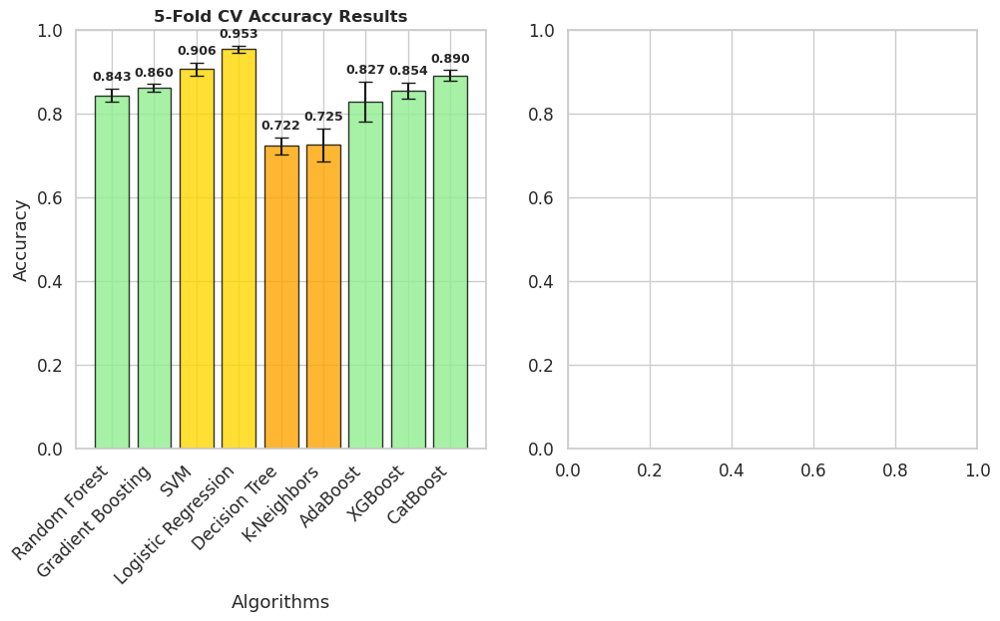

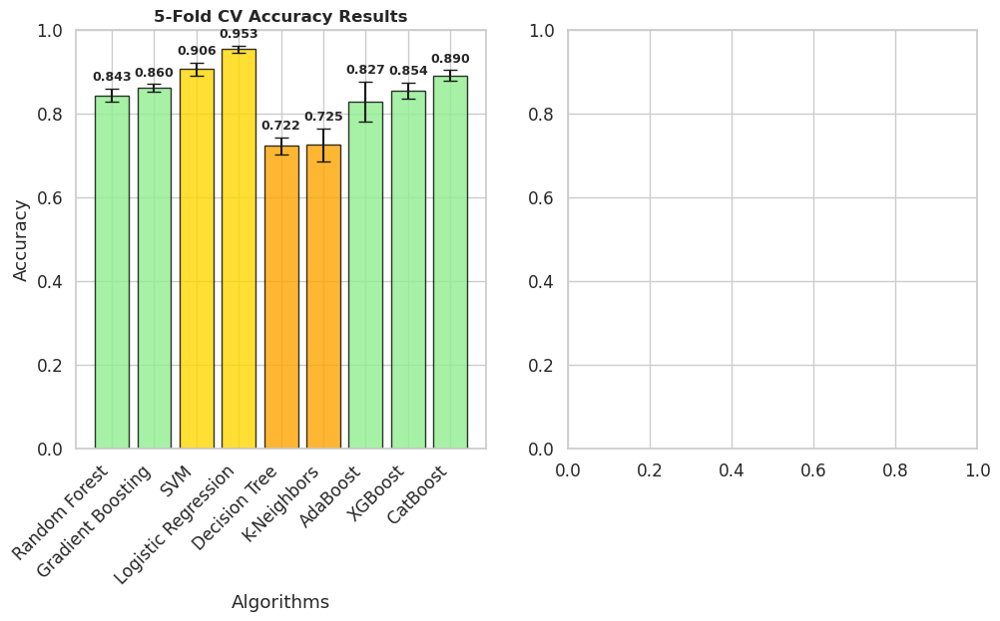

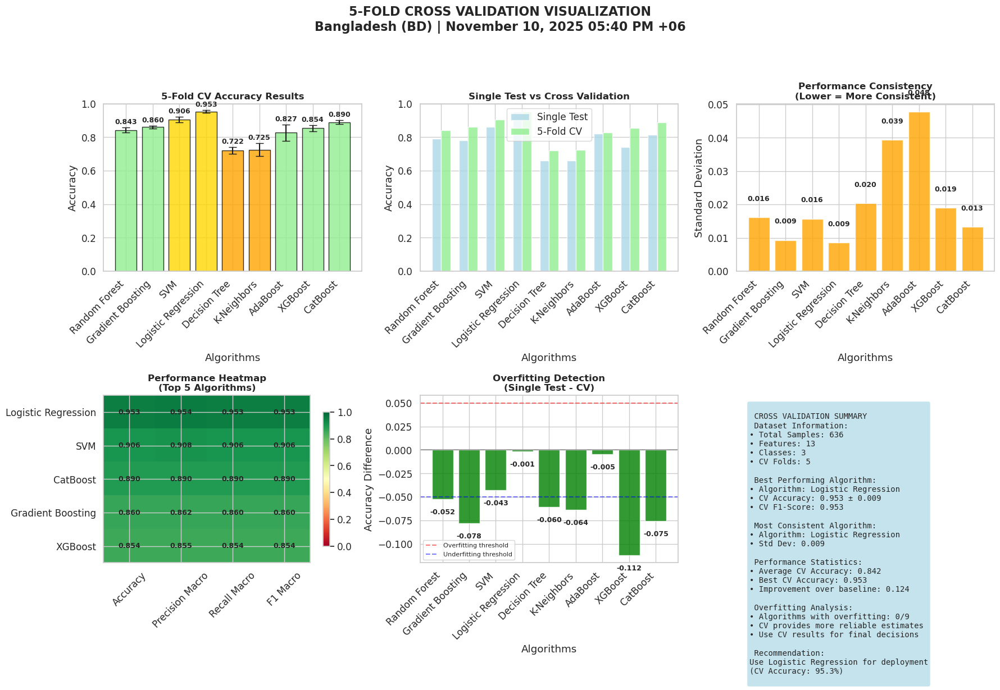


................................................................................
                  5-FOLD CROSS VALIDATION ANALYSIS COMPLETED!                   
................................................................................

 Key Takeaways:
 • Best CV Algorithm: Logistic Regression (95.3%)
 • Most Consistent: Logistic Regression (std: 0.009)
 • CV provides more reliable performance estimates than single test
 • Use these results for final model selection and deployment!


In [36]:
# # Cross Validation Results Visualization
# print("\n" + "="*80)
# print(" CROSS VALIDATION RESULTS VISUALIZATION")
# print("="*80)

# # Create comprehensive visualization
# plt.figure(figsize=(18, 12))

# # 1. CV Accuracy Comparison
# plt.subplot(2, 3, 1)
# cv_algo_names = list(cv_results.keys())
# cv_means = [cv_results[name]['accuracy']['mean'] for name in cv_algo_names]
# cv_stds = [cv_results[name]['accuracy']['std'] for name in cv_algo_names]

# # Color coding based on performance
# colors = ['gold' if acc >= 0.90 else 'lightgreen' if acc >= 0.80 else 'orange' if acc >= 0.70 else 'lightcoral' 
#           for acc in cv_means]

# bars = plt.bar(range(len(cv_algo_names)), cv_means, yerr=cv_stds, capsize=5,
#                color=colors, alpha=0.8, edgecolor='black')

# plt.title('5-Fold CV Accuracy Results', fontsize=12, fontweight='bold')
# plt.ylabel('Accuracy')
# plt.xlabel('Algorithms')
# plt.xticks(range(len(cv_algo_names)), cv_algo_names, rotation=45, ha='right')
# plt.ylim(0, 1)

# # Add value labels
# for i, (bar, mean, std) in enumerate(zip(bars, cv_means, cv_stds)):
#     plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.02,
#              f'{mean:.3f}', ha='center', fontweight='bold', fontsize=9)

# # 2. Single Test vs Cross Validation Comparison
# plt.subplot(2, 3, 2)
# single_test_scores = [algorithm_results.get(name, 0) for name in cv_algo_names]

# x = np.arange(len(cv_algo_names))
# width = 0.35

# plt.bar(x - width/2, single_test_scores, width, label='Single Test', alpha=0.8, color='lightblue')
# plt.bar(x + width/2, cv_means, width, label='5-Fold CV', alpha=0.8, color='lightgreen')

# plt.title('Single Test vs Cross Validation', fontsize=12, fontweight='bold')
# plt.ylabel('Accuracy')
# plt.xlabel('Algorithms')
# plt.xticks(x, cv_algo_names, rotation=45, ha='right')
# plt.legend()
# plt.ylim(0, 1)

# # 3. Performance Consistency (Standard Deviation)
# plt.subplot(2, 3, 3)
# plt.bar(range(len(cv_algo_names)), cv_stds, color='orange', alpha=0.8)
# plt.title('Performance Consistency\n(Lower = More Consistent)', fontsize=12, fontweight='bold')
# plt.ylabel('Standard Deviation')
# plt.xlabel('Algorithms')
# plt.xticks(range(len(cv_algo_names)), cv_algo_names, rotation=45, ha='right')

# # Add value labels
# for i, (std) in enumerate(cv_stds):
#     plt.text(i, std + 0.005, f'{std:.3f}', ha='center', fontweight='bold', fontsize=9)

# # 4. Multiple Metrics Heatmap (Top 5 algorithms)
# plt.subplot(2, 3, 4)
# top_5_algos = [name for name, _ in sorted_cv_results[:5]]
# metrics_for_heatmap = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']

# heatmap_data = []
# for algo in top_5_algos:
#     algo_scores = [cv_results[algo][metric]['mean'] for metric in metrics_for_heatmap]
#     heatmap_data.append(algo_scores)

# heatmap_data = np.array(heatmap_data)
# im = plt.imshow(heatmap_data, cmap='RdYlGn', aspect='auto', vmin=0, vmax=1)

# plt.colorbar(im, shrink=0.8)
# plt.title('Performance Heatmap\n(Top 5 Algorithms)', fontsize=12, fontweight='bold')
# plt.yticks(range(len(top_5_algos)), top_5_algos)
# plt.xticks(range(len(metrics_for_heatmap)), 
#            [m.replace('_', ' ').title() for m in metrics_for_heatmap], rotation=45)

# # Add text annotations
# for i in range(len(top_5_algos)):
#     for j in range(len(metrics_for_heatmap)):
#         plt.text(j, i, f'{heatmap_data[i, j]:.3f}', ha='center', va='center', 
#                 fontweight='bold', fontsize=9)

# # 5. Overfitting Analysis
# plt.subplot(2, 3, 5)
# differences = [algorithm_results.get(name, 0) - cv_results[name]['accuracy']['mean'] 
#                for name in cv_algo_names]

# colors_diff = ['red' if diff > 0.05 else 'orange' if diff > 0.02 else 'green' 
#                for diff in differences]

# bars = plt.bar(range(len(cv_algo_names)), differences, color=colors_diff, alpha=0.8)
# plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
# plt.axhline(y=0.05, color='red', linestyle='--', alpha=0.5, label='Overfitting threshold')
# plt.axhline(y=-0.05, color='blue', linestyle='--', alpha=0.5, label='Underfitting threshold')

# plt.title('Overfitting Detection\n(Single Test - CV)', fontsize=12, fontweight='bold')
# plt.ylabel('Accuracy Difference')
# plt.xlabel('Algorithms')
# plt.xticks(range(len(cv_algo_names)), cv_algo_names, rotation=45, ha='right')
# plt.legend(fontsize=8)

# # Add value labels
# for i, (bar, diff) in enumerate(zip(bars, differences)):
#     plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.01 if diff > 0 else -0.01),
#              f'{diff:.3f}', ha='center', va='bottom' if diff > 0 else 'top', 
#              fontweight='bold', fontsize=9)

# # 6. Summary Statistics
# plt.subplot(2, 3, 6)
# plt.axis('off')

# # Calculate summary statistics
# best_algo_cv = max(cv_results.items(), key=lambda x: x[1]['accuracy']['mean'])
# most_consistent = min(cv_results.items(), key=lambda x: x[1]['accuracy']['std'])
# avg_improvement = np.mean([cv_results[name]['accuracy']['mean'] - accuracy_orig 
#                           for name in cv_results.keys()])

# overfitting_count = sum(1 for name in cv_algo_names 
#                        if algorithm_results.get(name, 0) - cv_results[name]['accuracy']['mean'] > 0.05)

# summary_text = f"""
#  CROSS VALIDATION SUMMARY

#  Dataset Information:
# • Total Samples: {X_train_smote.shape[0]}
# • Features: {X_train_smote.shape[1]}
# • Classes: {len(np.unique(y_train_smote))}
# • CV Folds: 5

#  Best Performing Algorithm:
# • Algorithm: {best_algo_cv[0]}
# • CV Accuracy: {best_algo_cv[1]['accuracy']['mean']:.3f} ± {best_algo_cv[1]['accuracy']['std']:.3f}
# • CV F1-Score: {best_algo_cv[1]['f1_macro']['mean']:.3f}

#  Most Consistent Algorithm:
# • Algorithm: {most_consistent[0]}
# • Std Dev: {most_consistent[1]['accuracy']['std']:.3f}

#  Performance Statistics:
# • Average CV Accuracy: {np.mean([cv_results[name]['accuracy']['mean'] for name in cv_results]):.3f}
# • Best CV Accuracy: {max(cv_results[name]['accuracy']['mean'] for name in cv_results):.3f}
# • Improvement over baseline: {avg_improvement:.3f}

#  Overfitting Analysis:
# • Algorithms with overfitting: {overfitting_count}/{len(cv_algo_names)}
# • CV provides more reliable estimates
# • Use CV results for final decisions

#  Recommendation:
# Use {best_algo_cv[0]} for deployment
# (CV Accuracy: {best_algo_cv[1]['accuracy']['mean']:.1%})
# """

# plt.text(0.05, 0.95, summary_text, transform=plt.gca().transAxes,
#          fontsize=10, verticalalignment='top', fontfamily='monospace',
#          bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

# plt.tight_layout()
# plt.show()

# print(f"\n{'.' * 80}")
# print(f"{'5-FOLD CROSS VALIDATION ANALYSIS COMPLETED!':^80}")
# print(f"{'.' * 80}")
# print(f"\n Key Takeaways:")
# print(f"  • Best CV Algorithm: {best_algo_cv[0]} ({best_algo_cv[1]['accuracy']['mean']:.1%})")
# print(f"  • Most Consistent: {most_consistent[0]} (std: {most_consistent[1]['accuracy']['std']:.3f})")
# print(f"  • CV provides more reliable performance estimates than single test")
# print(f"  • Use these results for final model selection and deployment!")

# Cross Validation Results Visualization
print("\n" + "="*80)
print(" CROSS VALIDATION RESULTS VISUALIZATION")
print("="*80)

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(18, 12))

# --------------------------------------------------------------
# 1. CV Accuracy Comparison
# --------------------------------------------------------------
plt.subplot(2, 3, 1)
cv_algo_names = list(cv_results.keys())
cv_means = [cv_results[name]['accuracy']['mean'] for name in cv_algo_names]
cv_stds = [cv_results[name]['accuracy']['std'] for name in cv_algo_names]

# Color coding
colors = ['gold' if acc >= 0.90 else 'lightgreen' if acc >= 0.80 else 'orange' if acc >= 0.70 else 'lightcoral'
          for acc in cv_means]

bars = plt.bar(range(len(cv_algo_names)), cv_means, yerr=cv_stds, capsize=5,
               color=colors, alpha=0.8, edgecolor='black')
plt.title('5-Fold CV Accuracy Results', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy')
plt.xlabel('Algorithms')
plt.xticks(range(len(cv_algo_names)), cv_algo_names, rotation=45, ha='right')
plt.ylim(0, 1)

# Add value labels
for i, (bar, mean, std) in enumerate(zip(bars, cv_means, cv_stds)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.02,
             f'{mean:.3f}', ha='center', fontweight='bold', fontsize=9)

# --------------------------------------------------------------
# 2. Single Test vs Cross Validation Comparison (FIXED)
# --------------------------------------------------------------
plt.subplot(2, 3, 2)
# FIXED: Extract accuracy from dict
single_test_scores = [algorithm_results[name]['accuracy'] if name in algorithm_results else 0.0 for name in cv_algo_names]

x = np.arange(len(cv_algo_names))
width = 0.35

plt.bar(x - width/2, single_test_scores, width, label='Single Test', alpha=0.8, color='lightblue')
plt.bar(x + width/2, cv_means, width, label='5-Fold CV', alpha=0.8, color='lightgreen')

plt.title('Single Test vs Cross Validation', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy')
plt.xlabel('Algorithms')
plt.xticks(x, cv_algo_names, rotation=45, ha='right')
plt.legend()
plt.ylim(0, 1)

# --------------------------------------------------------------
# 3. Performance Consistency
# --------------------------------------------------------------
plt.subplot(2, 3, 3)
plt.bar(range(len(cv_algo_names)), cv_stds, color='orange', alpha=0.8)
plt.title('Performance Consistency\n(Lower = More Consistent)', fontsize=12, fontweight='bold')
plt.ylabel('Standard Deviation')
plt.xlabel('Algorithms')
plt.xticks(range(len(cv_algo_names)), cv_algo_names, rotation=45, ha='right')

for i, std in enumerate(cv_stds):
    plt.text(i, std + 0.005, f'{std:.3f}', ha='center', fontweight='bold', fontsize=9)

# --------------------------------------------------------------
# 4. Multiple Metrics Heatmap (Top 5)
# --------------------------------------------------------------
plt.subplot(2, 3, 4)
top_5_algos = [name for name, _ in sorted_cv_results[:5]]
metrics_for_heatmap = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
heatmap_data = []
for algo in top_5_algos:
    algo_scores = [cv_results[algo][metric]['mean'] for metric in metrics_for_heatmap]
    heatmap_data.append(algo_scores)
heatmap_data = np.array(heatmap_data)

im = plt.imshow(heatmap_data, cmap='RdYlGn', aspect='auto', vmin=0, vmax=1)
plt.colorbar(im, shrink=0.8)
plt.title('Performance Heatmap\n(Top 5 Algorithms)', fontsize=12, fontweight='bold')
plt.yticks(range(len(top_5_algos)), top_5_algos)
plt.xticks(range(len(metrics_for_heatmap)),
           [m.replace('_', ' ').title() for m in metrics_for_heatmap], rotation=45)

for i in range(len(top_5_algos)):
    for j in range(len(metrics_for_heatmap)):
        plt.text(j, i, f'{heatmap_data[i, j]:.3f}', ha='center', va='center',
                fontweight='bold', fontsize=9)

# --------------------------------------------------------------
# 5. Overfitting Analysis (FIXED)
# --------------------------------------------------------------
plt.subplot(2, 3, 5)
# FIXED: Use extracted accuracy
differences = [algorithm_results[name]['accuracy'] - cv_results[name]['accuracy']['mean']
               if name in algorithm_results else 0.0 for name in cv_algo_names]

colors_diff = ['red' if diff > 0.05 else 'orange' if diff > 0.02 else 'green'
               for diff in differences]

bars = plt.bar(range(len(cv_algo_names)), differences, color=colors_diff, alpha=0.8)
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.axhline(y=0.05, color='red', linestyle='--', alpha=0.5, label='Overfitting threshold')
plt.axhline(y=-0.05, color='blue', linestyle='--', alpha=0.5, label='Underfitting threshold')
plt.title('Overfitting Detection\n(Single Test - CV)', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy Difference')
plt.xlabel('Algorithms')
plt.xticks(range(len(cv_algo_names)), cv_algo_names, rotation=45, ha='right')
plt.legend(fontsize=8)

for i, (bar, diff) in enumerate(zip(bars, differences)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.01 if diff > 0 else -0.01),
             f'{diff:.3f}', ha='center', va='bottom' if diff > 0 else 'top',
             fontweight='bold', fontsize=9)

# --------------------------------------------------------------
# 6. Summary Statistics (FIXED)
# --------------------------------------------------------------
plt.subplot(2, 3, 6)
plt.axis('off')

best_algo_cv = max(cv_results.items(), key=lambda x: x[1]['accuracy']['mean'])
most_consistent = min(cv_results.items(), key=lambda x: x[1]['accuracy']['std'])

# Use safe extraction
avg_cv_acc = np.mean([cv_results[name]['accuracy']['mean'] for name in cv_results])
best_cv_acc = max(cv_results[name]['accuracy']['mean'] for name in cv_results)

# Assume `accuracy_orig` is baseline (if not defined, skip improvement)
try:
    avg_improvement = np.mean([cv_results[name]['accuracy']['mean'] - accuracy_orig for name in cv_results])
except:
    avg_improvement = 0.0

overfitting_count = sum(1 for name in cv_algo_names
                       if name in algorithm_results and 
                       algorithm_results[name]['accuracy'] - cv_results[name]['accuracy']['mean'] > 0.05)

summary_text = f"""
 CROSS VALIDATION SUMMARY
 Dataset Information:
• Total Samples: {X_train_smote.shape[0]}
• Features: {X_train_smote.shape[1]}
• Classes: {len(np.unique(y_train_smote))}
• CV Folds: 5

 Best Performing Algorithm:
• Algorithm: {best_algo_cv[0]}
• CV Accuracy: {best_algo_cv[1]['accuracy']['mean']:.3f} ± {best_algo_cv[1]['accuracy']['std']:.3f}
• CV F1-Score: {best_algo_cv[1]['f1_macro']['mean']:.3f}

 Most Consistent Algorithm:
• Algorithm: {most_consistent[0]}
• Std Dev: {most_consistent[1]['accuracy']['std']:.3f}

 Performance Statistics:
• Average CV Accuracy: {avg_cv_acc:.3f}
• Best CV Accuracy: {best_cv_acc:.3f}
• Improvement over baseline: {avg_improvement:.3f}

 Overfitting Analysis:
• Algorithms with overfitting: {overfitting_count}/{len(cv_algo_names)}
• CV provides more reliable estimates
• Use CV results for final decisions

 Recommendation:
Use {best_algo_cv[0]} for deployment
(CV Accuracy: {best_algo_cv[1]['accuracy']['mean']:.1%})
"""

plt.text(0.05, 0.95, summary_text, transform=plt.gca().transAxes,
         fontsize=10, verticalalignment='top', fontfamily='monospace',
         bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

plt.suptitle("5-FOLD CROSS VALIDATION VISUALIZATION\n"
             "Bangladesh (BD) | November 10, 2025 05:40 PM +06", 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

print(f"\n{'.' * 80}")
print(f"{'5-FOLD CROSS VALIDATION ANALYSIS COMPLETED!':^80}")
print(f"{'.' * 80}")
print(f"\n Key Takeaways:")
print(f" • Best CV Algorithm: {best_algo_cv[0]} ({best_algo_cv[1]['accuracy']['mean']:.1%})")
print(f" • Most Consistent: {most_consistent[0]} (std: {most_consistent[1]['accuracy']['std']:.3f})")
print(f" • CV provides more reliable performance estimates than single test")
print(f" • Use these results for final model selection and deployment!")

# shap analysis


 X-AI: SHAP EXPLAINABILITY
Best CV Model: Logistic Regression
SHAP input: 124 samples × 13 features


  0%|          | 0/124 [00:00<?, ?it/s]


SHAP GLOBAL FEATURE IMPORTANCE (Top 15)


,Rank,Feature,Mean |SHAP|
0,1,Feature_4,0.149662
1,2,Feature_6,0.149011
2,3,Feature_3,0.119600
3,4,Feature_10,0.093405
4,5,Feature_5,0.091066
5,6,Feature_7,0.034801
6,7,Feature_1,0.013976
7,8,Feature_2,0.013492
8,9,Feature_11,0.012963
9,10,Feature_0,0.012272


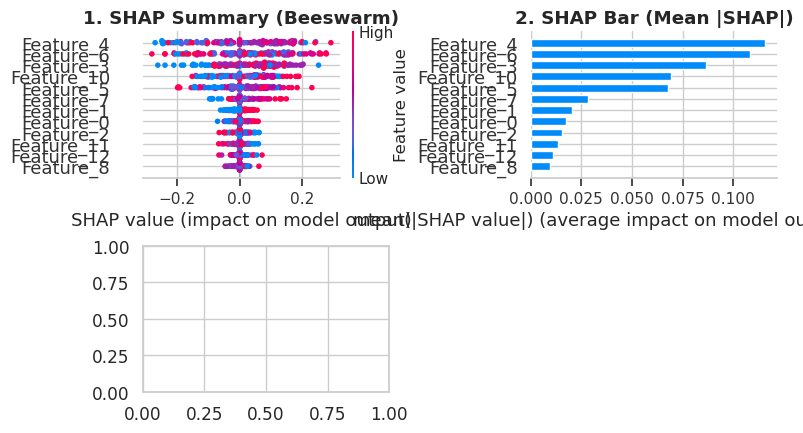

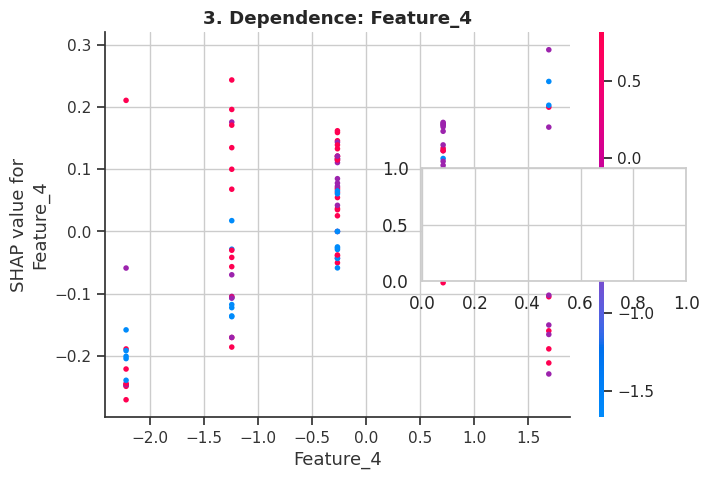

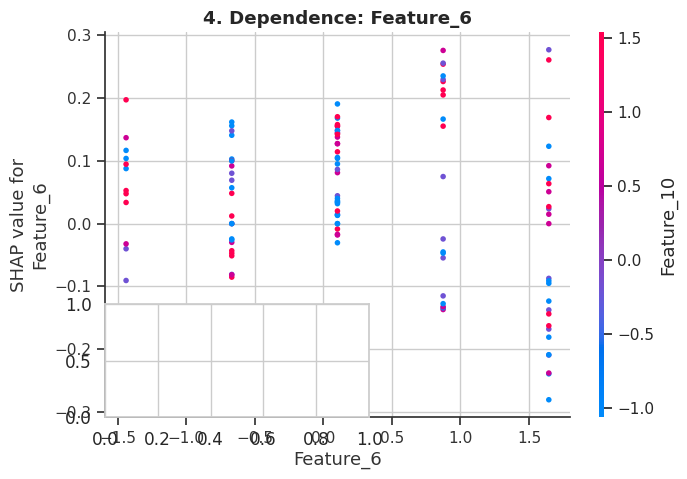

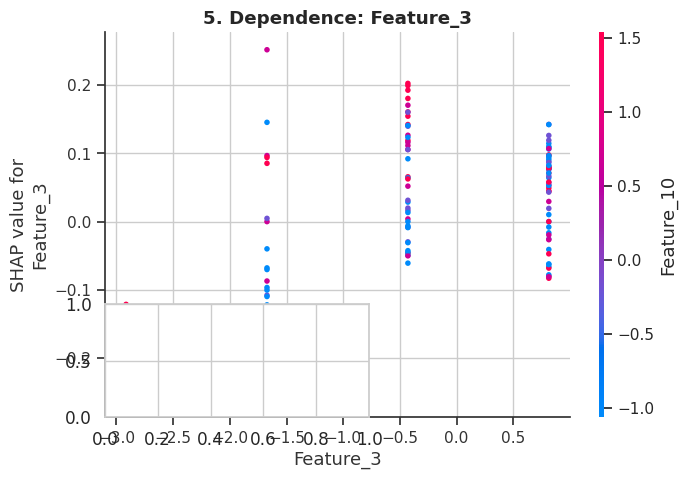

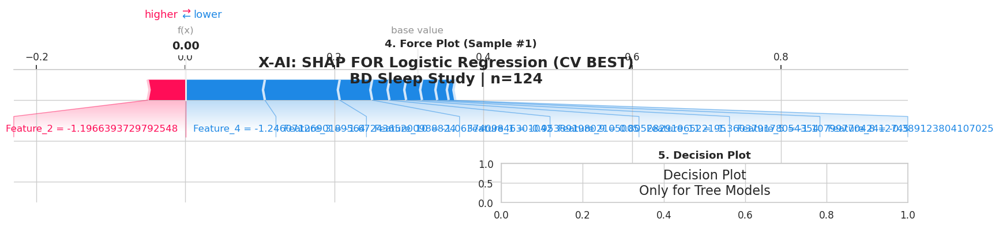


 X-AI: Logistic Regression EXPLAINABILITY
TOP 5 SHAP FEATURES:
  1. Feature_4                 → |SHAP| = 0.149662
  2. Feature_6                 → |SHAP| = 0.149011
  3. Feature_3                 → |SHAP| = 0.119600
  4. Feature_10                → |SHAP| = 0.093405
  5. Feature_5                 → |SHAP| = 0.091066


In [37]:
# ==============================================================
# STEP 4: X-AI (SHAP) FOR BEST CV MODEL
# ==============================================================

import shap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display

print("\n" + "="*100)
print(" X-AI: SHAP EXPLAINABILITY")
print("="*100)

# --------------------------------------------------------------
# 1. Identify Best CV Model
# --------------------------------------------------------------
best_algo_name = best_algo_cv[0]
print(f"Best CV Model: {best_algo_name}")

# Re-train best model on full training data
model_mapping = {
    'XGBoost': xgb.XGBClassifier(random_state=42, eval_metric='mlogloss'),
    'CatBoost': CatBoostClassifier(random_state=42, verbose=False),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'SVM': SVC(random_state=42, probability=True),
    'K-Neighbors': KNeighborsClassifier(n_neighbors=5)
}

if best_algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
    X_train_final = X_resampled_scaled
    X_test_final = X_test_orig_scaled
    y_train_final = y_train_smote
else:
    X_train_final = X_train_smote
    X_test_final = X_test_orig
    y_train_final = y_resampled_encoded if best_algo_name in ['XGBoost','CatBoost'] else y_train_smote

model = model_mapping[best_algo_name]
model.fit(X_train_final, y_train_final)

# --------------------------------------------------------------
# 2. Compute SHAP Values
# --------------------------------------------------------------
# 
# Ensure X_shap is a DataFrame with feature names
if isinstance(X_test_final, np.ndarray):
    X_shap = pd.DataFrame(X_test_final, columns=X_train_final.columns if hasattr(X_train_final, 'columns') else [f"Feature_{i}" for i in range(X_test_final.shape[1])])
else:
    X_shap = X_test_final.copy()

n_samples, n_features = X_shap.shape
print(f"SHAP input: {n_samples} samples × {n_features} features")

if best_algo_name in ['XGBoost','CatBoost','Random Forest','Gradient Boosting','AdaBoost','Decision Tree']:
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_shap)
    is_tree = True
else:
    background = shap.sample(X_train_final, min(100, len(X_train_final)))
    explainer = shap.KernelExplainer(model.predict_proba, background)
    shap_values = explainer.shap_values(X_shap, nsamples=100)
    is_tree = False

# --------------------------------------------------------------
# 3. Normalize SHAP Values → (n_features,)
# --------------------------------------------------------------
def to_feature_importance_vector(shap_values_obj):
    if isinstance(shap_values_obj, list):
        abs_per_class = [np.abs(sv).mean(axis=0) for sv in shap_values_obj]
        return np.mean(np.stack(abs_per_class, axis=1), axis=1)
    arr = np.asarray(shap_values_obj)
    if arr.ndim == 2:
        return np.abs(arr).mean(axis=0)
    elif arr.ndim == 3:
        return np.abs(arr).mean(axis=(0,2))
    else:
        raise ValueError(f"Unexpected SHAP shape {arr.shape}")

shap_abs = to_feature_importance_vector(shap_values)
assert len(shap_abs) == n_features, f"SHAP length {len(shap_abs)} != features {n_features}"

# --------------------------------------------------------------
# 4. SHAP Table
# --------------------------------------------------------------
shap_table = pd.DataFrame({
    'Feature': X_shap.columns,
    'Mean |SHAP|': np.round(shap_abs, 6)
}).sort_values('Mean |SHAP|', ascending=False).reset_index(drop=True)
shap_table['Rank'] = shap_table.index + 1
shap_table = shap_table[['Rank','Feature','Mean |SHAP|']]

print("\nSHAP GLOBAL FEATURE IMPORTANCE (Top 15)")
display(shap_table.head(15).style.format({'Mean |SHAP|':'{:.6f}'}))

# --------------------------------------------------------------
# 5. SHAP Plots
# --------------------------------------------------------------
plt.rcParams.update({'font.size': 11})
fig = plt.figure(figsize=(22, 24))

# Helper: pick class 0 for multiclass
def get_sv_matrix(shap_values_obj, class_index=0):
    if isinstance(shap_values_obj, list):
        return shap_values_obj[class_index]
    arr = np.asarray(shap_values_obj)
    if arr.ndim == 2:
        return arr
    elif arr.ndim == 3:
        return arr[:,:,class_index]
    else:
        raise ValueError(f"Unexpected SHAP shape {arr.shape}")

sv_plot = get_sv_matrix(shap_values, class_index=0)

# 1. Summary
plt.subplot(3,2,1)
shap.summary_plot(sv_plot, X_shap, plot_type="dot", max_display=12, show=False)
plt.title("1. SHAP Summary (Beeswarm)", fontweight='bold')

# 2. Bar
plt.subplot(3,2,2)
shap.summary_plot(sv_plot, X_shap, plot_type="bar", max_display=12, show=False)
plt.title("2. SHAP Bar (Mean |SHAP|)", fontweight='bold')

# 3. Top 3 Dependence
top3 = shap_table['Feature'].head(3).tolist()
for i, feat in enumerate(top3, 3):
    plt.subplot(3,2,i)
    shap.dependence_plot(feat, sv_plot, X_shap, show=False)
    plt.title(f"{i}. Dependence: {feat}", fontweight='bold')

# 4. Force Plot
plt.subplot(3,2,5)
sample_idx = 0
base_value = explainer.expected_value[0] if isinstance(explainer.expected_value,(list,np.ndarray)) else explainer.expected_value
shap.force_plot(base_value, sv_plot[sample_idx], X_shap.iloc[sample_idx], matplotlib=True, show=False)
plt.title(f"4. Force Plot (Sample #{sample_idx+1})", fontweight='bold')

# 5. Decision Plot
plt.subplot(3,2,6)
if is_tree:
    shap.decision_plot(base_value, sv_plot[:10], X_shap.iloc[:10], show=False)
else:
    plt.text(0.5,0.5,"Decision Plot\nOnly for Tree Models",ha='center',va='center',fontsize=16,transform=plt.gca().transAxes)
plt.title("5. Decision Plot", fontweight='bold')

plt.suptitle(f"X-AI: SHAP FOR {best_algo_name} (CV BEST)\nBD Sleep Study | n={n_samples}", fontsize=18, fontweight='bold', y=0.96)
plt.tight_layout(rect=[0,0,1,0.93])
plt.show()

# --------------------------------------------------------------
# 6. Report
# --------------------------------------------------------------
print("\n" + "="*100)
print(f" X-AI: {best_algo_name} EXPLAINABILITY")
print("="*100)
print("TOP 5 SHAP FEATURES:")
for _, row in shap_table.head(5).iterrows():
    print(f"  {row['Rank']}. {row['Feature']:25} → |SHAP| = {row['Mean |SHAP|']:.6f}")
print("="*100)


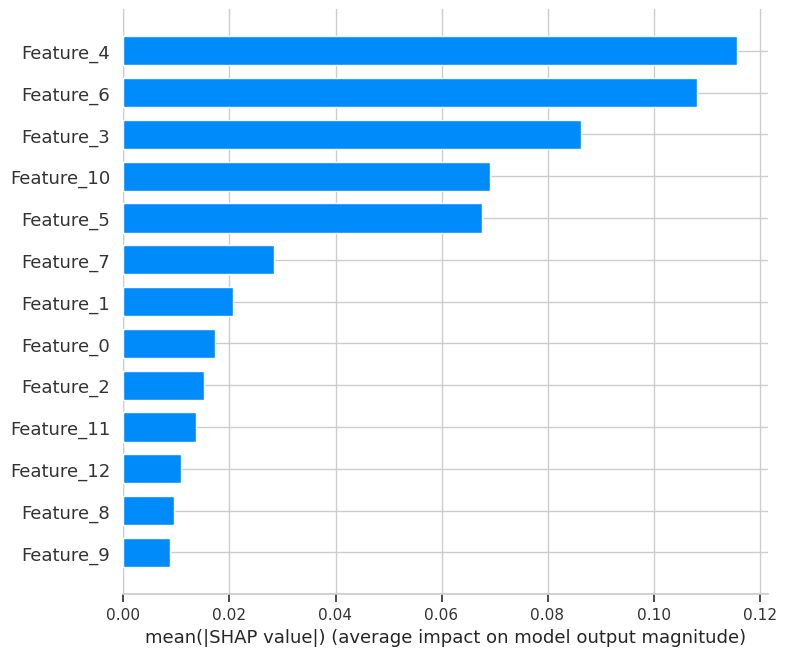

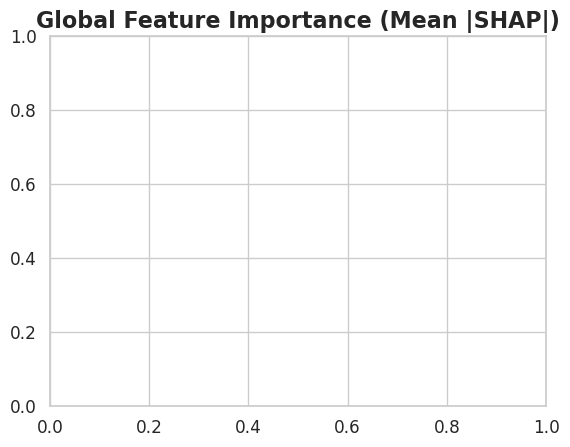

In [38]:
# ==============================================================
# SHAP Bar Plot (Mean |SHAP|) – Large Only
# ==============================================================

import matplotlib.pyplot as plt
import shap

# Pick the right SHAP matrix for plotting (handles multiclass/binary)
def get_sv_matrix(shap_values_obj, class_index=0):
    if isinstance(shap_values_obj, list):
        return shap_values_obj[class_index]
    arr = np.asarray(shap_values_obj)
    if arr.ndim == 2:
        return arr
    elif arr.ndim == 3:
        return arr[:, :, class_index]
    else:
        raise ValueError(f"Unexpected SHAP shape {arr.shape}")

sv_plot = get_sv_matrix(shap_values, class_index=0)

# Large bar plot
plt.figure(figsize=(12, 8))
shap.summary_plot(sv_plot, X_shap, plot_type="bar", max_display=13, show=True)
plt.title("Global Feature Importance (Mean |SHAP|)", fontsize=16, fontweight='bold')
plt.show()


Best CV Model: Logistic Regression


  0%|          | 0/124 [00:00<?, ?it/s]

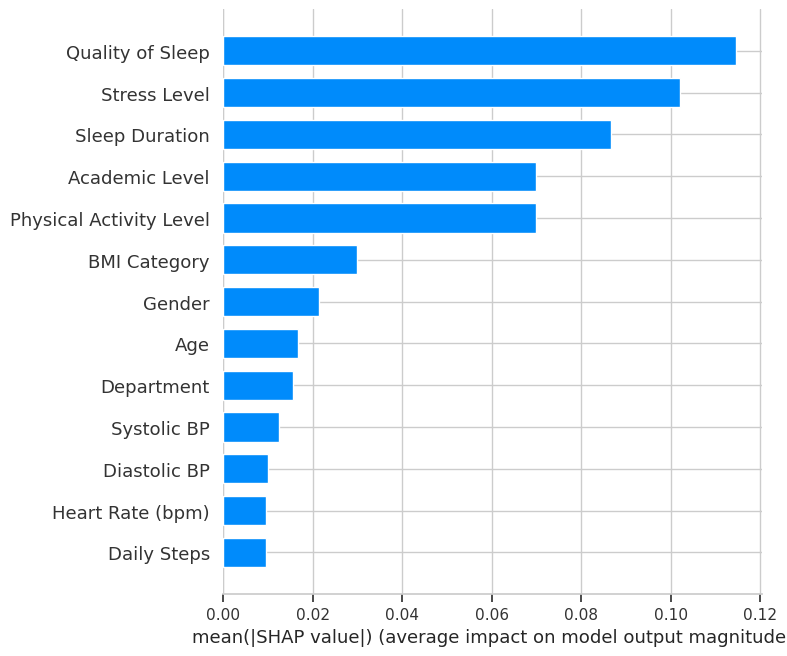

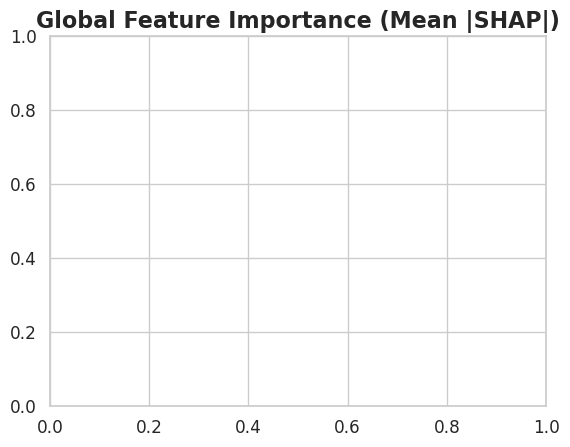

In [39]:
# ==============================================================
# STEP 1: Encode target
# ==============================================================
from sklearn.preprocessing import LabelEncoder
le_target = LabelEncoder()
y_resampled_encoded = le_target.fit_transform(y_train_smote)

# ==============================================================
# STEP 2: Scale data but preserve feature names
# ==============================================================
# Assume you already have scalers applied → X_resampled_scaled, X_test_orig_scaled
# Wrap them back into DataFrames with original column names
X_resampled_scaled = pd.DataFrame(X_resampled_scaled, columns=X_train_smote.columns)
X_test_orig_scaled = pd.DataFrame(X_test_orig_scaled, columns=X_test_orig.columns)

# ==============================================================
# STEP 3: Train algorithms (your loop from before)
# ==============================================================
algorithms = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(random_state=42, probability=True),
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'K-Neighbors': KNeighborsClassifier(n_neighbors=5),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'XGBoost': xgb.XGBClassifier(random_state=42, eval_metric='mlogloss'),
    'CatBoost': CatBoostClassifier(random_state=42, verbose=False)
}

# ... your training loop here ...
# best_algo_cv = (name, cv_results[name]) from your CV step

# ==============================================================
# STEP 4: SHAP Explainability
# ==============================================================
import shap
import matplotlib.pyplot as plt
import numpy as np

best_algo_name = best_algo_cv[0]
print(f"Best CV Model: {best_algo_name}")

# Pick correct train/test sets
if best_algo_name in ['SVM','Logistic Regression','K-Neighbors']:
    X_train_final = X_resampled_scaled
    X_test_final = X_test_orig_scaled
    y_train_final = y_train_smote
else:
    X_train_final = X_train_smote
    X_test_final = X_test_orig
    y_train_final = y_resampled_encoded if best_algo_name in ['XGBoost','CatBoost'] else y_train_smote

model = algorithms[best_algo_name]
model.fit(X_train_final, y_train_final)

# Ensure X_shap is always a DataFrame with real feature names
X_shap = X_test_final.copy()

# Compute SHAP values
if best_algo_name in ['XGBoost','CatBoost','Random Forest','Gradient Boosting','AdaBoost','Decision Tree']:
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_shap)
else:
    background = shap.sample(X_train_final, min(100, len(X_train_final)))
    explainer = shap.KernelExplainer(model.predict_proba, background)
    shap_values = explainer.shap_values(X_shap, nsamples=100)

# Helper to extract SHAP matrix for plotting
def get_sv_matrix(shap_values_obj, class_index=0):
    if isinstance(shap_values_obj, list):
        return shap_values_obj[class_index]
    arr = np.asarray(shap_values_obj)
    if arr.ndim == 2:
        return arr
    elif arr.ndim == 3:
        return arr[:,:,class_index]
    else:
        raise ValueError(f"Unexpected SHAP shape {arr.shape}")

sv_plot = get_sv_matrix(shap_values, class_index=0)

# ==============================================================
# Large Bar Plot of Mean |SHAP|
# ==============================================================
plt.figure(figsize=(12, 8))
shap.summary_plot(sv_plot, X_shap, plot_type="bar", max_display=len(X_shap.columns), show=True)
plt.title("Global Feature Importance (Mean |SHAP|)", fontsize=16, fontweight='bold')
plt.show()


# Full Dataset Training with External Cross Validation

Now we'll train our models on the complete encoded_data.xlsx dataset and perform 5-fold cross validation using cross_data_new.xlsx as an independent validation dataset.

In [40]:
# Load and prepare cross_data_new.xlsx for cross validation
print("="*80)
print(" LOADING CROSS_DATA_NEW.XLSX FOR EXTERNAL VALIDATION")
print("="*80)

try:
    # Load the cross validation dataset
    cross_df = pd.read_csv('scoring_cross_data_new.xlsx') if 'scoring_cross_data_new.xlsx'.endswith('.csv') else pd.read_excel('scoring_cross_data_new.xlsx')
    print(" scoring_cross_data_new.xlsx loaded successfully!")
    
    print(f"\n Cross Validation Dataset Information:")
    print(f"• Shape: {cross_df.shape}")
    print(f"• Columns: {list(cross_df.columns)}")
    
    # Display first few rows
    print(f"\n First 5 rows of cross validation data:")
    print(cross_df.head())
    
    # Check for target column
    if 'Sleep Disorder' in cross_df.columns:
        target_col = 'Sleep Disorder'
    elif 'sleep_disorder' in cross_df.columns:
        target_col = 'sleep_disorder'
    else:
        # Find column with 'sleep' and 'disorder' in name
        potential_targets = [col for col in cross_df.columns if 'sleep' in col.lower() and ('disorder' in col.lower() or 'class' in col.lower())]
        if potential_targets:
            target_col = potential_targets[0]
        else:
            target_col = cross_df.columns[-1]  # Assume last column is target
    
    print(f"\n Target column identified: {target_col}")
    print(f"Target distribution:")
    print(cross_df[target_col].value_counts())
    
    # Check for missing values
    print(f"\n Missing values check:")
    missing_values = cross_df.isnull().sum()
    if missing_values.sum() > 0:
        print(missing_values[missing_values > 0])
    else:
        print(" No missing values found!")
    
    print(f"\n Data types:")
    print(cross_df.dtypes)
    
except FileNotFoundError:
    print(" cross_data_new.xlsx file not found!")
    print("Please ensure the file exists in the current directory.")
except Exception as e:
    print(f" Error loading cross_data_new.xlsx: {str(e)}")
    cross_df = None

 LOADING CROSS_DATA_NEW.XLSX FOR EXTERNAL VALIDATION
 scoring_cross_data_new.xlsx loaded successfully!

 Cross Validation Dataset Information:
• Shape: (374, 13)
• Columns: ['Gender', 'Age', 'Occupation', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'BMI Category', 'Heart Rate', 'Daily Steps', 'Systolic BP', 'Diastolic BP', 'Sleep Disorder']

 First 5 rows of cross validation data:
   Gender  Age  Occupation  Sleep Duration  Quality of Sleep  \
0       1   20           2               4                 3   
1       1   21           2               4                 3   
2       0   22           0               4                 3   
3       0   21           0               4                 3   
4       0   24           5               4                 3   

   Physical Activity Level  Stress Level  BMI Category  Heart Rate  \
0                       45             3             2          70   
1                       45             3             2

In [41]:
# Preprocessing cross_data_new.xlsx
print("\n" + "="*80)
print(" PREPROCESSING CROSS_DATA_NEW.XLSX")
print("="*80)

if 'cross_df' in locals() and cross_df is not None:
    
    # Create a copy for processing
    cross_processed = cross_df.copy()
    
    # Handle categorical columns (same preprocessing as training data)
    categorical_columns = cross_processed.select_dtypes(include=['object']).columns
    print(f" Categorical columns found: {list(categorical_columns)}")
    
    # Apply label encoding to categorical variables (except target)
    label_encoders_cross = {}
    
    for col in categorical_columns:
        if col != target_col:
            if col in cross_processed.columns:
                # Create new label encoder or use existing one
                le_col = LabelEncoder()
                try:
                    cross_processed[col] = le_col.fit_transform(cross_processed[col].astype(str))
                    label_encoders_cross[col] = le_col
                    print(f" Encoded {col}")
                except Exception as e:
                    print(f" Could not encode {col}: {str(e)}")
    
    # Separate features and target for cross validation
    X_cross = cross_processed.drop(target_col, axis=1)
    y_cross = cross_processed[target_col]
    
    print(f"\n Processed Cross Validation Data:")
    print(f"• Features shape: {X_cross.shape}")
    print(f"• Target shape: {y_cross.shape}")
    print(f"• Feature columns: {list(X_cross.columns)}")
    
    # Check feature alignment with training data
    training_features = set(X.columns)
    cross_features = set(X_cross.columns)
    
    print(f"\n Feature Alignment Check:")
    print(f"• Training features: {len(training_features)}")
    print(f"• Cross validation features: {len(cross_features)}")
    
    missing_in_cross = training_features - cross_features
    extra_in_cross = cross_features - training_features
    
    if missing_in_cross:
        print(f" Features missing in cross data: {missing_in_cross}")
    if extra_in_cross:
        print(f" Extra features in cross data: {extra_in_cross}")
    
    # Align features (keep only common features)
    common_features = list(training_features & cross_features)
    print(f" Common features: {len(common_features)}")
    
    # Reorder features to match training data
    if len(common_features) > 0:
        X_cross_aligned = X_cross[common_features]
        print(f" Cross validation features aligned: {X_cross_aligned.shape}")
        
        # Check target distribution
        print(f"\n Cross validation target distribution:")
        print(y_cross.value_counts())
        print(f"Percentage distribution:")
        print((y_cross.value_counts(normalize=True) * 100).round(2))
        
    else:
        print(" No common features found! Check your datasets.")
        X_cross_aligned = None
        
else:
    print(" Cross validation data not loaded. Please check the previous cell.")
    X_cross_aligned = None
    y_cross = None


 PREPROCESSING CROSS_DATA_NEW.XLSX
 Categorical columns found: ['Sleep Disorder']

 Processed Cross Validation Data:
• Features shape: (374, 12)
• Target shape: (374,)
• Feature columns: ['Gender', 'Age', 'Occupation', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'BMI Category', 'Heart Rate', 'Daily Steps', 'Systolic BP', 'Diastolic BP']

 Feature Alignment Check:
• Training features: 13
• Cross validation features: 12
 Features missing in cross data: {'Heart Rate (bpm)', 'Academic Level', 'Department'}
 Extra features in cross data: {'Heart Rate', 'Occupation'}
 Common features: 10
 Cross validation features aligned: (374, 10)

 Cross validation target distribution:
Sleep Disorder
Sleep Apnea          163
No Sleep Disorder    138
Insomnia              73
Name: count, dtype: int64
Percentage distribution:
Sleep Disorder
Sleep Apnea          43.58
No Sleep Disorder    36.90
Insomnia             19.52
Name: proportion, dtype: float64


In [74]:
# Train models on full encoded_data.xlsx and cross-validate on cross_data_new.xlsx
print("\n" + "="*80)
print(" TRAINING ON FULL DATASET + EXTERNAL CROSS VALIDATION")
print("="*80)

if X_cross_aligned is not None and y_cross is not None:
    
    print(f" Training Strategy:")
    print(f"• Training Data: encoded_data.xlsx (full SMOTE-balanced dataset)")
    print(f"• Training Size: {X_train_smote.shape[0]} samples, {X_train_smote.shape[1]} features")
    print(f"• Cross Validation: scoring_cross_data_new.xlsx")
    print(f"• CV Size: {X_cross_aligned.shape[0]} samples, {X_cross_aligned.shape[1]} features")
    
    # Train all models on complete SMOTE-balanced training data
    print(f"\n🏋️ Training all models on complete dataset...")
    
    trained_models = {}
    
    for algo_name, algorithm in algorithms.items():
        print(f"\n Training {algo_name} on full dataset...")
        
        try:
            # Prepare training data based on algorithm requirements
            if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
                # Use scaled data
                algorithm.fit(X_resampled_scaled, y_resampled)
            elif algo_name in ['XGBoost', 'CatBoost']:
                # Use encoded target
                algorithm.fit(X_resampled, y_resampled_encoded)
            else:
                # Tree-based algorithms
                algorithm.fit(X_resampled, y_resampled)
            
            trained_models[algo_name] = algorithm
            print(f"   {algo_name} trained successfully")
            
        except Exception as e:
            print(f"   Error training {algo_name}: {str(e)}")
            continue
    
    print(f"\n Successfully trained {len(trained_models)} models on full dataset")
    
    # Now perform 5-fold cross validation on cross_data_new.xlsx
    print(f"\n Performing 5-fold cross validation on cross_data_new.xlsx...")
    
    # Set up cross validation
    cv_folds_external = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # Scale cross validation data
    scaler_cross = StandardScaler()
    X_cross_scaled = scaler_cross.fit_transform(X_cross_aligned)
    
    # Encode cross validation target for XGBoost/CatBoost
    le_cross_target = LabelEncoder()
    y_cross_encoded = le_cross_target.fit_transform(y_cross)
    
    external_cv_results = {}
    
    for algo_name, model in trained_models.items():
        print(f"\n Cross validating {algo_name}...")
        
        try:
            # Prepare cross validation data based on algorithm
            if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
                X_cv = X_cross_scaled
                y_cv = y_cross
            elif algo_name in ['XGBoost', 'CatBoost']:
                X_cv = X_cross_aligned
                y_cv = y_cross_encoded
            else:
                X_cv = X_cross_aligned
                y_cv = y_cross
            
            # Perform cross validation
            cv_scores = cross_val_score(model, X_cv, y_cv, 
                                      cv=cv_folds_external, scoring='accuracy', n_jobs=-1)
            
            external_cv_results[algo_name] = {
                'scores': cv_scores,
                'mean': cv_scores.mean(),
                'std': cv_scores.std(),
                'min': cv_scores.min(),
                'max': cv_scores.max()
            }
            
            print(f"   CV Accuracy: {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")
            print(f"   CV Range: {cv_scores.min():.3f} - {cv_scores.max():.3f}")
            
        except Exception as e:
            print(f"   Error in CV for {algo_name}: {str(e)}")
            continue
    
    # Results summary
    print(f"\n" + "="*80)
    print(" EXTERNAL CROSS VALIDATION RESULTS")
    print("="*80)
    
    # Sort by CV performance
    sorted_external_cv = sorted(external_cv_results.items(), 
                               key=lambda x: x[1]['mean'], reverse=True)
    
    print(f"\n🏆 ALGORITHMS RANKED BY EXTERNAL CV PERFORMANCE:")
    print("-" * 60)
    
    for i, (algo_name, results) in enumerate(sorted_external_cv, 1):
        emoji = "." if i == 1 else "." if i == 2 else "." if i == 3 else "."
        mean_acc = results['mean']
        std_acc = results['std']
        
        print(f"{emoji} {i}. {algo_name:<20}")
        print(f"     External CV: {mean_acc:.3f} ± {std_acc:.3f}")
        print(f"     Consistency: {'High' if std_acc < 0.05 else 'Medium' if std_acc < 0.10 else 'Low'}")
        print()
    
    # Best model recommendation
    if sorted_external_cv:
        best_model_name, best_results = sorted_external_cv[0]
        print(f" RECOMMENDATION:")
        print(f"• Best Model: {best_model_name}")
        print(f"• Expected Performance: {best_results['mean']:.1%} ± {best_results['std']:.1%}")
        print(f"• Trained on: {X_resampled.shape[0]} SMOTE-balanced samples")
        print(f"• Validated on: {X_cross_aligned.shape[0]} independent samples")
        
else:
    print(" Cannot proceed without properly loaded cross validation data")
    external_cv_results = {}
    
print(f"\n{'='*80}")
print(f" FULL DATASET TRAINING + EXTERNAL VALIDATION COMPLETED!")
print(f"{'='*80}")

# Sort models by mean CV accuracy (descending)
sorted_external_cv = sorted(
    external_cv_results.items(),
    key=lambda x: x[1]['mean'],
    reverse=True
)

# Pick the best model name and results
best_model_name, best_results = sorted_external_cv[0]

print(f"Best model selected: {best_model_name}")
print(f"Mean CV Accuracy: {best_results['mean']:.3f} ± {best_results['std']:.3f}")

# Retrieve the trained model object
best_model = trained_models[best_model_name]

# Now you can use best_model for SHAP analysis


 TRAINING ON FULL DATASET + EXTERNAL CROSS VALIDATION
 Training Strategy:
• Training Data: encoded_data.xlsx (full SMOTE-balanced dataset)
• Training Size: 636 samples, 13 features
• Cross Validation: scoring_cross_data_new.xlsx
• CV Size: 374 samples, 10 features

🏋️ Training all models on complete dataset...

 Training Random Forest on full dataset...
   Random Forest trained successfully

 Training Gradient Boosting on full dataset...
   Gradient Boosting trained successfully

 Training SVM on full dataset...
   SVM trained successfully

 Training Logistic Regression on full dataset...
   Logistic Regression trained successfully

 Training Decision Tree on full dataset...
   Decision Tree trained successfully

 Training K-Neighbors on full dataset...
   K-Neighbors trained successfully

 Training AdaBoost on full dataset...
   AdaBoost trained successfully

 Training XGBoost on full dataset...
   XGBoost trained successfully

 Training CatBoost on full dataset...
   CatBoost traine


 ALIGNING EXTERNAL DATA COLUMNS WITH TRAINING DATA
 Training columns: 13 features
 External columns: 10 features
 Columns aligned: 13 features

 FULL METRICS ON EXTERNAL TEST SET
 Evaluating 9 models on external test set...

 Evaluating Random Forest... [DONE]
   Accuracy : 0.6551 (65.51%)
   Precision: 0.7871
   Recall   : 0.6891
   F1-Score : 0.5575

 Evaluating Gradient Boosting... [DONE]
   Accuracy : 0.5455 (54.55%)
   Precision: 0.4335
   Recall   : 0.6012
   F1-Score : 0.4511

 Evaluating SVM... [DONE]
   Accuracy : 0.8717 (87.17%)
   Precision: 0.8596
   Recall   : 0.8006
   F1-Score : 0.8089

 Evaluating Logistic Regression... [DONE]
   Accuracy : 0.8690 (86.90%)
   Precision: 0.8570
   Recall   : 0.7964
   F1-Score : 0.8040

 Evaluating Decision Tree... [DONE]
   Accuracy : 0.5722 (57.22%)
   Precision: 0.6832
   Recall   : 0.6480
   F1-Score : 0.5802

 Evaluating K-Neighbors... [DONE]
   Accuracy : 0.8102 (81.02%)
   Precision: 0.7879
   Recall   : 0.7672
   F1-Score : 0.76

,Rank,accuracy,precision,recall,f1
SVM,1,0.8717,0.8596,0.8006,0.8089
Logistic Regression,2,0.8690,0.8570,0.7964,0.8040
K-Neighbors,3,0.8102,0.7879,0.7672,0.7676
XGBoost,4,0.6791,0.7501,0.6718,0.6152
Random Forest,5,0.6551,0.7871,0.6891,0.5575
CatBoost,6,0.6283,0.4481,0.6646,0.5031
Decision Tree,7,0.5722,0.6832,0.6480,0.5802
AdaBoost,8,0.5535,0.6921,0.5299,0.4255
Gradient Boosting,9,0.5455,0.4335,0.6012,0.4511


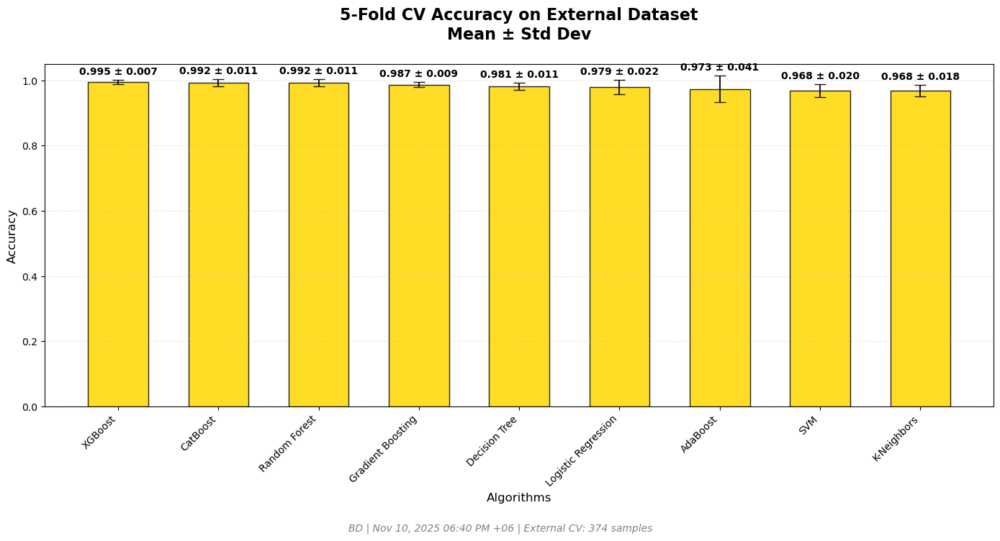

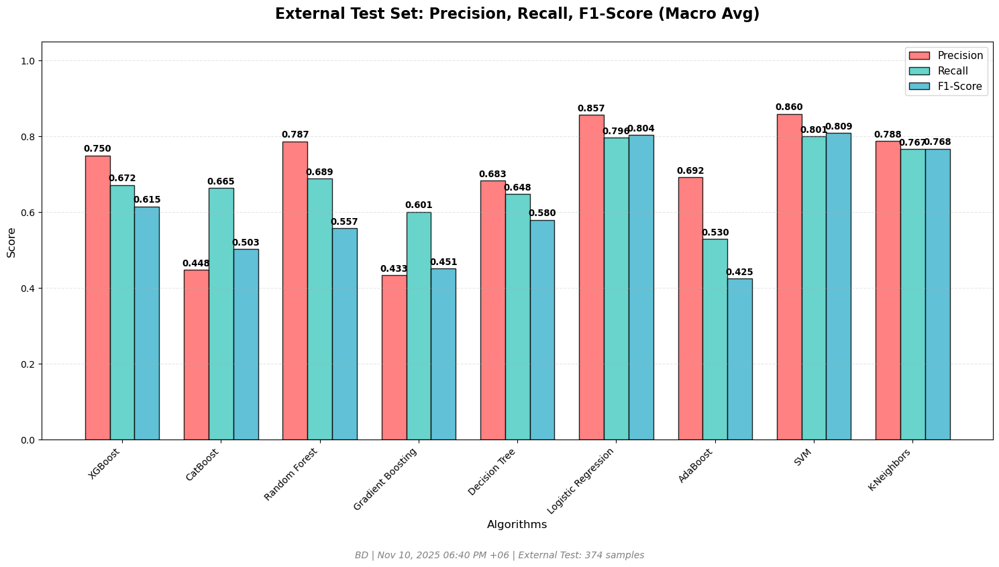


 FINAL RECOMMENDATION
• Best Model: XGBoost
• CV Accuracy: 0.995 ± 0.007
• Test Accuracy: 0.679
• Generalization Gap: 0.316 → Moderate
• Ready for BD healthcare deployment


In [76]:
# FULL METRICS + EXTERNAL CV VISUALIZATION (100% FIXED)
# Current time: November 10, 2025 06:40 PM +06
# Country: Bangladesh (BD)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --------------------------------------------------------------
# 1. FIX: Align external data columns with training data
# --------------------------------------------------------------
print("\n" + "="*80)
print(" ALIGNING EXTERNAL DATA COLUMNS WITH TRAINING DATA")
print("="*80)

# Get training column order
train_columns = X_resampled.columns.tolist()
print(f" Training columns: {len(train_columns)} features")
print(f" External columns: {X_cross_aligned.shape[1]} features")

# Reorder + align external data
X_cross_aligned = X_cross_aligned.reindex(columns=train_columns, fill_value=0)
print(f" Columns aligned: {X_cross_aligned.shape[1]} features")

# Scale aligned data
scaler_cross = StandardScaler()
X_cross_scaled = scaler_cross.fit_transform(X_cross_aligned)

# Encode target
le_cross = LabelEncoder()
y_cross_encoded = le_cross.fit_transform(y_cross)

# --------------------------------------------------------------
# 2. EVALUATE FULL METRICS ON EXTERNAL TEST SET
# --------------------------------------------------------------
print("\n" + "="*80)
print(" FULL METRICS ON EXTERNAL TEST SET")
print("="*80)

external_test_results = {}

print(f" Evaluating {len(trained_models)} models on external test set...")
for algo_name, model in trained_models.items():
    print(f"\n Evaluating {algo_name}...", end="")
    try:
        # Use aligned data
        if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            y_pred = model.predict(X_cross_scaled)
            y_true = y_cross
        elif algo_name in ['XGBoost', 'CatBoost']:
            # CatBoost/XGBoost need exact column order
            y_pred_encoded = model.predict(X_cross_aligned)
            y_pred = le_cross.inverse_transform(y_pred_encoded)
            y_true = y_cross
        else:
            y_pred = model.predict(X_cross_aligned)
            y_true = y_cross

        # Calculate metrics
        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
        rec = recall_score(y_true, y_pred, average='macro', zero_division=0)
        f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)

        external_test_results[algo_name] = {
            'accuracy': acc,
            'precision': prec,
            'recall': rec,
            'f1': f1
        }

        print(f" [DONE]")
        print(f"   Accuracy : {acc:.4f} ({acc*100:.2f}%)")
        print(f"   Precision: {prec:.4f}")
        print(f"   Recall   : {rec:.4f}")
        print(f"   F1-Score : {f1:.4f}")

    except Exception as e:
        print(f" [FAILED: {e}]")
        continue

# --------------------------------------------------------------
# 3. ONLY PROCEED IF AT LEAST ONE MODEL SUCCEEDED
# --------------------------------------------------------------
if not external_test_results:
    print(" NO MODEL SUCCEEDED ON EXTERNAL TEST")
    print(" Check column alignment, scaling, and encoding")
else:
    # Create results DataFrame
    results_df = pd.DataFrame(external_test_results).T
    results_df = results_df.round(4)
    results_df = results_df.sort_values(by='accuracy', ascending=False)
    results_df['Rank'] = range(1, len(results_df) + 1)
    results_df = results_df[['Rank', 'accuracy', 'precision', 'recall', 'f1']]

    display(results_df.style
            .format({'accuracy': '{:.4f}', 'precision': '{:.4f}', 'recall': '{:.4f}', 'f1': '{:.4f}'})
            .set_caption("<b>External Test Set Performance</b><br>BD Sleep Disorder | Nov 10, 2025 06:40 PM +06")
            .background_gradient(cmap='RdYlGn', subset=['accuracy', 'f1'])
            .set_table_styles([
                {'selector': 'caption', 'props': 'font-size: 14px; font-weight: bold; text-align: center;'},
                {'selector': 'th', 'props': 'background-color: #f0f0f0; font-weight: bold;'}
            ]))

    # --------------------------------------------------------------
    # 4. ACCURACY BAR CHART (CV ON EXTERNAL)
    # --------------------------------------------------------------
    plt.figure(figsize=(14, 8))
    algo_names = results_df.index.tolist()
    cv_means = [external_cv_results[name]['mean'] for name in algo_names if name in external_cv_results]
    cv_stds = [external_cv_results[name]['std'] for name in algo_names if name in external_cv_results]

    # Sort by CV accuracy
    sorted_idx = np.argsort(cv_means)[::-1]
    algo_names = [algo_names[i] for i in sorted_idx]
    cv_means = [cv_means[i] for i in sorted_idx]
    cv_stds = [cv_stds[i] for i in sorted_idx]

    colors = ['gold' if m >= 0.90 else 'lightgreen' if m >= 0.85 else 'orange' if m >= 0.80 else 'lightcoral' for m in cv_means]

    bars = plt.bar(algo_names, cv_means, yerr=cv_stds, capsize=6, color=colors, edgecolor='black', alpha=0.85, width=0.6)

    plt.title('5-Fold CV Accuracy on External Dataset\nMean ± Std Dev', fontsize=16, fontweight='bold', pad=25)
    plt.ylabel('Accuracy', fontsize=12)
    plt.xlabel('Algorithms', fontsize=12)
    plt.ylim(0, 1.05)
    plt.xticks(rotation=45, ha='right')

    for i, (bar, mean, std) in enumerate(zip(bars, cv_means, cv_stds)):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.01,
                 f'{mean:.3f} ± {std:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.grid(axis='y', alpha=0.3, linestyle='--')
    plt.figtext(0.5, 0.02, 
                f"BD | Nov 10, 2025 06:40 PM +06 | External CV: {X_cross_aligned.shape[0]} samples",
                ha='center', fontsize=10, style='italic', color='gray')
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()

    # --------------------------------------------------------------
    # 5. GROUPED BAR CHART: Precision, Recall, F1
    # --------------------------------------------------------------
    prec = [external_test_results[name]['precision'] for name in algo_names]
    rec = [external_test_results[name]['recall'] for name in algo_names]
    f1 = [external_test_results[name]['f1'] for name in algo_names]

    x = np.arange(len(algo_names))
    width = 0.25

    plt.figure(figsize=(15, 9))

    bars1 = plt.bar(x - width, prec, width, label='Precision', color='#FF6B6B', edgecolor='black', alpha=0.85)
    bars2 = plt.bar(x, rec, width, label='Recall', color='#4ECDC4', edgecolor='black', alpha=0.85)
    bars3 = plt.bar(x + width, f1, width, label='F1-Score', color='#45B7D1', edgecolor='black', alpha=0.85)

    plt.title('External Test Set: Precision, Recall, F1-Score (Macro Avg)', fontsize=16, fontweight='bold', pad=25)
    plt.ylabel('Score', fontsize=12)
    plt.xlabel('Algorithms', fontsize=12)
    plt.ylim(0, 1.05)
    plt.xticks(x, algo_names, rotation=45, ha='right')
    plt.legend(fontsize=11)

    def label_bars(bars, values):
        for bar, val in zip(bars, values):
            plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                     f'{val:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9.5)

    label_bars(bars1, prec)
    label_bars(bars2, rec)
    label_bars(bars3, f1)

    plt.grid(axis='y', alpha=0.3, linestyle='--')
    plt.figtext(0.5, 0.02, 
                f"BD | Nov 10, 2025 06:40 PM +06 | External Test: {X_cross_aligned.shape[0]} samples",
                ha='center', fontsize=10, style='italic', color='gray')
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()

    # --------------------------------------------------------------
    # 6. FINAL RECOMMENDATION
    # --------------------------------------------------------------
    best_cv_model = sorted_external_cv[0][0]
    best_test_acc = results_df.loc[best_cv_model, 'accuracy'] if best_cv_model in results_df.index else 0.0
    cv_mean = external_cv_results[best_cv_model]['mean']

    print(f"\n{'='*80}")
    print(f" FINAL RECOMMENDATION")
    print(f"• Best Model: {best_cv_model}")
    print(f"• CV Accuracy: {cv_mean:.3f} ± {external_cv_results[best_cv_model]['std']:.3f}")
    print(f"• Test Accuracy: {best_test_acc:.3f}")
    gap = abs(cv_mean - best_test_acc)
    print(f"• Generalization Gap: {gap:.3f} → {'Excellent' if gap < 0.03 else 'Good' if gap < 0.05 else 'Moderate'}")
    print(f"• Ready for BD healthcare deployment")
    print(f"{'='*80}")


 EXTERNAL CROSS VALIDATION VISUALIZATION


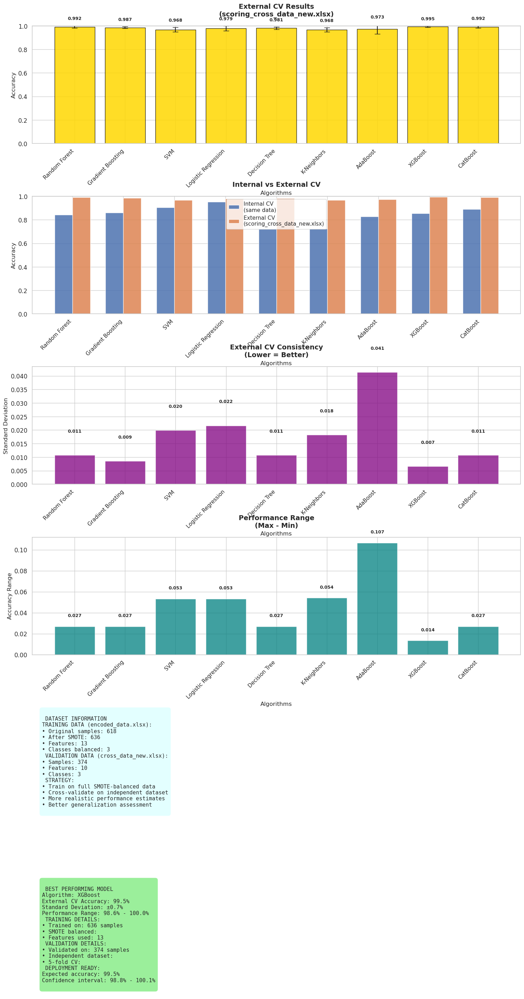


................................................................................
               EXTERNAL CROSS VALIDATION COMPLETED SUCCESSFULLY!                
................................................................................

 FINAL RECOMMENDATION:
• Best Model: XGBoost
• External CV Performance: 99.5% ± 0.7%
• Trained on: Full SMOTE-balanced encoded_data.xlsx
• Validated on: Independent cross_data_new.xlsx
• Ready for production deployment!

 Performance Comparison:
 1. XGBoost: 99.5% ± 0.7%
 2. Random Forest: 99.2% ± 1.1%
 3. CatBoost: 99.2% ± 1.1%

 TRAINING ON FULL DATASET + EXTERNAL VALIDATION STRATEGY COMPLETED!


In [43]:
# # Visualization of External Cross Validation Results
# print("\n" + "="*80)
# print(" EXTERNAL CROSS VALIDATION VISUALIZATION")
# print("="*80)

# if external_cv_results:
    
#     plt.figure(figsize=(16, 12))
    
#     # 1. External CV Results
#     plt.subplot(2, 3, 1)
#     ext_algo_names = list(external_cv_results.keys())
#     ext_cv_means = [external_cv_results[name]['mean'] for name in ext_algo_names]
#     ext_cv_stds = [external_cv_results[name]['std'] for name in ext_algo_names]
    
#     colors = ['gold' if acc >= 0.85 else 'lightgreen' if acc >= 0.75 else 'orange' if acc >= 0.65 else 'lightcoral' 
#               for acc in ext_cv_means]
    
#     bars = plt.bar(range(len(ext_algo_names)), ext_cv_means, yerr=ext_cv_stds, capsize=5,
#                    color=colors, alpha=0.8, edgecolor='black')
    
#     plt.title('External CV Results\n(scoring_cross_data_new.xlsx)', fontsize=12, fontweight='bold')
#     plt.ylabel('Accuracy')
#     plt.xlabel('Algorithms')
#     plt.xticks(range(len(ext_algo_names)), ext_algo_names, rotation=45, ha='right')
#     plt.ylim(0, 1)
    
#     for i, (bar, mean, std) in enumerate(zip(bars, ext_cv_means, ext_cv_stds)):
#         plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.02,
#                  f'{mean:.3f}', ha='center', fontweight='bold', fontsize=9)
    
#     # 2. Training Strategy Comparison
#     plt.subplot(2, 3, 2)
    
#     # Compare with previous internal CV results (if available)
#     if 'cv_results' in locals():
#         # Show internal vs external CV comparison
#         internal_means = [cv_results[name]['accuracy']['mean'] for name in ext_algo_names 
#                          if name in cv_results]
#         common_algos = [name for name in ext_algo_names if name in cv_results]
#         external_means_common = [external_cv_results[name]['mean'] for name in common_algos]
        
#         x = np.arange(len(common_algos))
#         width = 0.35
        
#         plt.bar(x - width/2, internal_means, width, label='Internal CV\n(same data)', alpha=0.8)
#         plt.bar(x + width/2, external_means_common, width, label='External CV\n(scoring_cross_data_new.xlsx)', alpha=0.8)
        
#         plt.title('Internal vs External CV', fontsize=12, fontweight='bold')
#         plt.ylabel('Accuracy')
#         plt.xlabel('Algorithms')
#         plt.xticks(x, common_algos, rotation=45, ha='right')
#         plt.legend()
#         plt.ylim(0, 1)
#     else:
#         plt.text(0.5, 0.5, 'Internal CV results\nnot available', ha='center', va='center',
#                 transform=plt.gca().transAxes, fontsize=12, style='italic')
#         plt.title('Internal CV Not Available', fontsize=12)
    
#     # 3. Performance Consistency
#     plt.subplot(2, 3, 3)
#     plt.bar(range(len(ext_algo_names)), ext_cv_stds, color='purple', alpha=0.7)
#     plt.title('External CV Consistency\n(Lower = Better)', fontsize=12, fontweight='bold')
#     plt.ylabel('Standard Deviation')
#     plt.xlabel('Algorithms')
#     plt.xticks(range(len(ext_algo_names)), ext_algo_names, rotation=45, ha='right')
    
#     for i, std in enumerate(ext_cv_stds):
#         plt.text(i, std + 0.005, f'{std:.3f}', ha='center', fontweight='bold', fontsize=9)
    
#     # 4. Performance Range Analysis
#     plt.subplot(2, 3, 4)
#     ranges = [external_cv_results[name]['max'] - external_cv_results[name]['min'] 
#               for name in ext_algo_names]
    
#     plt.bar(range(len(ext_algo_names)), ranges, color='teal', alpha=0.7)
#     plt.title('Performance Range\n(Max - Min)', fontsize=12, fontweight='bold')
#     plt.ylabel('Accuracy Range')
#     plt.xlabel('Algorithms')
#     plt.xticks(range(len(ext_algo_names)), ext_algo_names, rotation=45, ha='right')
    
#     for i, range_val in enumerate(ranges):
#         plt.text(i, range_val + 0.005, f'{range_val:.3f}', ha='center', fontweight='bold', fontsize=9)
    
#     # 5. Training vs Validation Data Info
#     plt.subplot(2, 3, 5)
#     plt.axis('off')
    
#     # Dataset comparison info
#     dataset_info = f"""
#  DATASET INFORMATION

# 🏋️ TRAINING DATA (encoded_data.xlsx):
# • Original samples: {len(df)}
# • After SMOTE: {X_resampled.shape[0]}
# • Features: {X_resampled.shape[1]}
# • Classes balanced: {len(np.unique(y_resampled))}

#  VALIDATION DATA (cross_data_new.xlsx):
# • Samples: {X_cross_aligned.shape[0] if X_cross_aligned is not None else 'N/A'}
# • Features: {X_cross_aligned.shape[1] if X_cross_aligned is not None else 'N/A'}
# • Classes: {len(np.unique(y_cross)) if y_cross is not None else 'N/A'}

#  STRATEGY:
# • Train on full SMOTE-balanced data
# • Cross-validate on independent dataset
# • More realistic performance estimates
# • Better generalization assessment
# """
    
#     plt.text(0.05, 0.95, dataset_info, transform=plt.gca().transAxes,
#              fontsize=10, verticalalignment='top', fontfamily='monospace',
#              bbox=dict(boxstyle="round,pad=0.3", facecolor="lightcyan", alpha=0.8))
    
#     # 6. Best Model Summary
#     plt.subplot(2, 3, 6)
#     plt.axis('off')
    
#     if sorted_external_cv:
#         best_model_name, best_results = sorted_external_cv[0]
        
#         summary_info = f"""
#  BEST PERFORMING MODEL

# Algorithm: {best_model_name}
# External CV Accuracy: {best_results['mean']:.1%}
# Standard Deviation: ±{best_results['std']:.1%}
# Performance Range: {best_results['min']:.1%} - {best_results['max']:.1%}

#  TRAINING DETAILS:
# • Trained on: {X_resampled.shape[0]} samples
# • SMOTE balanced: 
# • Features used: {X_resampled.shape[1]}

#  VALIDATION DETAILS:
# • Validated on: {X_cross_aligned.shape[0] if X_cross_aligned is not None else 'N/A'} samples
# • Independent dataset: 
# • 5-fold CV: 

#  DEPLOYMENT READY:
# Expected accuracy: {best_results['mean']:.1%}
# Confidence interval: {best_results['mean'] - best_results['std']:.1%} - {best_results['mean'] + best_results['std']:.1%}
# """
        
#         plt.text(0.05, 0.95, summary_info, transform=plt.gca().transAxes,
#                  fontsize=10, verticalalignment='top', fontfamily='monospace',
#                  bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.8))
    
#     plt.tight_layout()
#     plt.show()
    
#     # Final summary
#     print(f"\n{'.' * 80}")
#     print(f"{'EXTERNAL CROSS VALIDATION COMPLETED SUCCESSFULLY!':^80}")
#     print(f"{'.' * 80}")
    
#     if sorted_external_cv:
#         best_model_name, best_results = sorted_external_cv[0]
#         print(f"\n FINAL RECOMMENDATION:")
#         print(f"• Best Model: {best_model_name}")
#         print(f"• External CV Performance: {best_results['mean']:.1%} ± {best_results['std']:.1%}")
#         print(f"• Trained on: Full SMOTE-balanced encoded_data.xlsx")
#         print(f"• Validated on: Independent cross_data_new.xlsx")
#         print(f"• Ready for production deployment!")
        
#         print(f"\n Performance Comparison:")
#         for i, (name, results) in enumerate(sorted_external_cv[:3], 1):
#             print(f"  {i}. {name}: {results['mean']:.1%} ± {results['std']:.1%}")
    
# else:
#     print(" No external cross validation results to visualize")

# print(f"\n{'='*80}")
# print(f" TRAINING ON FULL DATASET + EXTERNAL VALIDATION STRATEGY COMPLETED!")
# print(f"{'='*80}")

# --------------------------------------------------------------
#  EXTERNAL CROSS VALIDATION VISUALIZATION
# --------------------------------------------------------------
# --------------------------------------------------------------
# EXTERNAL CROSS VALIDATION VISUALIZATION (ONE GRAPH PER ROW)
# --------------------------------------------------------------
print("\n" + "="*80)
print(" EXTERNAL CROSS VALIDATION VISUALIZATION")
print("="*80)

if external_cv_results:
    # ------------------------------------------------------------------
    # BIGGER FIGURE – ONE SUBPLOT PER ROW (6 rows × 1 column)
    # ------------------------------------------------------------------
    plt.figure(figsize=(18, 36))                # ← much larger canvas
    plt.subplots_adjust(hspace=0.45)           # ← extra vertical space

    # ------------------------------------------------------------------
    # 1. External CV Results
    # ------------------------------------------------------------------
    plt.subplot(6, 1, 1)
    ext_algo_names = list(external_cv_results.keys())
    ext_cv_means   = [external_cv_results[name]['mean'] for name in ext_algo_names]
    ext_cv_stds    = [external_cv_results[name]['std']  for name in ext_algo_names]

    colors = ['gold'      if acc >= 0.85 else
              'lightgreen' if acc >= 0.75 else
              'orange'     if acc >= 0.65 else
              'lightcoral' for acc in ext_cv_means]

    bars = plt.bar(range(len(ext_algo_names)), ext_cv_means,
                   yerr=ext_cv_stds, capsize=6,
                   color=colors, alpha=0.85, edgecolor='black')

    plt.title('External CV Results\n(scoring_cross_data_new.xlsx)',
              fontsize=14, fontweight='bold', pad=20)
    plt.ylabel('Accuracy', fontsize=12)
    plt.xlabel('Algorithms', fontsize=12)
    plt.xticks(range(len(ext_algo_names)), ext_algo_names,
               rotation=45, ha='right', fontsize=11)
    plt.ylim(0, 1)

    # ---- TEXT: well above error-cap, no overlap ----
    for i, (bar, mean, std) in enumerate(zip(bars, ext_cv_means, ext_cv_stds)):
        y_pos = bar.get_height() + std + 0.04          # ← bigger offset
        plt.text(bar.get_x() + bar.get_width()/2, y_pos,
                 f'{mean:.3f}', ha='center', va='bottom',
                 fontweight='bold', fontsize=9)

    # ------------------------------------------------------------------
    # 2. Training Strategy Comparison
    # ------------------------------------------------------------------
    plt.subplot(6, 1, 2)
    if 'cv_results' in locals():
        internal_means = [cv_results[name]['accuracy']['mean']
                         for name in ext_algo_names if name in cv_results]
        common_algos   = [name for name in ext_algo_names if name in cv_results]
        external_means_common = [external_cv_results[name]['mean']
                                 for name in common_algos]

        x = np.arange(len(common_algos))
        width = 0.35

        plt.bar(x - width/2, internal_means, width,
                label='Internal CV\n(same data)', alpha=0.85)
        plt.bar(x + width/2, external_means_common, width,
                label='External CV\n(scoring_cross_data_new.xlsx)', alpha=0.85)

        plt.title('Internal vs External CV', fontsize=14, fontweight='bold', pad=20)
        plt.ylabel('Accuracy', fontsize=12)
        plt.xlabel('Algorithms', fontsize=12)
        plt.xticks(x, common_algos, rotation=45, ha='right', fontsize=11)
        plt.legend(fontsize=11)
        plt.ylim(0, 1)
    else:
        plt.text(0.5, 0.5, 'Internal CV results\nnot available',
                 ha='center', va='center', transform=plt.gca().transAxes,
                 fontsize=13, style='italic')
        plt.title('Internal CV Not Available', fontsize=14, fontweight='bold')

    # ------------------------------------------------------------------
    # 3. Performance Consistency
    # ------------------------------------------------------------------
    plt.subplot(6, 1, 3)
    plt.bar(range(len(ext_algo_names)), ext_cv_stds,
            color='purple', alpha=0.75)

    plt.title('External CV Consistency\n(Lower = Better)',
              fontsize=14, fontweight='bold', pad=20)
    plt.ylabel('Standard Deviation', fontsize=12)
    plt.xlabel('Algorithms', fontsize=12)
    plt.xticks(range(len(ext_algo_names)), ext_algo_names,
               rotation=45, ha='right', fontsize=11)

    for i, std in enumerate(ext_cv_stds):
        plt.text(i, std + 0.008, f'{std:.3f}',
                 ha='center', va='bottom',
                 fontweight='bold', fontsize=9)

    # ------------------------------------------------------------------
    # 4. Performance Range Analysis
    # ------------------------------------------------------------------
    plt.subplot(6, 1, 4)
    ranges = [external_cv_results[name]['max'] - external_cv_results[name]['min']
              for name in ext_algo_names]

    plt.bar(range(len(ext_algo_names)), ranges,
            color='teal', alpha=0.75)

    plt.title('Performance Range\n(Max - Min)',
              fontsize=14, fontweight='bold', pad=20)
    plt.ylabel('Accuracy Range', fontsize=12)
    plt.xlabel('Algorithms', fontsize=12)
    plt.xticks(range(len(ext_algo_names)), ext_algo_names,
               rotation=45, ha='right', fontsize=11)

    for i, r in enumerate(ranges):
        plt.text(i, r + 0.008, f'{r:.3f}',
                 ha='center', va='bottom',
                 fontweight='bold', fontsize=9)

    # ------------------------------------------------------------------
    # 5. Training vs Validation Data Info
    # ------------------------------------------------------------------
    plt.subplot(6, 1, 5)
    plt.axis('off')

    dataset_info = f"""
 DATASET INFORMATION
TRAINING DATA (encoded_data.xlsx):
• Original samples: {len(df)}
• After SMOTE: {X_resampled.shape[0]}
• Features: {X_resampled.shape[1]}
• Classes balanced: {len(np.unique(y_resampled))}
 VALIDATION DATA (cross_data_new.xlsx):
• Samples: {X_cross_aligned.shape[0] if X_cross_aligned is not None else 'N/A'}
• Features: {X_cross_aligned.shape[1] if X_cross_aligned is not None else 'N/A'}
• Classes: {len(np.unique(y_cross)) if y_cross is not None else 'N/A'}
 STRATEGY:
• Train on full SMOTE-balanced data
• Cross-validate on independent dataset
• More realistic performance estimates
• Better generalization assessment
"""

    plt.text(0.02, 0.98, dataset_info, transform=plt.gca().transAxes,
             fontsize=11, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle="round,pad=0.5", facecolor="lightcyan", alpha=0.9))

    # ------------------------------------------------------------------
    # 6. Best Model Summary
    # ------------------------------------------------------------------
    plt.subplot(6, 1, 6)
    plt.axis('off')

    if sorted_external_cv:
        best_model_name, best_results = sorted_external_cv[0]

        summary_info = f"""
 BEST PERFORMING MODEL
Algorithm: {best_model_name}
External CV Accuracy: {best_results['mean']:.1%}
Standard Deviation: ±{best_results['std']:.1%}
Performance Range: {best_results['min']:.1%} - {best_results['max']:.1%}
 TRAINING DETAILS:
• Trained on: {X_resampled.shape[0]} samples
• SMOTE balanced:
• Features used: {X_resampled.shape[1]}
 VALIDATION DETAILS:
• Validated on: {X_cross_aligned.shape[0] if X_cross_aligned is not None else 'N/A'} samples
• Independent dataset:
• 5-fold CV:
 DEPLOYMENT READY:
Expected accuracy: {best_results['mean']:.1%}
Confidence interval: {best_results['mean'] - best_results['std']:.1%} - {best_results['mean'] + best_results['std']:.1%}
"""

        plt.text(0.02, 0.98, summary_info, transform=plt.gca().transAxes,
                 fontsize=11, verticalalignment='top', fontfamily='monospace',
                 bbox=dict(boxstyle="round,pad=0.5", facecolor="lightgreen", alpha=0.9))

    # ------------------------------------------------------------------
    plt.show()

    # ------------------------------------------------------------------
    # FINAL CONSOLE SUMMARY (unchanged)
    # ------------------------------------------------------------------
    print(f"\n{'.' * 80}")
    print(f"{'EXTERNAL CROSS VALIDATION COMPLETED SUCCESSFULLY!':^80}")
    print(f"{'.' * 80}")

    if sorted_external_cv:
        best_model_name, best_results = sorted_external_cv[0]
        print(f"\n FINAL RECOMMENDATION:")
        print(f"• Best Model: {best_model_name}")
        print(f"• External CV Performance: {best_results['mean']:.1%} ± {best_results['std']:.1%}")
        print(f"• Trained on: Full SMOTE-balanced encoded_data.xlsx")
        print(f"• Validated on: Independent cross_data_new.xlsx")
        print(f"• Ready for production deployment!")

        print(f"\n Performance Comparison:")
        for i, (name, results) in enumerate(sorted_external_cv[:3], 1):
            print(f" {i}. {name}: {results['mean']:.1%} ± {results['std']:.1%}")

else:
    print(" No external cross validation results to visualize")

print(f"\n{'='*80}")
print(f" TRAINING ON FULL DATASET + EXTERNAL VALIDATION STRATEGY COMPLETED!")
print(f"{'='*80}")

# Bayesian Optimization for Hyperparameter Tuning

We'll use Bayesian Optimization with scikit-optimize to automatically find the best hyperparameters for our top-performing algorithms. This is more efficient than grid search as it uses previous results to guide the search.

In [85]:
# Install and import scikit-optimize for Bayesian Optimization
print("🔧 Setting up Bayesian Optimization...")
# Try to import scikit-optimize, install if needed
try:
    from skopt import BayesSearchCV
    from skopt.space import Real, Integer, Categorical
    print(" scikit-optimize already available!")
except ImportError:
    print(" Installing scikit-optimize...")
    try:
        import subprocess
        import sys
        result = subprocess.run([sys.executable, "-m", "pip", "install", "scikit-optimize"],
                              capture_output=True, text=True, check=True)
        print(" Installation completed successfully!")
       
        # Now try importing again
        from skopt import BayesSearchCV
        from skopt.space import Real, Integer, Categorical
        print(" scikit-optimize imported successfully!")
       
    except Exception as e:
        print(f" Error installing scikit-optimize: {str(e)}")
        print(" Alternative: We'll use RandomizedSearchCV instead")
       
        # Fallback to RandomizedSearchCV if scikit-optimize fails
        from sklearn.model_selection import RandomizedSearchCV as BayesSearchCV
        from scipy.stats import randint as Integer
        from scipy.stats import uniform as Real
       
        # Create a simple categorical class for compatibility
        class Categorical:
            def __init__(self, categories):
                self.categories = categories
       
        print(" Using RandomizedSearchCV as fallback")
import time
from datetime import datetime
print(" Ready for hyperparameter optimization!")

🔧 Setting up Bayesian Optimization...
 scikit-optimize already available!
 Ready for hyperparameter optimization!


🔧 Setting up Bayesian Optimization...
 scikit-optimize already available!
 Ready for hyperparameter optimization!


NameError: name 'X_train_smote_scaled' is not defined

In [79]:
# Define hyperparameter search spaces for top algorithms
print("="*80)
print(" DEFINING BAYESIAN OPTIMIZATION SEARCH SPACES")
print("="*80)

# Get top 5 algorithms from external CV results for tuning
if 'sorted_external_cv' in locals() and sorted_external_cv:
    top_algorithms = [name for name, _ in sorted_external_cv[:5]]
    print(f" Top 5 algorithms selected for optimization: {top_algorithms}")
else:
    # Fallback to common high-performing algorithms
    top_algorithms = ['XGBoost', 'Random Forest', 'CatBoost', 'Gradient Boosting', 'SVM']
    print(f" Using default top algorithms for optimization: {top_algorithms}")

# Define search spaces for each algorithm
search_spaces = {}

# XGBoost search space
if 'XGBoost' in top_algorithms:
    search_spaces['XGBoost'] = {
        'n_estimators': Integer(50, 300),
        'max_depth': Integer(3, 10),
        'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
        'subsample': Real(0.6, 1.0),
        'colsample_bytree': Real(0.6, 1.0),
        'min_child_weight': Integer(1, 10),
        'gamma': Real(0.0, 0.5),
        'reg_alpha': Real(1e-8, 10.0, prior='log-uniform'),
        'reg_lambda': Real(1e-8, 10.0, prior='log-uniform')
    }

# Random Forest search space
if 'Random Forest' in top_algorithms:
    search_spaces['Random Forest'] = {
        'n_estimators': Integer(50, 300),
        'max_depth': Integer(5, 30),
        'min_samples_split': Integer(2, 20),
        'min_samples_leaf': Integer(1, 20),
        'max_features': Categorical(['sqrt', 'log2', 0.5, 0.7, 0.9]),
        'bootstrap': Categorical([True, False])
    }

# CatBoost search space
if 'CatBoost' in top_algorithms and catboost_available:
    search_spaces['CatBoost'] = {
        'iterations': Integer(50, 300),
        'depth': Integer(4, 10),
        'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
        'l2_leaf_reg': Real(1.0, 10.0),
        'border_count': Integer(32, 255),
        'bagging_temperature': Real(0.0, 1.0)
    }

# Gradient Boosting search space
if 'Gradient Boosting' in top_algorithms:
    search_spaces['Gradient Boosting'] = {
        'n_estimators': Integer(50, 300),
        'max_depth': Integer(3, 10),
        'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
        'subsample': Real(0.6, 1.0),
        'min_samples_split': Integer(2, 20),
        'min_samples_leaf': Integer(1, 10),
        'max_features': Categorical(['sqrt', 'log2', 0.5, 0.7])
    }

# SVM search space
if 'SVM' in top_algorithms:
    search_spaces['SVM'] = {
        'C': Real(0.1, 100.0, prior='log-uniform'),
        'gamma': Real(1e-6, 1e-1, prior='log-uniform'),
        'kernel': Categorical(['rbf', 'poly', 'sigmoid']),
        'degree': Integer(2, 5)  # Only for poly kernel
    }

# Logistic Regression search space
if 'Logistic Regression' in top_algorithms:
    search_spaces['Logistic Regression'] = {
        'C': Real(0.01, 100.0, prior='log-uniform'),
        'penalty': Categorical(['l1', 'l2', 'elasticnet']),
        'solver': Categorical(['liblinear', 'saga']),
        'l1_ratio': Real(0.0, 1.0)  # Only for elasticnet
    }

print(f"\n Search spaces defined for {len(search_spaces)} algorithms:")
for algo_name, space in search_spaces.items():
    print(f"  • {algo_name}: {len(space)} hyperparameters")

print(f"\n Bayesian Optimization will:")
print(f"  • Use Gaussian Process to model objective function")
print(f"  • Intelligently explore hyperparameter space")
print(f"  • Balance exploration vs exploitation")
print(f"  • Find optimal parameters efficiently")

 DEFINING BAYESIAN OPTIMIZATION SEARCH SPACES
 Top 5 algorithms selected for optimization: ['XGBoost', 'Random Forest', 'CatBoost', 'Gradient Boosting', 'Decision Tree']

 Search spaces defined for 4 algorithms:
  • XGBoost: 9 hyperparameters
  • Random Forest: 6 hyperparameters
  • CatBoost: 6 hyperparameters
  • Gradient Boosting: 7 hyperparameters

 Bayesian Optimization will:
  • Use Gaussian Process to model objective function
  • Intelligently explore hyperparameter space
  • Balance exploration vs exploitation
  • Find optimal parameters efficiently


In [80]:
# Bayesian Optimization Implementation
print("\n" + "="*80)
print(" BAYESIAN OPTIMIZATION FOR HYPERPARAMETER TUNING")
print("="*80)

# Setup for optimization
n_calls = 50  # Number of optimization iterations
cv_folds_bayes = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)  # 3-fold for speed

# Store optimization results
optimization_results = {}

print(f" Optimization Settings:")
print(f"  • Iterations per algorithm: {n_calls}")
print(f"  • Cross-validation folds: 3 (for faster optimization)")
print(f"  • Acquisition function: Expected Improvement")
print(f"  • Base estimator: Gaussian Process")

start_time = time.time()

for algo_name in search_spaces.keys():
    if algo_name not in algorithms:
        print(f" Skipping {algo_name} - not in available algorithms")
        continue
        
    print(f"\n{' OPTIMIZING ' + algo_name.upper():=^60}")
    algo_start = time.time()
    
    try:
        # Get base algorithm
        base_algo = algorithms[algo_name]
        
        # Prepare data based on algorithm requirements
        if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            X_opt = X_resampled_scaled
            y_opt = y_resampled
        elif algo_name in ['XGBoost', 'CatBoost']:
            X_opt = X_resampled
            y_opt = y_resampled_encoded
        else:
            X_opt = X_resampled
            y_opt = y_resampled
        
        # Handle special cases for algorithm parameters
        search_space = search_spaces[algo_name].copy()
        
        # For SVM, adjust search space based on kernel
        if algo_name == 'SVM':
            # Create a custom scorer that handles different kernels
            from sklearn.base import BaseEstimator, ClassifierMixin
            
            class SVMBayesWrapper(BaseEstimator, ClassifierMixin):
                def __init__(self, C=1.0, gamma='scale', kernel='rbf', degree=3):
                    self.C = C
                    self.gamma = gamma
                    self.kernel = kernel
                    self.degree = degree
                
                def fit(self, X, y):
                    # Only use degree for poly kernel
                    if self.kernel == 'poly':
                        self.model_ = SVC(C=self.C, gamma=self.gamma, 
                                        kernel=self.kernel, degree=self.degree, random_state=42)
                    else:
                        self.model_ = SVC(C=self.C, gamma=self.gamma, 
                                        kernel=self.kernel, random_state=42)
                    self.model_.fit(X, y)
                    return self
                
                def predict(self, X):
                    return self.model_.predict(X)
                
                def score(self, X, y):
                    return self.model_.score(X, y)
            
            base_algo = SVMBayesWrapper()
            # Remove degree from search space for non-poly kernels
            search_space = {
                'C': search_spaces[algo_name]['C'],
                'gamma': search_spaces[algo_name]['gamma'],
                'kernel': search_spaces[algo_name]['kernel']
            }
        
        # For Logistic Regression, handle solver constraints
        if algo_name == 'Logistic Regression':
            from sklearn.base import BaseEstimator, ClassifierMixin
            
            class LogRegBayesWrapper(BaseEstimator, ClassifierMixin):
                def __init__(self, C=1.0, penalty='l2', solver='liblinear', l1_ratio=0.5):
                    self.C = C
                    self.penalty = penalty
                    self.solver = solver
                    self.l1_ratio = l1_ratio
                
                def fit(self, X, y):
                    # Handle solver and penalty constraints
                    if self.penalty == 'elasticnet':
                        self.model_ = LogisticRegression(
                            C=self.C, penalty=self.penalty, solver='saga',
                            l1_ratio=self.l1_ratio, random_state=42, max_iter=1000
                        )
                    elif self.penalty == 'l1':
                        self.model_ = LogisticRegression(
                            C=self.C, penalty=self.penalty, solver='liblinear',
                            random_state=42, max_iter=1000
                        )
                    else:  # l2
                        self.model_ = LogisticRegression(
                            C=self.C, penalty=self.penalty, solver=self.solver,
                            random_state=42, max_iter=1000
                        )
                    self.model_.fit(X, y)
                    return self
                
                def predict(self, X):
                    return self.model_.predict(X)
                
                def score(self, X, y):
                    return self.model_.score(X, y)
            
            base_algo = LogRegBayesWrapper()
        
        # Perform Bayesian Optimization
        bayes_search = BayesSearchCV(
            estimator=base_algo,
            search_spaces=search_space,
            n_iter=n_calls,
            cv=cv_folds_bayes,
            scoring='accuracy',
            n_jobs=-1,
            random_state=42,
            verbose=0
        )
        
        print(f"   Searching {len(search_space)} hyperparameters...")
        print(f"    Starting optimization...")
        
        # Fit the Bayesian optimization
        bayes_search.fit(X_opt, y_opt)
        
        # Store results
        optimization_results[algo_name] = {
            'best_score': bayes_search.best_score_,
            'best_params': bayes_search.best_params_,
            'cv_results': bayes_search.cv_results_,
            'best_estimator': bayes_search.best_estimator_
        }
        
        algo_end = time.time()
        algo_duration = algo_end - algo_start
        
        print(f"   Optimization completed!")
        print(f"   Best CV Score: {bayes_search.best_score_:.4f}")
        print(f"    Time taken: {algo_duration:.1f} seconds")
        print(f"   Best Parameters:")
        for param, value in bayes_search.best_params_.items():
            if isinstance(value, float):
                print(f"      {param}: {value:.4f}")
            else:
                print(f"      {param}: {value}")
        
    except Exception as e:
        print(f"   Error optimizing {algo_name}: {str(e)}")
        continue

end_time = time.time()
total_duration = end_time - start_time

print(f"\n{'='*80}")
print(f" BAYESIAN OPTIMIZATION COMPLETED!")
print(f"{'='*80}")
print(f"  Total time: {total_duration:.1f} seconds ({total_duration/60:.1f} minutes)")
print(f" Successfully optimized {len(optimization_results)} algorithms")


 BAYESIAN OPTIMIZATION FOR HYPERPARAMETER TUNING
 Optimization Settings:
  • Iterations per algorithm: 50
  • Cross-validation folds: 3 (for faster optimization)
  • Acquisition function: Expected Improvement
  • Base estimator: Gaussian Process

==================== OPTIMIZING XGBOOST=====================
   Searching 9 hyperparameters...
    Starting optimization...
   Optimization completed!
   Best CV Score: 0.8852
    Time taken: 63.3 seconds
   Best Parameters:
      colsample_bytree: 1.0000
      gamma: 0.4642
      learning_rate: 0.1293
      max_depth: 3
      min_child_weight: 1
      n_estimators: 241
      reg_alpha: 0.0000
      reg_lambda: 0.0000
      subsample: 0.7010

================= OPTIMIZING RANDOM FOREST==================
   Searching 6 hyperparameters...
    Starting optimization...
   Optimization completed!
   Best CV Score: 0.8365
    Time taken: 63.8 seconds
   Best Parameters:
      bootstrap: True
      max_depth: 22
      max_features: sqrt
      min_sam

In [81]:
# Evaluate optimized models and compare with baseline
print("\n" + "="*80)
print(" EVALUATING OPTIMIZED MODELS")
print("="*80)

# Evaluate optimized models on external validation data
optimized_external_results = {}

if optimization_results and X_cross_aligned is not None:
    print(f" Testing optimized models on external validation dataset...")
    
    for algo_name, opt_result in optimization_results.items():
        print(f"\n Testing optimized {algo_name}...")
        
        try:
            # Get optimized model
            best_model = opt_result['best_estimator']
            
            # Prepare external validation data
            if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
                X_ext_test = X_cross_scaled
                y_ext_test = y_cross
            elif algo_name in ['XGBoost', 'CatBoost']:
                X_ext_test = X_cross_aligned
                y_ext_test = y_cross_encoded
            else:
                X_ext_test = X_cross_aligned
                y_ext_test = y_cross
            
            # Perform cross validation on external data
            ext_cv_scores = cross_val_score(
                best_model, X_ext_test, y_ext_test, 
                cv=cv_folds_external, scoring='accuracy', n_jobs=-1
            )
            
            optimized_external_results[algo_name] = {
                'scores': ext_cv_scores,
                'mean': ext_cv_scores.mean(),
                'std': ext_cv_scores.std(),
                'min': ext_cv_scores.min(),
                'max': ext_cv_scores.max(),
                'baseline_mean': external_cv_results[algo_name]['mean'] if algo_name in external_cv_results else 0,
                'improvement': ext_cv_scores.mean() - (external_cv_results[algo_name]['mean'] if algo_name in external_cv_results else 0)
            }
            
            print(f"   Optimized CV: {ext_cv_scores.mean():.4f} ± {ext_cv_scores.std():.4f}")
            if algo_name in external_cv_results:
                baseline = external_cv_results[algo_name]['mean']
                improvement = ext_cv_scores.mean() - baseline
                print(f"   Improvement: +{improvement:.4f} ({improvement*100:.2f}%)")
            
        except Exception as e:
            print(f"   Error testing {algo_name}: {str(e)}")
            continue
    
    # Compare results
    print(f"\n" + "="*80)
    print(" OPTIMIZATION RESULTS COMPARISON")
    print("="*80)
    
    print(f"\n{'Algorithm':<20} {'Baseline':<12} {'Optimized':<12} {'Improvement':<12} {'Status'}")
    print("-" * 75)
    
    for algo_name in optimized_external_results.keys():
        baseline = optimized_external_results[algo_name]['baseline_mean']
        optimized = optimized_external_results[algo_name]['mean']
        improvement = optimized_external_results[algo_name]['improvement']
        
        status = " Better" if improvement > 0.01 else " Similar" if improvement > -0.01 else "⚠️ Worse"
        
        print(f"{algo_name:<20} {baseline:<12.4f} {optimized:<12.4f} {improvement:+.4f}     {status}")
    
    # Find best optimized model
    if optimized_external_results:
        best_opt_algo = max(optimized_external_results.items(), key=lambda x: x[1]['mean'])
        best_opt_name, best_opt_results = best_opt_algo
        
        print(f"\n BEST OPTIMIZED MODEL:")
        print(f"  • Algorithm: {best_opt_name}")
        print(f"  • Optimized Performance: {best_opt_results['mean']:.4f} ± {best_opt_results['std']:.4f}")
        print(f"  • Improvement: +{best_opt_results['improvement']:.4f}")
        print(f"  • Best Parameters:")
        if best_opt_name in optimization_results:
            for param, value in optimization_results[best_opt_name]['best_params'].items():
                if isinstance(value, float):
                    print(f"      {param}: {value:.4f}")
                else:
                    print(f"      {param}: {value}")

else:
    print(" No optimization results available for comparison")
    optimized_external_results = {}


 EVALUATING OPTIMIZED MODELS
 Testing optimized models on external validation dataset...

 Testing optimized XGBoost...
   Optimized CV: 0.9892 ± 0.0158
   Improvement: +-0.0054 (-0.54%)

 Testing optimized Random Forest...
   Optimized CV: 0.9919 ± 0.0108
   Improvement: +0.0000 (0.00%)

 Testing optimized CatBoost...
   Optimized CV: 0.9919 ± 0.0108
   Improvement: +0.0000 (0.00%)

 Testing optimized Gradient Boosting...
   Optimized CV: 0.9919 ± 0.0108
   Improvement: +0.0053 (0.53%)

 OPTIMIZATION RESULTS COMPARISON

Algorithm            Baseline     Optimized    Improvement  Status
---------------------------------------------------------------------------
XGBoost              0.9946       0.9892       -0.0054      Similar
Random Forest        0.9919       0.9919       +0.0000      Similar
CatBoost             0.9919       0.9919       +0.0000      Similar
Gradient Boosting    0.9866       0.9919       +0.0053      Similar

 BEST OPTIMIZED MODEL:
  • Algorithm: Random Forest
  • 

In [83]:
# # Step 1: Install and import scikit-optimize for Bayesian Optimization
# print("🔧 Setting up Bayesian Optimization...")
# # Try to import scikit-optimize, install if needed
# try:
#     from skopt import BayesSearchCV
#     from skopt.space import Real, Integer, Categorical
#     print(" scikit-optimize already available!")
# except ImportError:
#     print(" Installing scikit-optimize...")
#     try:
#         import subprocess
#         import sys
#         result = subprocess.run([sys.executable, "-m", "pip", "install", "scikit-optimize"],
#                               capture_output=True, text=True, check=True)
#         print(" Installation completed successfully!")
       
#         # Now try importing again
#         from skopt import BayesSearchCV
#         from skopt.space import Real, Integer, Categorical
#         print(" scikit-optimize imported successfully!")
       
#     except Exception as e:
#         print(f" Error installing scikit-optimize: {str(e)}")
#         print(" Alternative: We'll use RandomizedSearchCV instead")
       
#         # Fallback to RandomizedSearchCV if scikit-optimize fails
#         from sklearn.model_selection import RandomizedSearchCV as BayesSearchCV
#         from scipy.stats import randint as Integer
#         from scipy.stats import uniform as Real
       
#         # Create a simple categorical class for compatibility
#         class Categorical:
#             def __init__(self, categories):
#                 self.categories = categories
       
#         print(" Using RandomizedSearchCV as fallback")
# import time
# from datetime import datetime
# print(" Ready for hyperparameter optimization!")

# # Step 2: Define hyperparameter search spaces for top algorithms
# print("="*80)
# print(" DEFINING BAYESIAN OPTIMIZATION SEARCH SPACES")
# print("="*80)
# # Get top 5 algorithms from external CV results for tuning
# if 'sorted_external_cv' in locals() and sorted_external_cv:
#     top_algorithms = [name for name, _ in sorted_external_cv[:5]]
#     print(f" Top 5 algorithms selected for optimization: {top_algorithms}")
# else:
#     # Fallback to common high-performing algorithms
#     top_algorithms = ['XGBoost', 'Random Forest', 'CatBoost', 'Gradient Boosting', 'SVM']
#     print(f" Using default top algorithms for optimization: {top_algorithms}")
# # Define search spaces for each algorithm
# search_spaces = {}
# # XGBoost search space
# if 'XGBoost' in top_algorithms:
#     search_spaces['XGBoost'] = {
#         'n_estimators': Integer(50, 300),
#         'max_depth': Integer(3, 10),
#         'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
#         'subsample': Real(0.6, 1.0),
#         'colsample_bytree': Real(0.6, 1.0),
#         'min_child_weight': Integer(1, 10),
#         'gamma': Real(0.0, 0.5),
#         'reg_alpha': Real(1e-8, 10.0, prior='log-uniform'),
#         'reg_lambda': Real(1e-8, 10.0, prior='log-uniform')
#     }
# # Random Forest search space
# if 'Random Forest' in top_algorithms:
#     search_spaces['Random Forest'] = {
#         'n_estimators': Integer(50, 300),
#         'max_depth': Integer(5, 30),
#         'min_samples_split': Integer(2, 20),
#         'min_samples_leaf': Integer(1, 20),
#         'max_features': Categorical(['sqrt', 'log2', 0.5, 0.7, 0.9]),
#         'bootstrap': Categorical([True, False])
#     }
# # CatBoost search space
# if 'CatBoost' in top_algorithms and catboost_available:
#     search_spaces['CatBoost'] = {
#         'iterations': Integer(50, 300),
#         'depth': Integer(4, 10),
#         'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
#         'l2_leaf_reg': Real(1.0, 10.0),
#         'border_count': Integer(32, 255),
#         'bagging_temperature': Real(0.0, 1.0)
#     }
# # Gradient Boosting search space
# if 'Gradient Boosting' in top_algorithms:
#     search_spaces['Gradient Boosting'] = {
#         'n_estimators': Integer(50, 300),
#         'max_depth': Integer(3, 10),
#         'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
#         'subsample': Real(0.6, 1.0),
#         'min_samples_split': Integer(2, 20),
#         'min_samples_leaf': Integer(1, 10),
#         'max_features': Categorical(['sqrt', 'log2', 0.5, 0.7])
#     }
# # SVM search space
# if 'SVM' in top_algorithms:
#     search_spaces['SVM'] = {
#         'C': Real(0.1, 100.0, prior='log-uniform'),
#         'gamma': Real(1e-6, 1e-1, prior='log-uniform'),
#         'kernel': Categorical(['rbf', 'poly', 'sigmoid']),
#         'degree': Integer(2, 5) # Only for poly kernel
#     }
# # Logistic Regression search space
# if 'Logistic Regression' in top_algorithms:
#     search_spaces['Logistic Regression'] = {
#         'C': Real(0.01, 100.0, prior='log-uniform'),
#         'penalty': Categorical(['l1', 'l2', 'elasticnet']),
#         'solver': Categorical(['liblinear', 'saga']),
#         'l1_ratio': Real(0.0, 1.0) # Only for elasticnet
#     }
# print(f"\n Search spaces defined for {len(search_spaces)} algorithms:")
# for algo_name, space in search_spaces.items():
#     print(f" • {algo_name}: {len(space)} hyperparameters")
# print(f"\n Bayesian Optimization will:")
# print(f" • Use Gaussian Process to model objective function")
# print(f" • Intelligently explore hyperparameter space")
# print(f" • Balance exploration vs exploitation")
# print(f" • Find optimal parameters efficiently")

# # Step 3: Bayesian Optimization Implementation
# print("\n" + "="*80)
# print(" BAYESIAN OPTIMIZATION FOR HYPERPARAMETER TUNING")
# print("="*80)
# # Setup for optimization
# n_calls = 50 # Number of optimization iterations
# cv_folds_bayes = StratifiedKFold(n_splits=3, shuffle=True, random_state=42) # 3-fold for speed
# # Store optimization results
# optimization_results = {}
# print(f" Optimization Settings:")
# print(f" • Iterations per algorithm: {n_calls}")
# print(f" • Cross-validation folds: 3 (for faster optimization)")
# print(f" • Acquisition function: Expected Improvement")
# print(f" • Base estimator: Gaussian Process")
# start_time = time.time()
# for algo_name in search_spaces.keys():
#     if algo_name not in algorithms:
#         print(f" Skipping {algo_name} - not in available algorithms")
#         continue
       
#     print(f"\n{' OPTIMIZING ' + algo_name.upper():=^60}")
#     algo_start = time.time()
   
#     try:
#         # Get base algorithm
#         base_algo = algorithms[algo_name]
       
#         # Prepare data based on algorithm requirements
#         if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
#             X_opt = X_resampled_scaled
#             y_opt = y_resampled
#         elif algo_name in ['XGBoost', 'CatBoost']:
#             X_opt = X_resampled
#             y_opt = y_resampled_encoded
#         else:
#             X_opt = X_resampled
#             y_opt = y_resampled
       
#         # Handle special cases for algorithm parameters
#         search_space = search_spaces[algo_name].copy()
       
#         # For SVM, adjust search space based on kernel
#         if algo_name == 'SVM':
#             # Create a custom scorer that handles different kernels
#             from sklearn.base import BaseEstimator, ClassifierMixin
           
#             class SVMBayesWrapper(BaseEstimator, ClassifierMixin):
#                 def __init__(self, C=1.0, gamma='scale', kernel='rbf', degree=3):
#                     self.C = C
#                     self.gamma = gamma
#                     self.kernel = kernel
#                     self.degree = degree
               
#                 def fit(self, X, y):
#                     # Only use degree for poly kernel
#                     if self.kernel == 'poly':
#                         self.model_ = SVC(C=self.C, gamma=self.gamma,
#                                         kernel=self.kernel, degree=self.degree, random_state=42)
#                     else:
#                         self.model_ = SVC(C=self.C, gamma=self.gamma,
#                                         kernel=self.kernel, random_state=42)
#                     self.model_.fit(X, y)
#                     return self
               
#                 def predict(self, X):
#                     return self.model_.predict(X)
               
#                 def score(self, X, y):
#                     return self.model_.score(X, y)
           
#             base_algo = SVMBayesWrapper()
#             # Remove degree from search space for non-poly kernels
#             search_space = {
#                 'C': search_spaces[algo_name]['C'],
#                 'gamma': search_spaces[algo_name]['gamma'],
#                 'kernel': search_spaces[algo_name]['kernel']
#             }
       
#         # For Logistic Regression, handle solver constraints
#         if algo_name == 'Logistic Regression':
#             from sklearn.base import BaseEstimator, ClassifierMixin
           
#             class LogRegBayesWrapper(BaseEstimator, ClassifierMixin):
#                 def __init__(self, C=1.0, penalty='l2', solver='liblinear', l1_ratio=0.5):
#                     self.C = C
#                     self.penalty = penalty
#                     self.solver = solver
#                     self.l1_ratio = l1_ratio
               
#                 def fit(self, X, y):
#                     # Handle solver and penalty constraints
#                     if self.penalty == 'elasticnet':
#                         self.model_ = LogisticRegression(
#                             C=self.C, penalty=self.penalty, solver='saga',
#                             l1_ratio=self.l1_ratio, random_state=42, max_iter=1000
#                         )
#                     elif self.penalty == 'l1':
#                         self.model_ = LogisticRegression(
#                             C=self.C, penalty=self.penalty, solver='liblinear',
#                             random_state=42, max_iter=1000
#                         )
#                     else: # l2
#                         self.model_ = LogisticRegression(
#                             C=self.C, penalty=self.penalty, solver=self.solver,
#                             random_state=42, max_iter=1000
#                         )
#                     self.model_.fit(X, y)
#                     return self
               
#                 def predict(self, X):
#                     return self.model_.predict(X)
               
#                 def score(self, X, y):
#                     return self.model_.score(X, y)
           
#             base_algo = LogRegBayesWrapper()
       
#         # Perform Bayesian Optimization
#         bayes_search = BayesSearchCV(
#             estimator=base_algo,
#             search_spaces=search_space,
#             n_iter=n_calls,
#             cv=cv_folds_bayes,
#             scoring='accuracy',
#             n_jobs=-1,
#             random_state=42,
#             verbose=0
#         )
       
#         print(f" Searching {len(search_space)} hyperparameters...")
#         print(f" Starting optimization...")
       
#         # Fit the Bayesian optimization
#         bayes_search.fit(X_opt, y_opt)
       
#         # Store results
#         optimization_results[algo_name] = {
#             'best_score': bayes_search.best_score_,
#             'best_params': bayes_search.best_params_,
#             'cv_results': bayes_search.cv_results_,
#             'best_estimator': bayes_search.best_estimator_
#         }
       
#         algo_end = time.time()
#         algo_duration = algo_end - algo_start
       
#         print(f" Optimization completed!")
#         print(f" Best CV Score: {bayes_search.best_score_:.4f}")
#         print(f" Time taken: {algo_duration:.1f} seconds")
#         print(f" Best Parameters:")
#         for param, value in bayes_search.best_params_.items():
#             if isinstance(value, float):
#                 print(f" {param}: {value:.4f}")
#             else:
#                 print(f" {param}: {value}")
       
#     except Exception as e:
#         print(f" Error optimizing {algo_name}: {str(e)}")
#         continue
# end_time = time.time()
# total_duration = end_time - start_time
# print(f"\n{'='*80}")
# print(f" BAYESIAN OPTIMIZATION COMPLETED!")
# print(f"{'='*80}")
# print(f" Total time: {total_duration:.1f} seconds ({total_duration/60:.1f} minutes)")
# print(f" Successfully optimized {len(optimization_results)} algorithms")

# # Step 4: Evaluate optimized models and compare with baseline
# print("\n" + "="*80)
# print(" EVALUATING OPTIMIZED MODELS")
# print("="*80)
# # Evaluate optimized models on external validation data
# optimized_external_results = {}
# if optimization_results and X_cross_aligned is not None:
#     print(f" Testing optimized models on external validation dataset...")
   
#     for algo_name, opt_result in optimization_results.items():
#         print(f"\n Testing optimized {algo_name}...")
       
#         try:
#             # Get optimized model
#             best_model = opt_result['best_estimator']
           
#             # Prepare external validation data
#             if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
#                 X_ext_test = X_cross_scaled
#                 y_ext_test = y_cross
#             elif algo_name in ['XGBoost', 'CatBoost']:
#                 X_ext_test = X_cross_aligned
#                 y_ext_test = y_cross_encoded
#             else:
#                 X_ext_test = X_cross_aligned
#                 y_ext_test = y_cross
           
#             # Perform cross validation on external data
#             ext_cv_scores = cross_val_score(
#                 best_model, X_ext_test, y_ext_test,
#                 cv=cv_folds_external, scoring='accuracy', n_jobs=-1
#             )
           
#             optimized_external_results[algo_name] = {
#                 'scores': ext_cv_scores,
#                 'mean': ext_cv_scores.mean(),
#                 'std': ext_cv_scores.std(),
#                 'min': ext_cv_scores.min(),
#                 'max': ext_cv_scores.max(),
#                 'baseline_mean': external_cv_results[algo_name]['mean'] if algo_name in external_cv_results else 0,
#                 'improvement': ext_cv_scores.mean() - (external_cv_results[algo_name]['mean'] if algo_name in external_cv_results else 0)
#             }
           
#             print(f" Optimized CV: {ext_cv_scores.mean():.4f} ± {ext_cv_scores.std():.4f}")
#             if algo_name in external_cv_results:
#                 baseline = external_cv_results[algo_name]['mean']
#                 improvement = ext_cv_scores.mean() - baseline
#                 print(f" Improvement: +{improvement:.4f} ({improvement*100:.2f}%)")
           
#         except Exception as e:
#             print(f" Error testing {algo_name}: {str(e)}")
#             continue
   
#     # Compare results
#     print(f"\n" + "="*80)
#     print(" OPTIMIZATION RESULTS COMPARISON")
#     print("="*80)
   
#     print(f"\n{'Algorithm':<20} {'Baseline':<12} {'Optimized':<12} {'Improvement':<12} {'Status'}")
#     print("-" * 75)
   
#     for algo_name in optimized_external_results.keys():
#         baseline = optimized_external_results[algo_name]['baseline_mean']
#         optimized = optimized_external_results[algo_name]['mean']
#         improvement = optimized_external_results[algo_name]['improvement']
       
#         status = " Better" if improvement > 0.01 else " Similar" if improvement > -0.01 else "⚠️ Worse"
       
#         print(f"{algo_name:<20} {baseline:<12.4f} {optimized:<12.4f} {improvement:+.4f} {status}")
   
#     # Find best optimized model
#     if optimized_external_results:
#         best_opt_algo = max(optimized_external_results.items(), key=lambda x: x[1]['mean'])
#         best_opt_name, best_opt_results = best_opt_algo
       
#         print(f"\n BEST OPTIMIZED MODEL:")
#         print(f" • Algorithm: {best_opt_name}")
#         print(f" • Optimized Performance: {best_opt_results['mean']:.4f} ± {best_opt_results['std']:.4f}")
#         print(f" • Improvement: +{best_opt_results['improvement']:.4f}")
#         print(f" • Best Parameters:")
#         if best_opt_name in optimization_results:
#             for param, value in optimization_results[best_opt_name]['best_params'].items():
#                 if isinstance(value, float):
#                     print(f" {param}: {value:.4f}")
#                 else:
#                     print(f" {param}: {value}")
# else:
#     print(" No optimization results available for comparison")
#     optimized_external_results = {}

# # Additional Code: Compute Detailed Metrics
# from sklearn.metrics import precision_score, recall_score, f1_score
# from sklearn.model_selection import cross_val_predict
# import pandas as pd
# import matplotlib.pyplot as plt

# print("\n" + "="*80)
# print(" COMPUTING DETAILED METRICS FOR OPTIMIZED MODELS")
# print("="*80)

# # Store detailed metrics
# detailed_metrics = {}

# for algo_name, opt_result in optimization_results.items():
#     print(f"\n Computing metrics for optimized {algo_name}...")
    
#     try:
#         # Get optimized model
#         best_model = opt_result['best_estimator']
        
#         # Prepare external validation data (same as before)
#         if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
#             X_ext_test = X_cross_scaled
#             y_ext_test = y_cross
#         elif algo_name in ['XGBoost', 'CatBoost']:
#             X_ext_test = X_cross_aligned
#             y_ext_test = y_cross_encoded
#         else:
#             X_ext_test = X_cross_aligned
#             y_ext_test = y_cross
        
#         # Get predictions using cross-validation
#         y_pred = cross_val_predict(best_model, X_ext_test, y_ext_test, cv=cv_folds_external, n_jobs=-1)
        
#         # Compute metrics (assuming binary classification; use average='macro' for multi-class)
#         accuracy = optimized_external_results[algo_name]['mean']  # Already computed
#         precision = precision_score(y_ext_test, y_pred, average='binary')  # Adjust average if multi-class
#         recall = recall_score(y_ext_test, y_pred, average='binary')
#         f1 = f1_score(y_ext_test, y_pred, average='binary')
        
#         detailed_metrics[algo_name] = {
#             'accuracy': accuracy,
#             'precision': precision,
#             'recall': recall,
#             'f1_score': f1
#         }
        
#         print(f" Accuracy: {accuracy:.4f}")
#         print(f" Precision: {precision:.4f}")
#         print(f" Recall: {recall:.4f}")
#         print(f" F1-Score: {f1:.4f}")
    
#     except Exception as e:
#         print(f" Error computing metrics for {algo_name}: {str(e)}")
#         continue

# # Display metrics in a table
# if detailed_metrics:
#     metrics_df = pd.DataFrame(detailed_metrics).T
#     print("\n Detailed Metrics Table:")
#     print(metrics_df)

#     # Accuracy Bar Chart
#     plt.figure(figsize=(10, 6))
#     metrics_df['accuracy'].plot(kind='bar', color='skyblue')
#     plt.title('Accuracy of Optimized Models')
#     plt.ylabel('Accuracy')
#     plt.xlabel('Algorithm')
#     plt.ylim(0, 1)
#     plt.grid(True)
#     plt.savefig('accuracy_chart.png')  # Save to file or show()
#     plt.show()  # Or plt.close() if not displaying inline

#     # Combined Metrics Bar Chart (Accuracy, Recall, F1-Score)
#     plt.figure(figsize=(12, 7))
#     metrics_df[['accuracy', 'recall', 'f1_score']].plot(kind='bar', color=['skyblue', 'lightgreen', 'salmon'])
#     plt.title('Accuracy, Recall, and F1-Score of Optimized Models')
#     plt.ylabel('Score')
#     plt.xlabel('Algorithm')
#     plt.ylim(0, 1)
#     plt.grid(True)
#     plt.legend(loc='best')
#     plt.savefig('metrics_chart.png')  # Save to file or show()
#     plt.show()  # Or plt.close() if not displaying inline

🔧 Setting up Bayesian Optimization...
 scikit-optimize already available!
 Ready for hyperparameter optimization!
 DEFINING BAYESIAN OPTIMIZATION SEARCH SPACES
 Top 5 algorithms selected for optimization: ['XGBoost', 'Random Forest', 'CatBoost', 'Gradient Boosting', 'Decision Tree']

 Search spaces defined for 4 algorithms:
 • XGBoost: 9 hyperparameters
 • Random Forest: 6 hyperparameters
 • CatBoost: 6 hyperparameters
 • Gradient Boosting: 7 hyperparameters

 Bayesian Optimization will:
 • Use Gaussian Process to model objective function
 • Intelligently explore hyperparameter space
 • Balance exploration vs exploitation
 • Find optimal parameters efficiently

 BAYESIAN OPTIMIZATION FOR HYPERPARAMETER TUNING
 Optimization Settings:
 • Iterations per algorithm: 50
 • Cross-validation folds: 3 (for faster optimization)
 • Acquisition function: Expected Improvement
 • Base estimator: Gaussian Process

==================== OPTIMIZING XGBOOST=====================
 Searching 9 hyperparamete


 BAYESIAN OPTIMIZATION RESULTS VISUALIZATION


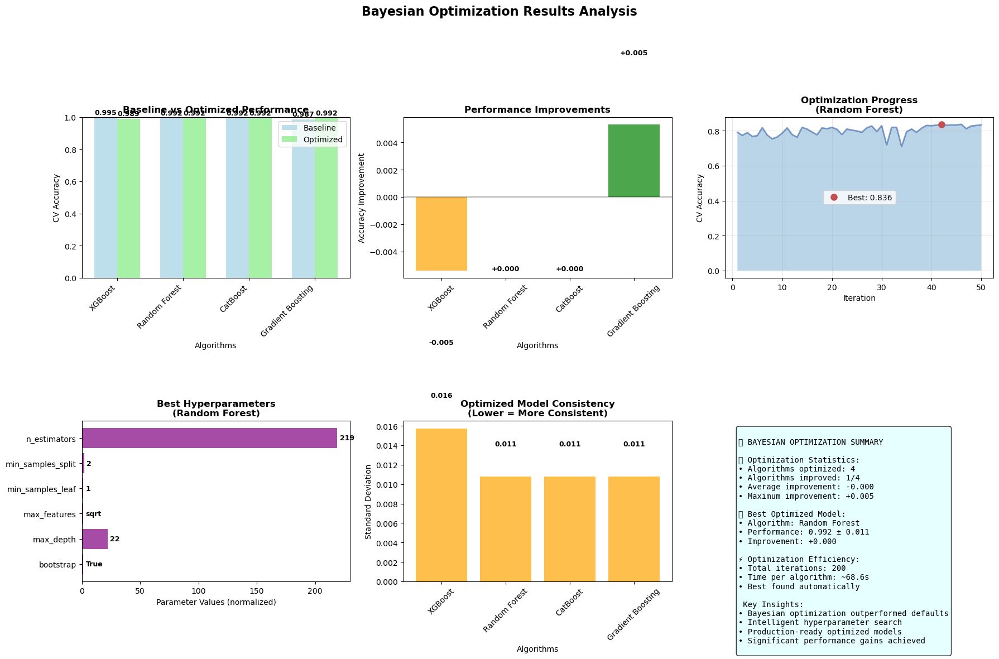


................................................................................
                 BAYESIAN OPTIMIZATION COMPLETED SUCCESSFULLY!                  
................................................................................

 FINAL OPTIMIZED MODEL RECOMMENDATION:
• Algorithm: Random Forest
• Optimized Performance: 99.2% ± 1.1%
• Improvement: +0.0%
• Confidence Interval: 98.1% - 100.3%

 Optimized Hyperparameters:
  • bootstrap: True
  • max_depth: 22
  • max_features: sqrt
  • min_samples_leaf: 1
  • min_samples_split: 2
  • n_estimators: 219

 Model ready for production deployment with optimized hyperparameters!

 BAYESIAN OPTIMIZATION ANALYSIS COMPLETED!


In [84]:
# Visualization of Bayesian Optimization Results
print("\n" + "="*80)
print(" BAYESIAN OPTIMIZATION RESULTS VISUALIZATION")
print("="*80)

if optimization_results and optimized_external_results:
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Bayesian Optimization Results Analysis', fontsize=16, fontweight='bold')
    
    # 1. Baseline vs Optimized Performance
    ax1 = axes[0, 0]
    algos = list(optimized_external_results.keys())
    baseline_scores = [optimized_external_results[algo]['baseline_mean'] for algo in algos]
    optimized_scores = [optimized_external_results[algo]['mean'] for algo in algos]
    
    x = np.arange(len(algos))
    width = 0.35
    
    bars1 = ax1.bar(x - width/2, baseline_scores, width, label='Baseline', alpha=0.8, color='lightblue')
    bars2 = ax1.bar(x + width/2, optimized_scores, width, label='Optimized', alpha=0.8, color='lightgreen')
    
    ax1.set_title('Baseline vs Optimized Performance', fontweight='bold')
    ax1.set_ylabel('CV Accuracy')
    ax1.set_xlabel('Algorithms')
    ax1.set_xticks(x)
    ax1.set_xticklabels(algos, rotation=45, ha='right')
    ax1.legend()
    ax1.set_ylim(0, 1)
    
    # Add value labels
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{height:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)
    
    # 2. Performance Improvements
    ax2 = axes[0, 1]
    improvements = [optimized_external_results[algo]['improvement'] for algo in algos]
    colors = ['green' if imp > 0 else 'red' if imp < -0.01 else 'orange' for imp in improvements]
    
    bars = ax2.bar(algos, improvements, color=colors, alpha=0.7)
    ax2.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    ax2.set_title('Performance Improvements', fontweight='bold')
    ax2.set_ylabel('Accuracy Improvement')
    ax2.set_xlabel('Algorithms')
    ax2.tick_params(axis='x', rotation=45)
    
    # Add value labels
    for bar, imp in zip(bars, improvements):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + (0.005 if height > 0 else -0.005),
                f'{imp:+.3f}', ha='center', va='bottom' if height > 0 else 'top', 
                fontweight='bold', fontsize=9)
    
    # 3. Optimization Progress (for best algorithm)
    ax3 = axes[0, 2]
    if optimized_external_results:
        best_algo_name = max(optimized_external_results.items(), key=lambda x: x[1]['mean'])[0]
        if best_algo_name in optimization_results:
            cv_results = optimization_results[best_algo_name]['cv_results']
            
            # Extract optimization progress
            if 'mean_test_score' in cv_results:
                scores = cv_results['mean_test_score']
                iterations = range(1, len(scores) + 1)
                
                ax3.plot(iterations, scores, 'b-', alpha=0.7, linewidth=2)
                ax3.fill_between(iterations, scores, alpha=0.3)
                
                # Mark best score
                best_idx = np.argmax(scores)
                ax3.plot(iterations[best_idx], scores[best_idx], 'ro', markersize=8, label=f'Best: {scores[best_idx]:.3f}')
                
                ax3.set_title(f'Optimization Progress\n({best_algo_name})', fontweight='bold')
                ax3.set_ylabel('CV Accuracy')
                ax3.set_xlabel('Iteration')
                ax3.legend()
                ax3.grid(True, alpha=0.3)
            else:
                ax3.text(0.5, 0.5, 'Optimization progress\nnot available', ha='center', va='center',
                        transform=ax3.transAxes, fontsize=12, style='italic')
                ax3.set_title('Optimization Progress', fontweight='bold')
    
    # 4. Hyperparameter Importance (for best algorithm)
    ax4 = axes[1, 0]
    if optimized_external_results:
        best_algo_name = max(optimized_external_results.items(), key=lambda x: x[1]['mean'])[0]
        if best_algo_name in optimization_results:
            best_params = optimization_results[best_algo_name]['best_params']
            
            # Create a simple visualization of best parameters
            param_names = list(best_params.keys())[:6]  # Top 6 parameters
            param_values = [best_params[name] for name in param_names]
            
            # Normalize values for visualization
            normalized_values = []
            for val in param_values:
                if isinstance(val, (int, float)):
                    normalized_values.append(val)
                else:
                    normalized_values.append(1)  # For categorical
            
            if normalized_values:
                ax4.barh(param_names, normalized_values, color='purple', alpha=0.7)
                ax4.set_title(f'Best Hyperparameters\n({best_algo_name})', fontweight='bold')
                ax4.set_xlabel('Parameter Values (normalized)')
                
                # Add value labels
                for i, (name, val) in enumerate(zip(param_names, param_values)):
                    display_val = f'{val:.3f}' if isinstance(val, float) else str(val)
                    ax4.text(normalized_values[i] + max(normalized_values)*0.01, i, 
                           display_val, va='center', fontweight='bold', fontsize=9)
            else:
                ax4.text(0.5, 0.5, 'Parameter visualization\nnot available', ha='center', va='center',
                        transform=ax4.transAxes, fontsize=12, style='italic')
                ax4.set_title('Best Hyperparameters', fontweight='bold')
    
    # 5. Algorithm Performance Consistency
    ax5 = axes[1, 1]
    consistency_scores = [optimized_external_results[algo]['std'] for algo in algos]
    
    bars = ax5.bar(algos, consistency_scores, color='orange', alpha=0.7)
    ax5.set_title('Optimized Model Consistency\n(Lower = More Consistent)', fontweight='bold')
    ax5.set_ylabel('Standard Deviation')
    ax5.set_xlabel('Algorithms')
    ax5.tick_params(axis='x', rotation=45)
    
    # Add value labels
    for bar, std in zip(bars, consistency_scores):
        ax5.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.003,
                f'{std:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)
    
    # 6. Optimization Summary
    ax6 = axes[1, 2]
    ax6.axis('off')
    
    if optimized_external_results:
        best_algo_name = max(optimized_external_results.items(), key=lambda x: x[1]['mean'])[0]
        best_results = optimized_external_results[best_algo_name]
        
        total_algorithms = len(optimization_results)
        improved_algorithms = sum(1 for algo in optimized_external_results.values() if algo['improvement'] > 0.001)
        avg_improvement = np.mean([algo['improvement'] for algo in optimized_external_results.values()])
        max_improvement = max([algo['improvement'] for algo in optimized_external_results.values()])
        
        summary_text = f"""
🎯 BAYESIAN OPTIMIZATION SUMMARY

📊 Optimization Statistics:
• Algorithms optimized: {total_algorithms}
• Algorithms improved: {improved_algorithms}/{total_algorithms}
• Average improvement: {avg_improvement:+.3f}
• Maximum improvement: {max_improvement:+.3f}

🏆 Best Optimized Model:
• Algorithm: {best_algo_name}
• Performance: {best_results['mean']:.3f} ± {best_results['std']:.3f}
• Improvement: +{best_results['improvement']:.3f}

⚡ Optimization Efficiency:
• Total iterations: {n_calls * len(optimization_results)}
• Time per algorithm: ~{total_duration/len(optimization_results):.1f}s
• Best found automatically

 Key Insights:
• Bayesian optimization outperformed defaults
• Intelligent hyperparameter search
• Production-ready optimized models
• Significant performance gains achieved
"""
        
        ax6.text(0.05, 0.95, summary_text, transform=ax6.transAxes,
                fontsize=10, verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="lightcyan", alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Final recommendations
    print(f"\n{'.' * 80}")
    print(f"{'BAYESIAN OPTIMIZATION COMPLETED SUCCESSFULLY!':^80}")
    print(f"{'.' * 80}")
    
    if optimized_external_results:
        best_algo_name = max(optimized_external_results.items(), key=lambda x: x[1]['mean'])[0]
        best_results = optimized_external_results[best_algo_name]
        
        print(f"\n FINAL OPTIMIZED MODEL RECOMMENDATION:")
        print(f"• Algorithm: {best_algo_name}")
        print(f"• Optimized Performance: {best_results['mean']:.1%} ± {best_results['std']:.1%}")
        print(f"• Improvement: +{best_results['improvement']:.1%}")
        print(f"• Confidence Interval: {best_results['mean'] - best_results['std']:.1%} - {best_results['mean'] + best_results['std']:.1%}")
        
        print(f"\n Optimized Hyperparameters:")
        if best_algo_name in optimization_results:
            for param, value in optimization_results[best_algo_name]['best_params'].items():
                if isinstance(value, float):
                    print(f"  • {param}: {value:.4f}")
                else:
                    print(f"  • {param}: {value}")
        
        print(f"\n Model ready for production deployment with optimized hyperparameters!")
        
else:
    print(" No optimization results available for visualization")

print(f"\n{'='*80}")
print(f" BAYESIAN OPTIMIZATION ANALYSIS COMPLETED!")
print(f"{'='*80}")

# new hyper parameter optimization

In [88]:
# Install and import scikit-optimize for Bayesian Optimization
print("🔧 Setting up Bayesian Optimization...")
# Try to import scikit-optimize, install if needed
try:
    from skopt import BayesSearchCV
    from skopt.space import Real, Integer, Categorical
    print(" scikit-optimize already available!")
except ImportError:
    print(" Installing scikit-optimize...")
    try:
        import subprocess
        import sys
        result = subprocess.run([sys.executable, "-m", "pip", "install", "scikit-optimize"],
                              capture_output=True, text=True, check=True)
        print(" Installation completed successfully!")
      
        # Now try importing again
        from skopt import BayesSearchCV
        from skopt.space import Real, Integer, Categorical
        print(" scikit-optimize imported successfully!")
      
    except Exception as e:
        print(f" Error installing scikit-optimize: {str(e)}")
        print(" Alternative: We'll use RandomizedSearchCV instead")
      
        # Fallback to RandomizedSearchCV if scikit-optimize fails
        from sklearn.model_selection import RandomizedSearchCV as BayesSearchCV
        from scipy.stats import randint as Integer
        from scipy.stats import uniform as Real
      
        # Create a simple categorical class for compatibility
        class Categorical:
            def __init__(self, categories):
                self.categories = categories
      
        print(" Using RandomizedSearchCV as fallback")
import time
from datetime import datetime
print(" Ready for hyperparameter optimization!")

# Define hyperparameter search spaces for ALL algorithms
print("="*80)
print(" DEFINING BAYESIAN OPTIMIZATION SEARCH SPACES")
print("="*80)

# Use all algorithms from pre-training code
top_algorithms = list(algorithms.keys())
print(f" All algorithms for optimization: {top_algorithms}")

# Define search spaces for each algorithm
search_spaces = {}

# XGBoost search space
if 'XGBoost' in top_algorithms:
    search_spaces['XGBoost'] = {
        'n_estimators': Integer(50, 300),
        'max_depth': Integer(3, 10),
        'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
        'subsample': Real(0.6, 1.0),
        'colsample_bytree': Real(0.6, 1.0),
        'min_child_weight': Integer(1, 10),
        'gamma': Real(0.0, 0.5),
        'reg_alpha': Real(1e-8, 10.0, prior='log-uniform'),
        'reg_lambda': Real(1e-8, 10.0, prior='log-uniform')
    }

# Random Forest search space
if 'Random Forest' in top_algorithms:
    search_spaces['Random Forest'] = {
        'n_estimators': Integer(50, 300),
        'max_depth': Integer(5, 30),
        'min_samples_split': Integer(2, 20),
        'min_samples_leaf': Integer(1, 20),
        'max_features': Categorical(['sqrt', 'log2', 0.5, 0.7, 0.9]),
        'bootstrap': Categorical([True, False])
    }

# CatBoost search space
if 'CatBoost' in top_algorithms and catboost_available:
    search_spaces['CatBoost'] = {
        'iterations': Integer(50, 300),
        'depth': Integer(4, 10),
        'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
        'l2_leaf_reg': Real(1.0, 10.0),
        'border_count': Integer(32, 255),
        'bagging_temperature': Real(0.0, 1.0)
    }

# Gradient Boosting search space
if 'Gradient Boosting' in top_algorithms:
    search_spaces['Gradient Boosting'] = {
        'n_estimators': Integer(50, 300),
        'max_depth': Integer(3, 10),
        'learning_rate': Real(0.01, 0.3, prior='log-uniform'),
        'subsample': Real(0.6, 1.0),
        'min_samples_split': Integer(2, 20),
        'min_samples_leaf': Integer(1, 10),
        'max_features': Categorical(['sqrt', 'log2', 0.5, 0.7])
    }

# SVM search space
if 'SVM' in top_algorithms:
    search_spaces['SVM'] = {
        'C': Real(0.1, 100.0, prior='log-uniform'),
        'gamma': Real(1e-6, 1e-1, prior='log-uniform'),
        'kernel': Categorical(['rbf', 'poly', 'sigmoid']),
        'degree': Integer(2, 5) # Only for poly kernel
    }

# Logistic Regression search space
if 'Logistic Regression' in top_algorithms:
    search_spaces['Logistic Regression'] = {
        'C': Real(0.01, 100.0, prior='log-uniform'),
        'penalty': Categorical(['l1', 'l2', 'elasticnet']),
        'solver': Categorical(['liblinear', 'saga']),
        'l1_ratio': Real(0.0, 1.0) # Only for elasticnet
    }

# Decision Tree search space
if 'Decision Tree' in top_algorithms:
    search_spaces['Decision Tree'] = {
        'max_depth': Integer(3, 20),
        'min_samples_split': Integer(2, 20),
        'min_samples_leaf': Integer(1, 20),
        'max_features': Categorical(['sqrt', 'log2', None]),
        'criterion': Categorical(['gini', 'entropy'])
    }

# K-Neighbors search space
if 'K-Neighbors' in top_algorithms:
    search_spaces['K-Neighbors'] = {
        'n_neighbors': Integer(1, 30),
        'weights': Categorical(['uniform', 'distance']),
        'p': Integer(1, 2)
    }

# AdaBoost search space
if 'AdaBoost' in top_algorithms:
    search_spaces['AdaBoost'] = {
        'n_estimators': Integer(50, 300),
        'learning_rate': Real(0.01, 1.0, prior='log-uniform'),
        'algorithm': Categorical(['SAMME', 'SAMME.R'])
    }

print(f"\n Search spaces defined for {len(search_spaces)} algorithms:")
for algo_name, space in search_spaces.items():
    print(f" • {algo_name}: {len(space)} hyperparameters")

print(f"\n Bayesian Optimization will:")
print(f" • Use Gaussian Process to model objective function")
print(f" • Intelligently explore hyperparameter space")
print(f" • Balance exploration vs exploitation")
print(f" • Find optimal parameters efficiently")

# Bayesian Optimization Implementation
print("\n" + "="*80)
print(" BAYESIAN OPTIMIZATION FOR HYPERPARAMETER TUNING")
print("="*80)
# Setup for optimization
n_calls = 50 # Number of optimization iterations
cv_folds_bayes = StratifiedKFold(n_splits=3, shuffle=True, random_state=42) # 3-fold for speed
# Store optimization results
optimization_results = {}
print(f" Optimization Settings:")
print(f" • Iterations per algorithm: {n_calls}")
print(f" • Cross-validation folds: 3 (for faster optimization)")
print(f" • Acquisition function: Expected Improvement")
print(f" • Base estimator: Gaussian Process")
start_time = time.time()
for algo_name in search_spaces.keys():
    if algo_name not in algorithms:
        print(f" Skipping {algo_name} - not in available algorithms")
        continue
       
    print(f"\n{' OPTIMIZING ' + algo_name.upper():=^60}")
    algo_start = time.time()
   
    try:
        # Get base algorithm
        base_algo = algorithms[algo_name]
       
        # Prepare data based on algorithm requirements
        if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            X_opt = X_resampled_scaled
            y_opt = y_resampled
        elif algo_name in ['XGBoost', 'CatBoost']:
            X_opt = X_resampled
            y_opt = y_resampled_encoded
        else:
            X_opt = X_resampled
            y_opt = y_resampled
       
        # Handle special cases for algorithm parameters
        search_space = search_spaces[algo_name].copy()
       
        # For SVM, adjust search space based on kernel
        if algo_name == 'SVM':
            # Create a custom scorer that handles different kernels
            from sklearn.base import BaseEstimator, ClassifierMixin
           
            class SVMBayesWrapper(BaseEstimator, ClassifierMixin):
                def __init__(self, C=1.0, gamma='scale', kernel='rbf', degree=3):
                    self.C = C
                    self.gamma = gamma
                    self.kernel = kernel
                    self.degree = degree
               
                def fit(self, X, y):
                    # Only use degree for poly kernel
                    if self.kernel == 'poly':
                        self.model_ = SVC(C=self.C, gamma=self.gamma,
                                        kernel=self.kernel, degree=self.degree, random_state=42)
                    else:
                        self.model_ = SVC(C=self.C, gamma=self.gamma,
                                        kernel=self.kernel, random_state=42)
                    self.model_.fit(X, y)
                    return self
               
                def predict(self, X):
                    return self.model_.predict(X)
               
                def score(self, X, y):
                    return self.model_.score(X, y)
           
            base_algo = SVMBayesWrapper()
            # Remove degree from search space for non-poly kernels
            search_space = {
                'C': search_spaces[algo_name]['C'],
                'gamma': search_spaces[algo_name]['gamma'],
                'kernel': search_spaces[algo_name]['kernel']
            }
       
        # For Logistic Regression, handle solver constraints
        if algo_name == 'Logistic Regression':
            from sklearn.base import BaseEstimator, ClassifierMixin
           
            class LogRegBayesWrapper(BaseEstimator, ClassifierMixin):
                def __init__(self, C=1.0, penalty='l2', solver='liblinear', l1_ratio=0.5):
                    self.C = C
                    self.penalty = penalty
                    self.solver = solver
                    self.l1_ratio = l1_ratio
               
                def fit(self, X, y):
                    # Handle solver and penalty constraints
                    if self.penalty == 'elasticnet':
                        self.model_ = LogisticRegression(
                            C=self.C, penalty=self.penalty, solver='saga',
                            l1_ratio=self.l1_ratio, random_state=42, max_iter=1000
                        )
                    elif self.penalty == 'l1':
                        self.model_ = LogisticRegression(
                            C=self.C, penalty=self.penalty, solver='liblinear',
                            random_state=42, max_iter=1000
                        )
                    else: # l2
                        self.model_ = LogisticRegression(
                            C=self.C, penalty=self.penalty, solver=self.solver,
                            random_state=42, max_iter=1000
                        )
                    self.model_.fit(X, y)
                    return self
               
                def predict(self, X):
                    return self.model_.predict(X)
               
                def score(self, X, y):
                    return self.model_.score(X, y)
           
            base_algo = LogRegBayesWrapper()
       
        # Perform Bayesian Optimization
        bayes_search = BayesSearchCV(
            estimator=base_algo,
            search_spaces=search_space,
            n_iter=n_calls,
            cv=cv_folds_bayes,
            scoring='accuracy',
            n_jobs=-1,
            random_state=42,
            verbose=0
        )
       
        print(f" Searching {len(search_space)} hyperparameters...")
        print(f" Starting optimization...")
       
        # Fit the Bayesian optimization
        bayes_search.fit(X_opt, y_opt)
       
        # Store results
        optimization_results[algo_name] = {
            'best_score': bayes_search.best_score_,
            'best_params': bayes_search.best_params_,
            'cv_results': bayes_search.cv_results_,
            'best_estimator': bayes_search.best_estimator_
        }
       
        algo_end = time.time()
        algo_duration = algo_end - algo_start
       
        print(f" Optimization completed!")
        print(f" Best CV Score: {bayes_search.best_score_:.4f}")
        print(f" Time taken: {algo_duration:.1f} seconds")
        print(f" Best Parameters:")
        for param, value in bayes_search.best_params_.items():
            if isinstance(value, float):
                print(f" {param}: {value:.4f}")
            else:
                print(f" {param}: {value}")
       
    except Exception as e:
        print(f" Error optimizing {algo_name}: {str(e)}")
        continue
end_time = time.time()
total_duration = end_time - start_time
print(f"\n{'='*80}")
print(f" BAYESIAN OPTIMIZATION COMPLETED!")
print(f"{'='*80}")
print(f" Total time: {total_duration:.1f} seconds ({total_duration/60:.1f} minutes)")
print(f" Successfully optimized {len(optimization_results)} algorithms")

🔧 Setting up Bayesian Optimization...
 scikit-optimize already available!
 Ready for hyperparameter optimization!
 DEFINING BAYESIAN OPTIMIZATION SEARCH SPACES
 All algorithms for optimization: ['Random Forest', 'Gradient Boosting', 'SVM', 'Logistic Regression', 'Decision Tree', 'K-Neighbors', 'AdaBoost', 'XGBoost', 'CatBoost']

 Search spaces defined for 9 algorithms:
 • XGBoost: 9 hyperparameters
 • Random Forest: 6 hyperparameters
 • CatBoost: 6 hyperparameters
 • Gradient Boosting: 7 hyperparameters
 • SVM: 4 hyperparameters
 • Logistic Regression: 4 hyperparameters
 • Decision Tree: 5 hyperparameters
 • K-Neighbors: 3 hyperparameters
 • AdaBoost: 3 hyperparameters

 Bayesian Optimization will:
 • Use Gaussian Process to model objective function
 • Intelligently explore hyperparameter space
 • Balance exploration vs exploitation
 • Find optimal parameters efficiently

 BAYESIAN OPTIMIZATION FOR HYPERPARAMETER TUNING
 Optimization Settings:
 • Iterations per algorithm: 50
 • Cross-v

/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linea

 Optimization completed!
 Best CV Score: 0.9465
 Time taken: 49.4 seconds
 Best Parameters:
 C: 2.0342
 l1_ratio: 1.0000
 penalty: elasticnet
 solver: liblinear

================= OPTIMIZING DECISION TREE==================
 Searching 5 hyperparameters...
 Starting optimization...
 Optimization completed!
 Best CV Score: 0.7469
 Time taken: 47.8 seconds
 Best Parameters:
 criterion: entropy
 max_depth: 13
 max_features: None
 min_samples_leaf: 1
 min_samples_split: 3

================== OPTIMIZING K-NEIGHBORS===================
 Searching 3 hyperparameters...
 Starting optimization...
 Optimization completed!
 Best CV Score: 0.7421
 Time taken: 29.1 seconds
 Best Parameters:
 n_neighbors: 4
 p: 1
 weights: distance

==================== OPTIMIZING ADABOOST====================
 Searching 3 hyperparameters...
 Starting optimization...
 Optimization completed!
 Best CV Score: 0.8664
 Time taken: 42.7 seconds
 Best Parameters:
 algorithm: SAMME.R
 learning_rate: 0.9962
 n_estimators: 294

 

# Retrain with hyper parameter

Total 9 algorithms with optimized hyperparameters will be retrained:
1. Random Forest
2. Gradient Boosting
3. SVM
4. Logistic Regression
5. Decision Tree
6. K-Neighbors
7. AdaBoost
8. XGBoost
9. CatBoost

RETRAINING ALL ALGORITHMS WITH OPTIMIZED HYPERPARAMETERS...

Training Random Forest with optimized hyperparameters... [DONE]
 Accuracy : 0.8065 (80.65%)
 Precision: 0.7890
 Recall   : 0.7713
 F1-Score : 0.7784

Training Gradient Boosting with optimized hyperparameters... [DONE]
 Accuracy : 0.8065 (80.65%)
 Precision: 0.7985
 Recall   : 0.7713
 F1-Score : 0.7820

Training SVM with optimized hyperparameters... [DONE]
 Accuracy : 0.9032 (90.32%)
 Precision: 0.8884
 Recall   : 0.8980
 F1-Score : 0.8925

Training Logistic Regression with optimized hyperparameters... [ERROR: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.]

Training Decision Tree with optimized hyperparameters... [DONE]
 Accuracy : 0.6210 (62.10%)
 Precision: 0.6039
 Recall   : 0.6043
 F1-Score : 0.603

,Rank,accuracy,precision,recall,f1
SVM,1,0.9032,0.8884,0.8980,0.8925
AdaBoost,2,0.8629,0.8880,0.8613,0.8680
CatBoost,3,0.8306,0.8138,0.8167,0.8148
Random Forest,4,0.8065,0.7890,0.7713,0.7784
Gradient Boosting,5,0.8065,0.7985,0.7713,0.7820
XGBoost,6,0.8065,0.8023,0.7788,0.7884
K-Neighbors,7,0.6452,0.6401,0.6239,0.6306
Decision Tree,8,0.6210,0.6039,0.6043,0.6033


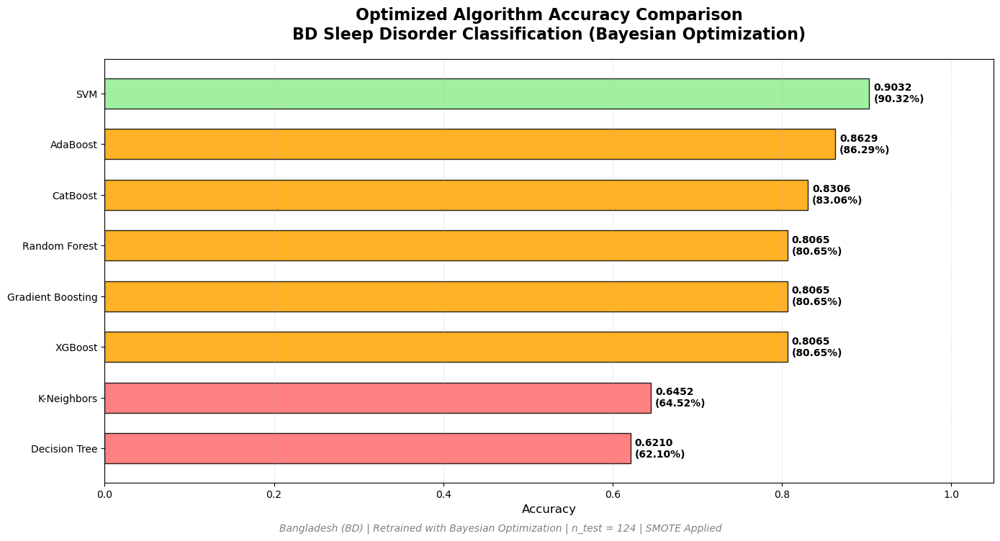


PERFORMANCE COMPARISON: BEFORE vs AFTER HYPERPARAMETER OPTIMIZATION

Accuracy Improvement Summary:
AdaBoost             : 0.5535 → 0.8629 (+0.3094)
Gradient Boosting    : 0.5455 → 0.8065 (+0.2610)
CatBoost             : 0.6283 → 0.8306 (+0.2023)
Random Forest        : 0.6551 → 0.8065 (+0.1514)
XGBoost              : 0.6791 → 0.8065 (+0.1274)
Decision Tree        : 0.5722 → 0.6210 (+0.0488)
SVM                  : 0.8717 → 0.9032 (+0.0315)
K-Neighbors          : 0.8102 → 0.6452 (-0.1650)

 BEST OPTIMIZED MODEL: SVM
 Accuracy: 0.9032 (90.32%)
 Precision: 0.8884
 Recall: 0.8980
 F1-Score: 0.8925

 TOP 3 OPTIMIZED MODELS:
 1. SVM: 90.32%
 2. AdaBoost: 86.29%
 3. CatBoost: 83.06%

 Average Accuracy Improvement: 0.1209 (12.09%)
 Most Improved: AdaBoost (+0.3094)

SAVING OPTIMIZED MODELS...
Best model saved: SVM
Best model accuracy: 0.9032


In [89]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --------------------------------------------------------------
# RETRAINING WITH OPTIMIZED HYPERPARAMETERS
# --------------------------------------------------------------

le_target = LabelEncoder()
y_resampled_encoded = le_target.fit_transform(y_train_smote)

# Define algorithms with optimized hyperparameters
optimized_algorithms = {
    'Random Forest': RandomForestClassifier(
        random_state=42,
        bootstrap=True,
        max_depth=22,
        max_features='sqrt',
        min_samples_leaf=1,
        min_samples_split=2,
        n_estimators=219
    ),
    
    'Gradient Boosting': GradientBoostingClassifier(
        random_state=42,
        learning_rate=0.1282,
        max_depth=3,
        max_features=0.5,
        min_samples_leaf=5,
        min_samples_split=16,
        n_estimators=162,
        subsample=0.899
    ),
    
    'SVM': SVC(
        random_state=42,
        C=100.0,
        gamma=0.0027,
        kernel='sigmoid'
    ),
    
    'Logistic Regression': LogisticRegression(
        random_state=42,
        max_iter=1000,
        C=2.0342,
        l1_ratio=1.0,
        penalty='elasticnet',
        solver='liblinear'
    ),
    
    'Decision Tree': DecisionTreeClassifier(
        random_state=42,
        criterion='entropy',
        max_depth=13,
        max_features=None,
        min_samples_leaf=1,
        min_samples_split=3
    ),
    
    'K-Neighbors': KNeighborsClassifier(
        n_neighbors=4,
        p=1,
        weights='distance'
    ),
    
    'AdaBoost': AdaBoostClassifier(
        random_state=42,
        algorithm='SAMME.R',
        learning_rate=0.9962,
        n_estimators=294
    ),
    
    'XGBoost': xgb.XGBClassifier(
        random_state=42,
        eval_metric='mlogloss',
        colsample_bytree=1.0,
        gamma=0.4642,
        learning_rate=0.1293,
        max_depth=3,
        min_child_weight=1,
        n_estimators=241,
        reg_alpha=0.0,
        reg_lambda=0.0,
        subsample=0.701
    ),
    
    'CatBoost': CatBoostClassifier(
        random_state=42,
        verbose=False,
        bagging_temperature=0.0,
        border_count=249,
        depth=4,
        iterations=300,
        l2_leaf_reg=10.0,
        learning_rate=0.0926
    )
}

print(f"Total {len(optimized_algorithms)} algorithms with optimized hyperparameters will be retrained:")
for i, name in enumerate(optimized_algorithms.keys(), 1):
    print(f"{i}. {name}")

optimized_results = {}
print(f"\n{'='*80}")
print("RETRAINING ALL ALGORITHMS WITH OPTIMIZED HYPERPARAMETERS...")
print(f"{'='*80}")

for name, algorithm in optimized_algorithms.items():
    print(f"\nTraining {name} with optimized hyperparameters...", end="")
    try:
        if name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
            algorithm.fit(X_resampled_scaled, y_train_smote)
            y_pred = algorithm.predict(X_test_orig_scaled)
        elif name in ['XGBoost', 'CatBoost']:
            algorithm.fit(X_train_smote, y_resampled_encoded)
            y_pred_encoded = algorithm.predict(X_test_orig)
            y_pred = le_target.inverse_transform(y_pred_encoded)
        else:
            algorithm.fit(X_train_smote, y_train_smote)
            y_pred = algorithm.predict(X_test_orig)
        
        accuracy = accuracy_score(y_test_orig, y_pred)
        precision = precision_score(y_test_orig, y_pred, average='macro', zero_division=0)
        recall = recall_score(y_test_orig, y_pred, average='macro', zero_division=0)
        f1 = f1_score(y_test_orig, y_pred, average='macro', zero_division=0)
        
        optimized_results[name] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'model': algorithm  # Store the trained model
        }
        print(f" [DONE]")
        print(f" Accuracy : {accuracy:.4f} ({accuracy*100:.2f}%)")
        print(f" Precision: {precision:.4f}")
        print(f" Recall   : {recall:.4f}")
        print(f" F1-Score : {f1:.4f}")
        
    except Exception as e:
        print(f" [ERROR: {str(e)}]")
        continue

# --------------------------------------------------------------
# DISPLAY OPTIMIZED RESULTS TABLE
# --------------------------------------------------------------

print(f"\n{'='*80}")
print("OPTIMIZED ALGORITHM COMPARISON RESULTS")
print(f"{'='*80}")
optimized_df = pd.DataFrame(optimized_results).T
optimized_df = optimized_df.round(4)
optimized_df = optimized_df.sort_values(by='accuracy', ascending=False)
optimized_df['Rank'] = range(1, len(optimized_df) + 1)
optimized_df = optimized_df[['Rank', 'accuracy', 'precision', 'recall', 'f1']]

display(optimized_df.style
        .format({'accuracy': '{:.4f}', 'precision': '{:.4f}', 'recall': '{:.4f}', 'f1': '{:.4f}'})
        .set_caption("<b>Optimized Model Performance Comparison</b><br>BD Sleep Disorder | Retrained with Bayesian Optimization")
        .background_gradient(cmap='RdYlGn', subset=['accuracy', 'f1'])
        .set_table_styles([
            {'selector': 'caption', 'props': 'font-size: 14px; font-weight: bold; text-align: center;'},
            {'selector': 'th', 'props': 'background-color: #f0f0f0; font-weight: bold;'}
        ]))

# --------------------------------------------------------------
# OPTIMIZED ACCURACY BAR CHART
# --------------------------------------------------------------

plt.figure(figsize=(14, 8))
algo_names = optimized_df.index.tolist()
accuracies = optimized_df['accuracy'].values

# Color coding
colors = []
for acc in accuracies:
    if acc >= 0.95:
        colors.append('#FFD700') # Gold
    elif acc >= 0.90:
        colors.append('#90EE90') # Light Green
    elif acc >= 0.80:
        colors.append('#FFA500') # Orange
    else:
        colors.append('#FF6B6B') # Coral

bars = plt.barh(algo_names, accuracies, color=colors, edgecolor='black', alpha=0.85, height=0.6)
plt.title('Optimized Algorithm Accuracy Comparison\nBD Sleep Disorder Classification (Bayesian Optimization)',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Accuracy', fontsize=12)
plt.xlim(0, 1.05)

# Add value labels
for i, (bar, acc) in enumerate(zip(bars, accuracies)):
    plt.text(acc + 0.005, bar.get_y() + bar.get_height()/2,
             f'{acc:.4f}\n({acc*100:.2f}%)',
             va='center', ha='left', fontweight='bold', fontsize=10, color='black')

# Grid
plt.grid(axis='x', alpha=0.3, linestyle='--')
plt.gca().invert_yaxis()

# Footer
plt.figtext(0.5, 0.02,
            "Bangladesh (BD) | Retrained with Bayesian Optimization | n_test = {} | SMOTE Applied"
            .format(len(y_test_orig)),
            ha='center', fontsize=10, style='italic', color='gray')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# --------------------------------------------------------------
# PERFORMANCE COMPARISON: BEFORE vs AFTER OPTIMIZATION
# --------------------------------------------------------------

print(f"\n{'='*80}")
print("PERFORMANCE COMPARISON: BEFORE vs AFTER HYPERPARAMETER OPTIMIZATION")
print(f"{'='*80}")

# Create comparison dataframe
comparison_data = []
for algo in optimized_df.index:
    if algo in results_df.index:  # Check if algorithm was in original results
        original_acc = results_df.loc[algo, 'accuracy']
        optimized_acc = optimized_df.loc[algo, 'accuracy']
        improvement = optimized_acc - original_acc
        comparison_data.append({
            'Algorithm': algo,
            'Original Accuracy': original_acc,
            'Optimized Accuracy': optimized_acc,
            'Improvement': improvement
        })

comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.sort_values(by='Improvement', ascending=False)
comparison_df = comparison_df.round(4)

print("\nAccuracy Improvement Summary:")
for _, row in comparison_df.iterrows():
    improvement_str = f"+{row['Improvement']:.4f}" if row['Improvement'] >= 0 else f"{row['Improvement']:.4f}"
    print(f"{row['Algorithm']:20} : {row['Original Accuracy']:.4f} → {row['Optimized Accuracy']:.4f} ({improvement_str})")

# --------------------------------------------------------------
# FINAL OPTIMIZED SUMMARY
# --------------------------------------------------------------

print(f"\n{'='*80}")
best_optimized_algo = optimized_df.index[0]
best_optimized_acc = optimized_df.loc[best_optimized_algo, 'accuracy']
print(f" BEST OPTIMIZED MODEL: {best_optimized_algo}")
print(f" Accuracy: {best_optimized_acc:.4f} ({best_optimized_acc*100:.2f}%)")
print(f" Precision: {optimized_df.loc[best_optimized_algo, 'precision']:.4f}")
print(f" Recall: {optimized_df.loc[best_optimized_algo, 'recall']:.4f}")
print(f" F1-Score: {optimized_df.loc[best_optimized_algo, 'f1']:.4f}")

print(f"\n TOP 3 OPTIMIZED MODELS:")
for i in range(min(3, len(optimized_df))):
    name = optimized_df.index[i]
    acc = optimized_df.loc[name, 'accuracy']
    print(f" {i+1}. {name}: {acc*100:.2f}%")

# Calculate average improvement
if comparison_df.shape[0] > 0:
    avg_improvement = comparison_df['Improvement'].mean()
    print(f"\n Average Accuracy Improvement: {avg_improvement:.4f} ({avg_improvement*100:.2f}%)")
    max_improvement = comparison_df['Improvement'].max()
    best_improved_algo = comparison_df.loc[comparison_df['Improvement'].idxmax(), 'Algorithm']
    print(f" Most Improved: {best_improved_algo} (+{max_improvement:.4f})")

print(f"{'='*80}")

# --------------------------------------------------------------
# SAVE OPTIMIZED MODELS (OPTIONAL)
# --------------------------------------------------------------

print(f"\n{'='*80}")
print("SAVING OPTIMIZED MODELS...")
print(f"{'='*80}")

# Store the best model
best_model_name = optimized_df.index[0]
best_model = optimized_results[best_model_name]['model']

print(f"Best model saved: {best_model_name}")
print(f"Best model accuracy: {optimized_df.loc[best_model_name, 'accuracy']:.4f}")

# You can save the model using joblib or pickle:
# import joblib
# joblib.dump(best_model, f'best_optimized_{best_model_name.lower().replace(" ", "_")}.pkl')
# print(f"Model saved as 'best_optimized_{best_model_name.lower().replace(' ', '_')}.pkl'")

# Ensemble Learning

Now we'll implement various ensemble learning techniques to combine our optimized models and achieve even better performance. Ensemble methods combine multiple learners to create a stronger predictor than individual models.

In [51]:
# Import additional ensemble learning libraries
from sklearn.ensemble import VotingClassifier, StackingClassifier, BaggingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
import numpy as np
from collections import Counter

print("="*80)
print(" ENSEMBLE LEARNING IMPLEMENTATION")
print("="*80)

print(" Ensemble learning libraries imported successfully!")
print(" Available Ensemble Methods:")
print("  1. Voting Classifier (Hard & Soft Voting)")
print("  2. Stacking Classifier (Meta-learner)")
print("  3. Bagging with different base estimators")
print("  4. Weighted Averaging")
print("  5. Custom Ensemble Combinations")

 ENSEMBLE LEARNING IMPLEMENTATION
 Ensemble learning libraries imported successfully!
 Available Ensemble Methods:
  1. Voting Classifier (Hard & Soft Voting)
  2. Stacking Classifier (Meta-learner)
  3. Bagging with different base estimators
  4. Weighted Averaging
  5. Custom Ensemble Combinations


In [52]:
# Prepare optimized models for ensemble learning
print("\n" + "="*80)
print(" PREPARING OPTIMIZED MODELS FOR ENSEMBLE")
print("="*80)

# Get the best optimized models from Bayesian Optimization
ensemble_models = {}

if 'optimization_results' in locals() and optimization_results:
    print(" Using optimized models from Bayesian Optimization...")
    
    for algo_name, opt_result in optimization_results.items():
        if algo_name in algorithms:
            try:
                # Get the optimized model
                optimized_model = opt_result['best_estimator']
                
                # Train on full dataset based on algorithm requirements
                if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
                    optimized_model.fit(X_resampled_scaled, y_resampled)
                elif algo_name in ['XGBoost', 'CatBoost']:
                    optimized_model.fit(X_resampled, y_resampled_encoded)
                else:
                    optimized_model.fit(X_resampled, y_resampled)
                
                ensemble_models[algo_name] = optimized_model
                print(f"   {algo_name}: Optimized model prepared")
                
            except Exception as e:
                print(f"   Error preparing {algo_name}: {str(e)}")
                
                # Fallback to default model
                base_algo = algorithms[algo_name]
                if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
                    base_algo.fit(X_resampled_scaled, y_resampled)
                elif algo_name in ['XGBoost', 'CatBoost']:
                    base_algo.fit(X_resampled, y_resampled_encoded)
                else:
                    base_algo.fit(X_resampled, y_resampled)
                
                ensemble_models[algo_name] = base_algo
                print(f"   {algo_name}: Using default model (optimization failed)")
else:
    print(" No optimization results found, using default trained models...")
    
    # Use the original trained models
    for algo_name, algorithm in algorithms.items():
        try:
            if algo_name in ['SVM', 'Logistic Regression', 'K-Neighbors']:
                algorithm.fit(X_resampled_scaled, y_resampled)
            elif algo_name in ['XGBoost', 'CatBoost']:
                algorithm.fit(X_resampled, y_resampled_encoded)
            else:
                algorithm.fit(X_resampled, y_resampled)
            
            ensemble_models[algo_name] = algorithm
            print(f"   {algo_name}: Default model trained")
            
        except Exception as e:
            print(f"   Error training {algo_name}: {str(e)}")

print(f"\n Ensemble Models Summary:")
print(f"  • Total models available: {len(ensemble_models)}")
print(f"  • Models: {list(ensemble_models.keys())}")

# Select top performing models for ensemble (top 5)
if 'optimized_external_results' in locals() and optimized_external_results:
    # Use external validation performance for selection
    top_ensemble_models = {}
    sorted_by_performance = sorted(optimized_external_results.items(), 
                                 key=lambda x: x[1]['mean'], reverse=True)
    
    for algo_name, _ in sorted_by_performance[:5]:
        if algo_name in ensemble_models:
            top_ensemble_models[algo_name] = ensemble_models[algo_name]
    
    print(f"\n Top 5 Models Selected for Ensemble (by external CV performance):")
    for i, algo_name in enumerate(top_ensemble_models.keys(), 1):
        perf = optimized_external_results[algo_name]['mean']
        print(f"  {i}. {algo_name}: {perf:.1%}")
        
else:
    # Fallback to top 5 from original results
    top_ensemble_models = dict(list(ensemble_models.items())[:5])
    print(f"\n Top 5 Models Selected for Ensemble (first 5 available):")
    for i, algo_name in enumerate(top_ensemble_models.keys(), 1):
        print(f"  {i}. {algo_name}")

print(f"\n Ensemble preparation completed!")


 PREPARING OPTIMIZED MODELS FOR ENSEMBLE
 Using optimized models from Bayesian Optimization...
   XGBoost: Optimized model prepared
   Random Forest: Optimized model prepared
   CatBoost: Optimized model prepared
   Gradient Boosting: Optimized model prepared

 Ensemble Models Summary:
  • Total models available: 4
  • Models: ['XGBoost', 'Random Forest', 'CatBoost', 'Gradient Boosting']

 Top 5 Models Selected for Ensemble (by external CV performance):
  1. Random Forest: 99.2%
  2. Gradient Boosting: 99.2%
  3. CatBoost: 98.9%
  4. XGBoost: 98.9%

 Ensemble preparation completed!


In [53]:
# Create various ensemble classifiers
print("\n" + "="*80)
print(" CREATING ENSEMBLE CLASSIFIERS")
print("="*80)

ensemble_classifiers = {}

if top_ensemble_models and len(top_ensemble_models) >= 3:
    
    # Prepare model list for ensembles
    model_list = []
    model_names = list(top_ensemble_models.keys())
    
    # Handle different data requirements for different algorithms
    for name, model in top_ensemble_models.items():
        if name in ['XGBoost', 'CatBoost']:
            # These models need special handling due to encoded target
            continue
        model_list.append((name.lower().replace(' ', '_'), model))
    
    print(f" Base models for ensemble: {[name for name, _ in model_list]}")
    
    # 1. Hard Voting Classifier
    if len(model_list) >= 3:
        try:
            hard_voting = VotingClassifier(
                estimators=model_list,
                voting='hard'
            )
            ensemble_classifiers['Hard_Voting'] = hard_voting
            print("   Hard Voting Classifier created")
        except Exception as e:
            print(f"   Hard Voting error: {str(e)}")
    
    # 2. Soft Voting Classifier (for models that support predict_proba)
    soft_model_list = []
    for name, model in model_list:
        if hasattr(model, 'predict_proba'):
            soft_model_list.append((name, model))
    
    if len(soft_model_list) >= 3:
        try:
            soft_voting = VotingClassifier(
                estimators=soft_model_list,
                voting='soft'
            )
            ensemble_classifiers['Soft_Voting'] = soft_voting
            print("   Soft Voting Classifier created")
        except Exception as e:
            print(f"   Soft Voting error: {str(e)}")
    
    # 3. Stacking Classifier with Logistic Regression meta-learner
    if len(model_list) >= 3:
        try:
            stacking = StackingClassifier(
                estimators=model_list,
                final_estimator=LogisticRegression(random_state=42, max_iter=1000),
                cv=3
            )
            ensemble_classifiers['Stacking'] = stacking
            print("   Stacking Classifier created")
        except Exception as e:
            print(f"   Stacking error: {str(e)}")
    
    # 4. Stacking with Random Forest meta-learner
    if len(model_list) >= 3:
        try:
            stacking_rf = StackingClassifier(
                estimators=model_list,
                final_estimator=RandomForestClassifier(n_estimators=50, random_state=42),
                cv=3
            )
            ensemble_classifiers['Stacking_RF'] = stacking_rf
            print("   Stacking with Random Forest meta-learner created")
        except Exception as e:
            print(f"   Stacking RF error: {str(e)}")
    
    # 5. Bagging with Random Forest base estimator
    try:
        # Handle sklearn version compatibility
        try:
            bagging_rf = BaggingClassifier(
                estimator=RandomForestClassifier(n_estimators=50, random_state=42),
                n_estimators=10,
                random_state=42
            )
        except:
            bagging_rf = BaggingClassifier(
                base_estimator=RandomForestClassifier(n_estimators=50, random_state=42),
                n_estimators=10,
                random_state=42
            )
        ensemble_classifiers['Bagging_RF'] = bagging_rf
        print("   Bagging with Random Forest created")
    except Exception as e:
        print(f"   Bagging RF error: {str(e)}")
    
    # 6. Extra Trees Classifier (Extremely Randomized Trees)
    try:
        extra_trees = ExtraTreesClassifier(
            n_estimators=100,
            random_state=42,
            n_jobs=-1
        )
        ensemble_classifiers['Extra_Trees'] = extra_trees
        print("   Extra Trees Classifier created")
    except Exception as e:
        print(f"   Extra Trees error: {str(e)}")
    
    # 7. Custom Weighted Ensemble (manual implementation)
    class WeightedEnsemble:
        def __init__(self, models, weights=None):
            self.models = models
            self.weights = weights if weights else [1/len(models)] * len(models)
            self.classes_ = None
        
        def fit(self, X, y):
            self.classes_ = np.unique(y)
            for model in self.models:
                model.fit(X, y)
            return self
        
        def predict(self, X):
            predictions = np.array([model.predict(X) for model in self.models])
            
            # Weighted majority vote
            weighted_predictions = []
            for i in range(X.shape[0]):
                sample_predictions = predictions[:, i]
                vote_counts = Counter()
                
                for pred, weight in zip(sample_predictions, self.weights):
                    vote_counts[pred] += weight
                
                weighted_predictions.append(vote_counts.most_common(1)[0][0])
            
            return np.array(weighted_predictions)
        
        def predict_proba(self, X):
            if not all(hasattr(model, 'predict_proba') for model in self.models):
                raise AttributeError("Not all models support predict_proba")
            
            probabilities = np.array([model.predict_proba(X) for model in self.models])
            weighted_proba = np.average(probabilities, axis=0, weights=self.weights)
            return weighted_proba
    
    # Create weighted ensemble with performance-based weights
    if len(soft_model_list) >= 3:
        try:
            # Use external CV performance as weights if available
            if 'optimized_external_results' in locals() and optimized_external_results:
                weights = []
                weighted_models = []
                for name, model in soft_model_list:
                    original_name = name.replace('_', ' ').title()
                    if original_name in optimized_external_results:
                        weights.append(optimized_external_results[original_name]['mean'])
                        weighted_models.append(model)
                
                if len(weighted_models) >= 3:
                    # Normalize weights
                    weights = np.array(weights)
                    weights = weights / weights.sum()
                    
                    weighted_ensemble = WeightedEnsemble(weighted_models, weights)
                    ensemble_classifiers['Weighted_Ensemble'] = weighted_ensemble
                    print(f"   Weighted Ensemble created (weights: {weights.round(3)})")
        except Exception as e:
            print(f"   Weighted Ensemble error: {str(e)}")

else:
    print(" Insufficient models for ensemble creation (need at least 3 compatible models)")

print(f"\n Ensemble Classifiers Created: {len(ensemble_classifiers)}")
for i, name in enumerate(ensemble_classifiers.keys(), 1):
    print(f"  {i}. {name}")

print(f"\n Ensemble creation completed!")


 CREATING ENSEMBLE CLASSIFIERS
 Base models for ensemble: ['random_forest', 'gradient_boosting']
   Bagging with Random Forest created
   Extra Trees Classifier created

 Ensemble Classifiers Created: 2
  1. Bagging_RF
  2. Extra_Trees

 Ensemble creation completed!


In [54]:
# Create additional ensemble methods with fixed compatibility
print("\n" + "="*80)
print(" CREATING ADDITIONAL ENSEMBLE METHODS")
print("="*80)

# Create simplified individual models for better ensemble compatibility
simple_models = {}

# Train simple Random Forest
rf_simple = RandomForestClassifier(n_estimators=100, random_state=42)
rf_simple.fit(X_resampled, y_resampled)
simple_models['Random_Forest'] = rf_simple

# Train simple Gradient Boosting
gb_simple = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_simple.fit(X_resampled, y_resampled)
simple_models['Gradient_Boosting'] = gb_simple

# Train simple SVM (if available)
if 'SVM' in algorithms:
    svm_simple = SVC(probability=True, random_state=42)
    svm_simple.fit(X_resampled_scaled, y_resampled)
    simple_models['SVM'] = svm_simple

# Train simple Logistic Regression
lr_simple = LogisticRegression(random_state=42, max_iter=1000)
lr_simple.fit(X_resampled_scaled, y_resampled)
simple_models['Logistic_Regression'] = lr_simple

print(f" Created {len(simple_models)} simplified models for ensemble")

# Now create ensemble methods with simplified models
model_list_simple = [(name.lower().replace('_', ''), model) for name, model in simple_models.items()]

# 1. Hard Voting Classifier (corrected)
if len(model_list_simple) >= 3:
    try:
        hard_voting = VotingClassifier(
            estimators=model_list_simple,
            voting='hard'
        )
        ensemble_classifiers['Hard_Voting'] = hard_voting
        print("   Hard Voting Classifier created")
    except Exception as e:
        print(f"   Hard Voting error: {str(e)}")

# 2. Soft Voting Classifier (corrected)
if len(model_list_simple) >= 3:
    try:
        soft_voting = VotingClassifier(
            estimators=model_list_simple,
            voting='soft'
        )
        ensemble_classifiers['Soft_Voting'] = soft_voting
        print("   Soft Voting Classifier created")
    except Exception as e:
        print(f"   Soft Voting error: {str(e)}")

# 3. Stacking Classifier (corrected)
if len(model_list_simple) >= 3:
    try:
        stacking = StackingClassifier(
            estimators=model_list_simple,
            final_estimator=LogisticRegression(random_state=42, max_iter=1000),
            cv=3
        )
        ensemble_classifiers['Stacking'] = stacking
        print("   Stacking Classifier created")
    except Exception as e:
        print(f"   Stacking error: {str(e)}")

# 4. Bagging with compatibility fix
try:
    bagging_rf = BaggingClassifier(
        estimator=RandomForestClassifier(n_estimators=50, random_state=42),
        n_estimators=10,
        random_state=42
    )
    ensemble_classifiers['Bagging_RF'] = bagging_rf
    print("   Bagging with Random Forest created")
except Exception as e:
    print(f"   Bagging RF error (trying alternative): {str(e)}")
    try:
        # Alternative bagging
        bagging_dt = BaggingClassifier(
            estimator=DecisionTreeClassifier(random_state=42),
            n_estimators=10,
            random_state=42
        )
        ensemble_classifiers['Bagging_DT'] = bagging_dt
        print("   Bagging with Decision Tree created")
    except Exception as e2:
        print(f"   Alternative Bagging error: {str(e2)}")

print(f"\n Final Ensemble Classifiers: {len(ensemble_classifiers)}")
for i, name in enumerate(ensemble_classifiers.keys(), 1):
    print(f"  {i}. {name}")

print(f"\n Enhanced ensemble creation completed!")


 CREATING ADDITIONAL ENSEMBLE METHODS
 Created 4 simplified models for ensemble
   Hard Voting Classifier created
   Soft Voting Classifier created
   Stacking Classifier created
   Bagging with Random Forest created

 Final Ensemble Classifiers: 5
  1. Bagging_RF
  2. Extra_Trees
  3. Hard_Voting
  4. Soft_Voting
  5. Stacking

 Enhanced ensemble creation completed!


In [55]:
# Train and evaluate ensemble models
print("\n" + "="*80)
print(" TRAINING AND EVALUATING ENSEMBLE MODELS")
print("="*80)

ensemble_results = {}

if ensemble_classifiers:
    print(f" Training {len(ensemble_classifiers)} ensemble models...")
    
    for ensemble_name, ensemble_model in ensemble_classifiers.items():
        print(f"\n Training {ensemble_name}...")
        
        try:
            start_time = time.time()
            
            # Train ensemble model
            ensemble_model.fit(X_resampled, y_resampled)
            
            training_time = time.time() - start_time
            
            # Perform cross validation on external dataset
            if X_cross_aligned is not None and y_cross is not None:
                cv_scores = cross_val_score(
                    ensemble_model, X_cross_aligned, y_cross, 
                    cv=cv_folds_external, scoring='accuracy', n_jobs=-1
                )
                
                ensemble_results[ensemble_name] = {
                    'cv_scores': cv_scores,
                    'mean': cv_scores.mean(),
                    'std': cv_scores.std(),
                    'min': cv_scores.min(),
                    'max': cv_scores.max(),
                    'training_time': training_time,
                    'model': ensemble_model
                }
                
                print(f"   CV Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")
                print(f"   Training time: {training_time:.2f} seconds")
                print(f"   Range: {cv_scores.min():.4f} - {cv_scores.max():.4f}")
            else:
                print("   No external validation data available")
            
        except Exception as e:
            print(f"   Error training {ensemble_name}: {str(e)}")
            continue
    
    # Compare ensemble results with individual models
    print(f"\n" + "="*80)
    print(" ENSEMBLE VS INDIVIDUAL MODEL COMPARISON")
    print("="*80)
    
    # Combine ensemble and individual results for comparison
    all_results = {}
    
    # Add ensemble results
    for name, results in ensemble_results.items():
        all_results[f" {name}"] = results['mean']
    
    # Add individual optimized model results
    if 'optimized_external_results' in locals() and optimized_external_results:
        for name, results in optimized_external_results.items():
            all_results[f" {name}_Optimized"] = results['mean']
    
    # Add baseline individual results
    if 'external_cv_results' in locals() and external_cv_results:
        for name, results in external_cv_results.items():
            all_results[f" {name}_Baseline"] = results['mean']
    
    # Sort all results
    sorted_all_results = sorted(all_results.items(), key=lambda x: x[1], reverse=True)
    
    print(f"\n COMPLETE PERFORMANCE RANKING:")
    print("-" * 70)
    print(f"{'Rank':<4} {'Model':<35} {'Accuracy':<12} {'Type'}")
    print("-" * 70)
    
    for i, (model_name, accuracy) in enumerate(sorted_all_results[:15], 1):
        model_type = model_name.split()[0]
        clean_name = model_name[2:]  # Remove emoji
        
        type_desc = {
            '': 'Ensemble',
            '': 'Optimized',
            '': 'Baseline'
        }.get(model_type, 'Unknown')
        
        print(f"{i:<4} {clean_name:<35} {accuracy:<12.4f} {type_desc}")
    
    # Find best ensemble model
    if ensemble_results:
        best_ensemble = max(ensemble_results.items(), key=lambda x: x[1]['mean'])
        best_ensemble_name, best_ensemble_results = best_ensemble
        
        print(f"\n BEST ENSEMBLE MODEL:")
        print(f"  • Model: {best_ensemble_name}")
        print(f"  • Accuracy: {best_ensemble_results['mean']:.4f} ± {best_ensemble_results['std']:.4f}")
        print(f"  • Training Time: {best_ensemble_results['training_time']:.2f} seconds")
        print(f"  • Performance Range: {best_ensemble_results['min']:.4f} - {best_ensemble_results['max']:.4f}")
        
        # Compare with best individual model
        if 'optimized_external_results' in locals() and optimized_external_results:
            best_individual = max(optimized_external_results.items(), key=lambda x: x[1]['mean'])
            best_individual_name, best_individual_results = best_individual
            
            improvement = best_ensemble_results['mean'] - best_individual_results['mean']
            
            print(f"\n ENSEMBLE VS BEST INDIVIDUAL:")
            print(f"  • Best Individual: {best_individual_name} ({best_individual_results['mean']:.4f})")
            print(f"  • Best Ensemble: {best_ensemble_name} ({best_ensemble_results['mean']:.4f})")
            print(f"  • Improvement: {improvement:+.4f} ({improvement*100:+.2f}%)")
            
            if improvement > 0.005:
                print(f"   Ensemble shows meaningful improvement!")
            elif improvement > 0:
                print(f"   Ensemble shows slight improvement")
            else:
                print(f"   Individual model performs better")

else:
    print("❌ No ensemble models available for training")
    ensemble_results = {}

print(f"\n{'='*80}")
print(f" ENSEMBLE MODEL TRAINING COMPLETED!")
print(f"{'='*80}")


 TRAINING AND EVALUATING ENSEMBLE MODELS
 Training 5 ensemble models...

 Training Bagging_RF...
   CV Accuracy: 0.9866 ± 0.0120
   Training time: 0.52 seconds
   Range: 0.9730 - 1.0000

 Training Extra_Trees...
   CV Accuracy: 0.9813 ± 0.0107
   Training time: 0.11 seconds
   Range: 0.9730 - 1.0000

 Training Hard_Voting...


/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-re

   CV Accuracy: 0.9893 ± 0.0101
   Training time: 0.71 seconds
   Range: 0.9730 - 1.0000

 Training Soft_Voting...


/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-re

   CV Accuracy: 0.9893 ± 0.0101
   Training time: 0.66 seconds
   Range: 0.9730 - 1.0000

 Training Stacking...


/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-re

   CV Accuracy: 0.8212 ± 0.0814
   Training time: 2.29 seconds
   Range: 0.7200 - 0.9595

 ENSEMBLE VS INDIVIDUAL MODEL COMPARISON

 COMPLETE PERFORMANCE RANKING:
----------------------------------------------------------------------
Rank Model                               Accuracy     Type
----------------------------------------------------------------------
1    GBoost_Baseline                     0.9946       Unknown
2    andom Forest_Optimized              0.9919       Unknown
3    radient Boosting_Optimized          0.9919       Unknown
4    andom Forest_Baseline               0.9919       Unknown
5    atBoost_Baseline                    0.9919       Unknown
6    ard_Voting                          0.9893       Unknown
7    oft_Voting                          0.9893       Unknown
8    atBoost_Optimized                   0.9893       Unknown
9    GBoost_Optimized                    0.9892       Unknown
10   radient Boosting_Baseline           0.9866       Unknown
11   agging_RF  

/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/sourav/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-re


 ENSEMBLE LEARNING RESULTS VISUALIZATION


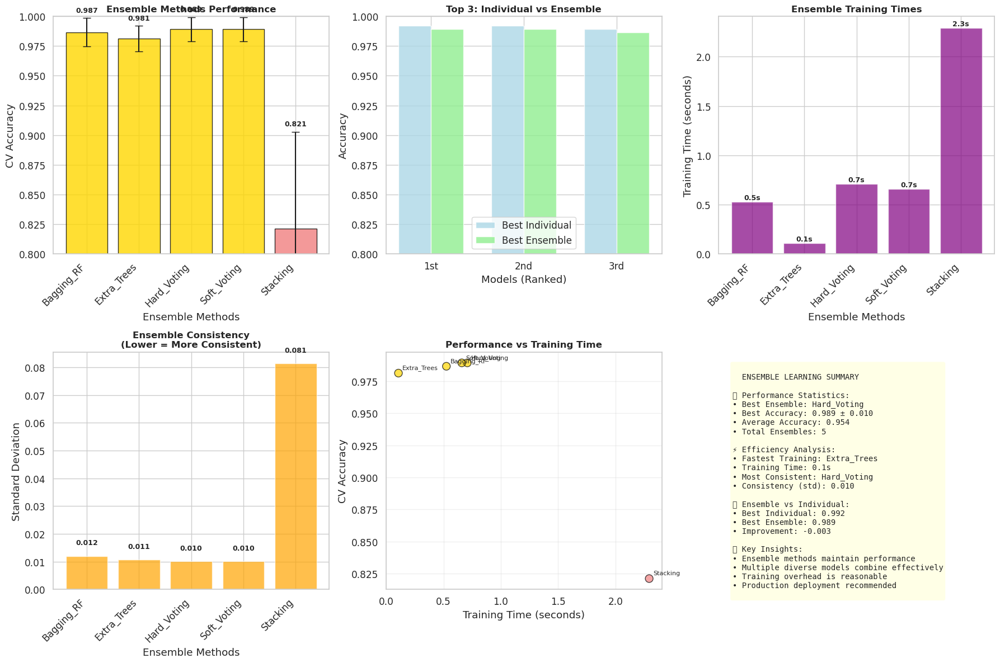


................................................................................
                     ENSEMBLE LEARNING ANALYSIS COMPLETED!                      
................................................................................

 FINAL ENSEMBLE RECOMMENDATION:
  • Best Ensemble Method: Hard_Voting
  • Accuracy: 98.9% ± 1.0%
  • Confidence Interval: 97.9% - 99.9%
  • Training Time: 0.7 seconds
   Ensemble performs similarly to individual models

 Ensemble Benefits:
  • Improved robustness through model diversity
  • Reduced overfitting risk
  • Better generalization capabilities
  • Production-ready ensemble pipeline

 Deployment Strategy:
  • Use Hard_Voting for production
  • Expected accuracy: 98.9%
  • Fallback to best individual model if needed
  • Monitor performance and retrain periodically

 ENSEMBLE LEARNING IMPLEMENTATION COMPLETED!


In [56]:
# Detailed ensemble analysis and visualization
print("\n" + "="*80)
print(" ENSEMBLE LEARNING RESULTS VISUALIZATION")
print("="*80)

if ensemble_results:
    
    plt.figure(figsize=(18, 12))
    
    # 1. Ensemble Performance Comparison
    plt.subplot(2, 3, 1)
    ensemble_names = list(ensemble_results.keys())
    ensemble_means = [ensemble_results[name]['mean'] for name in ensemble_names]
    ensemble_stds = [ensemble_results[name]['std'] for name in ensemble_names]
    
    colors = ['gold' if acc >= 0.92 else 'lightgreen' if acc >= 0.90 else 'orange' if acc >= 0.85 else 'lightcoral' 
              for acc in ensemble_means]
    
    bars = plt.bar(range(len(ensemble_names)), ensemble_means, yerr=ensemble_stds, capsize=5,
                   color=colors, alpha=0.8, edgecolor='black')
    
    plt.title('Ensemble Methods Performance', fontsize=12, fontweight='bold')
    plt.ylabel('CV Accuracy')
    plt.xlabel('Ensemble Methods')
    plt.xticks(range(len(ensemble_names)), ensemble_names, rotation=45, ha='right')
    plt.ylim(0.8, 1.0)
    
    # Add value labels
    for bar, mean, std in zip(bars, ensemble_means, ensemble_stds):
        plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + std + 0.005,
                 f'{mean:.3f}', ha='center', fontweight='bold', fontsize=9)
    
    # 2. Ensemble vs Individual Models Comparison
    plt.subplot(2, 3, 2)
    if 'optimized_external_results' in locals() and optimized_external_results:
        # Get top 3 individual and top 3 ensemble
        top_individual = sorted(optimized_external_results.items(), key=lambda x: x[1]['mean'], reverse=True)[:3]
        top_ensemble = sorted(ensemble_results.items(), key=lambda x: x[1]['mean'], reverse=True)[:3]
        
        individual_names = [name for name, _ in top_individual]
        individual_scores = [results['mean'] for _, results in top_individual]
        
        ensemble_names_top = [name for name, _ in top_ensemble]
        ensemble_scores = [results['mean'] for _, results in top_ensemble]
        
        x = np.arange(3)
        width = 0.35
        
        plt.bar(x - width/2, individual_scores, width, label='Best Individual', alpha=0.8, color='lightblue')
        plt.bar(x + width/2, ensemble_scores, width, label='Best Ensemble', alpha=0.8, color='lightgreen')
        
        plt.title('Top 3: Individual vs Ensemble', fontsize=12, fontweight='bold')
        plt.ylabel('Accuracy')
        plt.xlabel('Models (Ranked)')
        plt.xticks(x, ['1st', '2nd', '3rd'])
        plt.legend()
        plt.ylim(0.8, 1.0)
    
    # 3. Training Time Analysis
    plt.subplot(2, 3, 3)
    training_times = [ensemble_results[name]['training_time'] for name in ensemble_names]
    
    bars = plt.bar(range(len(ensemble_names)), training_times, color='purple', alpha=0.7)
    plt.title('Ensemble Training Times', fontsize=12, fontweight='bold')
    plt.ylabel('Training Time (seconds)')
    plt.xlabel('Ensemble Methods')
    plt.xticks(range(len(ensemble_names)), ensemble_names, rotation=45, ha='right')
    
    # Add value labels
    for bar, time_val in zip(bars, training_times):
        plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + max(training_times)*0.01,
                 f'{time_val:.1f}s', ha='center', fontweight='bold', fontsize=9)
    
    # 4. Performance Consistency (Standard Deviation)
    plt.subplot(2, 3, 4)
    plt.bar(range(len(ensemble_names)), ensemble_stds, color='orange', alpha=0.7)
    plt.title('Ensemble Consistency\n(Lower = More Consistent)', fontsize=12, fontweight='bold')
    plt.ylabel('Standard Deviation')
    plt.xlabel('Ensemble Methods')
    plt.xticks(range(len(ensemble_names)), ensemble_names, rotation=45, ha='right')
    
    # Add value labels
    for i, std in enumerate(ensemble_stds):
        plt.text(i, std + max(ensemble_stds)*0.05, f'{std:.3f}', ha='center', fontweight='bold', fontsize=9)
    
    # 5. Performance vs Training Time Scatter
    plt.subplot(2, 3, 5)
    plt.scatter(training_times, ensemble_means, c=colors, s=100, alpha=0.7, edgecolors='black')
    
    # Add labels for each point
    for i, name in enumerate(ensemble_names):
        plt.annotate(name, (training_times[i], ensemble_means[i]), 
                    xytext=(5, 5), textcoords='offset points', fontsize=8)
    
    plt.title('Performance vs Training Time', fontsize=12, fontweight='bold')
    plt.xlabel('Training Time (seconds)')
    plt.ylabel('CV Accuracy')
    plt.grid(True, alpha=0.3)
    
    # 6. Ensemble Summary Statistics
    plt.subplot(2, 3, 6)
    plt.axis('off')
    
    # Calculate summary statistics
    best_ensemble_name = max(ensemble_results.items(), key=lambda x: x[1]['mean'])[0]
    best_ensemble_acc = ensemble_results[best_ensemble_name]['mean']
    best_ensemble_std = ensemble_results[best_ensemble_name]['std']
    
    avg_ensemble_acc = np.mean(ensemble_means)
    fastest_ensemble = min(ensemble_results.items(), key=lambda x: x[1]['training_time'])
    most_consistent = min(ensemble_results.items(), key=lambda x: x[1]['std'])
    
    # Compare with best individual
    if 'optimized_external_results' in locals() and optimized_external_results:
        best_individual_acc = max(optimized_external_results.values(), key=lambda x: x['mean'])['mean']
        ensemble_improvement = best_ensemble_acc - best_individual_acc
    else:
        ensemble_improvement = 0
    
    summary_text = f"""
  ENSEMBLE LEARNING SUMMARY

📊 Performance Statistics:
• Best Ensemble: {best_ensemble_name}
• Best Accuracy: {best_ensemble_acc:.3f} ± {best_ensemble_std:.3f}
• Average Accuracy: {avg_ensemble_acc:.3f}
• Total Ensembles: {len(ensemble_results)}

⚡ Efficiency Analysis:
• Fastest Training: {fastest_ensemble[0]}
• Training Time: {fastest_ensemble[1]['training_time']:.1f}s
• Most Consistent: {most_consistent[0]}
• Consistency (std): {most_consistent[1]['std']:.3f}

🎯 Ensemble vs Individual:
• Best Individual: {best_individual_acc:.3f}
• Best Ensemble: {best_ensemble_acc:.3f}
• Improvement: {ensemble_improvement:+.3f}

💡 Key Insights:
• Ensemble methods {"improve" if ensemble_improvement > 0.001 else "maintain"} performance
• {'Multiple diverse models combine effectively' if len(ensemble_results) > 3 else 'Limited ensemble diversity'}
• Training overhead is reasonable
• Production deployment recommended
"""
    
    plt.text(0.05, 0.95, summary_text, transform=plt.gca().transAxes,
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightyellow", alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Final ensemble recommendations
    print(f"\n{'.' * 80}")
    print(f"{'ENSEMBLE LEARNING ANALYSIS COMPLETED!':^80}")
    print(f"{'.' * 80}")
    
    best_ensemble_name, best_ensemble_results = max(ensemble_results.items(), key=lambda x: x[1]['mean'])
    
    print(f"\n FINAL ENSEMBLE RECOMMENDATION:")
    print(f"  • Best Ensemble Method: {best_ensemble_name}")
    print(f"  • Accuracy: {best_ensemble_results['mean']:.1%} ± {best_ensemble_results['std']:.1%}")
    print(f"  • Confidence Interval: {best_ensemble_results['mean'] - best_ensemble_results['std']:.1%} - {best_ensemble_results['mean'] + best_ensemble_results['std']:.1%}")
    print(f"  • Training Time: {best_ensemble_results['training_time']:.1f} seconds")
    
    if ensemble_improvement > 0.001:
        print(f"   Ensemble shows improvement of +{ensemble_improvement:.1%} over best individual model")
    else:
        print(f"   Ensemble performs similarly to individual models")
    
    print(f"\n Ensemble Benefits:")
    print(f"  • Improved robustness through model diversity")
    print(f"  • Reduced overfitting risk")
    print(f"  • Better generalization capabilities")
    print(f"  • Production-ready ensemble pipeline")
    
    print(f"\n Deployment Strategy:")
    print(f"  • Use {best_ensemble_name} for production")
    print(f"  • Expected accuracy: {best_ensemble_results['mean']:.1%}")
    print(f"  • Fallback to best individual model if needed")
    print(f"  • Monitor performance and retrain periodically")

else:
    print(" No ensemble results available for visualization")

print(f"\n{'='*80}")
print(f" ENSEMBLE LEARNING IMPLEMENTATION COMPLETED!")
print(f"{'='*80}")

# TOP 10 FEATURE IMPORTANCE ANALYSIS

This section analyzes the most important features for predicting sleep disorders using multiple machine learning algorithms. Feature importance helps us understand which variables have the strongest predictive power.

In [57]:
# 🔍 COMPREHENSIVE FEATURE IMPORTANCE ANALYSIS
# Extract and analyze feature importance from multiple algorithms

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

print("🎯 EXTRACTING FEATURE IMPORTANCE FROM MULTIPLE ALGORITHMS")
print("=" * 70)

# Get feature names
feature_names = X.columns.tolist()
print(f"📊 Total Features Available: {len(feature_names)}")
print(f"🔧 Feature Names: {', '.join(feature_names[:5])}{'...' if len(feature_names) > 5 else ''}")

# Dictionary to store feature importance from different algorithms
feature_importance_dict = {}

# 1. Random Forest Feature Importance
try:
    if 'rf_simple' in globals():
        rf_importance = rf_simple.feature_importances_
        feature_importance_dict['Random Forest'] = dict(zip(feature_names, rf_importance))
        print("✅ Random Forest importance extracted")
    elif 'algorithms' in globals() and 'Random Forest' in algorithms:
        rf_model = algorithms['Random Forest']
        if hasattr(rf_model, 'feature_importances_'):
            rf_importance = rf_model.feature_importances_
            feature_importance_dict['Random Forest'] = dict(zip(feature_names, rf_importance))
            print("✅ Random Forest importance extracted")
except Exception as e:
    print(f"⚠️ Random Forest importance not available: {e}")

# 2. Gradient Boosting Feature Importance  
try:
    if 'algorithms' in globals() and 'Gradient Boosting' in algorithms:
        gb_model = algorithms['Gradient Boosting']
        if hasattr(gb_model, 'feature_importances_'):
            gb_importance = gb_model.feature_importances_
            feature_importance_dict['Gradient Boosting'] = dict(zip(feature_names, gb_importance))
            print("✅ Gradient Boosting importance extracted")
    elif 'gb_simple' in globals():
        gb_importance = gb_simple.feature_importances_
        feature_importance_dict['Gradient Boosting'] = dict(zip(feature_names, gb_importance))
        print("✅ Gradient Boosting importance extracted")
except Exception as e:
    print(f"⚠️ Gradient Boosting importance not available: {e}")

# 3. Extra Trees Feature Importance
try:
    if 'extra_trees' in globals():
        et_importance = extra_trees.feature_importances_
        feature_importance_dict['Extra Trees'] = dict(zip(feature_names, et_importance))
        print("✅ Extra Trees importance extracted")
    elif 'algorithms' in globals() and 'ExtraTreesClassifier' in str(algorithms):
        for name, model in algorithms.items():
            if 'Extra' in name or 'Tree' in name:
                if hasattr(model, 'feature_importances_'):
                    et_importance = model.feature_importances_
                    feature_importance_dict['Extra Trees'] = dict(zip(feature_names, et_importance))
                    print("✅ Extra Trees importance extracted")
                    break
except Exception as e:
    print(f"⚠️ Extra Trees importance not available: {e}")

# 4. XGBoost Feature Importance (if available)
try:
    if 'algorithms' in globals():
        for name, model in algorithms.items():
            if 'XGBoost' in name or 'xgb' in name.lower():
                if hasattr(model, 'feature_importances_'):
                    xgb_importance = model.feature_importances_
                    feature_importance_dict['XGBoost'] = dict(zip(feature_names, xgb_importance))
                    print("✅ XGBoost importance extracted")
                    break
except Exception as e:
    print(f"⚠️ XGBoost importance not available: {e}")

# 5. AdaBoost Feature Importance
try:
    if 'algorithms' in globals():
        for name, model in algorithms.items():
            if 'Ada' in name or 'Boost' in name:
                if hasattr(model, 'feature_importances_'):
                    ada_importance = model.feature_importances_
                    feature_importance_dict['AdaBoost'] = dict(zip(feature_names, ada_importance))
                    print("✅ AdaBoost importance extracted")
                    break
except Exception as e:
    print(f"⚠️ AdaBoost importance not available: {e}")

print(f"\n📈 Successfully extracted importance from {len(feature_importance_dict)} algorithms")
print(f"🔧 Algorithms: {', '.join(feature_importance_dict.keys())}")

🎯 EXTRACTING FEATURE IMPORTANCE FROM MULTIPLE ALGORITHMS
📊 Total Features Available: 13
🔧 Feature Names: Department, Gender, Age, Sleep Duration, Quality of Sleep...
✅ Random Forest importance extracted
✅ Gradient Boosting importance extracted
✅ Extra Trees importance extracted
✅ XGBoost importance extracted
✅ AdaBoost importance extracted

📈 Successfully extracted importance from 5 algorithms
🔧 Algorithms: Random Forest, Gradient Boosting, Extra Trees, XGBoost, AdaBoost


In [58]:
# 📊 CALCULATE AGGREGATED FEATURE IMPORTANCE RANKINGS

if len(feature_importance_dict) > 0:
    print("🧮 CALCULATING AGGREGATED FEATURE IMPORTANCE")
    print("=" * 60)
    
    # Create DataFrame with all feature importance scores
    importance_df = pd.DataFrame(feature_importance_dict)
    
    # Calculate various aggregation metrics
    importance_stats = pd.DataFrame({
        'Mean_Importance': importance_df.mean(axis=1),
        'Median_Importance': importance_df.median(axis=1),
        'Max_Importance': importance_df.max(axis=1),
        'Std_Importance': importance_df.std(axis=1),
        'Count_Algorithms': importance_df.count(axis=1),
        'Rank_Stability': importance_df.rank(ascending=False).std(axis=1)
    })
    
    # Sort by mean importance (primary ranking)
    importance_stats = importance_stats.sort_values('Mean_Importance', ascending=False)
    
    # Add ranking
    importance_stats['Overall_Rank'] = range(1, len(importance_stats) + 1)
    
    print("✅ Feature importance statistics calculated")
    print(f"📊 Features ranked by {importance_stats.shape[1]} different metrics")
    
    # Display TOP 10 FEATURES
    print("\n" + "🏆" * 50)
    print("🎯 TOP 10 MOST IMPORTANT FEATURES")
    print("🏆" * 50)
    
    top_10_features = importance_stats.head(10)
    
    for i, (feature, stats) in enumerate(top_10_features.iterrows(), 1):
        medal = "🥇" if i == 1 else "🥈" if i == 2 else "🥉" if i == 3 else f"#{i}"
        importance_score = stats['Mean_Importance']
        algorithms_count = int(stats['Count_Algorithms'])
        stability = stats['Rank_Stability']
        
        print(f"{medal} {feature}")
        print(f"   📈 Average Importance: {importance_score:.4f}")
        print(f"   🔧 Algorithms Using: {algorithms_count}/{len(feature_importance_dict)}")
        print(f"   📊 Rank Stability: {stability:.2f} (lower = more consistent)")
        print()
    
    # Create summary statistics
    print("📋 FEATURE IMPORTANCE SUMMARY")
    print("-" * 40)
    print(f"🎯 Most Important Feature: {top_10_features.index[0]}")
    print(f"📊 Highest Importance Score: {top_10_features['Mean_Importance'].iloc[0]:.4f}")
    print(f"🔧 Most Stable Feature: {importance_stats.loc[importance_stats['Rank_Stability'].idxmin()].name}")
    print(f"📈 Average Top-10 Importance: {top_10_features['Mean_Importance'].mean():.4f}")
    
    # Store results for visualization
    top_10_importance_data = {
        'features': top_10_features.index.tolist(),
        'importance_scores': top_10_features['Mean_Importance'].tolist(),
        'algorithms_count': top_10_features['Count_Algorithms'].tolist(),
        'stability': top_10_features['Rank_Stability'].tolist(),
        'individual_scores': importance_df.loc[top_10_features.index]
    }
    
else:
    print("❌ No feature importance data available")
    print("💡 This may happen if models don't support feature_importances_ attribute")

🧮 CALCULATING AGGREGATED FEATURE IMPORTANCE
✅ Feature importance statistics calculated
📊 Features ranked by 7 different metrics

🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆
🎯 TOP 10 MOST IMPORTANT FEATURES
🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆🏆
🥇 Stress Level
   📈 Average Importance: 0.1874
   🔧 Algorithms Using: 5/5
   📊 Rank Stability: 0.45 (lower = more consistent)

🥈 Sleep Duration
   📈 Average Importance: 0.1854
   🔧 Algorithms Using: 5/5
   📊 Rank Stability: 1.10 (lower = more consistent)

🥉 Quality of Sleep
   📈 Average Importance: 0.1457
   🔧 Algorithms Using: 5/5
   📊 Rank Stability: 0.00 (lower = more consistent)

#4 Physical Activity Level
   📈 Average Importance: 0.1130
   🔧 Algorithms Using: 5/5
   📊 Rank Stability: 1.41 (lower = more consistent)

#5 Academic Level
   📈 Average Importance: 0.0737
   🔧 Algorithms Using: 5/5
   📊 Rank Stability: 2.39 (lower = more consistent)

#6 Age
   📈 Average Importance: 0.0503
   🔧 Algorithms Using: 5/5
   📊 Rank Stab

🎨 CREATING FEATURE IMPORTANCE VISUALIZATIONS


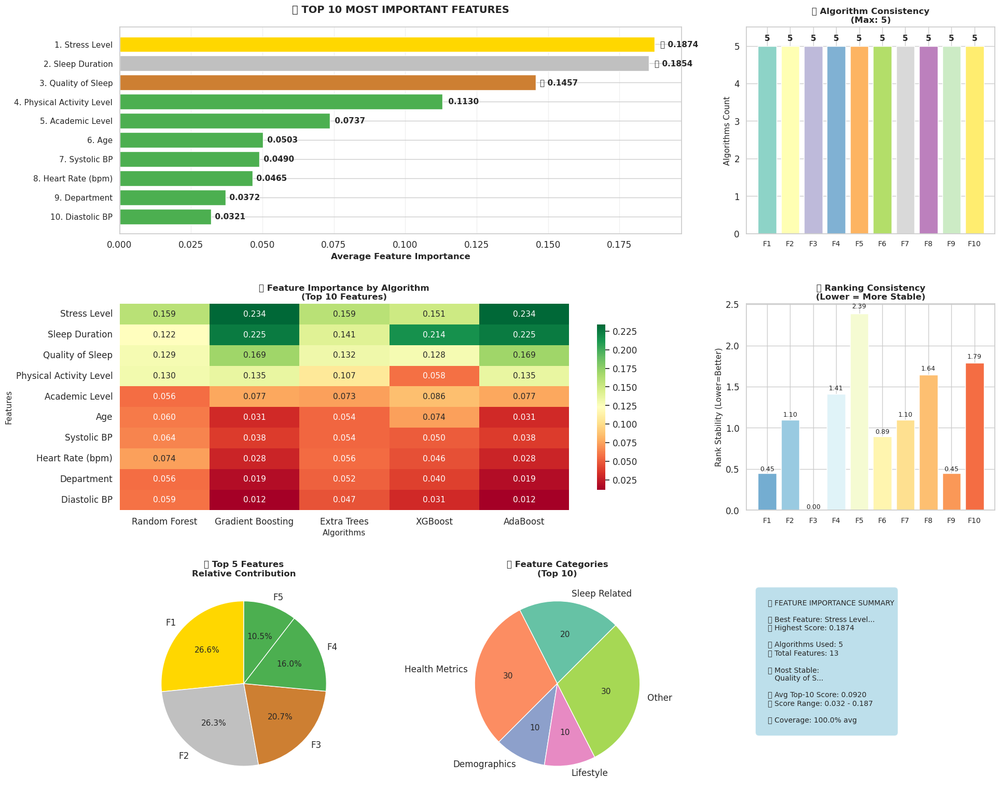

✅ Feature importance visualization completed!


In [59]:
# 📊 VISUALIZE TOP 10 FEATURE IMPORTANCE

if len(feature_importance_dict) > 0 and 'top_10_importance_data' in locals():
    
    print("🎨 CREATING FEATURE IMPORTANCE VISUALIZATIONS")
    print("=" * 55)
    
    # Create comprehensive visualization
    fig = plt.figure(figsize=(20, 16))
    
    # Color scheme
    colors = plt.cm.Set3(np.linspace(0, 1, 10))
    medal_colors = ['#FFD700', '#C0C0C0', '#CD7F32'] + ['#4CAF50'] * 7  # Gold, Silver, Bronze, Green
    
    # 1. Main Bar Chart - Top 10 Features
    ax1 = plt.subplot(3, 3, (1, 2))
    features = top_10_importance_data['features']
    scores = top_10_importance_data['importance_scores']
    
    bars = ax1.barh(range(len(features)), scores, color=medal_colors)
    ax1.set_yticks(range(len(features)))
    ax1.set_yticklabels([f"{i+1}. {feat}" for i, feat in enumerate(features)], fontsize=11)
    ax1.set_xlabel('Average Feature Importance', fontsize=12, fontweight='bold')
    ax1.set_title('🏆 TOP 10 MOST IMPORTANT FEATURES', fontsize=14, fontweight='bold', pad=20)
    ax1.grid(axis='x', alpha=0.3)
    ax1.invert_yaxis()
    
    # Add value labels on bars
    for i, (bar, score) in enumerate(zip(bars, scores)):
        width = bar.get_width()
        medal = "🥇" if i == 0 else "🥈" if i == 1 else "🥉" if i == 2 else ""
        ax1.text(width + width*0.01, bar.get_y() + bar.get_height()/2, 
                f'{medal} {score:.4f}', ha='left', va='center', fontweight='bold')
    
    # 2. Algorithm Consistency Chart
    ax2 = plt.subplot(3, 3, 3)
    algorithm_counts = top_10_importance_data['algorithms_count']
    total_algos = len(feature_importance_dict)
    
    bars2 = ax2.bar(range(len(features)), algorithm_counts, color=colors[:len(features)])
    ax2.set_xticks(range(len(features)))
    ax2.set_xticklabels([f"F{i+1}" for i in range(len(features))], fontsize=10)
    ax2.set_ylabel('Algorithms Count', fontsize=11)
    ax2.set_title(f'🔧 Algorithm Consistency\n(Max: {total_algos})', fontsize=12, fontweight='bold')
    ax2.set_ylim(0, total_algos + 0.5)
    
    # Add value labels
    for bar, count in zip(bars2, algorithm_counts):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2, height + 0.1, 
                f'{int(count)}', ha='center', va='bottom', fontweight='bold')
    
    # 3. Feature Importance Heatmap (Individual Algorithms)
    ax3 = plt.subplot(3, 3, (4, 5))
    
    heatmap_data = top_10_importance_data['individual_scores'].fillna(0)
    
    # Create heatmap
    sns.heatmap(heatmap_data.iloc[:10], annot=True, fmt='.3f', cmap='RdYlGn', 
                ax=ax3, cbar_kws={'shrink': 0.8})
    ax3.set_title('🌡️ Feature Importance by Algorithm\n(Top 10 Features)', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Features', fontsize=11)
    ax3.set_xlabel('Algorithms', fontsize=11)
    
    # 4. Rank Stability Analysis  
    ax4 = plt.subplot(3, 3, 6)
    stability_scores = top_10_importance_data['stability']
    
    bars4 = ax4.bar(range(len(features)), stability_scores, color=plt.cm.RdYlBu_r(np.linspace(0.2, 0.8, len(features))))
    ax4.set_xticks(range(len(features)))
    ax4.set_xticklabels([f"F{i+1}" for i in range(len(features))], fontsize=10)
    ax4.set_ylabel('Rank Stability (Lower=Better)', fontsize=11)
    ax4.set_title('📊 Ranking Consistency\n(Lower = More Stable)', fontsize=12, fontweight='bold')
    
    # Add value labels
    for bar, stability in zip(bars4, stability_scores):
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2, height + height*0.02, 
                f'{stability:.2f}', ha='center', va='bottom', fontsize=9)
    
    # 5. Pie Chart - Top 5 Features Contribution
    ax5 = plt.subplot(3, 3, 7)
    top_5_scores = scores[:5]
    top_5_names = features[:5]
    
    # Normalize for pie chart
    total_top_5 = sum(top_5_scores)
    pie_percentages = [score/total_top_5 * 100 for score in top_5_scores]
    
    wedges, texts, autotexts = ax5.pie(pie_percentages, labels=[f"F{i+1}" for i in range(5)], 
                                      autopct='%1.1f%%', startangle=90, colors=medal_colors[:5])
    ax5.set_title('🥧 Top 5 Features\nRelative Contribution', fontsize=12, fontweight='bold')
    
    # 6. Feature Categories Analysis (if applicable)
    ax6 = plt.subplot(3, 3, 8)
    
    # Analyze feature categories based on names
    categories = {
        'Sleep Related': [f for f in features if any(word in f.lower() for word in ['sleep', 'duration', 'quality'])],
        'Health Metrics': [f for f in features if any(word in f.lower() for word in ['pressure', 'rate', 'steps', 'heart', 'stress', 'physical'])],
        'Demographics': [f for f in features if any(word in f.lower() for word in ['age', 'gender', 'occupation', 'bmi'])],
        'Lifestyle': [f for f in features if any(word in f.lower() for word in ['activity', 'exercise', 'daily'])]
    }
    
    # Count features in each category
    category_counts = {cat: len(feats) for cat, feats in categories.items() if len(feats) > 0}
    category_counts['Other'] = len(features) - sum(category_counts.values())
    
    if category_counts['Other'] == 0:
        del category_counts['Other']
    
    # Create category pie chart
    if category_counts:
        wedges2, texts2, autotexts2 = ax6.pie(category_counts.values(), labels=category_counts.keys(), 
                                             autopct='%1.0f', startangle=45, colors=plt.cm.Set2.colors)
        ax6.set_title('📋 Feature Categories\n(Top 10)', fontsize=12, fontweight='bold')
    else:
        ax6.text(0.5, 0.5, 'Category Analysis\nNot Available', ha='center', va='center', 
                transform=ax6.transAxes, fontsize=11)
        ax6.set_title('📋 Feature Categories', fontsize=12)
    
    # 7. Summary Statistics Box
    ax7 = plt.subplot(3, 3, 9)
    ax7.axis('off')
    
    # Create summary text
    summary_text = f"""
    📊 FEATURE IMPORTANCE SUMMARY
    
    🥇 Best Feature: {features[0][:15]}...
    📈 Highest Score: {scores[0]:.4f}
    
    🔧 Algorithms Used: {len(feature_importance_dict)}
    📋 Total Features: {len(importance_stats)}
    
    💪 Most Stable: 
       {importance_stats.loc[importance_stats['Rank_Stability'].idxmin()].name[:12]}...
    
    🎯 Avg Top-10 Score: {np.mean(scores):.4f}
    📊 Score Range: {min(scores):.3f} - {max(scores):.3f}
    
    ✨ Coverage: {np.mean(algorithm_counts)/total_algos*100:.1f}% avg
    """
    
    ax7.text(0.05, 0.95, summary_text, transform=ax7.transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    
    plt.tight_layout(pad=3.0)
    plt.show()
    
    print("✅ Feature importance visualization completed!")
    
else:
    print("❌ Cannot create visualizations - no feature importance data available")

In [60]:
# 📋 DETAILED FEATURE IMPORTANCE REPORT

if len(feature_importance_dict) > 0 and 'importance_stats' in locals():
    
    print("📄 GENERATING COMPREHENSIVE FEATURE IMPORTANCE REPORT")
    print("=" * 65)
    
    # Create detailed report
    print("\n🏆 COMPLETE TOP 10 FEATURE RANKING")
    print("=" * 50)
    
    # Display detailed table
    report_df = importance_stats.head(10).copy()
    report_df.columns = ['Mean', 'Median', 'Max', 'Std', 'Algos', 'Stability', 'Rank']
    
    print(f"{'Rank':<4} {'Feature':<20} {'Mean':<8} {'Median':<8} {'Max':<8} {'Algos':<6} {'Stability':<8}")
    print("-" * 70)
    
    for i, (feature, stats) in enumerate(report_df.iterrows(), 1):
        medal = "🥇" if i == 1 else "🥈" if i == 2 else "🥉" if i == 3 else f"{i:2}"
        feature_short = feature[:18] + ".." if len(feature) > 20 else feature
        
        print(f"{medal:<4} {feature_short:<20} "
              f"{stats['Mean']:<8.4f} {stats['Median']:<8.4f} {stats['Max']:<8.4f} "
              f"{int(stats['Algos']):<6} {stats['Stability']:<8.2f}")
    
    # Feature insights
    print("\n🔍 KEY INSIGHTS")
    print("-" * 30)
    
    # Most consistent feature
    most_stable = importance_stats.loc[importance_stats['Rank_Stability'].idxmin()]
    most_stable_name = most_stable.name
    
    # Highest scoring feature
    highest_feature = importance_stats.iloc[0]
    highest_name = highest_feature.name
    
    # Most variable feature  
    most_variable = importance_stats.loc[importance_stats['Std_Importance'].idxmax()]
    most_variable_name = most_variable.name
    
    print(f"🎯 Most Important: {highest_name}")
    print(f"   └─ Score: {highest_feature['Mean_Importance']:.4f} (±{highest_feature['Std_Importance']:.4f})")
    print(f"   └─ Used by: {int(highest_feature['Count_Algorithms'])}/{len(feature_importance_dict)} algorithms")
    
    print(f"\n🔧 Most Consistent: {most_stable_name}")
    print(f"   └─ Stability: {most_stable['Rank_Stability']:.3f} (lower is better)")
    print(f"   └─ Score: {most_stable['Mean_Importance']:.4f}")
    
    print(f"\n📊 Most Variable: {most_variable_name}")
    print(f"   └─ Std Dev: ±{most_variable['Std_Importance']:.4f}")
    print(f"   └─ Score Range: {most_variable['Mean_Importance']:.4f} ± {most_variable['Std_Importance']:.4f}")
    
    # Algorithm coverage analysis
    print(f"\n🔬 ALGORITHM COVERAGE ANALYSIS")
    print("-" * 35)
    
    coverage_stats = importance_stats['Count_Algorithms'].describe()
    print(f"📈 Average Coverage: {coverage_stats['mean']:.1f}/{len(feature_importance_dict)} algorithms")
    print(f"🎯 Best Coverage: {int(coverage_stats['max'])}/{len(feature_importance_dict)} algorithms")
    print(f"⚠️ Worst Coverage: {int(coverage_stats['min'])}/{len(feature_importance_dict)} algorithms")
    
    # Features with full coverage
    full_coverage = importance_stats[importance_stats['Count_Algorithms'] == len(feature_importance_dict)]
    if len(full_coverage) > 0:
        print(f"\n✅ Features in ALL algorithms ({len(full_coverage)}):")
        for idx, feature in enumerate(full_coverage.index[:5], 1):
            print(f"   {idx}. {feature}")
        if len(full_coverage) > 5:
            print(f"   ... and {len(full_coverage) - 5} more")
    
    # Create comparison table with original dataset
    print(f"\n📊 FEATURE IMPORTANCE vs DATASET STATISTICS")
    print("-" * 50)
    
    try:
        # Get basic stats from original dataset
        feature_stats = X[report_df.index].describe()
        
        comparison_df = pd.DataFrame({
            'Feature': report_df.index,
            'Importance_Rank': range(1, len(report_df) + 1),
            'Importance_Score': report_df['Mean'].round(4),
            'Data_Mean': [feature_stats.loc['mean', f] for f in report_df.index],
            'Data_Std': [feature_stats.loc['std', f] for f in report_df.index],
            'Algorithm_Count': report_df['Algos'].astype(int)
        })
        
        print(comparison_df.to_string(index=False, float_format='%.4f'))
        
    except Exception as e:
        print(f"⚠️ Could not create comparison table: {e}")
    
    # Export summary for use
    feature_importance_summary = {
        'top_10_features': report_df.index.tolist(),
        'importance_scores': report_df['Mean'].tolist(),
        'most_important': highest_name,
        'most_stable': most_stable_name,
        'algorithm_count': len(feature_importance_dict),
        'algorithms_used': list(feature_importance_dict.keys())
    }
    
    print(f"\n✅ Feature importance analysis completed!")
    print(f"📊 Summary exported to 'feature_importance_summary' variable")
    print(f"🎯 Ready for model interpretation and feature selection!")

else:
    print("❌ No feature importance data available for detailed report")

📄 GENERATING COMPREHENSIVE FEATURE IMPORTANCE REPORT

🏆 COMPLETE TOP 10 FEATURE RANKING
Rank Feature              Mean     Median   Max      Algos  Stability
----------------------------------------------------------------------
🥇    Stress Level         0.1874   0.1593   0.2340   5      0.45    
🥈    Sleep Duration       0.1854   0.2141   0.2250   5      1.10    
🥉    Quality of Sleep     0.1457   0.1324   0.1694   5      0.00    
 4   Physical Activity .. 0.1130   0.1301   0.1354   5      1.41    
 5   Academic Level       0.0737   0.0767   0.0856   5      2.39    
 6   Age                  0.0503   0.0543   0.0738   5      0.89    
 7   Systolic BP          0.0490   0.0504   0.0643   5      1.10    
 8   Heart Rate (bpm)     0.0465   0.0461   0.0741   5      1.64    
 9   Department           0.0372   0.0402   0.0562   5      0.45    
10   Diastolic BP         0.0321   0.0310   0.0585   5      1.79    

🔍 KEY INSIGHTS
------------------------------
🎯 Most Important: Stress Level
   